In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from tqdm import tqdm  # For tracking loops during processing

In [226]:
# Replace with the path to your file in Google Drive, including the file extension
file_path = "D:\Study\Gait\capture_data copy.csv"

<>:2: SyntaxWarning: invalid escape sequence '\S'
<>:2: SyntaxWarning: invalid escape sequence '\S'
C:\Users\samiu\AppData\Local\Temp\ipykernel_27112\4112975088.py:2: SyntaxWarning: invalid escape sequence '\S'
  file_path = "D:\Study\Gait\capture_data copy.csv"


In [227]:
# Load the dataset
data = pd.read_csv(file_path)

In [228]:
data.head()

,id,cid,counter,tData,tData_2,tData_3,tData_4,pData,pData_2,pData_3,pData_4,created_at,updated_at
0,401,7,1693736755286,28,29,27,27,35,24,0,214,2023-09-03 12:25:55,2023-09-03 12:25:55
1,402,7,1693736755653,28,28,28,27,35,22,157,3,2023-09-03 12:25:56,2023-09-03 12:25:56
2,403,7,1693736755964,29,28,28,27,198,21,11,0,2023-09-03 12:25:56,2023-09-03 12:25:56
3,404,7,1693736756333,29,28,28,26,114,134,0,0,2023-09-03 12:25:56,2023-09-03 12:25:56
4,405,7,1693736756681,29,29,28,26,36,157,0,43,2023-09-03 12:25:57,2023-09-03 12:25:57


In [5]:
# Parse time columns for easier analysis
data['created_at'] = pd.to_datetime(data['created_at'])

In [6]:
# Group data by CID for patient-level analysis
patients_data = {cid: group for cid, group in data.groupby('cid')}

In [7]:
# Function to calculate rate of change
def calculate_rate_of_change(df, col):
    """
    Calculates the rate of change for a specific column in the data.
    Returns a new column with the rate.
    """
    df[f'{col}_rate'] = df[col].diff() / df['created_at'].diff().dt.total_seconds()
    return df

In [8]:
# Function to visualize temperature and pressure for a patient
def visualize_patient_data(patient_data, cid):
    """
    Visualize the patient's pressure and temperature data over time.
    Includes rate of change calculations and subplots for each region.
    """
    # Calculate rate of change for each column
    for col in ['tData', 'tData_2', 'tData_3', 'tData_4', 'pData', 'pData_2', 'pData_3', 'pData_4']:
        patient_data = calculate_rate_of_change(patient_data, col)

    # Plot pressure and temperature data
    fig, axes = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

    # Pressure data
    for col in ['pData', 'pData_2', 'pData_3', 'pData_4']:
        axes[0].plot(patient_data['created_at'], patient_data[col], label=col)
    axes[0].set_title(f'Pressure Data Over Time for Patient {cid}')
    axes[0].set_ylabel('Pressure')
    axes[0].legend()

    # Temperature data
    for col in ['tData', 'tData_2', 'tData_3', 'tData_4']:
        axes[1].plot(patient_data['created_at'], patient_data[col], label=col)
    axes[1].set_title(f'Temperature Data Over Time for Patient {cid}')
    axes[1].set_ylabel('Temperature')
    axes[1].legend()

    plt.xlabel('Time')
    plt.tight_layout()
    plt.show()

In [9]:
# Function to visualize rate of change for a patient

def visualize_rate_of_change(patient_data, cid):
    """
    Visualize rate of change for pressure and temperature data.
    """
    fig, axes = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

    # Pressure rate of change
    for col in ['pData_rate', 'pData_2_rate', 'pData_3_rate', 'pData_4_rate']:
        if col in patient_data.columns:
            axes[0].plot(patient_data['created_at'], patient_data[col], label=col)
    axes[0].set_title(f'Rate of Change: Pressure for Patient {cid}')
    axes[0].set_ylabel('Rate of Change (Pressure)')
    axes[0].legend()

    # Temperature rate of change
    for col in ['tData_rate', 'tData_2_rate', 'tData_3_rate', 'tData_4_rate']:
        if col in patient_data.columns:
            axes[1].plot(patient_data['created_at'], patient_data[col], label=col)
    axes[1].set_title(f'Rate of Change: Temperature for Patient {cid}')
    axes[1].set_ylabel('Rate of Change (Temperature)')
    axes[1].legend()

    plt.xlabel('Time')
    plt.tight_layout()
    plt.show()

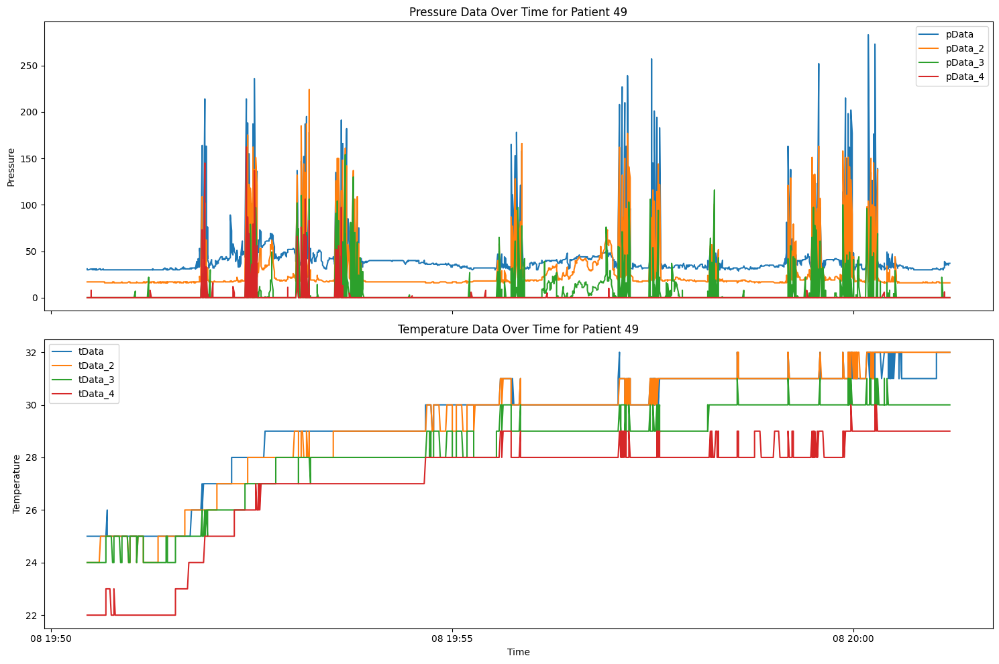

In [10]:
# Example: Visualize data for a specific patient
sample_cid = 49  # Replace with specific CID if needed
sample_patient_data = patients_data[sample_cid]
visualize_patient_data(sample_patient_data, sample_cid)


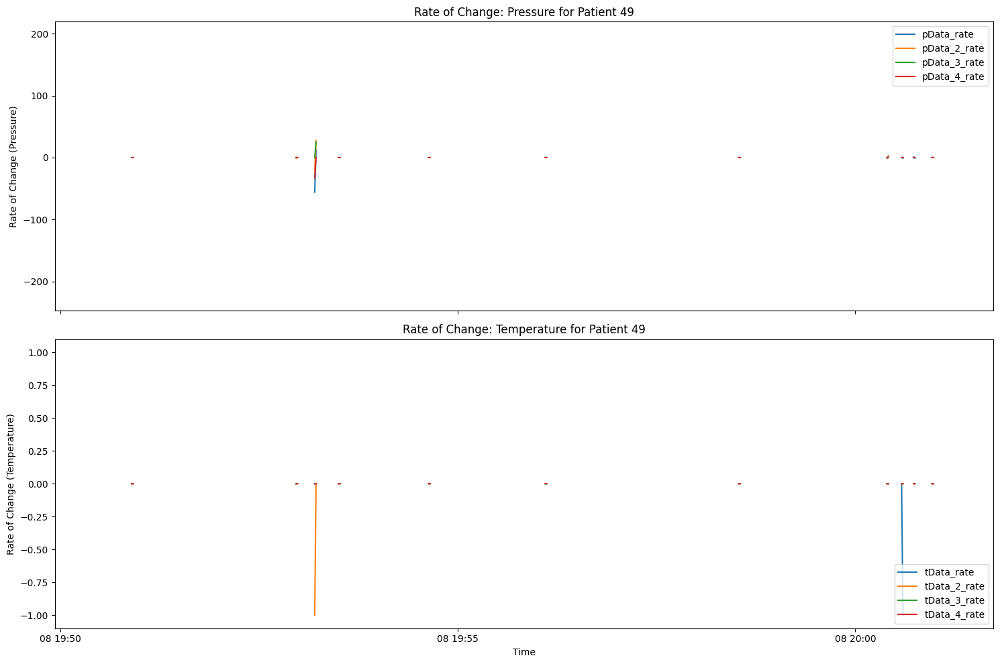

In [11]:
visualize_rate_of_change(sample_patient_data, sample_cid)


# Filtering for Best selection

In [12]:
# Preprocess patient data to handle missing or invalid values
def preprocess_patient_data(patient_data):
    """
    Cleans the patient data by handling NaN or infinite values.
    """
    # Replace infinite values with NaN
    patient_data = patient_data.replace([np.inf, -np.inf], np.nan)

    # Use the newer ffill() and bfill() methods directly
    patient_data = patient_data.ffill().bfill()
    return patient_data

In [13]:
# Modify the metrics calculation to include preprocessing
def calculate_patient_metrics(patient_data):
    """
    Calculates metrics (standard deviation, range, and rate variability) for a patient's data.
    Preprocesses the data to handle invalid values before calculation.
    """
    # Preprocess the data
    patient_data = preprocess_patient_data(patient_data)

    metrics = {}
    for col in ['tData', 'tData_2', 'tData_3', 'tData_4', 'pData', 'pData_2', 'pData_3', 'pData_4']:
        if col in patient_data.columns:
            metrics[f'{col}_std'] = patient_data[col].std()  # Standard deviation
            metrics[f'{col}_range'] = patient_data[col].max() - patient_data[col].min()  # Range

            # Rate of change variability
            rate_col = f'{col}_rate'
            patient_data = calculate_rate_of_change(patient_data, col)  # Add rate of change
            metrics[f'{rate_col}_std'] = patient_data[rate_col].std()

    return metrics

In [14]:
def filter_patients(patients_data, std_threshold=10, range_threshold=50, rate_threshold=2):
    """
    Filters patients based on variability thresholds for standard deviation, range, and rate of change.
    Returns a list of selected patients.
    """
    selected_patients = []
    patient_metrics = []

    for cid, patient_data in tqdm(patients_data.items()):
        metrics = calculate_patient_metrics(patient_data)
        patient_metrics.append((cid, metrics))

        # Selection criteria: Any column surpasses thresholds
        for key, value in metrics.items():
            if 'std' in key and value >= std_threshold:
                selected_patients.append(cid)
                break
            if 'range' in key and value >= range_threshold:
                selected_patients.append(cid)
                break
            if 'rate' in key and value >= rate_threshold:
                selected_patients.append(cid)
                break

    return list(set(selected_patients)), pd.DataFrame(patient_metrics)


In [15]:
# Apply filtering to the dataset
selected_cids, patient_metrics_df = filter_patients(patients_data)


  0%|          | 0/312 [00:00<?, ?it/s]C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\pandas\core\nanops.py:10

In [16]:
# Save the metrics for review
patient_metrics_df.to_csv('patient_metrics_new.csv', index=False)

In [17]:
# Display selected patient CIDs
print("Selected patients for further analysis:", selected_cids)

Selected patients for further analysis: [0, 7, 10, 13, 14, 17, 18, 19, 24, 25, 26, 27, 28, 29, 32, 33, 34, 35, 36, 37, 39, 40, 42, 43, 44, 47, 48, 49, 50, 67, 69, 75, 80, 81, 83, 84, 85, 96, 97, 99, 100, 101, 105, 106, 107, 109, 111, 113, 114, 116, 123, 125, 126, 132, 134, 136, 138, 140, 143, 144, 145, 148, 160, 179, 180, 196, 198, 226, 227, 237, 239, 240, 241, 242, 245, 246, 247, 250, 251, 252, 256, 259, 261, 262, 270, 279, 283, 293, 294, 295, 296, 298, 299, 300, 301, 302, 303, 310, 315, 318, 319, 325, 330, 331, 334, 336, 342, 346, 349, 350, 352, 364, 365, 381, 382, 385, 386, 387, 388]


# Overall Analysis for All patients

In [18]:
import scipy.stats as stats

In [19]:
# Preprocessing function
def preprocess_patient_data(patient_data):
    """
    Cleans the patient data by handling NaN or infinite values.
    """
    # Replace infinite values with NaN
    patient_data = patient_data.replace([np.inf, -np.inf], np.nan)

    # Use forward and backward filling
    patient_data = patient_data.ffill().bfill()
    return patient_data

In [20]:
# Function to calculate rate of change
def calculate_rate_of_change(patient_data, column):
    """
    Adds a new column for rate of change of a given column.
    """
    rate_col = f"{column}_rate"
    patient_data[rate_col] = patient_data[column].diff()  # First-order difference
    return patient_data


In [21]:
# Function to calculate patient metrics
def calculate_patient_metrics(patient_data):
    """
    Calculates metrics (standard deviation, range, and rate variability) for a patient's data.
    Preprocesses the data to handle invalid values before calculation.
    """
    patient_data = preprocess_patient_data(patient_data)

    metrics = {}
    for col in ['tData', 'tData_2', 'tData_3', 'tData_4', 'pData', 'pData_2', 'pData_3', 'pData_4']:
        if col in patient_data.columns:
            metrics[f'{col}_std'] = patient_data[col].std()  # Standard deviation
            metrics[f'{col}_range'] = patient_data[col].max() - patient_data[col].min()  # Range

            # Rate of change variability
            rate_col = f'{col}_rate'
            patient_data = calculate_rate_of_change(patient_data, col)  # Add rate of change
            metrics[f'{rate_col}_std'] = patient_data[rate_col].std()
    return metrics

In [22]:
# Function to filter patients based on metrics
def filter_patients(data, std_threshold=10, range_threshold=50, rate_threshold=2):
    """
    Filters patients based on variability thresholds for standard deviation, range, and rate of change.
    Returns a list of selected patients.
    """
    selected_patients = []
    patient_metrics = []

    # Split data by patient ID
    patients_data = {cid: data[data['cid'] == cid] for cid in data['cid'].unique()}

    for cid, patient_data in tqdm(patients_data.items()):
        metrics = calculate_patient_metrics(patient_data)
        patient_metrics.append((cid, metrics))

        # Selection criteria: Any column surpasses thresholds
        for key, value in metrics.items():
            if 'std' in key and value >= std_threshold:
                selected_patients.append(cid)
                break
            if 'range' in key and value >= range_threshold:
                selected_patients.append(cid)
                break
            if 'rate' in key and value >= rate_threshold:
                selected_patients.append(cid)
                break

    # Return unique selected CIDs and metrics as a DataFrame
    return list(set(selected_patients)), pd.DataFrame(patient_metrics)

# Apply filtering
selected_cids, patient_metrics_df = filter_patients(data)

100%|██████████| 312/312 [00:00<00:00, 558.72it/s]


In [23]:
# Save metrics for review
patient_metrics_df.to_csv("D:\Study\Gait\cleaned_capture_data.csv", index=False)
print("Selected patients for further analysis:", selected_cids)

Selected patients for further analysis: [np.int64(0), np.int64(7), np.int64(10), np.int64(13), np.int64(14), np.int64(17), np.int64(18), np.int64(19), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(40), np.int64(41), np.int64(42), np.int64(43), np.int64(44), np.int64(47), np.int64(48), np.int64(49), np.int64(50), np.int64(67), np.int64(69), np.int64(75), np.int64(80), np.int64(81), np.int64(83), np.int64(84), np.int64(85), np.int64(96), np.int64(97), np.int64(99), np.int64(100), np.int64(101), np.int64(105), np.int64(106), np.int64(107), np.int64(109), np.int64(111), np.int64(112), np.int64(113), np.int64(114), np.int64(116), np.int64(122), np.int64(123), np.int64(125), np.int64(126), np.int64(129), np.int64(131), np.int64(132), np.int64(134), np.int64(136), np.int64(137), np.int64(138), np.int64(139), np.int64(140), np.int64(143)

<>:2: SyntaxWarning: invalid escape sequence '\S'
<>:2: SyntaxWarning: invalid escape sequence '\S'
C:\Users\samiu\AppData\Local\Temp\ipykernel_27112\3570195006.py:2: SyntaxWarning: invalid escape sequence '\S'
  patient_metrics_df.to_csv("D:\Study\Gait\cleaned_capture_data.csv", index=False)


# Pressure Trends

In [24]:
# Visualization for selected patients
def plot_patient_data_pressue(patient_id, data):
    """
    Plots pressure and temperature trends for a specific patient.
    """
    patient_data = data[data['cid'] == patient_id]
    regions = ['pData', 'pData_2', 'pData_3', 'pData_4']

    plt.figure(figsize=(12, 8))
    for region in regions:
        if region in patient_data.columns:
            plt.plot(patient_data['created_at'], patient_data[region], label=region)

    plt.title(f"Patient {patient_id} - Pressure Trends")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend(loc="upper left")
    plt.show()

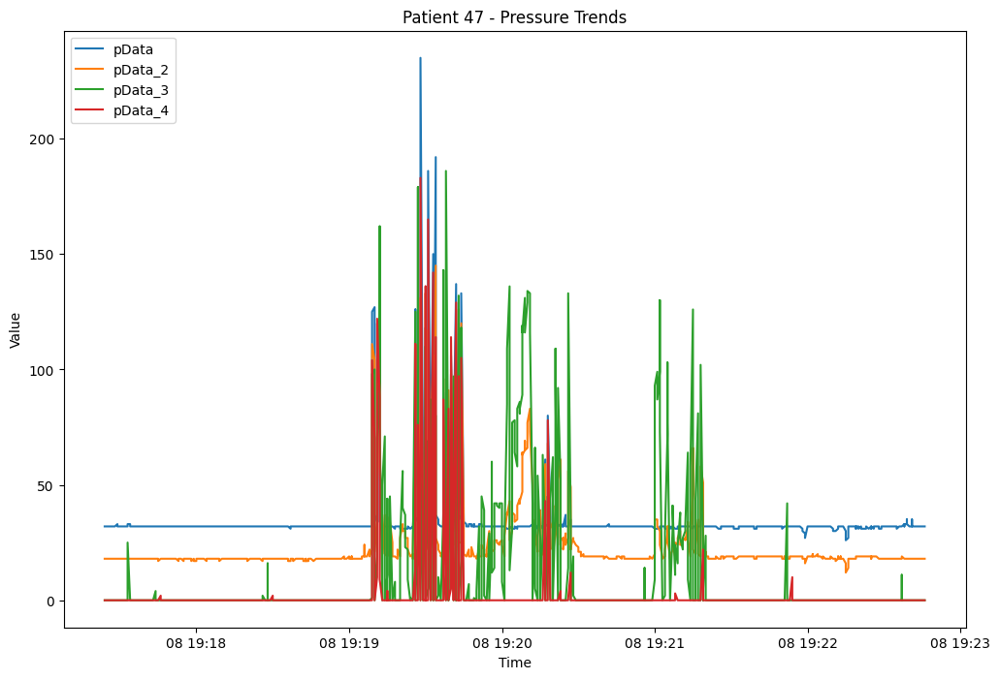

In [25]:
# Generate plots for selected patients
plot_patient_data_pressue(47, data)

# Temperature Trends

In [26]:
# Visualization for selected patients
def plot_patient_data_temperature(patient_id, data):
    """
    Plots pressure and temperature trends for a specific patient.
    """
    patient_data = data[data['cid'] == patient_id]
    regions = ['tData', 'tData_2', 'tData_3', 'tData_4']

    plt.figure(figsize=(12, 8))
    for region in regions:
        if region in patient_data.columns:
            plt.plot(patient_data['created_at'], patient_data[region], label=region)

    plt.title(f"Patient {patient_id} - Temperature Trends")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend(loc="upper left")
    plt.show()

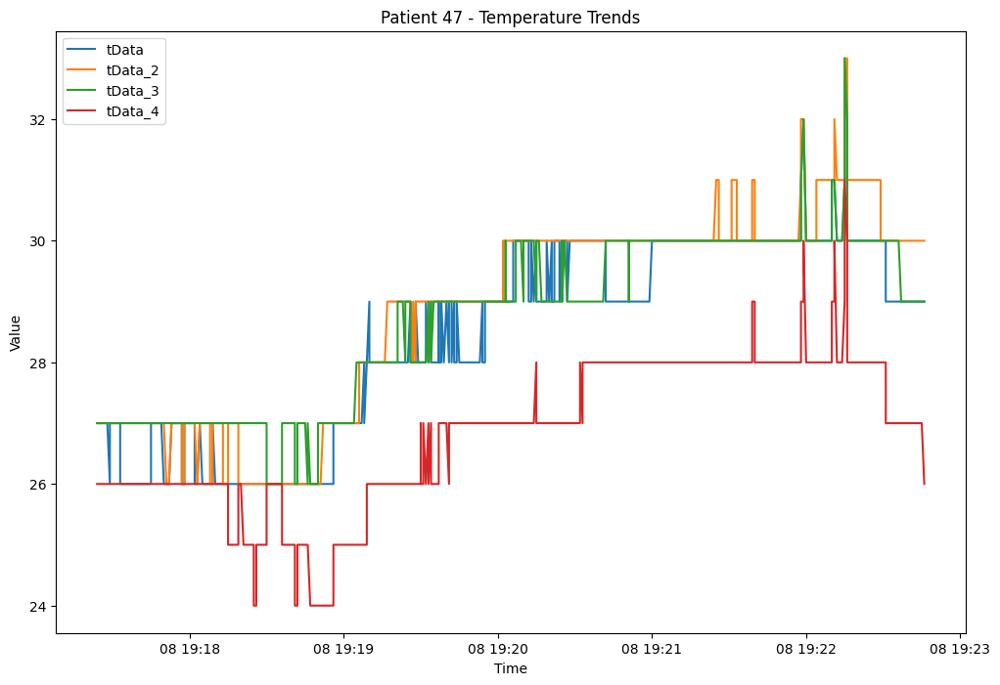

In [27]:
# Generate plots for selected patients

plot_patient_data_temperature(47, data)

# Both Trends

In [28]:
# Visualization for selected patients
def plot_patient_data_all(patient_id, data):
    """
    Plots pressure and temperature trends for a specific patient.
    """
    patient_data = data[data['cid'] == patient_id]
    regions = ['tData', 'tData_2', 'tData_3', 'tData_4',
               'pData', 'pData_2', 'pData_3', 'pData_4']

    plt.figure(figsize=(12, 8))
    for region in regions:
        if region in patient_data.columns:
            plt.plot(patient_data['created_at'], patient_data[region], label=region)

    plt.title(f"Patient {patient_id} - Pressure & Temperature Trends")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend(loc="upper left")
    plt.show()

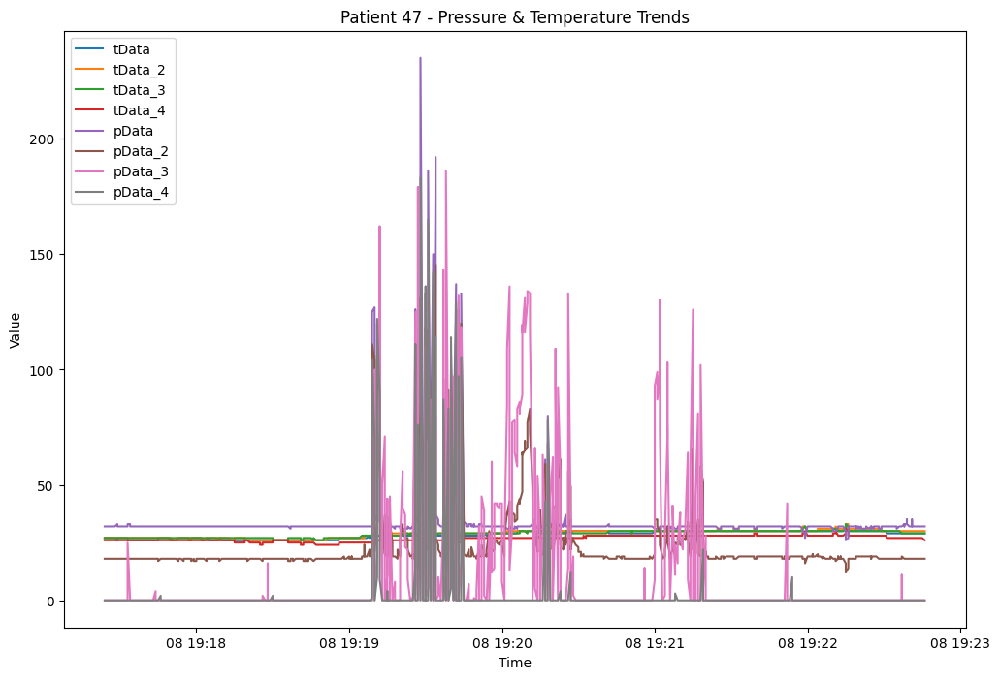

In [29]:
# Generate plots for selected patients

plot_patient_data_all(47, data)

# Statistical Analysis - Skip

In [30]:
# Statistical Analysis
def analyze_patient_data(patient_id, data):
    """
    Performs statistical analysis (correlation, trend analysis) on the patient's data.
    """
    patient_data = data[data['cid'] == patient_id]
    regions = ['tData', 'tData_2', 'tData_3', 'tData_4',
               'pData', 'pData_2', 'pData_3', 'pData_4']

    print(f"Statistical Analysis for Patient {patient_id}")
    for region in regions:
        if region in patient_data.columns:
            print(f"--- {region} ---")
            print("Mean:", patient_data[region].mean())
            print("Std Dev:", patient_data[region].std())
            print("Trend (Spearman Correlation):", stats.spearmanr(patient_data.index, patient_data[region])[0])
    print("\n")

In [31]:
# Perform statistical analysis for selected patients

analyze_patient_data(47, data)

Statistical Analysis for Patient 47
--- tData ---
Mean: 28.400876232201533
Std Dev: 1.614517233739525
Trend (Spearman Correlation): 0.8609606961124457
--- tData_2 ---
Mean: 28.826944140197153
Std Dev: 1.6677596769552905
Trend (Spearman Correlation): 0.9013347951113561
--- tData_3 ---
Mean: 28.676889375684556
Std Dev: 1.3667745862237444
Trend (Spearman Correlation): 0.8845712584517492
--- tData_4 ---
Mean: 26.799561883899234
Std Dev: 1.2150011843694861
Trend (Spearman Correlation): 0.8200565413507164
--- pData ---
Mean: 34.32201533406353
Std Dev: 14.822684706182192
Trend (Spearman Correlation): -0.18697654257762453
--- pData_2 ---
Mean: 23.676889375684556
Std Dev: 15.982298403021742
Trend (Spearman Correlation): 0.22670284825763048
--- pData_3 ---
Mean: 11.446878422782037
Std Dev: 28.824173456361933
Trend (Spearman Correlation): 0.016025437428973548
--- pData_4 ---
Mean: 2.7426067907995617
Std Dev: 16.661507291200714
Trend (Spearman Correlation): -0.0578823238845646




# **Further** **Analysis** - Skip
* Correlation analysis
* Trend analysis
* Peak detection


In [32]:
# Import necessary libraries
import scipy.stats as stats
from scipy.signal import find_peaks
import matplotlib.pyplot as plt

In [33]:
# Function for Correlation Analysis
def correlation_analysis(patient_id, data):
    """
    Performs correlation analysis between regions for a specific patient.
    """
    patient_data = data[data['cid'] == patient_id]
    regions = ['tData', 'tData_2', 'tData_3', 'tData_4',
               'pData', 'pData_2', 'pData_3', 'pData_4']

    print(f"Correlation Analysis for Patient {patient_id}:")
    correlation_matrix = patient_data[regions].corr(method='pearson')  # Pearson correlation
    print(correlation_matrix)
    plt.figure(figsize=(8, 6))
    plt.title(f"Correlation Matrix - Patient {patient_id}")
    plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest')
    plt.colorbar(label='Correlation Coefficient')
    plt.xticks(range(len(regions)), regions, rotation=45)
    plt.yticks(range(len(regions)), regions)
    plt.show()

## Correlation Analysis

Correlation Analysis for Patient 49:
            tData   tData_2   tData_3   tData_4     pData   pData_2   pData_3  \
tData    1.000000  0.979190  0.973862  0.970176  0.098525  0.122654  0.114684   
tData_2  0.979190  1.000000  0.974286  0.954146  0.068938  0.105719  0.107901   
tData_3  0.973862  0.974286  1.000000  0.954866  0.089973  0.126798  0.122951   
tData_4  0.970176  0.954146  0.954866  1.000000  0.116550  0.139491  0.125151   
pData    0.098525  0.068938  0.089973  0.116550  1.000000  0.855128  0.479400   
pData_2  0.122654  0.105719  0.126798  0.139491  0.855128  1.000000  0.802626   
pData_3  0.114684  0.107901  0.122951  0.125151  0.479400  0.802626  1.000000   
pData_4 -0.067615 -0.081705 -0.068399 -0.050343  0.525522  0.452838  0.223524   

          pData_4  
tData   -0.067615  
tData_2 -0.081705  
tData_3 -0.068399  
tData_4 -0.050343  
pData    0.525522  
pData_2  0.452838  
pData_3  0.223524  
pData_4  1.000000  


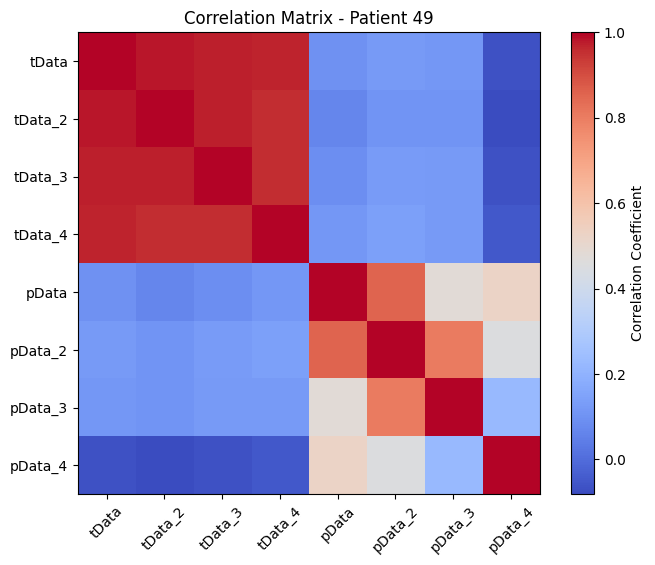

In [34]:
# Perform Correlation Analysis for Selected Patients
correlation_analysis(49, data)

## Trend analysis


In [35]:
# Function for Trend Analysis
def trend_analysis(patient_id, data):
    """
    Identifies increasing or decreasing trends over time for a specific patient.
    """
    patient_data = data[data['cid'] == patient_id]
    regions = ['tData', 'tData_2', 'tData_3', 'tData_4',
               'pData', 'pData_2', 'pData_3', 'pData_4']

    print(f"Trend Analysis for Patient {patient_id}:")
    for region in regions:
        if region in patient_data.columns:
            # Perform Spearman correlation with time index
            trend_corr, p_value = stats.spearmanr(patient_data.index, patient_data[region])
            trend_type = "increasing" if trend_corr > 0 else "decreasing"
            print(f"{region}: {trend_type} trend (Correlation = {trend_corr:.2f}, p = {p_value:.3e})")


In [36]:
# Perform Trend Analysis for Selected Patients
trend_analysis(49, data)


Trend Analysis for Patient 49:
tData: increasing trend (Correlation = 0.96, p = 0.000e+00)
tData_2: increasing trend (Correlation = 0.97, p = 0.000e+00)
tData_3: increasing trend (Correlation = 0.95, p = 0.000e+00)
tData_4: increasing trend (Correlation = 0.92, p = 0.000e+00)
pData: increasing trend (Correlation = 0.01, p = 6.602e-01)
pData_2: increasing trend (Correlation = 0.14, p = 7.166e-10)
pData_3: increasing trend (Correlation = 0.11, p = 1.009e-06)
pData_4: decreasing trend (Correlation = -0.13, p = 1.329e-08)


## Peak Analysis

### For All Patients

In [37]:
# Function for Peak Detection
def peak_detection(patient_id, data):
    """
    Identifies sudden spikes or drops in the patient's data using scipy's find_peaks.
    """
    patient_data = data[data['cid'] == patient_id]
    regions = ['tData', 'tData_2', 'tData_3', 'tData_4',
               'pData', 'pData_2', 'pData_3', 'pData_4']

    print(f"Peak Detection for Patient {patient_id}:")
    for region in regions:
        if region in patient_data.columns:
            # Find peaks
            peaks, _ = find_peaks(patient_data[region], height=0.5)  # Modify height as needed
            if len(peaks) > 0:
                print(f"{region}: Found {len(peaks)} peaks")
                plt.figure(figsize=(10, 6))
                plt.plot(patient_data['created_at'], patient_data[region], label=region)
                plt.scatter(patient_data.iloc[peaks]['created_at'], patient_data.iloc[peaks][region], color='red', label='Peaks')
                plt.title(f"Peaks in {region} - Patient {patient_id}")
                plt.xlabel("Time")
                plt.ylabel("Value")
                plt.legend()
                plt.show()

Peak Detection for Patient 49:
tData: Found 33 peaks


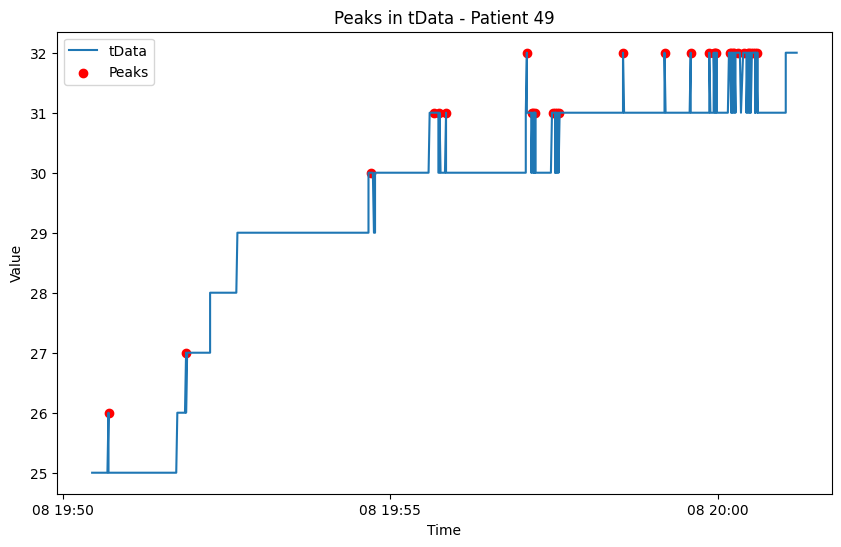

tData_2: Found 36 peaks


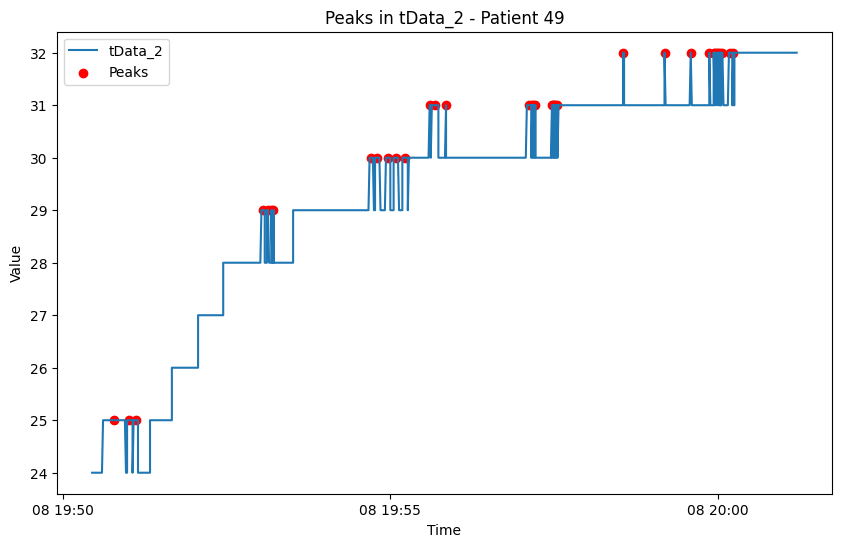

tData_3: Found 43 peaks


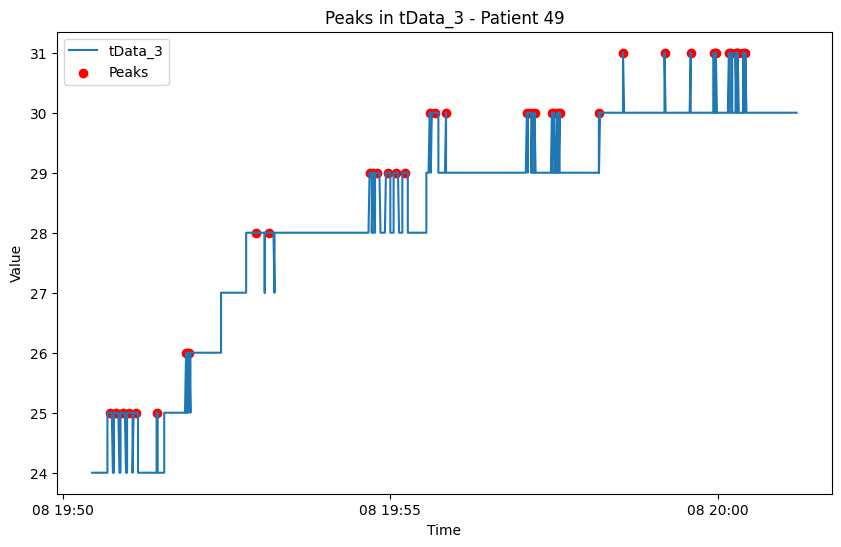

tData_4: Found 35 peaks


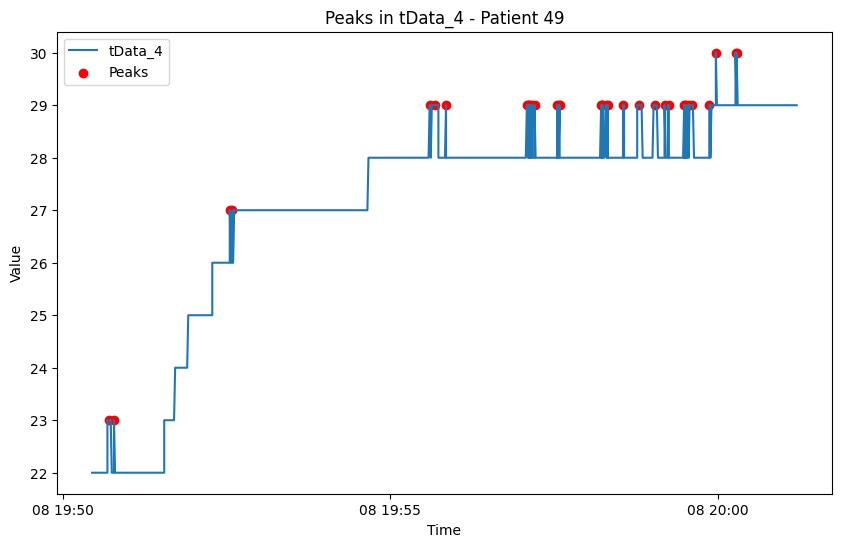

pData: Found 258 peaks


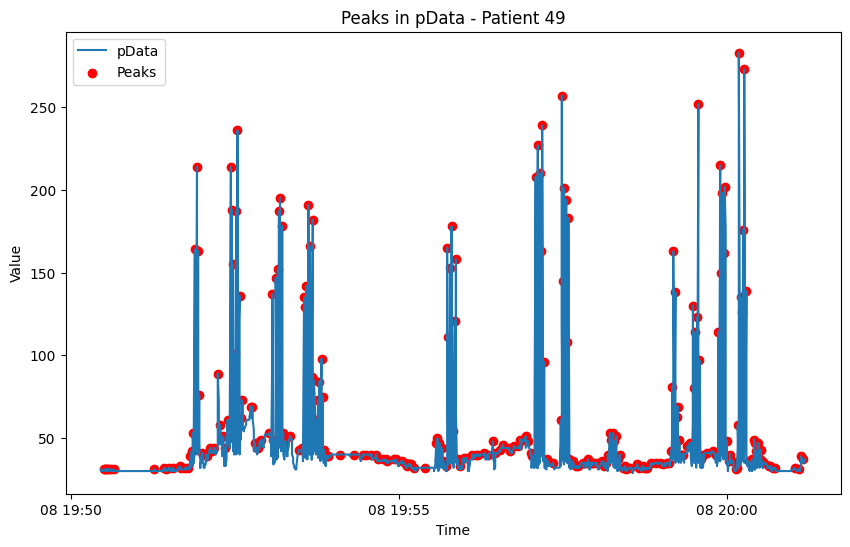

pData_2: Found 218 peaks


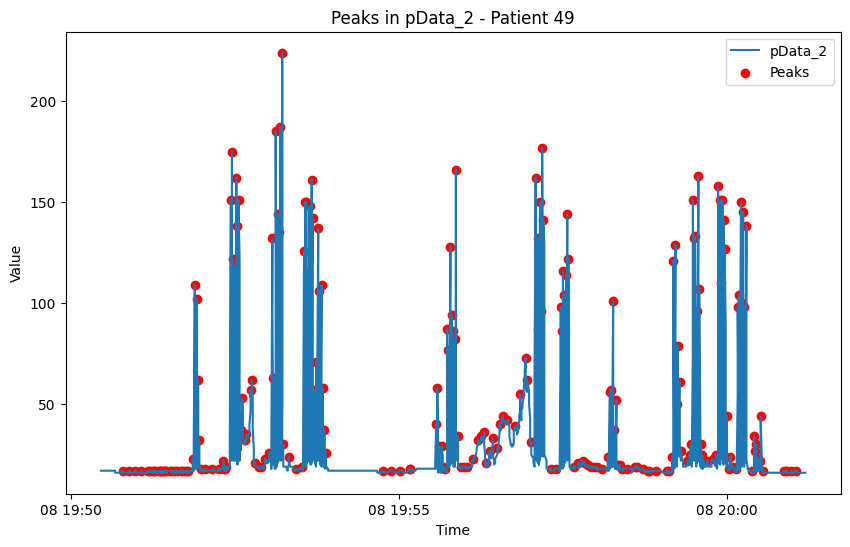

pData_3: Found 150 peaks


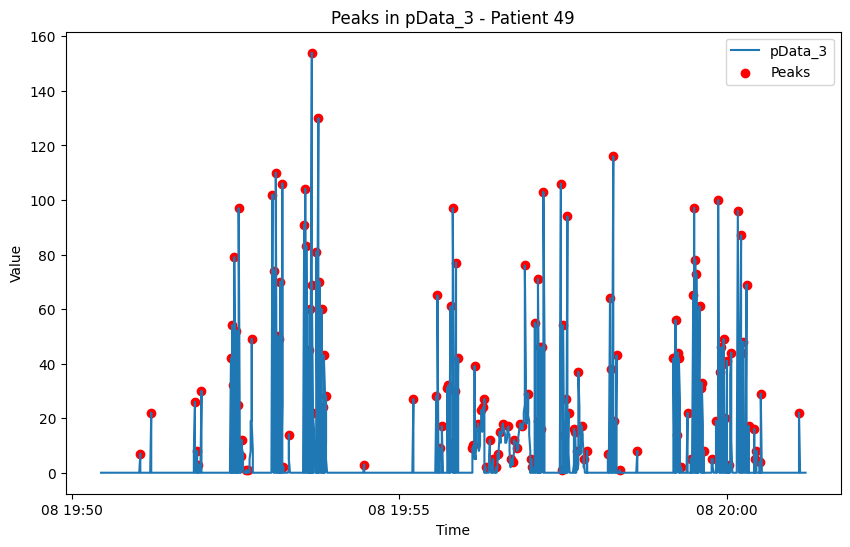

pData_4: Found 36 peaks


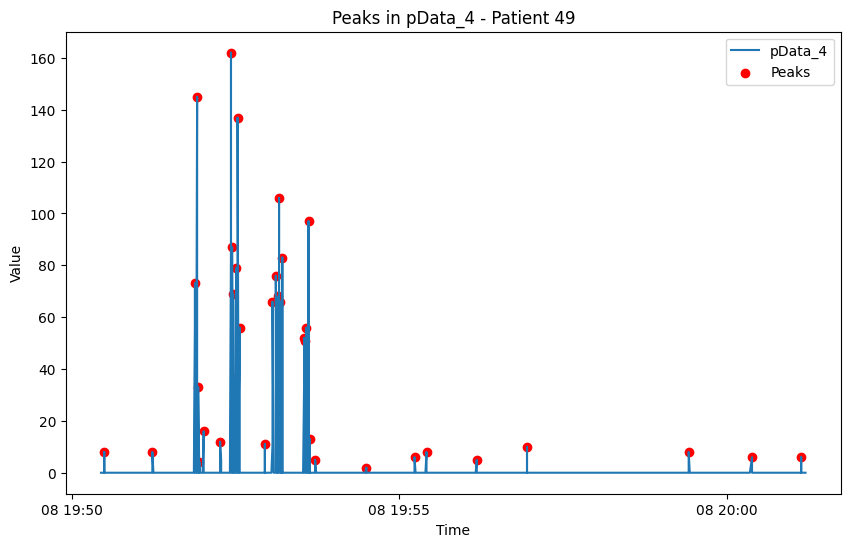

In [38]:
# Perform Peak Detection for Selected Patients
peak_detection(49, data)

### Selected Patients

In [39]:
# Refine Filtering Logic
def refine_filtering(data, selected_cids):
    """
    Refines filtering by focusing on patients showing increasing/decreasing trends or peak activity.
    """
    refined_cids = []
    for cid in selected_cids:
        patient_data = data[data['cid'] == cid]
        regions = ['tData', 'tData_2', 'tData_3', 'tData_4',
                   'pData', 'pData_2', 'pData_3', 'pData_4']

        for region in regions:
            if region in patient_data.columns:
                # Detect significant trends
                trend_corr, _ = stats.spearmanr(patient_data.index, patient_data[region])
                if abs(trend_corr) > 0.5:  # Strong trend correlation
                    refined_cids.append(cid)
                    break

                # Detect significant peaks
                peaks, _ = find_peaks(patient_data[region], height=0.5)
                if len(peaks) > 5:  # Modify threshold as needed
                    refined_cids.append(cid)
                    break

    return list(set(refined_cids))


In [40]:
# Apply refined filtering
refined_cids = refine_filtering(data, selected_cids)
print("Patients selected for further analysis after refinement:", refined_cids)


Patients selected for further analysis after refinement: [np.int64(0), np.int64(7), np.int64(10), np.int64(13), np.int64(14), np.int64(17), np.int64(18), np.int64(19), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(40), np.int64(41), np.int64(42), np.int64(43), np.int64(47), np.int64(48), np.int64(49), np.int64(50), np.int64(67), np.int64(69), np.int64(75), np.int64(80), np.int64(81), np.int64(83), np.int64(84), np.int64(85), np.int64(96), np.int64(97), np.int64(99), np.int64(100), np.int64(101), np.int64(105), np.int64(106), np.int64(107), np.int64(109), np.int64(111), np.int64(113), np.int64(114), np.int64(116), np.int64(122), np.int64(123), np.int64(125), np.int64(126), np.int64(131), np.int64(132), np.int64(134), np.int64(136), np.int64(137), np.int64(138), np.int64(139), np.int64(140), np.int64(143), np.int64(144), np.int64(145), np.int64(

C:\Users\samiu\AppData\Local\Temp\ipykernel_27112\3504702444.py:15: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  trend_corr, _ = stats.spearmanr(patient_data.index, patient_data[region])


## Time Series

In [41]:
# Time Series Analysis to Understand Gait Cycle
def gait_cycle_analysis(patient_id, data):
    """
    Analyzes the gait cycle for the patient using time series of foot pressure data.
    """
    patient_data = data[data['cid'] == patient_id]
    foot_regions = ['pData', 'pData_2', 'pData_3', 'pData_4']

    plt.figure(figsize=(12, 8))
    for region in foot_regions:
        if region in patient_data.columns:
            plt.plot(patient_data['created_at'], patient_data[region], label=region)

    plt.title(f"Gait Cycle Analysis - Patient {patient_id}")
    plt.xlabel("Time")
    plt.ylabel("Pressure")
    plt.legend(loc="upper right")
    plt.show()

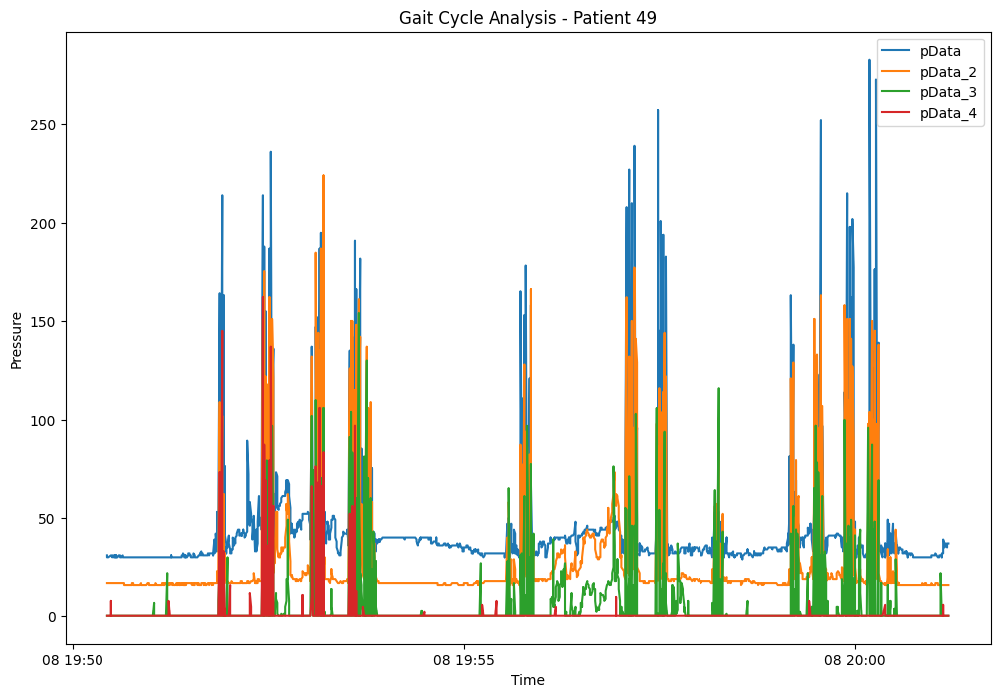

In [42]:
# Perform Gait Cycle Analysis for Refined Patients
gait_cycle_analysis(49, data)

# Step Segmentation

In [43]:
# Step Segmentation and Metric Computation
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

In [44]:
# Function to segment steps from pressure data
def segment_steps(patient_data, region, height_threshold=0.5):
    """
    Segments steps from a specific pressure data region using peak detection.
    Returns segmented steps and their indices.
    """
    data = patient_data[region]
    peaks, _ = find_peaks(data, height=height_threshold)

    # Identify step start and end points (simple approach)
    step_segments = []
    for i in range(1, len(peaks)):
        start = peaks[i - 1]
        end = peaks[i]
        step_segments.append((start, end))

    return step_segments

In [45]:
# Function to calculate metrics for a single step
def calculate_step_metrics(patient_data, region, start, end):
    """
    Calculates metrics for a single step.
    """
    step_data = patient_data[region][start:end]
    peak_pressure = step_data.max()
    auc = np.trapezoid(step_data)  # Area under the curve
    gradient_rise = (step_data.iloc[-1] - step_data.iloc[0]) / (end - start)

    return {
        'peak_pressure': peak_pressure,
        'auc': auc,
        'gradient_rise': gradient_rise
    }


In [46]:
# Process all patients to segment steps and compute metrics
def process_patient_steps(patient_data, regions, height_threshold=0.5):
    """
    Segments steps and calculates metrics for all pressure regions of a patient.
    Returns a dictionary of metrics per region.
    """
    step_metrics = {}
    for region in regions:
        if region in patient_data.columns:
            segments = segment_steps(patient_data, region, height_threshold)
            region_metrics = []
            for start, end in segments:
                metrics = calculate_step_metrics(patient_data, region, start, end)
                region_metrics.append(metrics)
            step_metrics[region] = region_metrics
    return step_metrics


In [47]:
# Filtering patients based on step count
def filter_patients_by_step_count(patients_data, regions, min_steps=40):
    """
    Filters patients based on the minimum number of steps in any region.
    Returns a list of patient IDs that meet the criteria.
    """
    selected_patients = []
    for cid, patient_data in patients_data.items():
        step_counts = []
        for region in regions:
            if region in patient_data.columns:
                segments = segment_steps(patient_data, region)
                step_counts.append(len(segments))
        if any(count >= min_steps for count in step_counts):
            selected_patients.append(cid)
    return selected_patients


In [48]:
# Intra-patient variability analysis
def analyze_intra_patient_variability(patient_metrics):
    """
    Computes variability metrics for steps within a single patient.
    """
    variability = {}
    for region, steps in patient_metrics.items():
        peak_pressures = [step['peak_pressure'] for step in steps]
        aucs = [step['auc'] for step in steps]
        variability[region] = {
            'peak_pressure_std': np.std(peak_pressures),
            'auc_std': np.std(aucs)
        }
    return variability

In [49]:
# Inter-patient baseline analysis
def compute_baseline_metrics(all_patient_metrics):
    """
    Aggregates step metrics across patients to establish baseline values.
    """
    baselines = {}
    for region in all_patient_metrics[0].keys():
        all_peak_pressures = []
        all_aucs = []
        for patient_metrics in all_patient_metrics:
            for step in patient_metrics[region]:
                all_peak_pressures.append(step['peak_pressure'])
                all_aucs.append(step['auc'])
        baselines[region] = {
            'avg_peak_pressure': np.mean(all_peak_pressures),
            'avg_auc': np.mean(all_aucs)
        }
    return baselines

In [50]:
# Integration with existing pipeline
regions = ['pData', 'pData_2', 'pData_3', 'pData_4']
all_patient_metrics = []

In [51]:
for cid, patient_data in tqdm(patients_data.items()):
    metrics = process_patient_steps(patient_data, regions)
    all_patient_metrics.append(metrics)

100%|██████████| 312/312 [00:00<00:00, 727.08it/s]


# Filtering for 25 steps

In [52]:
# Filter patients with sufficient steps
filtered_patients = filter_patients_by_step_count(patients_data, regions)
print("Filtered Patients:", filtered_patients)


Filtered Patients: [41, 43, 47, 48, 49, 60, 62, 64, 65, 67, 68, 69, 80, 81, 82, 83, 85, 96, 99, 100, 101, 105, 106, 107, 108, 110, 113, 114, 116, 131, 152, 179, 180, 198, 200, 204, 227, 234, 240, 241, 295, 296, 350]


In [53]:
# Compute inter-patient baseline
baseline_metrics = compute_baseline_metrics(all_patient_metrics)
print("Baseline Metrics:", baseline_metrics)

Baseline Metrics: {'pData': {'avg_peak_pressure': np.float64(59.69461216906642), 'avg_auc': np.float64(535.1787041337668)}, 'pData_2': {'avg_peak_pressure': np.float64(58.49804822043628), 'avg_auc': np.float64(385.9621125143513)}, 'pData_3': {'avg_peak_pressure': np.float64(63.029985549132945), 'avg_auc': np.float64(257.0343208092485)}, 'pData_4': {'avg_peak_pressure': np.float64(86.96335078534031), 'avg_auc': np.float64(549.3702998572109)}}


In [54]:
# Visualize step metrics for a sample patient
sample_patient = patients_data[filtered_patients[0]]
sample_metrics = process_patient_steps(sample_patient, regions)
print("Sample Patient Metrics:", sample_metrics)

Sample Patient Metrics: {'pData': [{'peak_pressure': np.int64(42), 'auc': np.float64(545.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(42), 'auc': np.float64(293.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(42), 'auc': np.float64(249.5), 'gradient_rise': np.float64(-0.14285714285714285)}, {'peak_pressure': np.int64(42), 'auc': np.float64(83.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(42), 'auc': np.float64(414.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(42), 'auc': np.float64(335.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(42), 'auc': np.float64(292.5), 'gradient_rise': np.float64(-0.125)}, {'peak_pressure': np.int64(42), 'auc': np.float64(419.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(42), 'auc': np.float64(500.5), 'gradient_rise': np.float64(-0.07692307692307693)}, {'peak_pressure': np.int64(42), 'auc': np.float64(164.5), 'gradient_rise': np.float64(-0.2)}

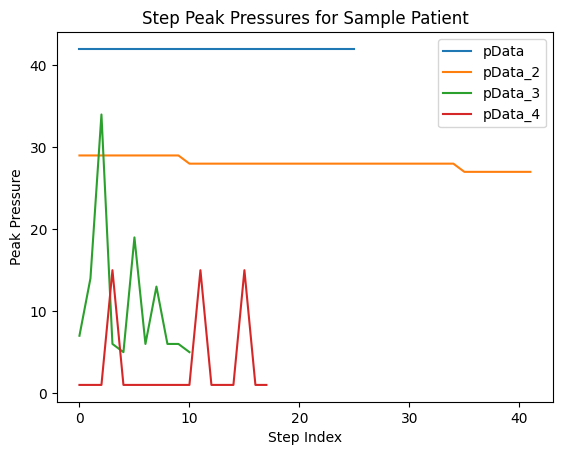

In [55]:

for region, metrics in sample_metrics.items():
    peak_pressures = [step['peak_pressure'] for step in metrics]
    plt.plot(peak_pressures, label=region)

plt.title("Step Peak Pressures for Sample Patient")
plt.xlabel("Step Index")
plt.ylabel("Peak Pressure")
plt.legend()
plt.show()

# Step Pressure for Selected Patients

In [56]:
def visualize_patient_metrics(patient_id, patients_data, regions):
    """
    Visualizes step metrics and periodicity for a specific patient.
    """
    patient_data = patients_data[patient_id]
    metrics = process_patient_steps(patient_data, regions)
    periodicity = {
        region: analyze_step_periodicity(patient_data, region) for region in regions if region in patient_data.columns
    }

    print(f"Metrics for Patient {patient_id}:", metrics)
    print(f"Periodicity for Patient {patient_id}:", periodicity)

    # Plot step peak pressures
    for region, step_metrics in metrics.items():
        peak_pressures = [step['peak_pressure'] for step in step_metrics]
        plt.plot(peak_pressures, label=f"{region} Peak Pressures")

    plt.title(f"Step Metrics for Patient {patient_id}")
    plt.xlabel("Step Index")
    plt.ylabel("Peak Pressure")
    plt.legend()
    plt.show()

In [57]:
# Function to analyze periodicity of steps
def analyze_step_periodicity(patient_data, region, height_threshold=0.5):
    """
    Calculates the periodicity between steps for a specific region.
    """
    data = patient_data[region]
    peaks, _ = find_peaks(data, height=height_threshold)
    periodicity = np.diff(peaks)  # Time intervals between peaks
    avg_periodicity = np.mean(periodicity)
    return {
        'periodicity_intervals': periodicity,
        'avg_periodicity': avg_periodicity
    }

In [58]:
# Function to analyze correlation between pressure and temperature
def analyze_pressure_temperature_correlation(patient_data):
    """
    Analyzes the correlation between pressure peaks and temperature data.
    """
    results = {}
    for p_region, t_region in zip(['pData', 'pData_2', 'pData_3', 'pData_4'],
                                   ['tData', 'tData_2', 'tData_3', 'tData_4']):
        if p_region in patient_data.columns and t_region in patient_data.columns:
            correlation = np.corrcoef(patient_data[p_region], patient_data[t_region])[0, 1]
            results[f'{p_region}-{t_region}_correlation'] = correlation
    return results


In [59]:
# Integration with existing pipeline
regions = ['pData', 'pData_2', 'pData_3', 'pData_4']
all_patient_metrics = []

for cid, patient_data in tqdm(patients_data.items()):
    metrics = process_patient_steps(patient_data, regions)
    periodicity_analysis = {
        region: analyze_step_periodicity(patient_data, region) for region in regions if region in patient_data.columns
    }
    pressure_temp_correlation = analyze_pressure_temperature_correlation(patient_data)
    all_patient_metrics.append({
        'metrics': metrics,
        'periodicity': periodicity_analysis,
        'correlation': pressure_temp_correlation
    })

  0%|          | 0/312 [00:00<?, ?it/s]C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\lib\_function_base_impl.py:2923: Runtim

In [60]:
# Integration with existing pipeline
regions = ['pData', 'pData_2', 'pData_3', 'pData_4']
all_patient_metrics = []

for cid, patient_data in tqdm(patients_data.items()):
    metrics = process_patient_steps(patient_data, regions)
    periodicity_analysis = {
        region: analyze_step_periodicity(patient_data, region) for region in regions if region in patient_data.columns
    }
    pressure_temp_correlation = analyze_pressure_temperature_correlation(patient_data)
    all_patient_metrics.append({
        'metrics': metrics,
        'periodicity': periodicity_analysis,
        'correlation': pressure_temp_correlation
    })

# Filter patients with sufficient steps
filtered_patients = filter_patients_by_step_count(patients_data, regions)
print("Filtered Patients:", filtered_patients)

# Compute inter-patient baseline
baseline_metrics = compute_baseline_metrics([patient['metrics'] for patient in all_patient_metrics])
print("Baseline Metrics:", baseline_metrics)

100%|██████████| 312/312 [00:00<00:00, 624.19it/s]

Filtered Patients: [41, 43, 47, 48, 49, 60, 62, 64, 65, 67, 68, 69, 80, 81, 82, 83, 85, 96, 99, 100, 101, 105, 106, 107, 108, 110, 113, 114, 116, 131, 152, 179, 180, 198, 200, 204, 227, 234, 240, 241, 295, 296, 350]
Baseline Metrics: {'pData': {'avg_peak_pressure': np.float64(59.69461216906642), 'avg_auc': np.float64(535.1787041337668)}, 'pData_2': {'avg_peak_pressure': np.float64(58.49804822043628), 'avg_auc': np.float64(385.9621125143513)}, 'pData_3': {'avg_peak_pressure': np.float64(63.029985549132945), 'avg_auc': np.float64(257.0343208092485)}, 'pData_4': {'avg_peak_pressure': np.float64(86.96335078534031), 'avg_auc': np.float64(549.3702998572109)}}


Metrics for Patient 49: {'pData': [{'peak_pressure': np.int64(31), 'auc': np.float64(123.5), 'gradient_rise': np.float64(-0.2)}, {'peak_pressure': np.int64(31), 'auc': np.float64(91.5), 'gradient_rise': np.float64(-0.25)}, {'peak_pressure': np.int64(31), 'auc': np.float64(30.5), 'gradient_rise': np.float64(-0.5)}, {'peak_pressure': np.int64(31), 'auc': np.float64(60.5), 'gradient_rise': np.float64(-0.3333333333333333)}, {'peak_pressure': np.int64(31), 'auc': np.float64(151.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(31), 'auc': np.float64(181.5), 'gradient_rise': np.float64(-0.14285714285714285)}, {'peak_pressure': np.int64(31), 'auc': np.float64(3150.5), 'gradient_rise': np.float64(-0.009433962264150943)}, {'peak_pressure': np.int64(31), 'auc': np.float64(752.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(32), 'auc': np.float64(122.0), 'gradient_rise': np.float64(-0.4)}, {'peak_pressure': np.int64(31), 'auc': np.float64(151.0), 'gradient_rise':

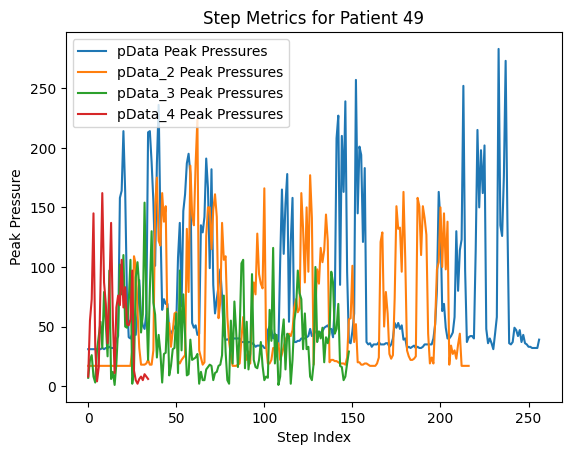

In [61]:
# Visualize metrics for a specific patient
specific_patient_id = filtered_patients[4]  # Replace with desired patient ID
visualize_patient_metrics(specific_patient_id, patients_data, regions)

Metrics for Patient 47: {'pData': [{'peak_pressure': np.int64(33), 'auc': np.float64(449.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(125), 'auc': np.float64(8730.0), 'gradient_rise': np.float64(0.3382352941176471)}, {'peak_pressure': np.int64(127), 'auc': np.float64(211.5), 'gradient_rise': np.float64(-23.25)}, {'peak_pressure': np.int64(120), 'auc': np.float64(793.0), 'gradient_rise': np.float64(-4.0)}, {'peak_pressure': np.int64(32), 'auc': np.float64(344.5), 'gradient_rise': np.float64(-0.08333333333333333)}, {'peak_pressure': np.int64(32), 'auc': np.float64(93.5), 'gradient_rise': np.float64(-0.25)}, {'peak_pressure': np.int64(51), 'auc': np.float64(104.5), 'gradient_rise': np.float64(4.75)}, {'peak_pressure': np.int64(126), 'auc': np.float64(150.5), 'gradient_rise': np.float64(-22.75)}, {'peak_pressure': np.int64(63), 'auc': np.float64(83.5), 'gradient_rise': np.float64(-9.666666666666666)}, {'peak_pressure': np.int64(235), 'auc': np.float64(222.0), 'gradient

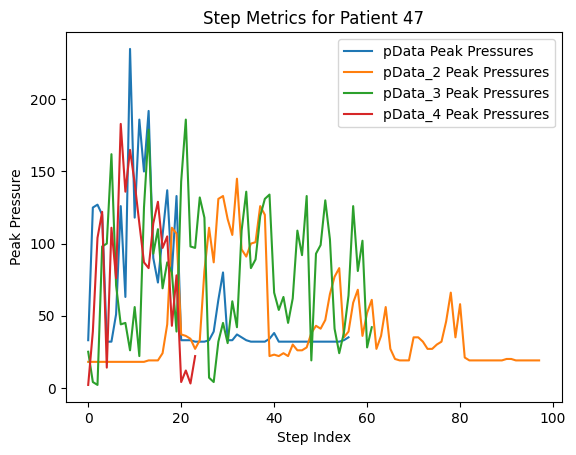

In [62]:
# Visualize metrics for a specific patient
specific_patient_id = filtered_patients[2]  # Replace with desired patient ID
visualize_patient_metrics(specific_patient_id, patients_data, regions)

Metrics for Patient 227: {'pData': [{'peak_pressure': np.int64(54), 'auc': np.float64(1347.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(54), 'auc': np.float64(1133.5), 'gradient_rise': np.float64(-0.045454545454545456)}, {'peak_pressure': np.int64(54), 'auc': np.float64(107.5), 'gradient_rise': np.float64(-0.3333333333333333)}, {'peak_pressure': np.int64(54), 'auc': np.float64(266.5), 'gradient_rise': np.float64(-0.16666666666666666)}, {'peak_pressure': np.int64(54), 'auc': np.float64(160.5), 'gradient_rise': np.float64(-0.25)}, {'peak_pressure': np.int64(54), 'auc': np.float64(107.0), 'gradient_rise': np.float64(0.0)}, {'peak_pressure': np.int64(54), 'auc': np.float64(107.5), 'gradient_rise': np.float64(-0.3333333333333333)}, {'peak_pressure': np.int64(54), 'auc': np.float64(160.5), 'gradient_rise': np.float64(-0.25)}, {'peak_pressure': np.int64(54), 'auc': np.float64(107.5), 'gradient_rise': np.float64(-0.3333333333333333)}, {'peak_pressure': np.int64(54), 'auc':

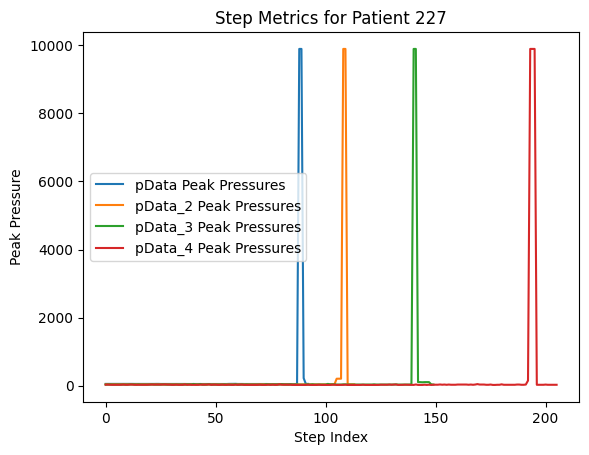

In [63]:
# Visualize metrics for a specific patient
specific_patient_id = filtered_patients[36]  # Replace with desired patient ID
visualize_patient_metrics(specific_patient_id, patients_data, regions)

# Extract matrics for all Pdata Regions

In [64]:
# Filter patients with sufficient steps
filtered_patients_25_steps = filter_patients_by_step_count(patients_data, regions, min_steps=25)

# Extract data for filtered patients
filtered_data = data[data['cid'].isin(filtered_patients_25_steps)]

# Save the filtered data to a CSV file
filtered_data.to_csv('filtered_patients_25_steps.csv', index=False)
print("Filtered patients with minimum 25 steps saved to 'filtered_patients_25_steps.csv'")

Filtered patients with minimum 25 steps saved to 'filtered_patients_25_steps.csv'


In [65]:
input_file = 'filtered_patients_25_steps.csv'
# Load the filtered data
filtered_data = pd.read_csv(input_file)

# Extract unique cids
unique_cids = filtered_data['cid'].unique()

# Print the unique cids
print("Unique cids from filtered patient CSV:", unique_cids)

Unique cids from filtered patient CSV: [ 38  40  41  43  47  48  49  60  62  64  65  67  68  69  75  80  81  82
  83  84  85  96  98  99 100 101 104 105 106 107 108 110 113 114 116 125
 126 131 133 152 155 165 170 176 179 180 187 191 192 196 198 200 204 209
 219 227 234 240 241 246 256 295 296 325 350 352 381]


In [66]:
import pandas as pd
import numpy as np

# Function to extract metrics for a given column
def extract_metrics(patient_data, column):
    metrics = {
        "peak_pressure": patient_data[column].max(),
        "auc": np.trapezoid(patient_data[column].dropna()),
        "rise_gradient": (patient_data[column].max() - patient_data[column].iloc[0]) /
                         (patient_data[column].idxmax() - patient_data[column].index[0])
                         if patient_data[column].idxmax() != patient_data[column].index[0] else np.nan,
        "descent_gradient": (patient_data[column].iloc[-1] - patient_data[column].max()) /
                            (patient_data[column].index[-1] - patient_data[column].idxmax())
                            if patient_data[column].idxmax() != patient_data[column].index[-1] else np.nan,
        "variance": patient_data[column].var(),
        "skewness": patient_data[column].skew(),
        "kurtosis": patient_data[column].kurtosis()
    }
    return metrics

# Function to process data for a specific column and save metrics to a CSV file
def process_and_save_metrics(data, column, output_csv):
    extracted_metrics = []

    # Group by patient ID
    grouped = data.groupby("cid")

    for patient_id, patient_data in grouped:
        patient_metrics = extract_metrics(patient_data, column)
        patient_metrics["cid"] = patient_id
        extracted_metrics.append(patient_metrics)

    # Create a DataFrame for extracted metrics
    metrics_df = pd.DataFrame(extracted_metrics)

    # Save to CSV
    metrics_df.to_csv(output_csv, index=False)
    print(f"Metrics for {column} saved to {output_csv}")

# Load filtered data
input_file = r'D:\Study\Gait\filtered_patients_25_steps.csv'
data = pd.read_csv(input_file)

# Process each pData column and save results
process_and_save_metrics(data, "pData", "metrics_pdata1.csv")
process_and_save_metrics(data, "pData_2", "metrics_pdata2.csv")
process_and_save_metrics(data, "pData_3", "metrics_pdata3.csv")
process_and_save_metrics(data, "pData_4", "metrics_pdata4.csv")

Metrics for pData saved to metrics_pdata1.csv
Metrics for pData_2 saved to metrics_pdata2.csv
Metrics for pData_3 saved to metrics_pdata3.csv
Metrics for pData_4 saved to metrics_pdata4.csv


In [67]:
print("Metrics extraction")

Metrics extraction


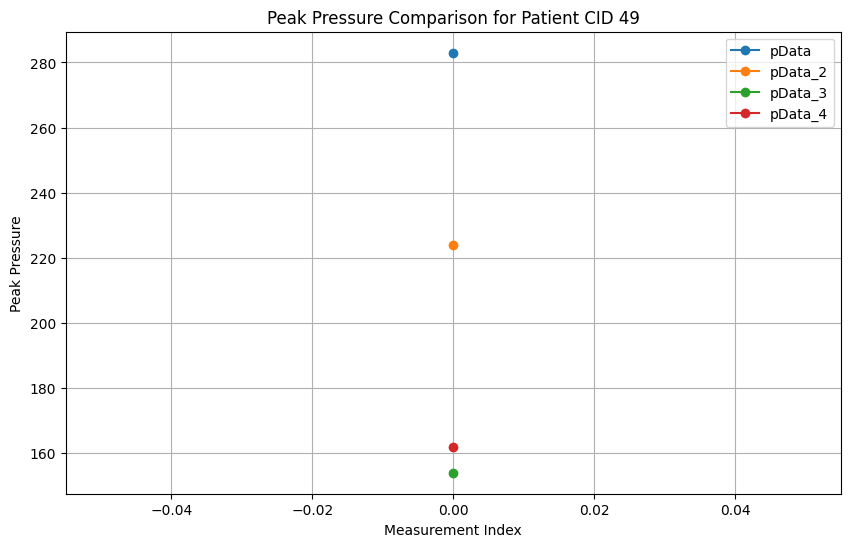

In [68]:
import matplotlib.pyplot as plt

# Load the metrics data from the CSV files
metrics_pdata1 = pd.read_csv("metrics_pdata1.csv")
metrics_pdata2 = pd.read_csv("metrics_pdata2.csv")
metrics_pdata3 = pd.read_csv("metrics_pdata3.csv")
metrics_pdata4 = pd.read_csv("metrics_pdata4.csv")

# Filter the data for the specific patient cid 49
metrics_pdata1_49 = metrics_pdata1[metrics_pdata1['cid'] == 49]
metrics_pdata2_49 = metrics_pdata2[metrics_pdata2['cid'] == 49]
metrics_pdata3_49 = metrics_pdata3[metrics_pdata3['cid'] == 49]
metrics_pdata4_49 = metrics_pdata4[metrics_pdata4['cid'] == 49]

# Extract the peak pressure values
peak_pressure_pdata1 = metrics_pdata1_49['peak_pressure'].values
peak_pressure_pdata2 = metrics_pdata2_49['peak_pressure'].values
peak_pressure_pdata3 = metrics_pdata3_49['peak_pressure'].values
peak_pressure_pdata4 = metrics_pdata4_49['peak_pressure'].values

# Plot the peak pressures
plt.figure(figsize=(10, 6))
plt.plot(peak_pressure_pdata1, label='pData', marker='o')
plt.plot(peak_pressure_pdata2, label='pData_2', marker='o')
plt.plot(peak_pressure_pdata3, label='pData_3', marker='o')
plt.plot(peak_pressure_pdata4, label='pData_4', marker='o')

plt.title('Peak Pressure Comparison for Patient CID 49')
plt.xlabel('Measurement Index')
plt.ylabel('Peak Pressure')
plt.legend()
plt.grid(True)
plt.show()





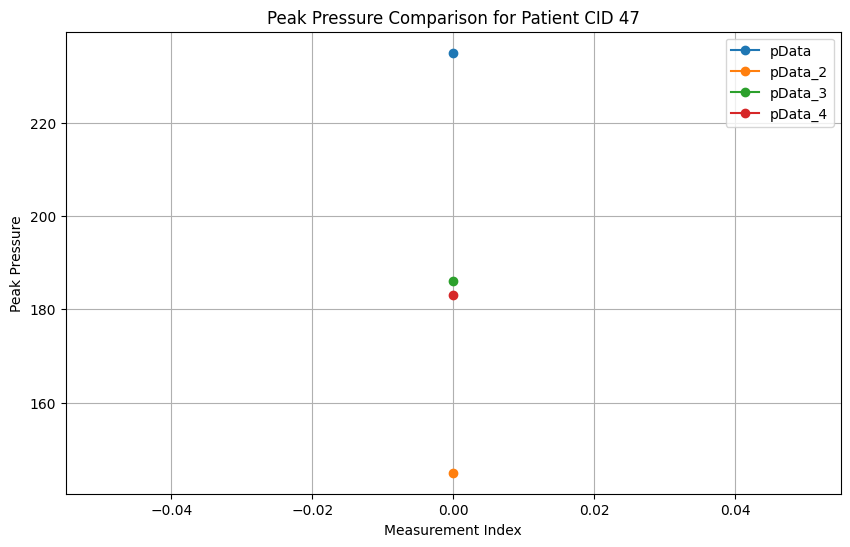

In [69]:
# Filter the data for the specific patient cid 47
metrics_pdata1_47 = metrics_pdata1[metrics_pdata1['cid'] == 47]
metrics_pdata2_47 = metrics_pdata2[metrics_pdata2['cid'] == 47]
metrics_pdata3_47 = metrics_pdata3[metrics_pdata3['cid'] == 47]
metrics_pdata4_47 = metrics_pdata4[metrics_pdata4['cid'] == 47]

# Extract the peak pressure values for cid 47
peak_pressure_pdata1_47 = metrics_pdata1_47['peak_pressure'].values
peak_pressure_pdata2_47 = metrics_pdata2_47['peak_pressure'].values
peak_pressure_pdata3_47 = metrics_pdata3_47['peak_pressure'].values
peak_pressure_pdata4_47 = metrics_pdata4_47['peak_pressure'].values

# Plot the peak pressures for cid 47
plt.figure(figsize=(10, 6))
plt.plot(peak_pressure_pdata1_47, label='pData', marker='o')
plt.plot(peak_pressure_pdata2_47, label='pData_2', marker='o')
plt.plot(peak_pressure_pdata3_47, label='pData_3', marker='o')
plt.plot(peak_pressure_pdata4_47, label='pData_4', marker='o')

plt.title('Peak Pressure Comparison for Patient CID 47')
plt.xlabel('Measurement Index')
plt.ylabel('Peak Pressure')
plt.legend()
plt.grid(True)
plt.show()



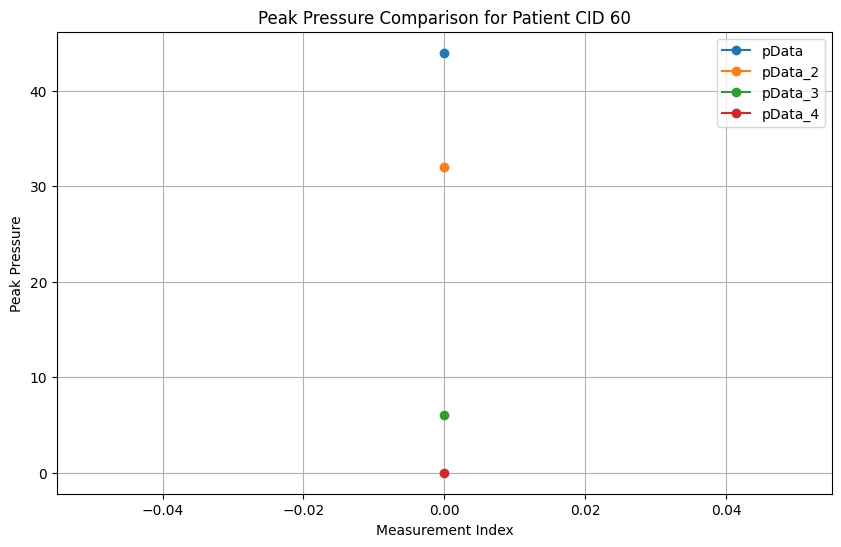

In [70]:
# Filter the data for the specific patient cid 60
metrics_pdata1_60 = metrics_pdata1[metrics_pdata1['cid'] == 60]
metrics_pdata2_60 = metrics_pdata2[metrics_pdata2['cid'] == 60]
metrics_pdata3_60 = metrics_pdata3[metrics_pdata3['cid'] == 60]
metrics_pdata4_60 = metrics_pdata4[metrics_pdata4['cid'] == 60]

# Extract the peak pressure values for cid 60
peak_pressure_pdata1_60 = metrics_pdata1_60['peak_pressure'].values
peak_pressure_pdata2_60 = metrics_pdata2_60['peak_pressure'].values
peak_pressure_pdata3_60 = metrics_pdata3_60['peak_pressure'].values
peak_pressure_pdata4_60 = metrics_pdata4_60['peak_pressure'].values

# Plot the peak pressures for cid 60
plt.figure(figsize=(10, 6))
plt.plot(peak_pressure_pdata1_60, label='pData', marker='o')
plt.plot(peak_pressure_pdata2_60, label='pData_2', marker='o')
plt.plot(peak_pressure_pdata3_60, label='pData_3', marker='o')
plt.plot(peak_pressure_pdata4_60, label='pData_4', marker='o')

plt.title('Peak Pressure Comparison for Patient CID 60')
plt.xlabel('Measurement Index')
plt.ylabel('Peak Pressure')
plt.legend()
plt.grid(True)
plt.show()



# Select top 5 Paitients for Baseline

In [71]:
# Count the number of data entries for each patient
patient_data_counts = data['cid'].value_counts()

# Select the top 5 patients based on the number of data entries
top_5_patients = patient_data_counts.nlargest(5).index.tolist()

# Filter the data for the selected top 5 patients
selected_top_5_patients = data[data['cid'].isin(top_5_patients)]

# Display the selected top 5 patients
print("Top 5 patients selected for baseline:", top_5_patients)
print(selected_top_5_patients)

Top 5 patients selected for baseline: [81, 114, 60, 227, 296]
          id  cid        counter  tData  tData_2  tData_3  tData_4  pData  \
6230    9389   60  1701951588112      9        9        9        9     43   
6231    9390   60  1701951588411      9        9        9        9     43   
6232    9391   60  1701951588773      9        9        9        9     43   
6233    9392   60  1701951589170      9        9        9        9     43   
6234    9393   60  1701951589513      9        9        9        9     43   
...      ...  ...            ...    ...      ...      ...      ...    ...   
55958  84384  296  1708627596164     33       34       34       33      0   
55959  84385  296  1708627596516     33       34       34       33      0   
55960  84386  296  1708627596812     33       34       34       33      0   
55961  84387  296  1708627597196     33       34       34       33      0   
55962  84388  296  1708627597550     33       34       34       33      0   

       pData_

In [72]:
# Check if top 5 patients have data on all pdata columns
def check_pdata_columns(patients_data, top_5_patients, pdata_columns):
    for cid in top_5_patients:
        patient_data = patients_data[cid]
        for column in pdata_columns:
            if column not in patient_data.columns or patient_data[column].isnull().all():
                print(f"Patient {cid} does not have data in column {column}")
            else:
                print(f"Patient {cid} has data in column {column}")

# Define the pdata columns
pdata_columns = ['pData', 'pData_2', 'pData_3', 'pData_4']

# Check the top 5 patients
check_pdata_columns(patients_data, top_5_patients, pdata_columns)

Patient 81 has data in column pData
Patient 81 has data in column pData_2
Patient 81 has data in column pData_3
Patient 81 has data in column pData_4
Patient 114 has data in column pData
Patient 114 has data in column pData_2
Patient 114 has data in column pData_3
Patient 114 has data in column pData_4
Patient 60 has data in column pData
Patient 60 has data in column pData_2
Patient 60 has data in column pData_3
Patient 60 has data in column pData_4
Patient 227 has data in column pData
Patient 227 has data in column pData_2
Patient 227 has data in column pData_3
Patient 227 has data in column pData_4
Patient 296 has data in column pData
Patient 296 has data in column pData_2
Patient 296 has data in column pData_3
Patient 296 has data in column pData_4


# Generate Metrics Distribution 

## Image generation

In [73]:
import os
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt

# Function to plot and save metric distribution
def plot_metric_distribution(df, metric, output_dir, pdata_name):
    plt.figure(figsize=(10, 6))
    sns.histplot(df[metric], kde=True)
    plt.title(f'{metric} Distribution for {pdata_name}')
    plt.xlabel(metric)
    plt.ylabel('Frequency')
    plt.grid(True)
    
    # Save the plot
    output_file = os.path.join(output_dir, f'{pdata_name}_{metric}_distribution.png')
    plt.savefig(output_file)
    plt.close()
    print(f'Saved {metric} distribution plot for {pdata_name} to {output_file}')

# List of pdata CSV files
pdata_files = ["metrics_pdata1.csv", "metrics_pdata2.csv", "metrics_pdata3.csv", "metrics_pdata4.csv"]

# Directory to save the metric distributions
output_dir = "Metric_Distributions"

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Process each pdata CSV file
for pdata_file in pdata_files:
    # Load the pdata CSV file
    df = pd.read_csv(pdata_file)
    
    # Get the pdata name (e.g., pData, pData_2, etc.)
    pdata_name = os.path.splitext(pdata_file)[0]
    
    # Plot and save distributions for each metric
    for metric in ['peak_pressure', 'auc', 'rise_gradient', 'descent_gradient', 'variance', 'skewness', 'kurtosis']:
        plot_metric_distribution(df, metric, output_dir, pdata_name)

Saved peak_pressure distribution plot for metrics_pdata1 to Metric_Distributions\metrics_pdata1_peak_pressure_distribution.png
Saved auc distribution plot for metrics_pdata1 to Metric_Distributions\metrics_pdata1_auc_distribution.png
Saved rise_gradient distribution plot for metrics_pdata1 to Metric_Distributions\metrics_pdata1_rise_gradient_distribution.png
Saved descent_gradient distribution plot for metrics_pdata1 to Metric_Distributions\metrics_pdata1_descent_gradient_distribution.png
Saved variance distribution plot for metrics_pdata1 to Metric_Distributions\metrics_pdata1_variance_distribution.png
Saved skewness distribution plot for metrics_pdata1 to Metric_Distributions\metrics_pdata1_skewness_distribution.png
Saved kurtosis distribution plot for metrics_pdata1 to Metric_Distributions\metrics_pdata1_kurtosis_distribution.png
Saved peak_pressure distribution plot for metrics_pdata2 to Metric_Distributions\metrics_pdata2_peak_pressure_distribution.png
Saved auc distribution plot 

## Extracting Metrics for All Patients 

In [74]:
import os
import pandas as pd

# Function to calculate metric distribution
def calculate_metric_distribution(metrics_df, baseline_df):
    distribution = {}
    for metric in baseline_df['metric']:
        mean = baseline_df[baseline_df['metric'] == metric]['mean'].values[0]
        std = baseline_df[baseline_df['metric'] == metric]['std'].values[0]
        distribution[metric] = (metrics_df[metric] - mean) / std
    return pd.DataFrame(distribution)

# List of pdata CSV files
pdata_files = ["metrics_pdata1.csv", "metrics_pdata2.csv", "metrics_pdata3.csv", "metrics_pdata4.csv"]

# Directory to save the metric distributions
output_dir = "Metric_Distributions"

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Process each pdata CSV file
for pdata_file in pdata_files:
    # Load the pdata CSV file
    metrics_df = pd.read_csv(pdata_file)
    
    # Get the pdata name (e.g., pData, pData_2, etc.)
    pdata_name = os.path.splitext(pdata_file)[0]
    
    # Load the baseline metrics CSV file
    baseline_file = os.path.join("Pdata_baseline", pdata_name, "baseline_metrics.csv")
    baseline_df = pd.read_csv(baseline_file)
    
    # Calculate metric distribution for each filtered patient
    for cid in unique_cids:
        patient_metrics_df = metrics_df[metrics_df['cid'] == cid]
        if not patient_metrics_df.empty:
            distribution_df = calculate_metric_distribution(patient_metrics_df, baseline_df)
            
            # Create a directory for the current patient
            patient_dir = os.path.join(output_dir, pdata_name, f"patient_{cid}")
            os.makedirs(patient_dir, exist_ok=True)
            
            # Save the distribution metrics to a new CSV file
            distribution_file = os.path.join(patient_dir, "distribution_metrics.csv")
            distribution_df.to_csv(distribution_file, index=False)
            print(f"Distribution metrics for {pdata_name} patient {cid} saved to {distribution_file}")

Distribution metrics for metrics_pdata1 patient 38 saved to Metric_Distributions\metrics_pdata1\patient_38\distribution_metrics.csv
Distribution metrics for metrics_pdata1 patient 40 saved to Metric_Distributions\metrics_pdata1\patient_40\distribution_metrics.csv
Distribution metrics for metrics_pdata1 patient 41 saved to Metric_Distributions\metrics_pdata1\patient_41\distribution_metrics.csv
Distribution metrics for metrics_pdata1 patient 43 saved to Metric_Distributions\metrics_pdata1\patient_43\distribution_metrics.csv
Distribution metrics for metrics_pdata1 patient 47 saved to Metric_Distributions\metrics_pdata1\patient_47\distribution_metrics.csv
Distribution metrics for metrics_pdata1 patient 48 saved to Metric_Distributions\metrics_pdata1\patient_48\distribution_metrics.csv
Distribution metrics for metrics_pdata1 patient 49 saved to Metric_Distributions\metrics_pdata1\patient_49\distribution_metrics.csv
Distribution metrics for metrics_pdata1 patient 60 saved to Metric_Distribut

In [75]:
import pandas as pd

# List of top 5 patients
top_5_patients = [81, 114, 60, 227, 296]

# List of pdata CSV files
pdata_files = ["metrics_pdata1.csv", "metrics_pdata2.csv", "metrics_pdata3.csv", "metrics_pdata4.csv"]

# Function to calculate baseline metrics
def calculate_baseline_metrics(df, top_5_patients):
    # Filter the dataframe for the top 5 patients
    filtered_df = df[df['cid'].isin(top_5_patients)]
    
    # Calculate mean and standard deviation for each metric
    baseline_metrics = filtered_df.describe().loc[['mean', 'std']].transpose().reset_index()
    baseline_metrics.columns = ['metric', 'mean', 'std']
    
    return baseline_metrics

# Process each pdata CSV file
for pdata_file in pdata_files:
    # Load the pdata CSV file
    df = pd.read_csv(pdata_file)
    
    # Calculate baseline metrics
    baseline_metrics = calculate_baseline_metrics(df, top_5_patients)
    
    # Save the baseline metrics to a new CSV file
    output_file = f"baseline_{pdata_file}"
    baseline_metrics.to_csv(output_file, index=False)
    print(f"Baseline metrics saved to {output_file}")

Baseline metrics saved to baseline_metrics_pdata1.csv
Baseline metrics saved to baseline_metrics_pdata2.csv
Baseline metrics saved to baseline_metrics_pdata3.csv
Baseline metrics saved to baseline_metrics_pdata4.csv


# Extract Baseline for All Metrics

In [76]:
import pandas as pd

# Load the CSV file
file_path = r'D:\Study\Gait\filtered_patients_25_steps.csv'
data = pd.read_csv(file_path)

# Count the number of rows (steps) for each patient (grouped by 'cid')
patient_step_counts = data.groupby("cid").size().reset_index(name="step_count")

# Sort by step count in descending order
top_patients = patient_step_counts.sort_values(by="step_count", ascending=False).head(10)

# Display the top 10 patients with the highest step counts
print("Top 10 Patients with Significant Data:")
print(top_patients)

# Optionally save the results as CSV
top_patients.to_csv("top_10_significant_patients.csv", index=False)


Top 10 Patients with Significant Data:
    cid  step_count
16   81        3913
33  114        3832
7    60        2829
55  227        2573
62  296        1978
6    49        1830
61  295        1682
13   69        1604
18   83        1552
25  101        1331


In [77]:
import os
import pandas as pd

# Directory paths for different pData metric distributions
pdata_directories = {
    "pdata1": "Metric_Distributions/metrics_pdata1",
    "pdata2": "Metric_Distributions/metrics_pdata2",
    "pdata3": "Metric_Distributions/metrics_pdata3",
    "pdata4": "Metric_Distributions/metrics_pdata4"
}

# List of top 5 patients
top_10_patients = [81, 114, 60, 227, 296, 49, 295, 69, 83, 101]

# Directory to save the baseline metrics
baseline_save_dir = "Metrics_Baselines"
os.makedirs(baseline_save_dir, exist_ok=True)

# Function to calculate baseline metrics for each pdata
def calculate_baselines(pdata_region, directory_path):
    # Create a dictionary to store metrics data for top 5 patients
    top_patient_metrics = {metric: [] for metric in ["peak_pressure", "auc", "rise_gradient", "descent_gradient", "variance", "skewness", "kurtosis"]}

    for patient_id in top_10_patients:
        patient_file = os.path.join(directory_path, f"patient_{patient_id}", "distribution_metrics.csv")
        if os.path.exists(patient_file):
            df = pd.read_csv(patient_file)
            for metric in top_patient_metrics:
                if metric in df.columns:
                    top_patient_metrics[metric].append(df[metric].values[0])

    # Calculate baselines for each metric
    baseline_metrics = {
        "mean": {metric: pd.Series(values).mean() for metric, values in top_patient_metrics.items()},
        "median": {metric: pd.Series(values).median() for metric, values in top_patient_metrics.items()},
        "std_dev": {metric: pd.Series(values).std() for metric, values in top_patient_metrics.items()},
        "min": {metric: pd.Series(values).min() for metric, values in top_patient_metrics.items()},
        "max": {metric: pd.Series(values).max() for metric, values in top_patient_metrics.items()}
    }

    # Convert to DataFrame and save as CSV
    baseline_df = pd.DataFrame(baseline_metrics)
    baseline_file_path = os.path.join(baseline_save_dir, f"{pdata_region}_baseline_metrics.csv")
    baseline_df.to_csv(baseline_file_path, index_label="metric")
    print(f"Saved baseline metrics for {pdata_region} at {baseline_file_path}")




In [78]:
# Calculate and save baselines for each pData region
for pdata_region, directory_path in pdata_directories.items():
    calculate_baselines(pdata_region, directory_path)

Saved baseline metrics for pdata1 at Metrics_Baselines\pdata1_baseline_metrics.csv
Saved baseline metrics for pdata2 at Metrics_Baselines\pdata2_baseline_metrics.csv
Saved baseline metrics for pdata3 at Metrics_Baselines\pdata3_baseline_metrics.csv
Saved baseline metrics for pdata4 at Metrics_Baselines\pdata4_baseline_metrics.csv


# Comparision of Baseline Metrics Across Regions

##  Pressure Distribution Across All Regions

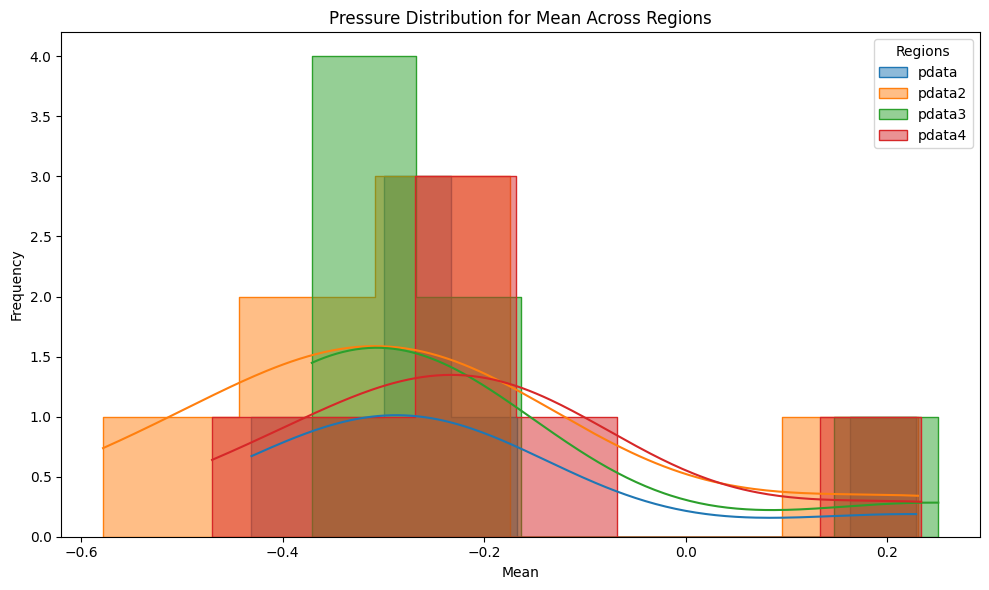

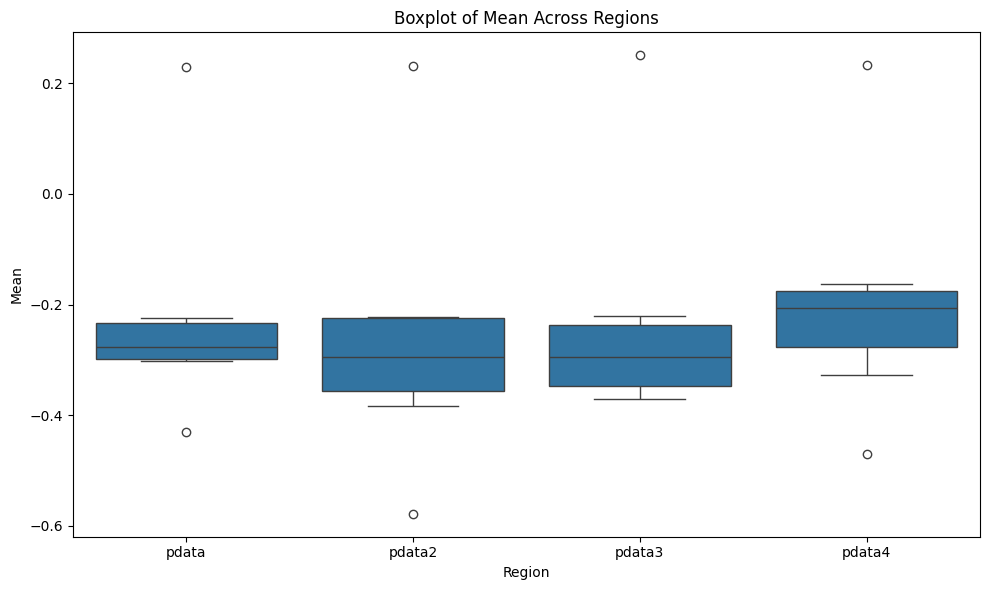

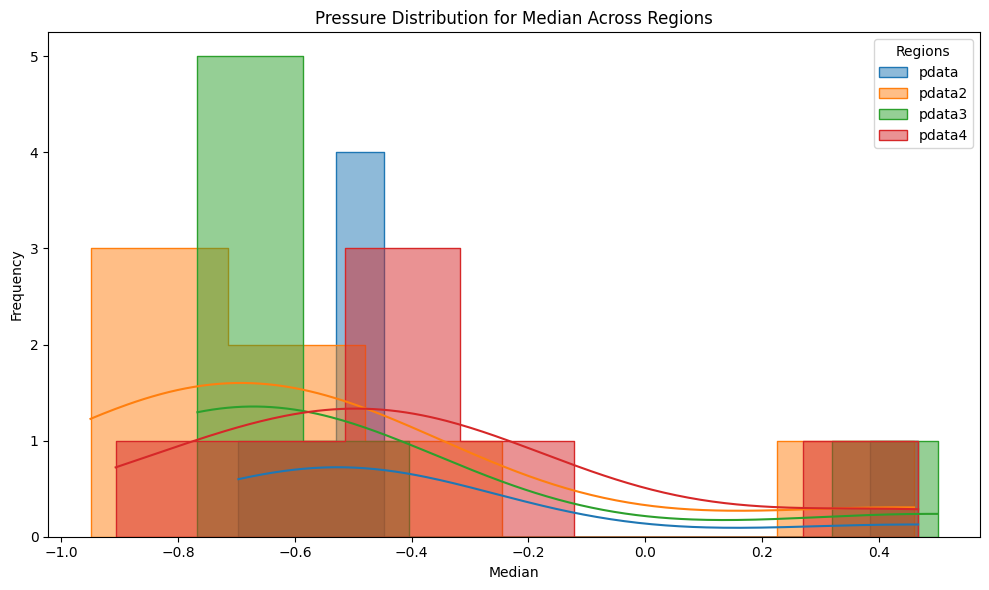

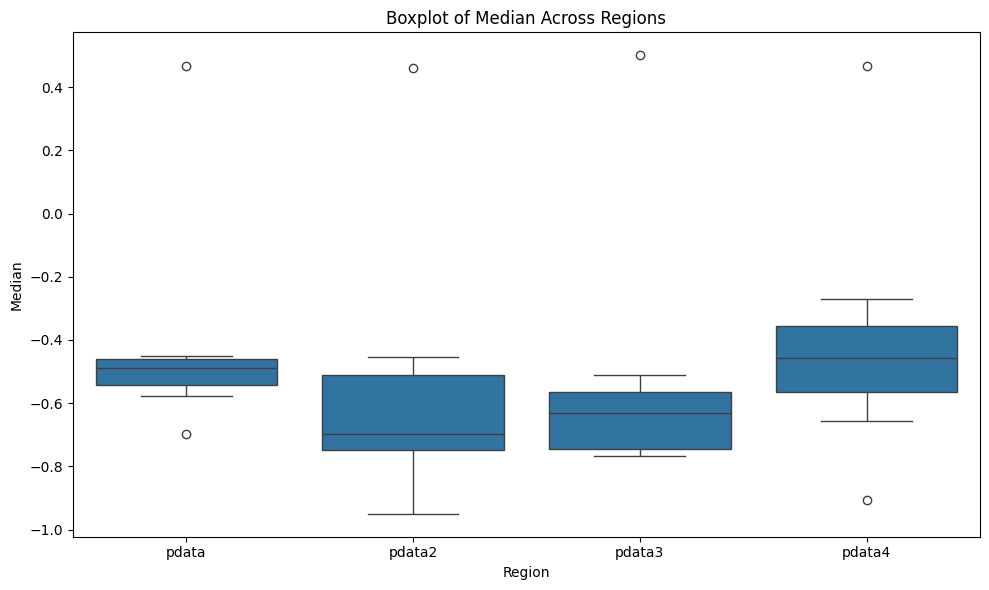

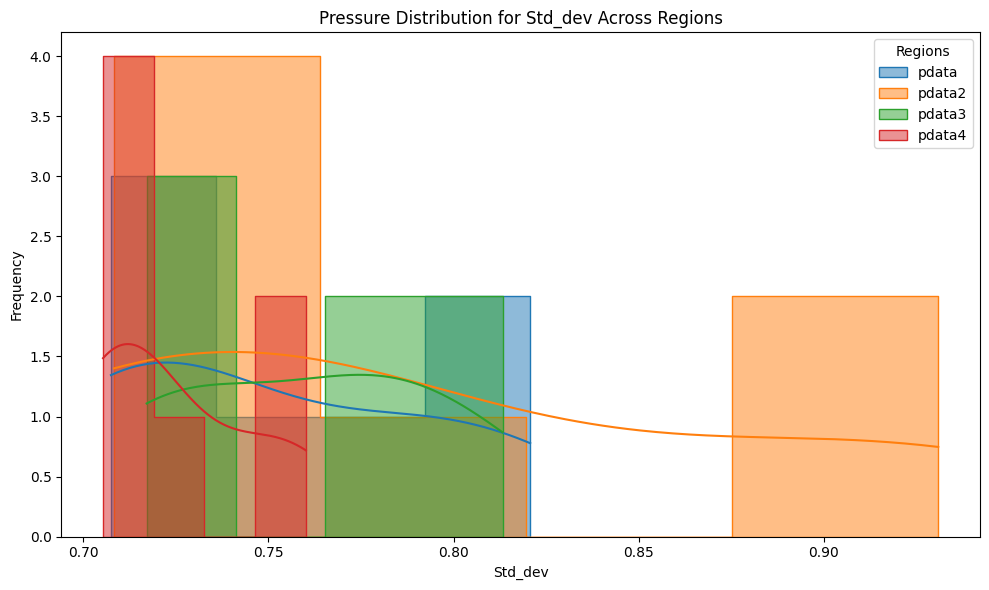

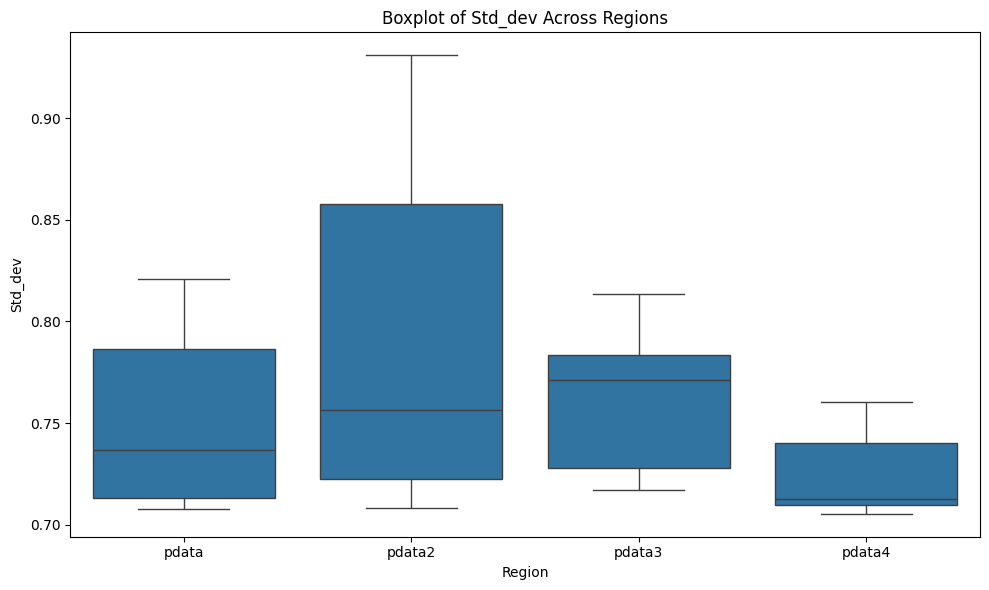

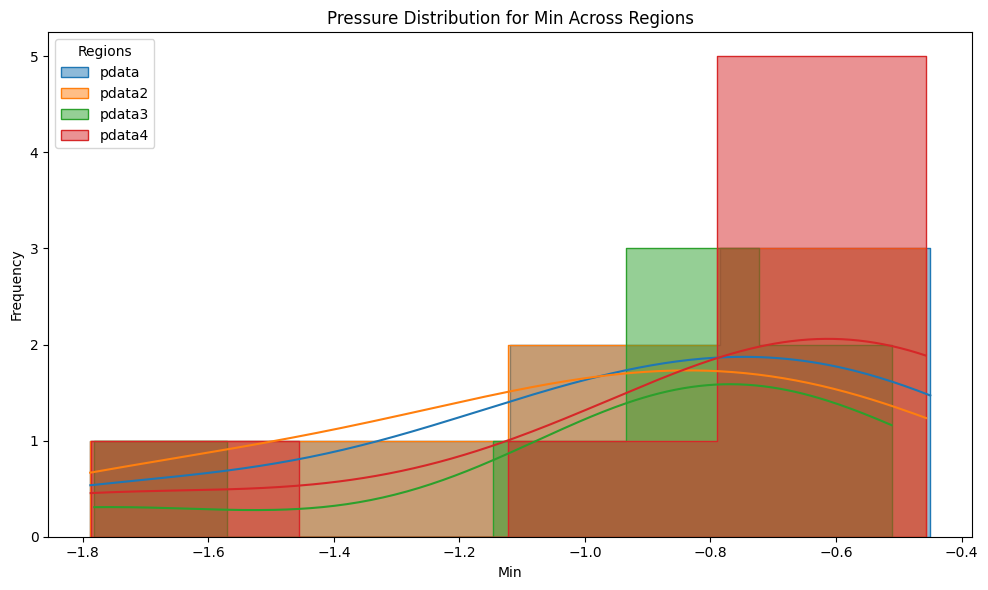

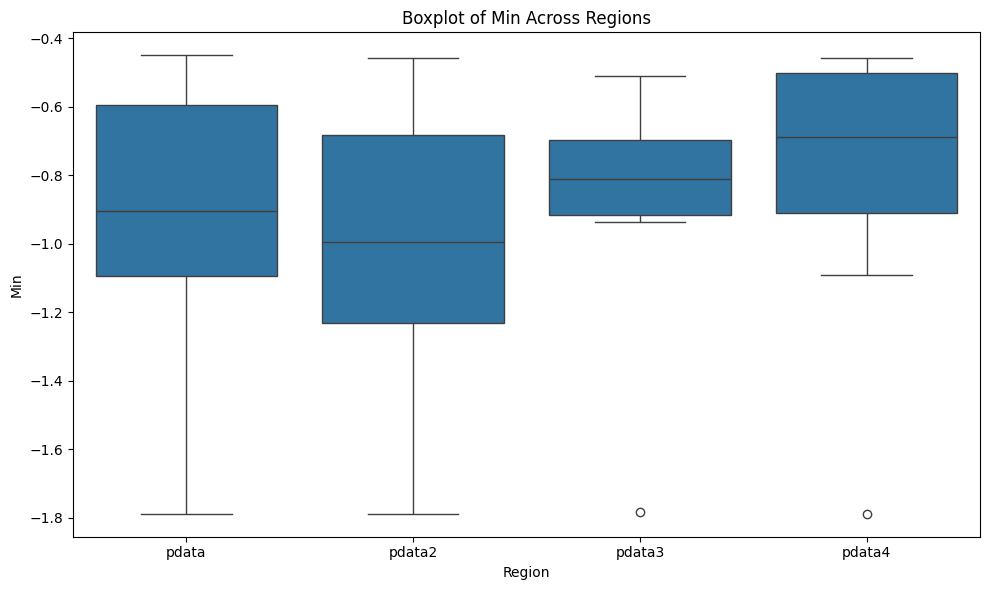

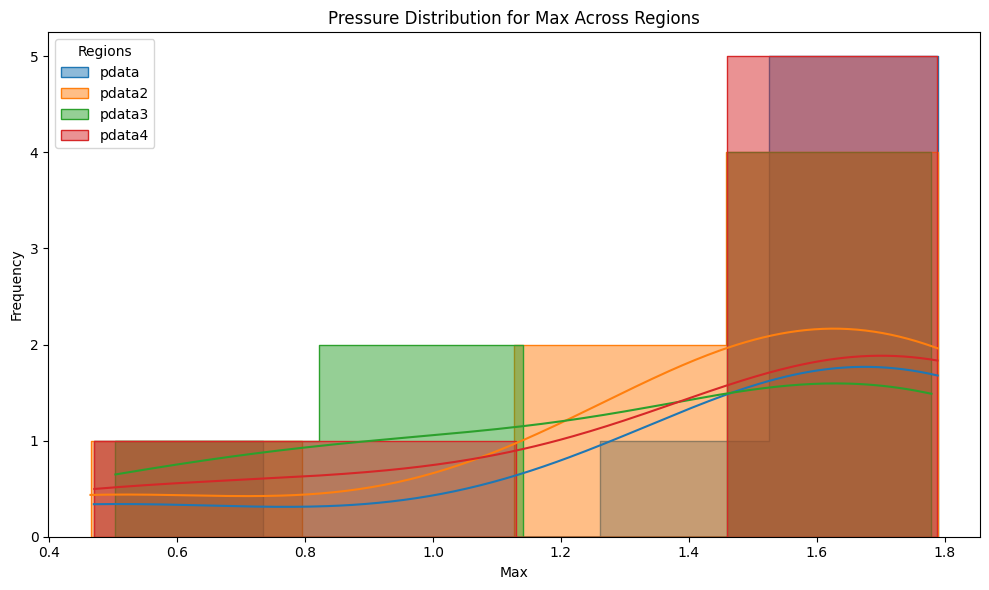

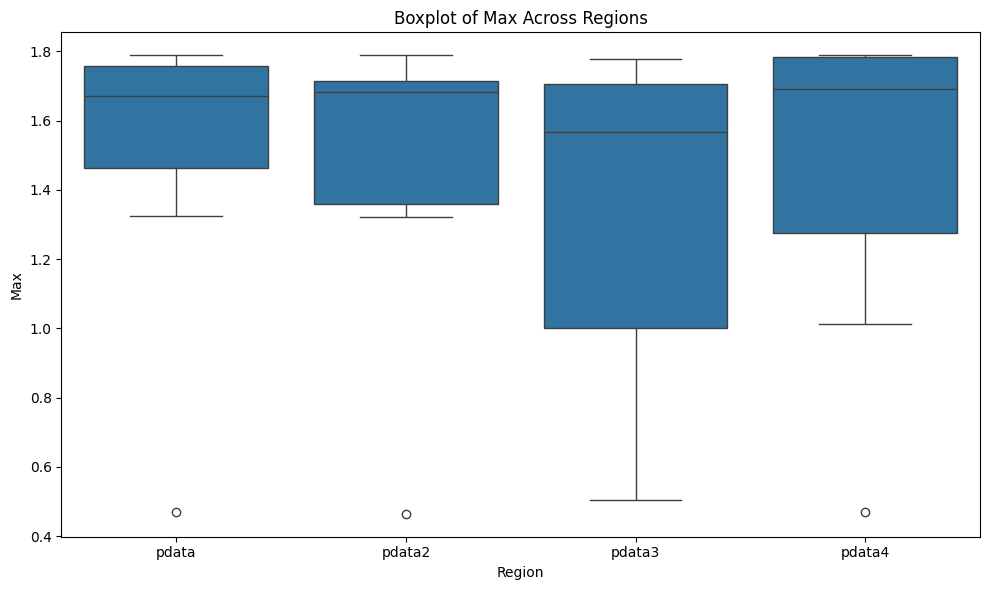

In [79]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# File paths for baseline files
baseline_files = {
    "pdata": "Metrics_Baselines/pdata1_baseline_metrics.csv",
    "pdata2": "Metrics_Baselines/pdata2_baseline_metrics.csv",
    "pdata3": "Metrics_Baselines/pdata3_baseline_metrics.csv",
    "pdata4": "Metrics_Baselines/pdata4_baseline_metrics.csv",
}

# Dictionary to store baseline data
baseline_data = {}

# Load baseline data and add region column explicitly
for region, file in baseline_files.items():
    data = pd.read_csv(file)
    data["Region"] = region  # Add pdata labels directly
    baseline_data[region] = data

# Combine all regions into one DataFrame for comparison
combined_data = pd.concat(baseline_data.values(), ignore_index=True)

# Plot histograms and boxplots for metrics distribution across all pdata regions
def plot_pressure_distribution(metric):
    plt.figure(figsize=(10, 6))

    # Histogram plot for all pdata regions
    for region in baseline_files.keys():
        region_data = combined_data[combined_data["Region"] == region]
        sns.histplot(region_data[metric], kde=True, label=region, element="step")

    plt.title(f"Pressure Distribution for {metric.capitalize()} Across Regions")
    plt.xlabel(f"{metric.capitalize()}")
    plt.ylabel("Frequency")
    plt.legend(title="Regions")
    plt.tight_layout()
    plt.show()

    # Boxplot plot for all pdata regions
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=combined_data, x="Region", y=metric)
    plt.title(f"Boxplot of {metric.capitalize()} Across Regions")
    plt.xlabel("Region")
    plt.ylabel(f"{metric.capitalize()}")
    plt.tight_layout()
    plt.show()

# Metrics to compare
metrics_to_compare = ["mean", "median", "std_dev", "min", "max"]

# Plot for each metric
for metric in metrics_to_compare:
    plot_pressure_distribution(metric)


# 1st Model Planning

### Nothing good

In [80]:
import pandas as pd
import numpy as np

# Load the baseline metrics CSVs (your top 5 healthy patients)
baseline_files = {
    "pdata1": "Metrics_Baselines/pdata1_baseline_metrics.csv",
    "pdata2": "Metrics_Baselines/pdata2_baseline_metrics.csv",
    "pdata3": "Metrics_Baselines/pdata3_baseline_metrics.csv",
    "pdata4": "Metrics_Baselines/pdata4_baseline_metrics.csv",
}

# Load and compute the mean baseline
baseline_data = {region: pd.read_csv(file) for region, file in baseline_files.items()}
baseline_model = pd.concat(baseline_data).groupby("metric").mean()

print("Baseline Gait Model (mean values for each metric):")
print(baseline_model)


Baseline Gait Model (mean values for each metric):
                      mean    median   std_dev       min       max
metric                                                            
auc              -0.382320 -0.687669  0.804074 -0.982900  1.683301
descent_gradient  0.235908  0.474208  0.711641 -1.786275  0.477246
kurtosis         -0.268347 -0.555867  0.729022 -0.615496  1.753748
peak_pressure    -0.322602 -0.631945  0.749135 -0.672399  1.526089
rise_gradient    -0.297857 -0.728833  0.826036 -0.971286  1.141001
skewness         -0.302135 -0.571052  0.775211 -0.923317  1.582191
variance         -0.233258 -0.467572  0.710667 -0.468609  1.786334


In [81]:
# Load new patient’s pressure data
new_patient_data = pd.read_csv(r'D:\Study\Gait\Metric_Distributions\metrics_pdata1\patient_47\distribution_metrics.csv')  # Replace with actual file



In [82]:
print(new_patient_data)

   peak_pressure       auc  rise_gradient  descent_gradient  variance  \
0      -0.562687 -0.994747      -0.664597          0.454967 -0.449174   

   skewness  kurtosis  
0 -0.220485 -0.393817  


Z-scores (Standardized Deviation from Baseline):
auc                -0.686849
descent_gradient    0.319056
kurtosis           -0.211362
peak_pressure            NaN
rise_gradient      -0.483909
skewness            0.104532
variance           -0.317342
dtype: float64


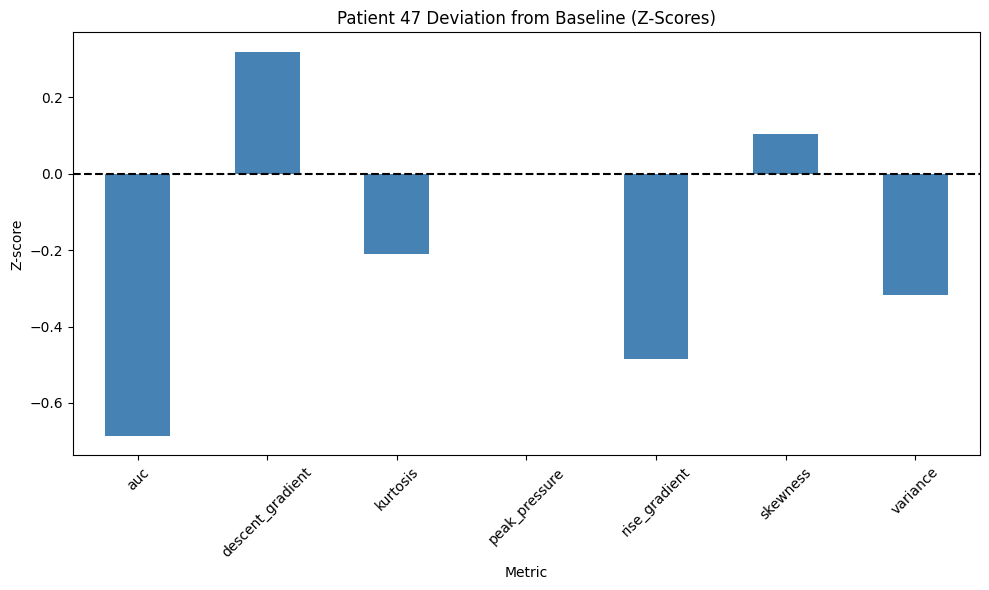

In [83]:
import pandas as pd
import matplotlib.pyplot as plt

# Load baseline metrics for pdata1
baseline_pdata1 = pd.read_csv('Metrics_Baselines/pdata1_baseline_metrics.csv')

# Load patient 47 data (assuming loaded as a DataFrame)
patient_47 = pd.read_csv(r'D:\Study\Gait\Metric_Distributions\metrics_pdata1\patient_47\distribution_metrics.csv')  # Ensure this file contains correct patient data

# Extract baseline mean and standard deviation for each metric
baseline_mean_std = baseline_pdata1.groupby('metric').agg({'mean': 'mean', 'std_dev': 'mean'})

# Extract patient 47 metrics as a series
patient_metrics = patient_47.iloc[0]  # First row for patient data

# Compute z-scores: (patient_value - baseline_mean) / baseline_std
z_scores = (patient_metrics[1:] - baseline_mean_std['mean']) / baseline_mean_std['std_dev']

# Print z-scores
print("Z-scores (Standardized Deviation from Baseline):")
print(z_scores)

# Visualize differences with a bar plot
plt.figure(figsize=(10, 6))
z_scores.plot(kind='bar', color='steelblue')
plt.title("Patient 47 Deviation from Baseline (Z-Scores)")
plt.axhline(y=0, color='black', linestyle='--')
plt.ylabel("Z-score")
plt.xlabel("Metric")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Model Generation for Pdata Baselines

In [84]:
import os
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier  # Replace with preferred model
import joblib

# Paths for baseline metrics CSV files
baseline_files = {
    "pdata": "Metrics_Baselines/pdata1_baseline_metrics.csv",
    "pdata2": "Metrics_Baselines/pdata2_baseline_metrics.csv",
    "pdata3": "Metrics_Baselines/pdata3_baseline_metrics.csv",
    "pdata4": "Metrics_Baselines/pdata4_baseline_metrics.csv",
}

# Ensure the directory to save models exists
model_dir = "Pdata_Model"
os.makedirs(model_dir, exist_ok=True)

In [85]:
# Create and save models for each region
for region, file in baseline_files.items():
    # Load the baseline data
    baseline_data = pd.read_csv(file)
    
    # Prepare features and labels (assuming 'metric' and 'mean' columns)
    X = baseline_data.drop(columns=['metric', 'Region'], errors='ignore')  # Features: exclude non-numeric
    y = baseline_data['metric']  # Target (for demo purposes, may need to adjust based on problem definition)
    
    # Normalize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Example model (Random Forest, you can replace it)
    model = RandomForestClassifier(n_estimators=50, random_state=42)
    model.fit(X_scaled, y)
    
    # Save model and scaler
    model_file = os.path.join(model_dir, f"{region}_model.joblib")
    scaler_file = os.path.join(model_dir, f"{region}_scaler.joblib")
    joblib.dump(model, model_file)
    joblib.dump(scaler, scaler_file)
    
    print(f"Saved model for {region} to {model_file}")

Saved model for pdata to Pdata_Model\pdata_model.joblib
Saved model for pdata2 to Pdata_Model\pdata2_model.joblib
Saved model for pdata3 to Pdata_Model\pdata3_model.joblib
Saved model for pdata4 to Pdata_Model\pdata4_model.joblib


In [86]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import joblib

# Load the saved model and scaler
model = joblib.load("Pdata_Model/pdata_model.joblib")
scaler = joblib.load("Pdata_Model/pdata_scaler.joblib")

# Load test data (new unseen data for evaluation)
test_data = pd.read_csv(r'D:\Study\Gait\Metric_Distributions\metrics_pdata1\patient_47\distribution_metrics.csv')  # Replace with actual test file
X_test = test_data.drop(columns=['metric', 'Region'], errors='ignore')
y_true = test_data[['peak_pressure', 'auc', 'rise_gradient', 'descent_gradient', 'variance', 'skewness', 'kurtosis']]



In [87]:
print(test_data.columns)

Index(['peak_pressure', 'auc', 'rise_gradient', 'descent_gradient', 'variance',
       'skewness', 'kurtosis'],
      dtype='object')


In [88]:
print(test_data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   peak_pressure     1 non-null      float64
 1   auc               1 non-null      float64
 2   rise_gradient     1 non-null      float64
 3   descent_gradient  1 non-null      float64
 4   variance          1 non-null      float64
 5   skewness          1 non-null      float64
 6   kurtosis          1 non-null      float64
dtypes: float64(7)
memory usage: 188.0 bytes
None


In [89]:
print("Features seen during training:", list(scaler.feature_names_in_))
print("Features in test data:", list(X_test.columns))


Features seen during training: ['mean', 'median', 'std_dev', 'min', 'max']
Features in test data: ['peak_pressure', 'auc', 'rise_gradient', 'descent_gradient', 'variance', 'skewness', 'kurtosis']


In [90]:
import pandas as pd

# Load the patient 47 metrics
patient47_data = pd.read_csv(r'D:\Study\Gait\Metric_Distributions\metrics_pdata1\patient_47\distribution_metrics.csv')  # Replace with your correct file path
patient49_data = pd.read_csv(r'D:\Study\Gait\Metric_Distributions\metrics_pdata1\patient_49\distribution_metrics.csv')  # Replace with your correct file path
patient65_data = pd.read_csv(r'D:\Study\Gait\Metric_Distributions\metrics_pdata1\patient_65\distribution_metrics.csv')  # Replace with your correct file path
patient100_data = pd.read_csv(r'D:\Study\Gait\Metric_Distributions\metrics_pdata1\patient_100\distribution_metrics.csv')  # Replace with your correct file path

# Calculate aggregated metrics for compatibility
aggregated_metrics = {
    'mean': patient47_data.mean().mean(),
    'median': patient47_data.median().mean(),
    'std_dev': patient47_data.std().mean(),
    'min': patient47_data.min().mean(),
    'max': patient47_data.max().mean()
}

# Convert to DataFrame
aggregated_metrics_df = pd.DataFrame([aggregated_metrics])

# Normalize the aggregated metrics using the scaler
X_test_scaled = scaler.transform(aggregated_metrics_df)

# Get predictions
y_pred = model.predict(X_test_scaled)

print("Prediction for Patient 47:")
print(y_pred)


Prediction for Patient 47:
['skewness']


In [91]:
regions = ['pdata1', 'pdata2', 'pdata3', 'pdata4']
predictions = {}

for region in regions:
    # Load patient distribution CSV for the region
    region_data = pd.read_csv(f'Metric_Distributions/metrics_{region}/patient_47/distribution_metrics.csv')
    
    # Aggregate the metrics
    aggregated_metrics = {
        'mean': region_data.mean().mean(),
        'median': region_data.median().mean(),
        'std_dev': region_data.std().mean(),
        'min': region_data.min().mean(),
        'max': region_data.max().mean()
    }
    
    # Convert to DataFrame for testing
    aggregated_metrics_df = pd.DataFrame([aggregated_metrics])
    X_test_scaled = scaler.transform(aggregated_metrics_df)
    
    # Make predictions
    y_pred = model.predict(X_test_scaled)
    predictions[region] = y_pred[0]

# Print predictions
for region, prediction in predictions.items():
    print(f"Prediction for {region}: {prediction}")


Prediction for pdata1: skewness
Prediction for pdata2: peak_pressure
Prediction for pdata3: rise_gradient
Prediction for pdata4: skewness


In [92]:
regions = ['pdata1', 'pdata2', 'pdata3', 'pdata4']
predictions = {}

for region in regions:
    # Load patient distribution CSV for the region
    region_data = pd.read_csv(f'Metric_Distributions/metrics_{region}/patient_49/distribution_metrics.csv')
    
    # Aggregate the metrics
    aggregated_metrics = {
        'mean': region_data.mean().mean(),
        'median': region_data.median().mean(),
        'std_dev': region_data.std().mean(),
        'min': region_data.min().mean(),
        'max': region_data.max().mean()
    }
    
    # Convert to DataFrame for testing
    aggregated_metrics_df = pd.DataFrame([aggregated_metrics])
    X_test_scaled = scaler.transform(aggregated_metrics_df)
    
    # Make predictions
    y_pred = model.predict(X_test_scaled)
    predictions[region] = y_pred[0]

# Print predictions
for region, prediction in predictions.items():
    print(f"Prediction for {region}: {prediction}")


Prediction for pdata1: skewness
Prediction for pdata2: rise_gradient
Prediction for pdata3: rise_gradient
Prediction for pdata4: rise_gradient


In [93]:
regions = ['pdata1', 'pdata2', 'pdata3', 'pdata4']
predictions = {}

for region in regions:
    # Load patient distribution CSV for the region
    region_data = pd.read_csv(f'Metric_Distributions/metrics_{region}/patient_65/distribution_metrics.csv')
    
    # Aggregate the metrics
    aggregated_metrics = {
        'mean': region_data.mean().mean(),
        'median': region_data.median().mean(),
        'std_dev': region_data.std().mean(),
        'min': region_data.min().mean(),
        'max': region_data.max().mean()
    }
    
    # Convert to DataFrame for testing
    aggregated_metrics_df = pd.DataFrame([aggregated_metrics])
    X_test_scaled = scaler.transform(aggregated_metrics_df)
    
    # Make predictions
    y_pred = model.predict(X_test_scaled)
    predictions[region] = y_pred[0]

# Print predictions
for region, prediction in predictions.items():
    print(f"Prediction for {region}: {prediction}")


Prediction for pdata1: rise_gradient
Prediction for pdata2: auc
Prediction for pdata3: rise_gradient
Prediction for pdata4: skewness


# With Steps

In [94]:
print(filtered_data[filtered_data['cid'] == 47].columns)
print(filtered_data[filtered_data['cid'] == 47]["pData"].describe())


Index(['id', 'cid', 'counter', 'tData', 'tData_2', 'tData_3', 'tData_4',
       'pData', 'pData_2', 'pData_3', 'pData_4', 'created_at', 'updated_at'],
      dtype='object')
count    913.000000
mean      34.322015
std       14.822685
min       26.000000
25%       32.000000
50%       32.000000
75%       32.000000
max      235.000000
Name: pData, dtype: float64


In [95]:
import pandas as pd
import numpy as np
import os

# Load the filtered patient data
filtered_data = pd.read_csv('filtered_patients_25_steps.csv')

# Define pdata columns and output directories
pdata_columns = ["pData", "pData_2", "pData_3", "pData_4"]
output_dir = "Step_Segmentation_Metrics"
os.makedirs(output_dir, exist_ok=True)

# Function to segment steps with step numbers and calculate metrics
def segment_steps_with_metrics(data, column):
    threshold = 5  # Lower threshold for step detection
    steps = []
    current_step = []

    for i, value in enumerate(data[column]):
        if value > threshold:
            current_step.append(value)
        elif current_step:
            steps.append(current_step)
            current_step = []

    if len(steps) == 0:
        print(f"No valid steps detected for {column} in patient {data['cid'].iloc[0]}")
        return pd.DataFrame()  # Return empty DataFrame if no steps detected

    # Extract step metrics
    step_metrics = []
    for step_num, step_data in enumerate(steps, 1):
        step_data = pd.Series(step_data)
        metrics = {
            "step_number": step_num,
            "peak_pressure": step_data.max(),
            "auc": step_data.sum(),
            "rise_gradient": (step_data.max() - step_data.iloc[0]) / max(1, step_data.idxmax() + 1),
            "descent_gradient": (step_data.iloc[-1] - step_data.max()) / max(1, len(step_data) - step_data.idxmax() - 1),
            "variance": step_data.var(),
            "skewness": step_data.skew(),
            "kurtosis": step_data.kurtosis()
        }
        step_metrics.append(metrics)

    return pd.DataFrame(step_metrics)


In [96]:
# Process each patient for each pdata region
for cid in filtered_data['cid'].unique():
    patient_data = filtered_data[filtered_data['cid'] == cid]
    
    for pdata in pdata_columns:
        if pdata in patient_data.columns:
            step_metrics_df = segment_steps_with_metrics(patient_data, pdata)
            if not step_metrics_df.empty:
                patient_dir = os.path.join(output_dir, pdata, f"patient_{cid}")
                os.makedirs(patient_dir, exist_ok=True)
                output_file = os.path.join(patient_dir, "step_metrics.csv")
                step_metrics_df.to_csv(output_file, index=False)
                print(f"Saved step metrics for {pdata} - patient {cid} to {output_file}")

No valid steps detected for pData in patient 38
No valid steps detected for pData_2 in patient 38
Saved step metrics for pData_3 - patient 38 to Step_Segmentation_Metrics\pData_3\patient_38\step_metrics.csv
Saved step metrics for pData_4 - patient 38 to Step_Segmentation_Metrics\pData_4\patient_38\step_metrics.csv
No valid steps detected for pData in patient 40
No valid steps detected for pData_2 in patient 40
Saved step metrics for pData_3 - patient 40 to Step_Segmentation_Metrics\pData_3\patient_40\step_metrics.csv
Saved step metrics for pData_4 - patient 40 to Step_Segmentation_Metrics\pData_4\patient_40\step_metrics.csv
No valid steps detected for pData in patient 41
No valid steps detected for pData_2 in patient 41
Saved step metrics for pData_3 - patient 41 to Step_Segmentation_Metrics\pData_3\patient_41\step_metrics.csv
Saved step metrics for pData_4 - patient 41 to Step_Segmentation_Metrics\pData_4\patient_41\step_metrics.csv
No valid steps detected for pData in patient 43
No v

### Visualizing for Patients

In [97]:
import matplotlib.pyplot as plt

# Function to visualize segmented steps for a patient
def visualize_segmented_steps(patient_data, column, patient_id):
    plt.figure(figsize=(12, 6))
    plt.plot(patient_data[column].values, label=f"Full Signal - Patient {patient_id}", color='gray', alpha=0.5)
    threshold = 5  # Same threshold used in step segmentation
    step_indices = []
    step_values = []

    # Identify and plot detected steps
    current_step = []
    for i, value in enumerate(patient_data[column]):
        if value > threshold:
            current_step.append(i)
        elif current_step:
            step_indices.extend(current_step)
            step_values.extend(patient_data[column].iloc[current_step])
            current_step = []

    # Plot detected steps
    plt.scatter(step_indices, step_values, color='red', label="Detected Steps", marker='x', s=20)
    plt.axhline(y=threshold, color='orange', linestyle='--', label="Threshold")
    
    plt.title(f"Segmented Steps for Patient {patient_id} in {column}")
    plt.xlabel("Time")
    plt.ylabel("Pressure")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()




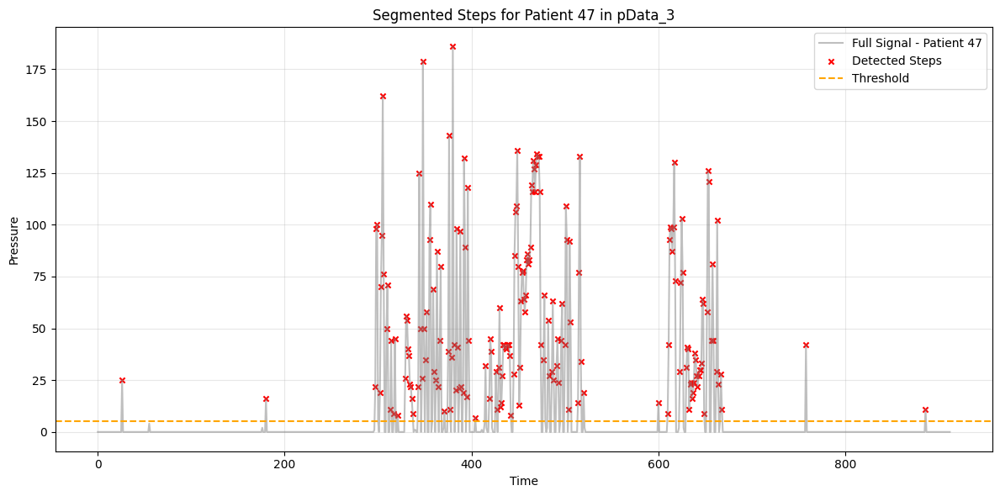

In [98]:
# Load data (if necessary)
data = pd.read_csv("filtered_patients_25_steps.csv")  # Replace with the correct file path

# Example Usage:
# Visualize for a specific patient and pdata region
patient_id = 47  # Replace with the actual patient ID
pdata_region = "pData_3"  # Replace with "pData", "pData_2", etc.

# Use the correct column for the patient identifier
filtered_patient_data = data[data['cid'] == patient_id]  # Update to the correct column name
if not filtered_patient_data.empty:
    visualize_segmented_steps(filtered_patient_data, pdata_region, patient_id)
else:
    print(f"No data found for patient {patient_id} in {pdata_region}")

# Step Pressure Analysis

- focus on calculating and visualizing the average peak pressure and pressure variability across steps for each region (pData, pData_2, pData_3, pData_4).

In [99]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Function to analyze and visualize step pressure metrics
def analyze_step_pressure(patient_id):
    # File paths for each region
    regions = ["pData", "pData_2", "pData_3", "pData_4"]
    base_dir = "Step_Segmentation_Metrics"
    
    avg_peak_pressures = {}
    pressure_variabilities = {}
    
    plt.figure(figsize=(12, 8))
    
    for i, region in enumerate(regions):
        # Construct file path
        file_path = os.path.join(base_dir, region, f"patient_{patient_id}", "step_metrics.csv")
        
        # Check if file exists
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}")
            continue
        
        # Load the CSV file
        data = pd.read_csv(file_path)
        
        # Check if peak_pressure column exists
        if "peak_pressure" not in data.columns:
            print(f"Column 'peak_pressure' not found in {file_path}")
            continue
        
        # Calculate mean and standard deviation of peak pressure
        avg_peak_pressure = data["peak_pressure"].mean()
        pressure_variability = data["peak_pressure"].std()  # Standard deviation
        
        # Store values for summary
        avg_peak_pressures[region] = avg_peak_pressure
        pressure_variabilities[region] = pressure_variability
        
        # Plot histogram of peak pressures
        plt.subplot(2, 2, i + 1)
        plt.hist(data["peak_pressure"], bins=10, alpha=0.7, label=f"{region} (mean={avg_peak_pressure:.2f})")
        plt.axvline(avg_peak_pressure, color='r', linestyle='dashed', linewidth=1)
        plt.title(f"{region} - Peak Pressure Distribution")
        plt.xlabel("Peak Pressure")
        plt.ylabel("Frequency")
        plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Summary of average peak pressure and variability
    print("\nStep Pressure Summary for Patient:", patient_id)
    for region in regions:
        avg = avg_peak_pressures.get(region, "N/A")
        std_dev = pressure_variabilities.get(region, "N/A")
        print(f"{region}: Average Peak Pressure = {avg}, Pressure Variability (STD) = {std_dev}")



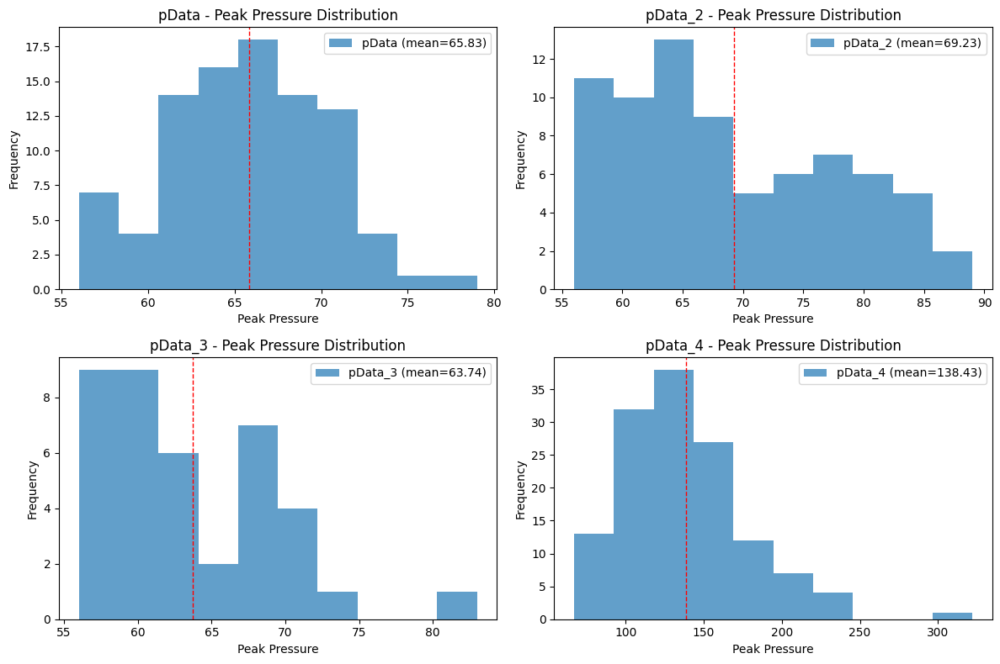


Step Pressure Summary for Patient: 350
pData: Average Peak Pressure = 65.82608695652173, Pressure Variability (STD) = 4.731490705903138
pData_2: Average Peak Pressure = 69.22972972972973, Pressure Variability (STD) = 9.035011499863499
pData_3: Average Peak Pressure = 63.743589743589745, Pressure Variability (STD) = 5.816120739706098
pData_4: Average Peak Pressure = 138.43283582089552, Pressure Variability (STD) = 40.375762803603386


In [100]:

# Example usage
patient_id = 350  # Change this to any patient ID you want to analyze
analyze_step_pressure(patient_id)

# Inter-Region Pressure Comparison
- compares the pressure metrics across different regions (pData, pData_2, pData_3, pData_4) for the same patient. 
- objective is to determine how different the pressure distribution is for each region during the steps and check for any significant differences.
- Combines peak pressure data from all four regions for a selected patient.
- Creates a boxplot to visualize differences in peak_pressure across regions.
- Adds a stripplot overlay to show the spread of individual step values for each region.
- Performs an ANOVA (Analysis of Variance) test to check if the average peak pressure is significantly different across the regions:
- Perform F-statistic and p-value & if p-value < 0.05, it indicates a significant difference between regions

In [101]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.stats import f_oneway

# Function to compare pressure across regions for a patient
def compare_pressure_across_regions(patient_id):
    regions = ["pData", "pData_2", "pData_3", "pData_4"]
    base_dir = "Step_Segmentation_Metrics"
    
    pressure_data = []

    for region in regions:
        file_path = os.path.join(base_dir, region, f"patient_{patient_id}", "step_metrics.csv")
        
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}")
            continue
        
        # Load step metrics for the region
        data = pd.read_csv(file_path)
        
        if "peak_pressure" not in data.columns:
            print(f"Column 'peak_pressure' not found in {file_path}")
            continue
        
        # Add region information to the DataFrame
        data["Region"] = region
        pressure_data.append(data[["step_number", "peak_pressure", "Region"]])
    
    if not pressure_data:
        print(f"No data found for patient {patient_id}")
        return
    
    # Combine all regions' data
    combined_data = pd.concat(pressure_data)
    
    # Plot boxplot for comparison
    plt.figure(figsize=(10, 6))
    sns.boxplot(x="Region", y="peak_pressure", data=combined_data)
    sns.stripplot(x="Region", y="peak_pressure", data=combined_data, color="black", alpha=0.5, jitter=True)
    plt.title(f"Inter-Region Peak Pressure Comparison for Patient {patient_id}")
    plt.xlabel("Region")
    plt.ylabel("Peak Pressure")
    plt.show()

    # Statistical test to check if the means differ significantly
    grouped_pressures = [combined_data[combined_data["Region"] == region]["peak_pressure"] for region in regions if region in combined_data["Region"].unique()]
    
    if len(grouped_pressures) > 1:
        f_stat, p_value = f_oneway(*grouped_pressures)
        print(f"ANOVA Test Result: F-statistic = {f_stat:.2f}, p-value = {p_value:.4f}")
        if p_value < 0.05:
            print("Conclusion: Significant difference in peak pressure between regions.")
        else:
            print("Conclusion: No significant difference in peak pressure between regions.")
    else:
        print("Not enough data for statistical comparison.")


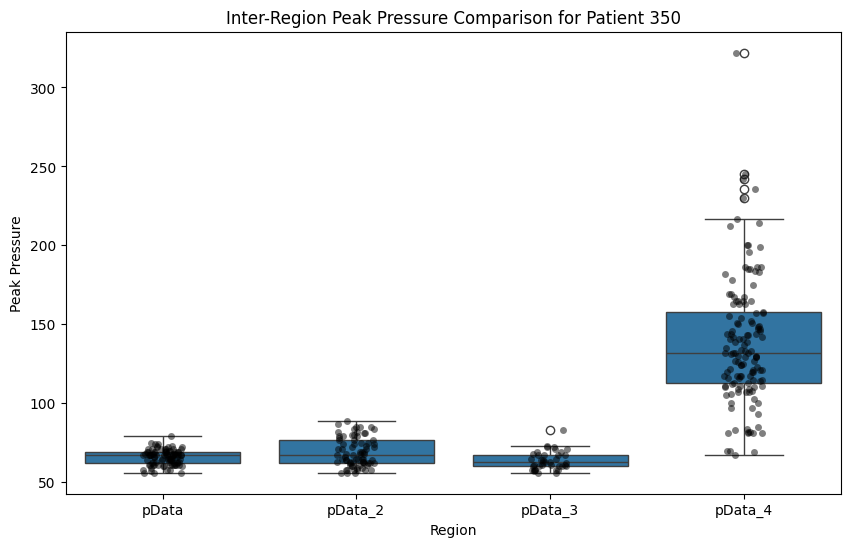

ANOVA Test Result: F-statistic = 206.61, p-value = 0.0000
Conclusion: Significant difference in peak pressure between regions.


In [102]:
# Example usage
patient_id = 350  # Change this to the patient ID you want to analyze
compare_pressure_across_regions(patient_id)

# Step Consistency Analysis
-  Analyze the consistency of steps by measuring how stable the peak_pressure values are across steps within each region
-  Provide insight into how balanced or variable the patient’s gait is across multiple steps.
-  Insight into how much step pressure values deviate from the average.
-  Measures the spread of peak_pressure across steps (higher variance = more inconsistency).

In [103]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Function to analyze step consistency for all regions for a selected patient
def analyze_step_consistency(patient_id):
    regions = ["pData", "pData_2", "pData_3", "pData_4"]
    base_dir = "Step_Segmentation_Metrics"
    
    consistency_data = []

    for region in regions:
        file_path = os.path.join(base_dir, region, f"patient_{patient_id}", "step_metrics.csv")
        
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}")
            continue
        
        # Load step metrics
        data = pd.read_csv(file_path)
        
        if "peak_pressure" not in data.columns:
            print(f"Column 'peak_pressure' not found in {file_path}")
            continue

        # Calculate mean, std deviation, variance, and coefficient of variation
        mean_pressure = data["peak_pressure"].mean()
        std_dev_pressure = data["peak_pressure"].std()
        variance_pressure = data["peak_pressure"].var()
        coefficient_of_variation = (std_dev_pressure / mean_pressure) * 100 if mean_pressure != 0 else 0

        # Append results to a DataFrame
        consistency_data.append({
            "Region": region,
            "Mean Pressure": mean_pressure,
            "Standard Deviation": std_dev_pressure,
            "Variance": variance_pressure,
            "CV (%)": coefficient_of_variation
        })

    if not consistency_data:
        print(f"No data found for patient {patient_id}")
        return
    
    consistency_df = pd.DataFrame(consistency_data)

    # Display consistency metrics as a table
    print("\nStep Consistency Metrics:")
    print(consistency_df)

    # Plot step consistency metrics
    plt.figure(figsize=(12, 6))
    sns.barplot(x="Region", y="CV (%)", data=consistency_df)
    plt.title(f"Step Consistency Across Regions for Patient {patient_id}")
    plt.xlabel("Region")
    plt.ylabel("Coefficient of Variation (CV %) - Lower is Better")
    plt.show()



Step Consistency Metrics:
    Region  Mean Pressure  Standard Deviation     Variance     CV (%)
0    pData      65.826087            4.731491    22.387004   7.187866
1  pData_2      69.229730            9.035011    81.631433  13.050768
2  pData_3      63.743590            5.816121    33.827260   9.124244
3  pData_4     138.432836           40.375763  1630.202222  29.166319


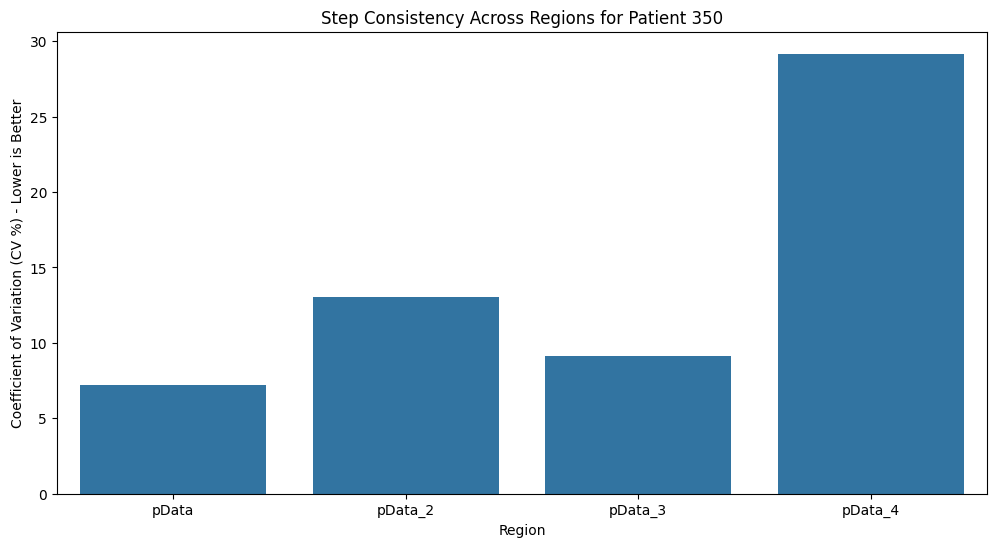

In [104]:
# Example usage
patient_id = 350  # Replace with desired patient ID
analyze_step_consistency(patient_id)


# Distribution Shape Analysis
- Understand the distribution shape of the peak_pressure values across steps within each region to detect skewness, symmetry, and peakedness (kurtosis). 
- Identify whether the data follows a normal distribution or is skewed, and whether there are extreme peaks or flat distributions.

- Key Metrics for Distribution Shape Analysis:
- Skewness:
Indicates the asymmetry of the distribution.
Positive skew: Distribution tails off to the right (i.e., higher values).
Negative skew: Tails off to the left (i.e., lower values).
A skewness value close to 0 indicates a symmetric distribution.
- Kurtosis:
Indicates the "peakedness" of the distribution.
High kurtosis (>3): A distribution with sharper peaks and heavy tails (leptokurtic).
Low kurtosis (<3): A flatter distribution with lighter tails (platykurtic).
Normal distribution: Kurtosis ≈ 3 (mesokurtic).

In [105]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Function to analyze distribution shape for each region
def analyze_distribution_shape(patient_id):
    regions = ["pData", "pData_2", "pData_3", "pData_4"]
    base_dir = "Step_Segmentation_Metrics"
    
    distribution_data = []

    for region in regions:
        file_path = os.path.join(base_dir, region, f"patient_{patient_id}", "step_metrics.csv")
        
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}")
            continue
        
        # Load step metrics
        data = pd.read_csv(file_path)
        
        if "peak_pressure" not in data.columns:
            print(f"Column 'peak_pressure' not found in {file_path}")
            continue

        # Calculate skewness and kurtosis
        skewness = data["peak_pressure"].skew()
        kurtosis = data["peak_pressure"].kurtosis()

        # Append results to the DataFrame
        distribution_data.append({
            "Region": region,
            "Skewness": skewness,
            "Kurtosis": kurtosis
        })

        # Plot distribution
        plt.figure(figsize=(8, 4))
        sns.histplot(data["peak_pressure"], kde=True, bins=15)
        plt.title(f"Distribution of Peak Pressure in {region} - Patient {patient_id}")
        plt.xlabel("Peak Pressure")
        plt.ylabel("Frequency")
        plt.show()

    if not distribution_data:
        print(f"No data found for patient {patient_id}")
        return

    # Display distribution metrics
    distribution_df = pd.DataFrame(distribution_data)
    print("\nDistribution Shape Metrics:")
    print(distribution_df)

    # Visualize skewness and kurtosis for each region
    plt.figure(figsize=(10, 5))
    sns.barplot(x="Region", y="Skewness", data=distribution_df)
    plt.title(f"Skewness Across Regions for Patient {patient_id}")
    plt.xlabel("Region")
    plt.ylabel("Skewness")
    plt.show()

    plt.figure(figsize=(10, 5))
    sns.barplot(x="Region", y="Kurtosis", data=distribution_df)
    plt.title(f"Kurtosis Across Regions for Patient {patient_id}")
    plt.xlabel("Region")
    plt.ylabel("Kurtosis")
    plt.show()

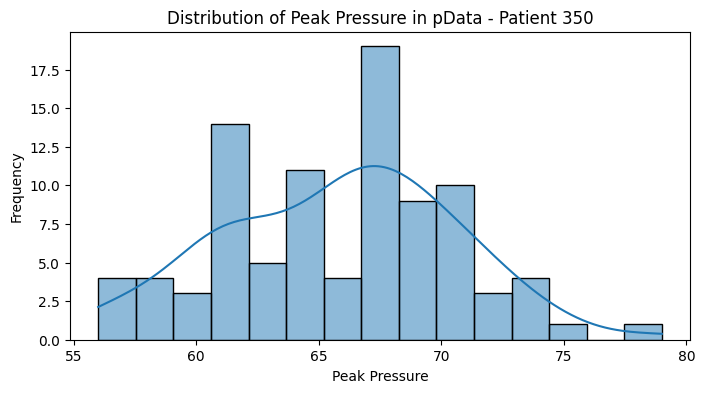

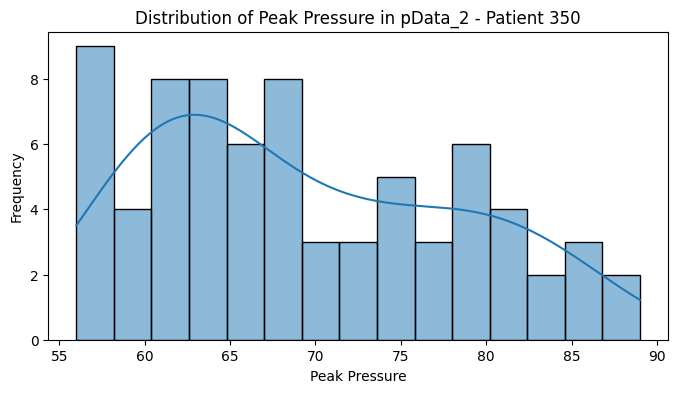

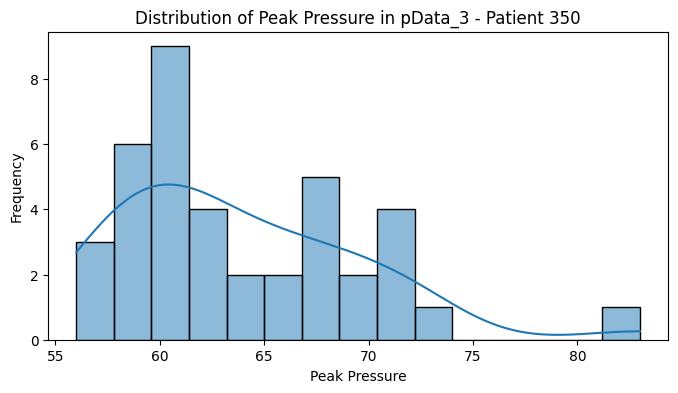

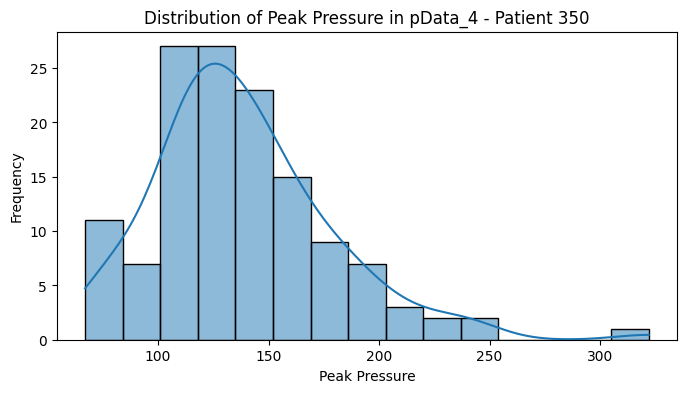


Distribution Shape Metrics:
    Region  Skewness  Kurtosis
0    pData -0.029548 -0.275796
1  pData_2  0.427241 -0.978674
2  pData_3  1.072834  1.568887
3  pData_4  1.119200  2.720955


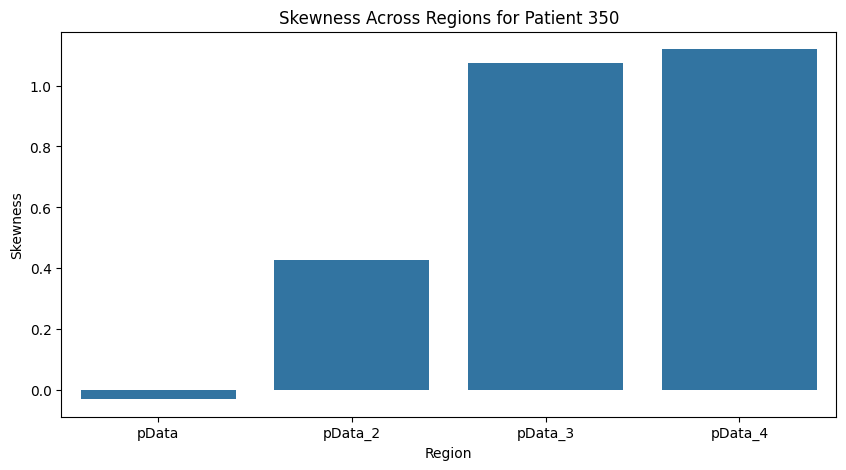

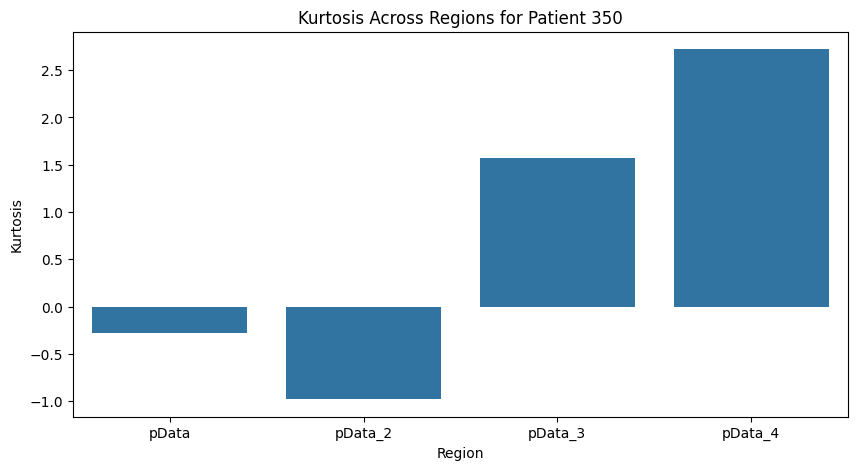

In [106]:
# Example usage
patient_id = 350  # Replace with desired patient ID
analyze_distribution_shape(patient_id)

# Individual Step Trends and Outliers
- Analyze individual step peak_pressure trends to detect abnormal patterns, including outliers, and assess variability across steps. 
- Identify irregular pressure patterns, which could indicate anomalies in the patient's gait.
- Outliers Detection:
Use IQR (Interquartile Range) to detect steps with unusually high or low peak pressures.
- Trend Analysis:
Identify if peak_pressure increases or decreases consistently across steps.
- Visual Inspection:
Plot individual step values to visually check for spikes or unusual patterns.

- Step-to-step consistency: Are the steps following a consistent trend or showing irregular fluctuations?
- Outliers: Are there any extreme pressure points that could indicate problematic steps?
- Step pressure range: How wide is the range of pressures across steps for each region?

In [107]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Function to analyze step trends and detect outliers
def analyze_step_trends_and_outliers(patient_id):
    regions = ["pData", "pData_2", "pData_3", "pData_4"]
    base_dir = "Step_Segmentation_Metrics"

    for region in regions:
        file_path = os.path.join(base_dir, region, f"patient_{patient_id}", "step_metrics.csv")
        
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}")
            continue

        # Load step metrics
        data = pd.read_csv(file_path)
        
        if "peak_pressure" not in data.columns:
            print(f"Column 'peak_pressure' not found in {file_path}")
            continue

        # Calculate IQR for outlier detection
        q1 = data["peak_pressure"].quantile(0.25)
        q3 = data["peak_pressure"].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        # Detect outliers
        outliers = data[(data["peak_pressure"] < lower_bound) | (data["peak_pressure"] > upper_bound)]

        # Plot step trends
        plt.figure(figsize=(10, 5))
        sns.lineplot(x=data["step_number"], y=data["peak_pressure"], label="Step Pressure")
        plt.scatter(outliers["step_number"], outliers["peak_pressure"], color='red', label='Outliers', zorder=5)
        plt.title(f"Step Pressure Trends for {region} - Patient {patient_id}")
        plt.xlabel("Step Number")
        plt.ylabel("Peak Pressure")
        plt.legend()
        plt.show()

        print(f"\nSummary for {region} - Patient {patient_id}:")
        print(f"Number of Steps: {len(data)}")
        print(f"Outliers Detected: {len(outliers)}")
        if not outliers.empty:
            print(f"Outlier Step Numbers: {outliers['step_number'].values}")
            print(f"Outlier Pressures: {outliers['peak_pressure'].values}")
        else:
            print("No outliers detected.")

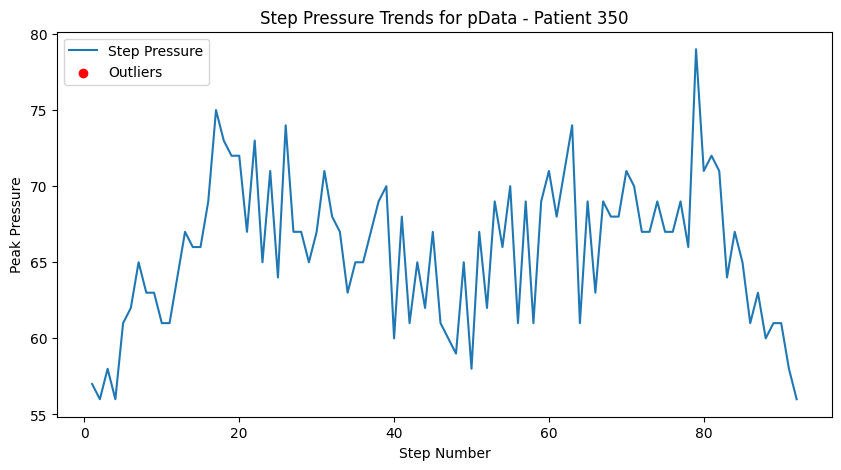


Summary for pData - Patient 350:
Number of Steps: 92
Outliers Detected: 0
No outliers detected.


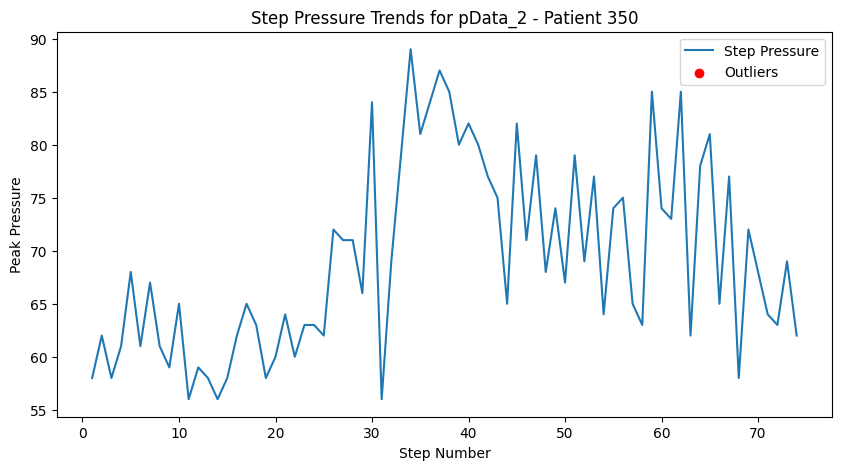


Summary for pData_2 - Patient 350:
Number of Steps: 74
Outliers Detected: 0
No outliers detected.


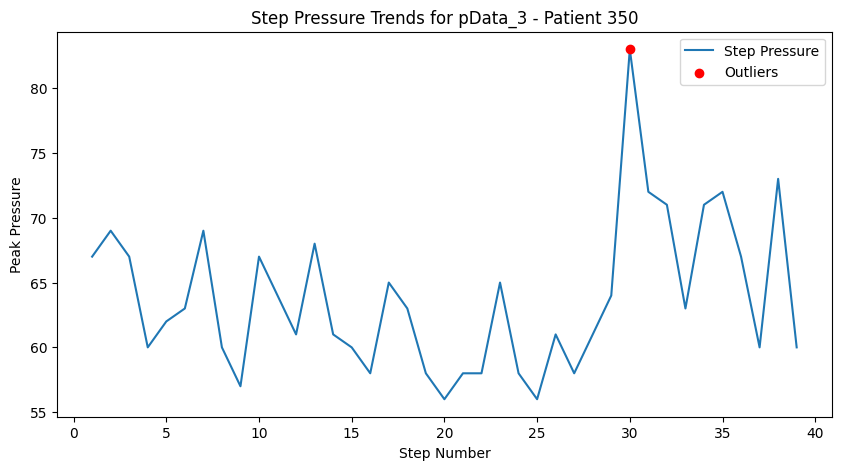


Summary for pData_3 - Patient 350:
Number of Steps: 39
Outliers Detected: 1
Outlier Step Numbers: [30]
Outlier Pressures: [83]


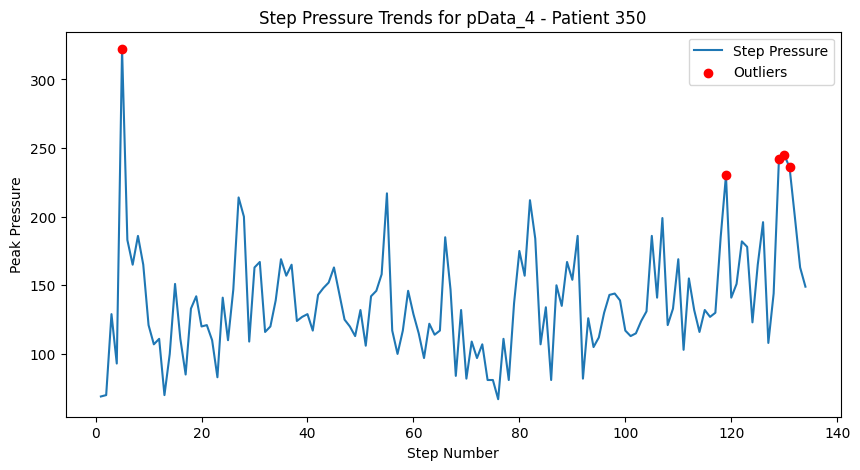


Summary for pData_4 - Patient 350:
Number of Steps: 134
Outliers Detected: 5
Outlier Step Numbers: [  5 119 129 130 131]
Outlier Pressures: [322 230 242 245 236]


In [108]:
# Example usage
patient_id = 350  # Replace with desired patient ID
analyze_step_trends_and_outliers(patient_id)

# Gait Phase Detection
- To detect and analyze the different phases of the gait cycle (e.g., heel strike, mid-stance, toe-off) based on the peak_pressure values from the step segmentation data. 
- Understanding these phases helps identify abnormal gait patterns.



- Heel Strike:
-- Initial contact with the ground.
-- Pressure starts increasing.
- Mid-Stance:
-- The entire foot bears weight.
-- Pressure reaches its peak.
- Toe-Off:
-- The foot pushes off the ground.
-- Pressure rapidly decreases.

- Gait Timing: Are the gait phases distributed uniformly across steps or do some steps miss certain phases?
- Abnormalities: Are some phases (e.g., heel strike or toe-off) absent in certain steps, indicating a possible issue?
- Region Comparison: Compare the phases across regions to see if some areas (e.g., heel or toe) are over- or underused.

In [109]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os

# Function to detect gait phases
def detect_gait_phases(patient_id):
    regions = ["pData", "pData_2", "pData_3", "pData_4"]
    base_dir = "Step_Segmentation_Metrics"

    for region in regions:
        file_path = os.path.join(base_dir, region, f"patient_{patient_id}", "step_metrics.csv")
        
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}")
            continue

        # Load step metrics data
        data = pd.read_csv(file_path)
        
        if "peak_pressure" not in data.columns:
            print(f"Column 'peak_pressure' not found in {file_path}")
            continue
        
        # Initialize lists to store gait phase information
        heel_strikes = []
        mid_stances = []
        toe_offs = []

        for idx in range(1, len(data) - 1):
            prev_pressure = data.iloc[idx - 1]["peak_pressure"]
            curr_pressure = data.iloc[idx]["peak_pressure"]
            next_pressure = data.iloc[idx + 1]["peak_pressure"]

            # Detect phases based on pressure changes
            if curr_pressure > prev_pressure and curr_pressure < next_pressure:
                heel_strikes.append(data.iloc[idx]["step_number"])
            if curr_pressure > prev_pressure and curr_pressure > next_pressure:
                mid_stances.append(data.iloc[idx]["step_number"])
            if curr_pressure < prev_pressure and curr_pressure < next_pressure:
                toe_offs.append(data.iloc[idx]["step_number"])

        # Plot the step pressures with gait phases
        plt.figure(figsize=(10, 6))
        sns.lineplot(x=data["step_number"], y=data["peak_pressure"], label="Step Pressure", color='blue')
        plt.scatter(heel_strikes, data["peak_pressure"].iloc[heel_strikes], label="Heel Strike", color='orange', zorder=5)
        plt.scatter(mid_stances, data["peak_pressure"].iloc[mid_stances], label="Mid-Stance (Peak)", color='red', zorder=5)
        plt.scatter(toe_offs, data["peak_pressure"].iloc[toe_offs], label="Toe-Off", color='green', zorder=5)
        plt.title(f"Gait Phases for {region} - Patient {patient_id}")
        plt.xlabel("Step Number")
        plt.ylabel("Peak Pressure")
        plt.legend()
        plt.show()

        print(f"\nSummary for {region} - Patient {patient_id}:")
        print(f"Number of Heel Strikes: {len(heel_strikes)}")
        print(f"Number of Mid-Stances (Peak Pressure): {len(mid_stances)}")
        print(f"Number of Toe-Offs: {len(toe_offs)}")

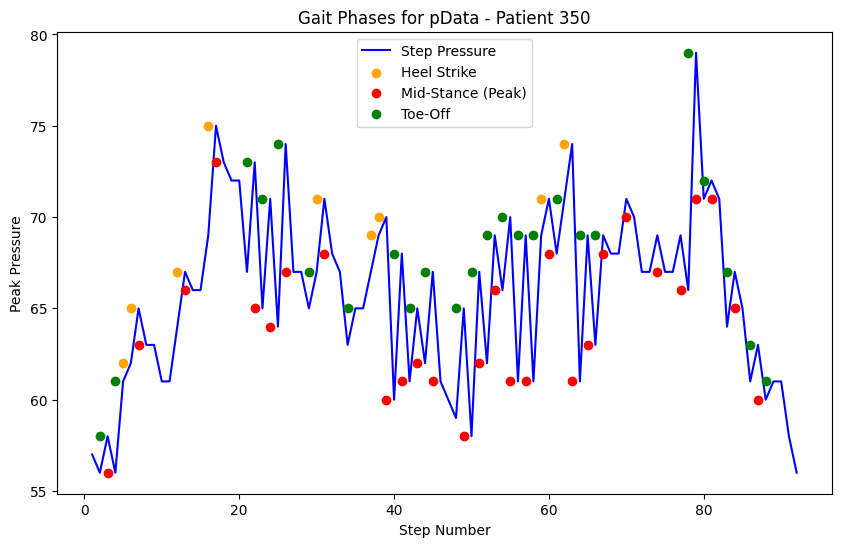


Summary for pData - Patient 350:
Number of Heel Strikes: 9
Number of Mid-Stances (Peak Pressure): 28
Number of Toe-Offs: 24


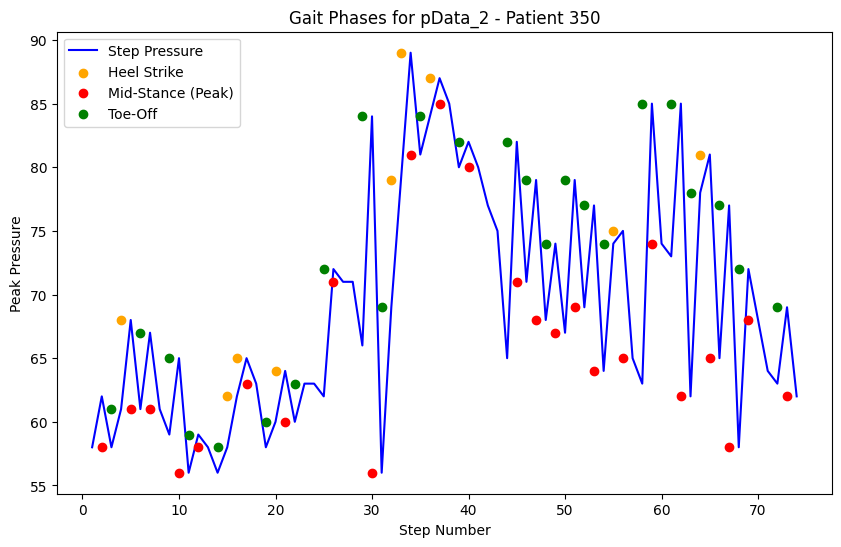


Summary for pData_2 - Patient 350:
Number of Heel Strikes: 9
Number of Mid-Stances (Peak Pressure): 24
Number of Toe-Offs: 24


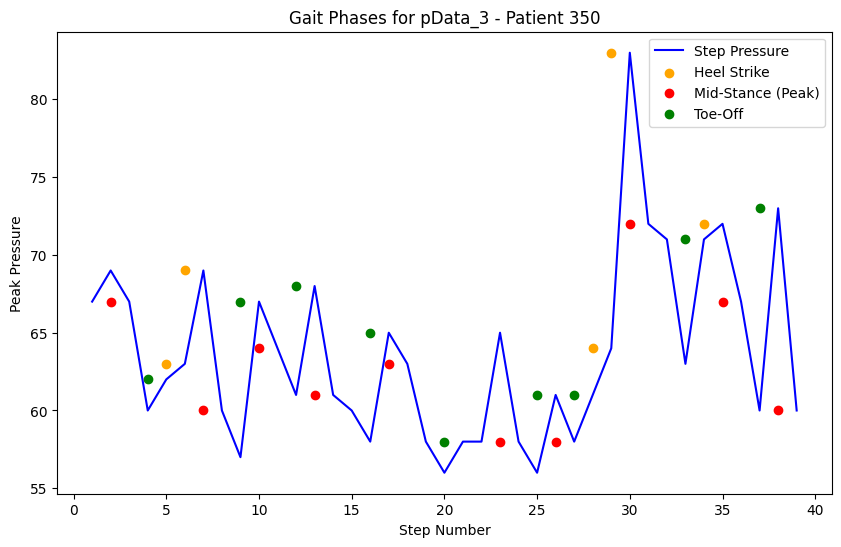


Summary for pData_3 - Patient 350:
Number of Heel Strikes: 5
Number of Mid-Stances (Peak Pressure): 10
Number of Toe-Offs: 9


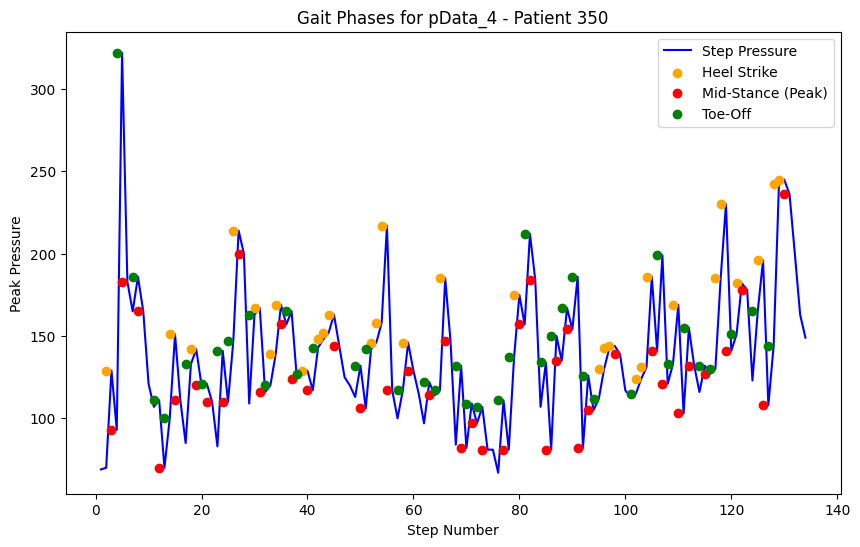


Summary for pData_4 - Patient 350:
Number of Heel Strikes: 30
Number of Mid-Stances (Peak Pressure): 40
Number of Toe-Offs: 39


In [110]:
# Example usage
patient_id = 350  # Replace with the desired patient ID
detect_gait_phases(patient_id)

# Inter-Patient Comparisons
- Compare the step segmentation metrics across multiple patients to identify patterns, similarities, and anomalies between individuals. 
- Detect outliers and understand how different patients' gait patterns relate to each other.

- Average Metrics Comparison:
-- Compare metrics like peak_pressure, variance, skewness, and kurtosis across patients.
- Gait Cycle Variability:
--Analyze variability in gait cycles (e.g., range of step durations).
- Clustering and Grouping:
--Group patients with similar gait patterns using techniques like clustering.
- Outlier Detection:
--Identify patients whose step metrics deviate significantly from the group.


In [111]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Function to load all step metrics for all patients in a region
def load_all_step_metrics(region):
    base_dir = f"Step_Segmentation_Metrics/{region}"
    all_metrics = []

    for patient_folder in os.listdir(base_dir):
        patient_path = os.path.join(base_dir, patient_folder, "step_metrics.csv")
        if os.path.exists(patient_path):
            patient_id = int(patient_folder.split("_")[1])
            df = pd.read_csv(patient_path)
            df["patient_id"] = patient_id  # Add patient ID
            all_metrics.append(df)

    if all_metrics:
        combined_df = pd.concat(all_metrics, ignore_index=True)
        return combined_df
    else:
        print(f"No data found for region {region}")
        return pd.DataFrame()

# Function for inter-patient comparison
def inter_patient_comparison(region):
    data = load_all_step_metrics(region)
    if data.empty:
        print(f"No data available for {region}.")
        return

    # Compute average metrics for each patient
    patient_summary = data.groupby("patient_id").mean()

    # Plot comparison of peak pressure across patients
    plt.figure(figsize=(12, 6))
    sns.barplot(x=patient_summary.index, y=patient_summary["peak_pressure"], palette="Blues_d")
    plt.title(f"Average Peak Pressure Comparison Across Patients for {region}")
    plt.xlabel("Patient ID")
    plt.ylabel("Average Peak Pressure")
    plt.xticks(rotation=45)
    plt.show()

    # Pairplot to compare multiple metrics
    metrics_of_interest = ["peak_pressure", "variance", "skewness", "kurtosis"]
    pairplot_data = patient_summary[metrics_of_interest].reset_index()
    sns.pairplot(pairplot_data, diag_kind="kde")
    plt.suptitle(f"Inter-Metric Comparison for {region}", y=1.02)
    plt.show()

    # Display summary statistics
    print(f"Summary Statistics for {region} Across Patients:")
    print(patient_summary.describe())

C:\Users\samiu\AppData\Local\Temp\ipykernel_27112\2869057814.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=patient_summary.index, y=patient_summary["peak_pressure"], palette="Blues_d")


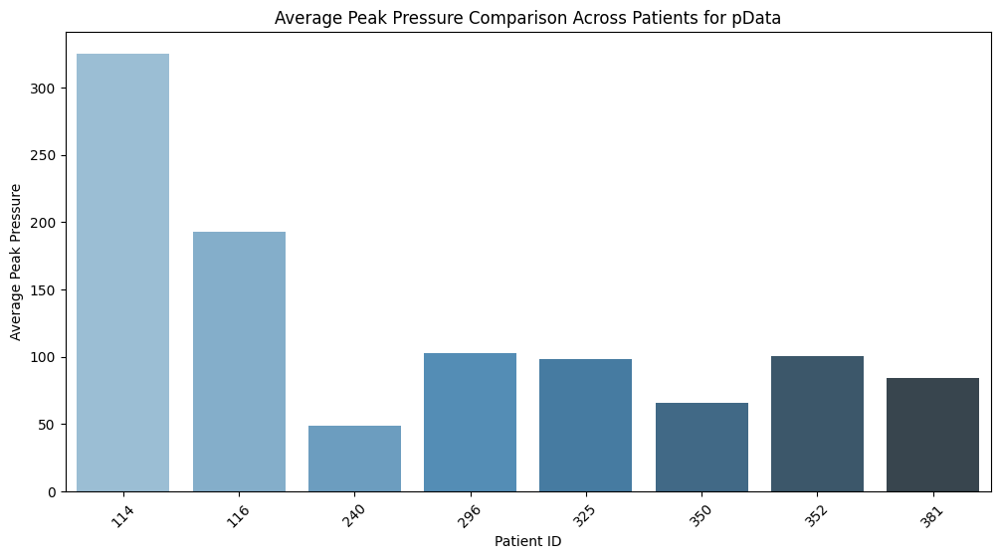

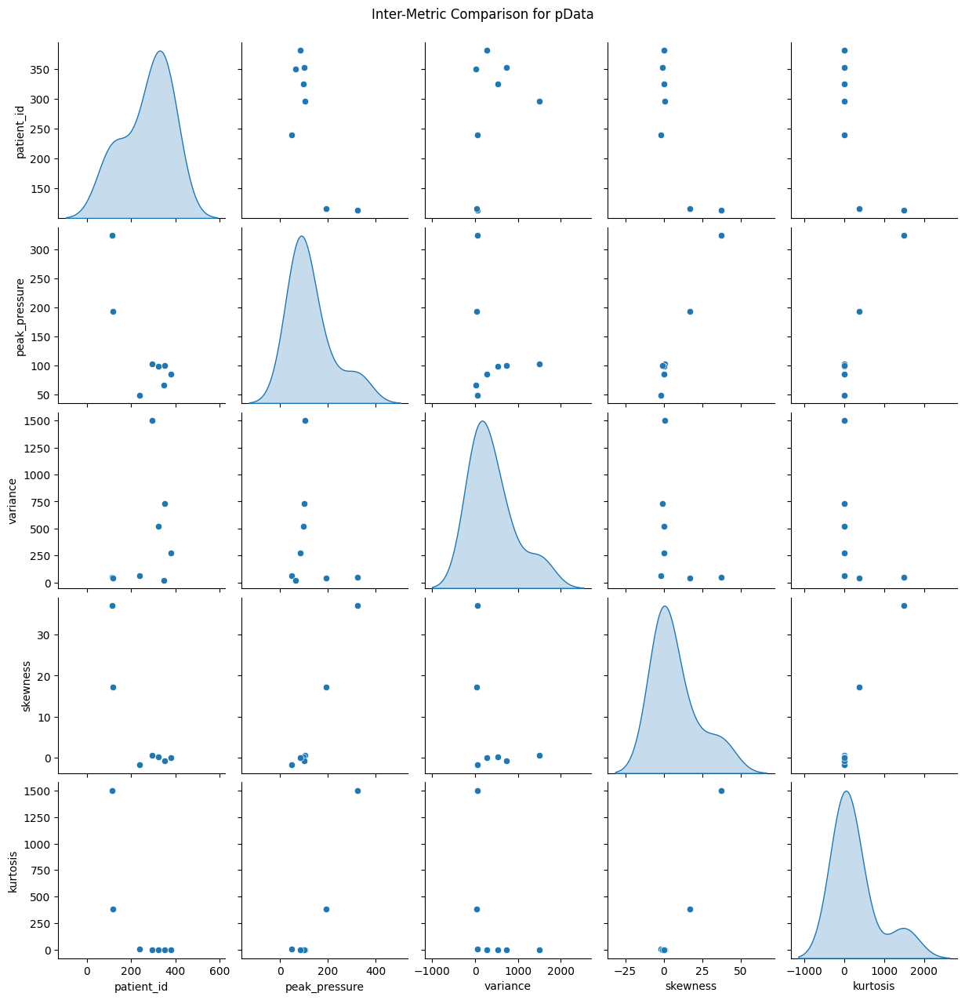

Summary Statistics for pData Across Patients:
       step_number  peak_pressure           auc  rise_gradient  \
count     8.000000       8.000000      8.000000       8.000000   
mean     13.437500     127.318931  14977.507971       3.134331   
std      17.376991      90.517731  29423.755156       2.714161   
min       1.000000      48.750000     77.793478       0.380435   
25%       2.125000      79.706522    214.221739       1.529585   
50%       6.000000      99.350000    248.541667       2.146093   
75%      15.875000     125.456522  10460.625000       3.889881   
max      46.500000     325.000000  81068.000000       8.199034   

       descent_gradient     variance   skewness     kurtosis  
count          8.000000     8.000000   7.000000     7.000000  
mean          -4.681590   400.334159   7.516818   269.508682  
std            4.270383   516.444666  14.612178   560.991533  
min          -11.333333    21.921053  -1.766871    -2.272809  
25%           -7.395471    45.233830  -0.329

In [112]:
# Example usage
region = "pData"  # Replace with "pData", "pData_2", etc.
inter_patient_comparison(region)

# Detect Abnormal Patterns
- To identify and flag abnormal gait patterns that deviate significantly from expected patterns or normal distributions.

- Z-Score Analysis: 
Calculate the Z-score for each metric to identify steps or patients whose metrics deviate significantly (e.g., > 3 standard deviations).
- Threshold-Based Detection: Set manual thresholds for specific metrics such as peak_pressure, skewness, etc.
- Clustering for Outliers: Use unsupervised learning methods (e.g., DBSCAN) to identify outliers in multi-metric space.
- Dynamic Time Warping (DTW) Outlier Detection: Compare each patient’s gait signal to the baseline template using DTW and detect significant deviations.

In [113]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Function to detect abnormal steps based on Z-scores
def detect_abnormal_patterns(region, z_threshold=3):
    # Load data
    data = load_all_step_metrics(region)
    if data.empty:
        print(f"No data available for {region}.")
        return

    # Calculate Z-scores for each metric
    metrics = ["peak_pressure", "variance", "skewness", "kurtosis"]
    for metric in metrics:
        data[f"{metric}_zscore"] = (data[metric] - data[metric].mean()) / data[metric].std()

    # Detect outliers based on Z-score threshold
    outliers = data[(data[[f"{metric}_zscore" for metric in metrics]] > z_threshold).any(axis=1)]

    print(f"Detected {len(outliers)} abnormal steps for {region}.")
    
    # Visualization
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=data[metrics])
    plt.title(f"Metric Distributions for {region} with Boxplot (for Outlier Detection)")
    plt.show()

    if not outliers.empty:
        plt.figure(figsize=(12, 6))
        sns.scatterplot(x=outliers["step_number"], y=outliers["peak_pressure"], hue=outliers["patient_id"], palette="deep")
        plt.title(f"Abnormal Steps (Peak Pressure) Detected in {region}")
        plt.xlabel("Step Number")
        plt.ylabel("Peak Pressure")
        plt.show()

    print("Sample of Abnormal Patterns:")
    print(outliers.head())

Detected 6 abnormal steps for pData.


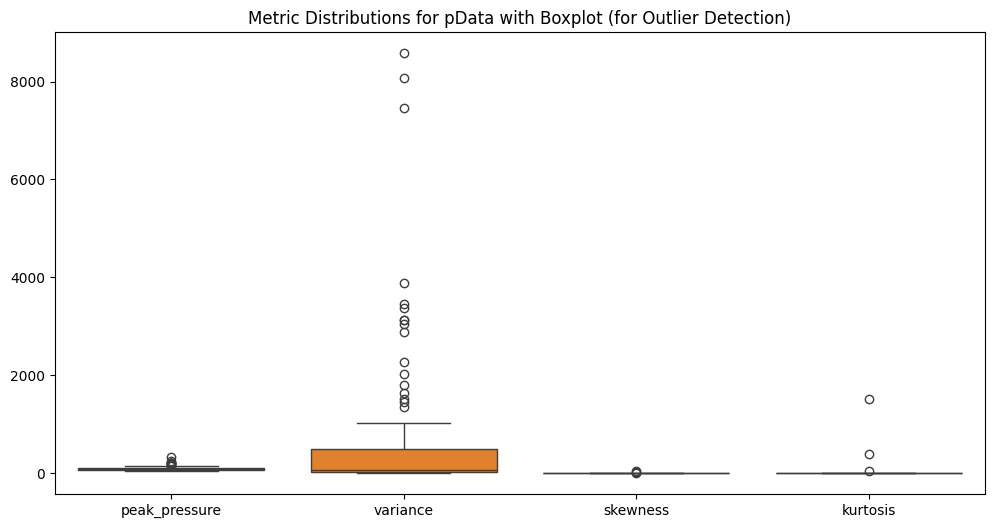

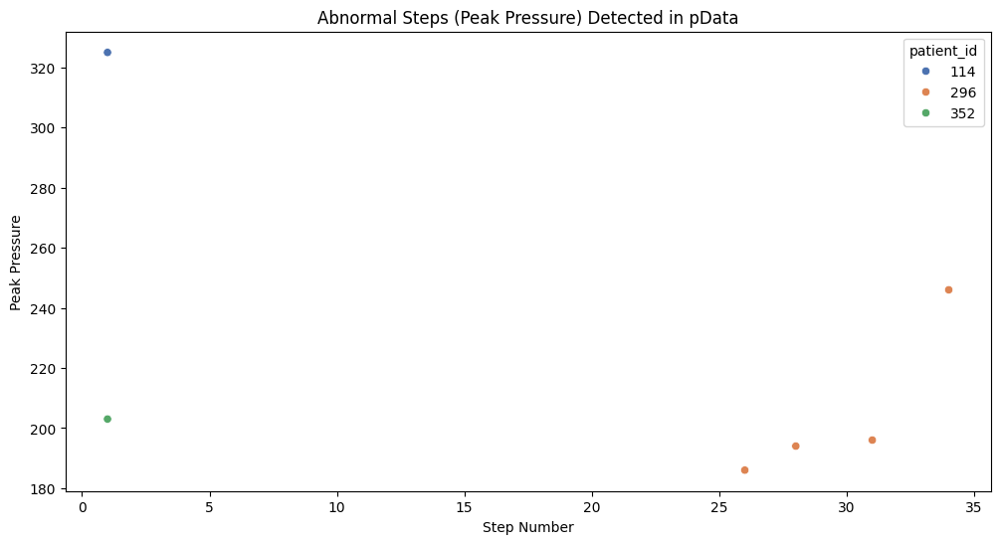

Sample of Abnormal Patterns:
    step_number  peak_pressure    auc  rise_gradient  descent_gradient  \
0             1            325  81068       1.140562         -0.161172   
31           26            186    245      63.500000          0.000000   
33           28            194    257      65.500000          0.000000   
36           31            196    196       0.000000          0.000000   
39           34            246    449      83.500000       -122.000000   

       variance   skewness     kurtosis  patient_id  peak_pressure_zscore  \
0     46.633561  37.118557  1500.564769         114              6.612822   
31  8064.500000        NaN          NaN         296              2.784514   
33  8580.500000        NaN          NaN         296              3.004848   
36          NaN        NaN          NaN         296              3.059932   
39  7466.333333   1.218743          NaN         296              4.437021   

    variance_zscore  skewness_zscore  kurtosis_zscore  
0      

In [114]:
# Example usage
region = "pData"  # Replace with "pData", "pData_2", "pData_3", "pData_4"
detect_abnormal_patterns(region)

# Abnormality Detection with DBSCAN

In [115]:
from sklearn.cluster import DBSCAN

def detect_abnormal_with_dbscan(region, eps=0.5, min_samples=5):
    data = load_all_step_metrics(region)
    if data.empty:
        print(f"No data available for {region}.")
        return

    # Use peak pressure and variance for clustering
    clustering_features = data[["peak_pressure", "variance"]].dropna()
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit_predict(clustering_features)

    # Visualize clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=clustering_features["peak_pressure"], y=clustering_features["variance"], hue=clusters, palette="tab10")
    plt.title(f"DBSCAN Clustering of Steps for {region}")
    plt.xlabel("Peak Pressure")
    plt.ylabel("Variance")
    plt.show()

    outliers = clustering_features[clusters == -1]
    print(f"Detected {len(outliers)} outlier points.")


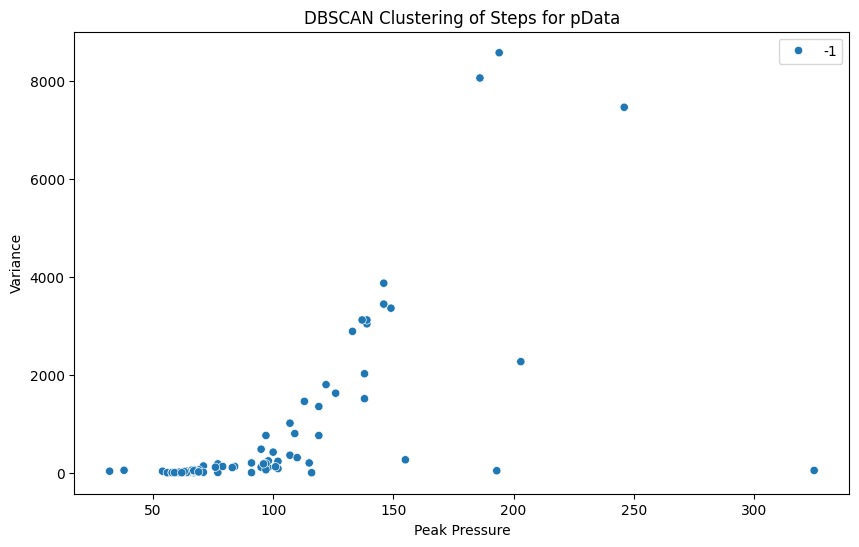

Detected 85 outlier points.


In [116]:
# Example usage
region_dbscan = "pData"  # Replace with "pData", "pData_2", "pData_3", "pData_4"
detect_abnormal_with_dbscan(region_dbscan, eps=0.5, min_samples=5)

# Abnormality Detection through DTW

In [117]:
import matplotlib.pyplot as plt
import numpy as np
from dtaidistance import dtw
import pandas as pd

def simulate_time_series_from_summary_values(peak_pressure, length=10):
    """
    Simulate time-series sequences from summary peak pressure values.
    """
    return np.linspace(peak_pressure - 10, peak_pressure + 10, length)

def plot_dtw_comparison(patient_id, pdata_region, sequence_length=10):
    """
    Perform DTW comparisons using simulated time-series data from summary statistics.
    """
    step_metrics_path = f"Step_Segmentation_Metrics/{pdata_region}/patient_{patient_id}/step_metrics.csv"
    step_metrics = pd.read_csv(step_metrics_path)
    
    if step_metrics.empty or len(step_metrics) < 2:
        print(f"No valid steps for {pdata_region} - patient {patient_id}")
        return

    plt.figure(figsize=(12, 6))
    plt.title(f"DTW Comparison for {pdata_region} (Patient {patient_id})")
    plt.xlabel("Time Points")
    plt.ylabel("Pressure")
    
    # Choose the first step as the template sequence
    template_peak_pressure = step_metrics["peak_pressure"].values[0]
    template_sequence = simulate_time_series_from_summary_values(template_peak_pressure, sequence_length)
    
    plt.plot(template_sequence, label="Template Step (Normal)", color="black", linewidth=2)

    for i, row in step_metrics.iterrows():
        step_peak_pressure = row["peak_pressure"]
        if pd.isna(step_peak_pressure):
            continue
        # Generate simulated sequence
        step_sequence = simulate_time_series_from_summary_values(step_peak_pressure, sequence_length)
        
        # Calculate DTW distance
        distance = dtw.distance(template_sequence, step_sequence)
        
        plt.plot(step_sequence, label=f"Step {i+1} (DTW Distance: {distance:.2f})")
    
    plt.legend(loc="upper left")
    plt.show()


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.2 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\traitlets\config\application.py", line 1075, in launch

In [118]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from dtaidistance import dtw

def detect_peak_pressure_abnormalities(patient_id, pdata_region, threshold_factor=1.5):
    """
    Detect and visualize abnormalities based on peak pressure DTW distance.
    """
    step_metrics_path = f"Step_Segmentation_Metrics/{pdata_region}/patient_{patient_id}/step_metrics.csv"
    step_metrics = pd.read_csv(step_metrics_path)
    
    if step_metrics.empty or len(step_metrics) < 2:
        print(f"No valid steps for {pdata_region} - patient {patient_id}")
        return

    # Simulate time-series data for template and steps
    template_peak_pressure = step_metrics["peak_pressure"].values[0]
    template_sequence = np.linspace(template_peak_pressure - 10, template_peak_pressure + 10, 10)

    dtw_distances = []
    for _, row in step_metrics.iterrows():
        step_peak_pressure = row["peak_pressure"]
        if pd.isna(step_peak_pressure):
            continue
        step_sequence = np.linspace(step_peak_pressure - 10, step_peak_pressure + 10, 10)
        distance = dtw.distance(template_sequence, step_sequence)
        dtw_distances.append(distance)

    # Calculate thresholds for detecting outliers
    median_distance = np.median(dtw_distances)
    iqr = np.percentile(dtw_distances, 75) - np.percentile(dtw_distances, 25)
    outlier_threshold = median_distance + threshold_factor * iqr

    # Identify abnormal steps
    abnormal_indices = [i for i, dist in enumerate(dtw_distances) if dist > outlier_threshold]
    print(f"Detected {len(abnormal_indices)} abnormal steps (DTW distance > {outlier_threshold:.2f}).")

    # Plot template step and abnormal steps
    plt.figure(figsize=(10, 6))
    plt.plot(template_sequence, label="Template Step (Normal)", color="black", linewidth=2)

    for i in abnormal_indices:
        abnormal_step_pressure = step_metrics["peak_pressure"].values[i]
        abnormal_sequence = np.linspace(abnormal_step_pressure - 10, abnormal_step_pressure + 10, 10)
        plt.plot(abnormal_sequence, label=f"Abnormal Step {i+1} (DTW Dist: {dtw_distances[i]:.2f})")

    plt.title(f"Abnormal Steps Detection for {pdata_region} (Patient {patient_id})")
    plt.xlabel("Time Points")
    plt.ylabel("Pressure")
    plt.legend(loc="upper left")
    plt.show()


Detected 1 abnormal steps (DTW distance > 46.88).


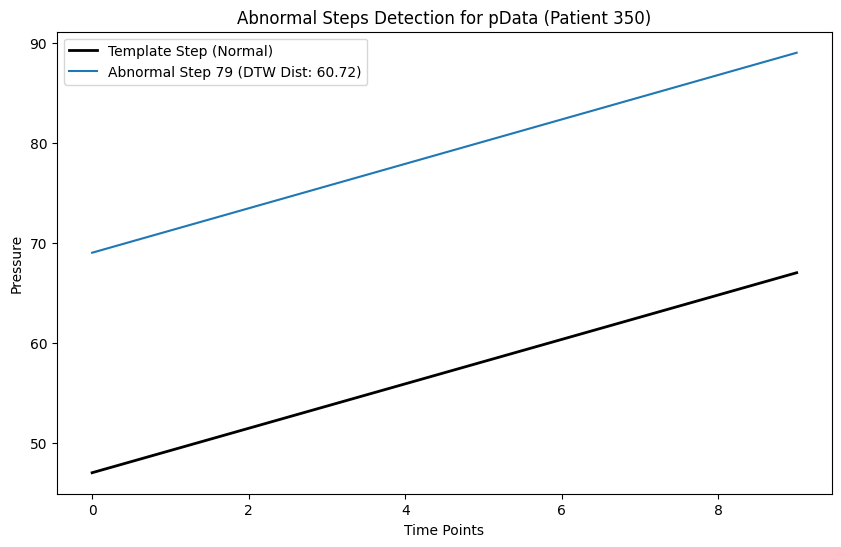

Detected 2 abnormal steps (DTW distance > 83.41).


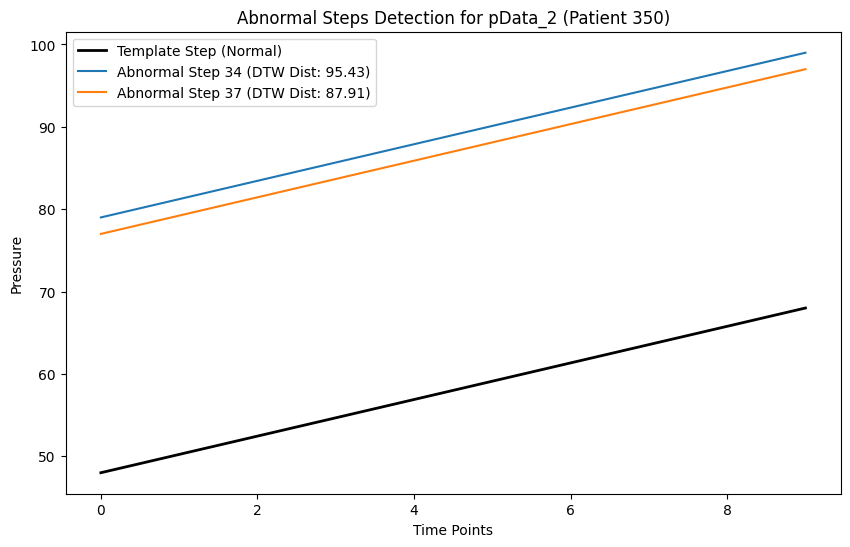

Detected 1 abnormal steps (DTW distance > 25.69).


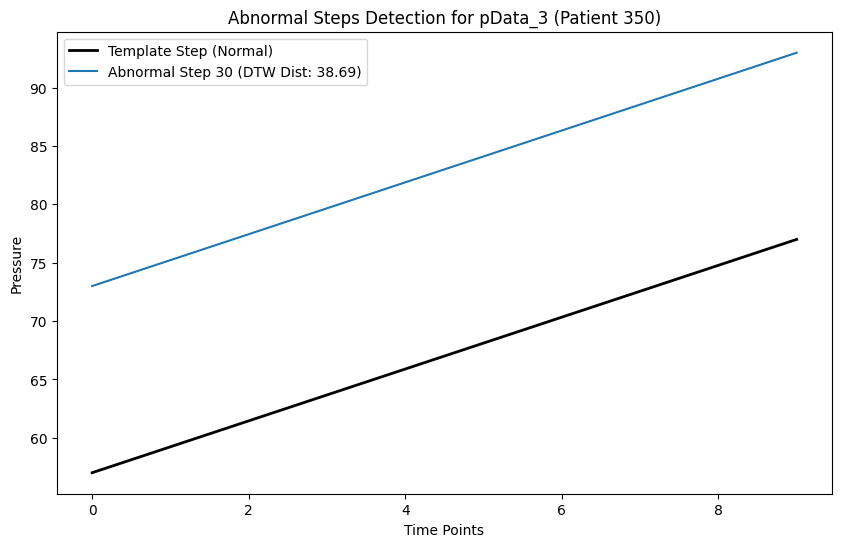

Detected 10 abnormal steps (DTW distance > 411.49).


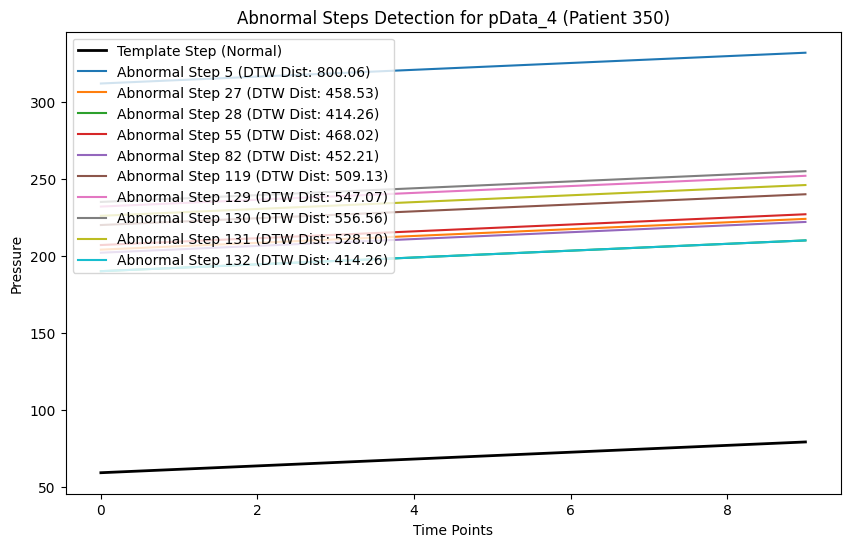

In [119]:
# Example usage:
detect_peak_pressure_abnormalities(350, "pData")
detect_peak_pressure_abnormalities(350, "pData_2")
detect_peak_pressure_abnormalities(350, "pData_3")
detect_peak_pressure_abnormalities(350, "pData_4")

# 2nd Model Development
- Extract Baseline for each metric
- Model Tuning
- Algorithm

In [120]:
import os
import pandas as pd
import numpy as np
from dtaidistance import dtw

# Directory to save baseline metrics
baseline_dir = "Baseline_Metrics"
os.makedirs(baseline_dir, exist_ok=True)

# Function to calculate baseline metrics and abnormality index for each pdata region
def calculate_baseline_and_abnormality(region_name):
    # Directory path for step metrics
    step_metrics_dir = f"Step_Segmentation_Metrics/{region_name}"
    
    all_step_data = []  # Store step data for baseline calculation

    # Iterate over each patient's step metrics
    for patient_folder in os.listdir(step_metrics_dir):
        patient_path = os.path.join(step_metrics_dir, patient_folder, "step_metrics.csv")
        if os.path.exists(patient_path):
            patient_data = pd.read_csv(patient_path)
            
            # Ensure only numerical values for processing
            if "peak_pressure" in patient_data.columns:
                all_step_data.extend(patient_data["peak_pressure"].dropna().tolist())
    
    # Calculate baseline values if data exists
    if all_step_data:
        baseline_median = np.median(all_step_data)
        baseline_mean = np.mean(all_step_data)
        baseline_std = np.std(all_step_data)

        # Calculate DTW-based abnormality threshold (upper bound)
        baseline_sequence = np.array([baseline_mean] * len(all_step_data))
        dtw_distances = [dtw.distance(np.array([step]), baseline_sequence) for step in all_step_data]
        abnormality_index = np.median(dtw_distances) + 1.5 * (np.percentile(dtw_distances, 75) - np.percentile(dtw_distances, 25))
        
        # Create baseline dataframe and save it
        baseline_df = pd.DataFrame({
            "Region": [region_name],
            "Median": [baseline_median],
            "Mean": [baseline_mean],
            "Standard_Deviation": [baseline_std],
            "Abnormality_Index": [abnormality_index]
        })
        baseline_path = os.path.join(baseline_dir, f"{region_name}_baseline.csv")
        baseline_df.to_csv(baseline_path, index=False)

        print(f"Baseline metrics for {region_name} saved to {baseline_path}")
    else:
        print(f"No valid data for {region_name} to create baseline.")

In [121]:
# Calculate baselines for each region
regions = ["pData", "pData_2", "pData_3", "pData_4"]
for region in regions:
    calculate_baseline_and_abnormality(region)

print("Baseline extraction completed for all regions.")

Baseline metrics for pData saved to Baseline_Metrics\pData_baseline.csv
Baseline metrics for pData_2 saved to Baseline_Metrics\pData_2_baseline.csv
Baseline metrics for pData_3 saved to Baseline_Metrics\pData_3_baseline.csv
Baseline metrics for pData_4 saved to Baseline_Metrics\pData_4_baseline.csv
Baseline extraction completed for all regions.


Summary statistics:
       Median       Mean  Standard_Deviation  Abnormality_Index
count     1.0   1.000000            1.000000           1.000000
mean     70.0  84.898551           36.220665         566.846435
std       NaN        NaN                 NaN                NaN
min      70.0  84.898551           36.220665         566.846435
25%      70.0  84.898551           36.220665         566.846435
50%      70.0  84.898551           36.220665         566.846435
75%      70.0  84.898551           36.220665         566.846435
max      70.0  84.898551           36.220665         566.846435


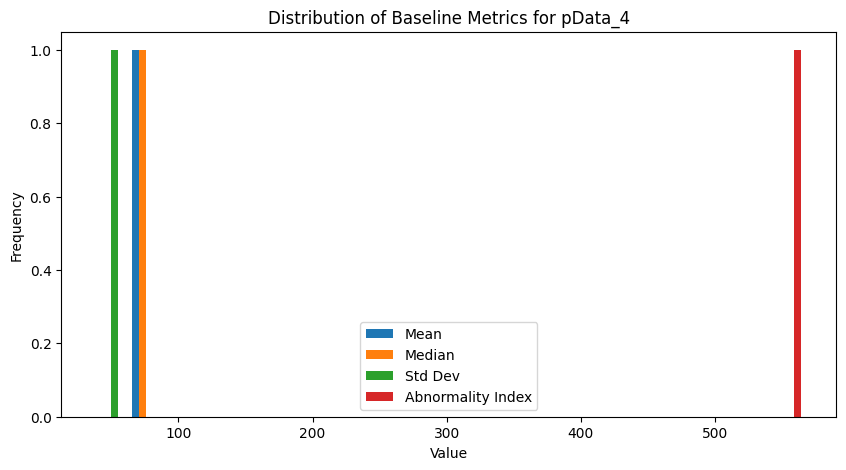

In [122]:
# Load the baseline metrics CSV
file_path = r'D:\Study\Gait\Baseline_Metrics\pData_baseline.csv'

# Read the CSV file
baseline_df = pd.read_csv(file_path)

# Summary of statistics
print("Summary statistics:")
print(baseline_df.describe())

# Histogram to show distribution
plt.figure(figsize=(10, 5))
plt.hist(baseline_df[['Mean', 'Median', 'Standard_Deviation', 'Abnormality_Index']], bins=20, label=['Mean', 'Median', 'Std Dev', 'Abnormality Index'])
plt.title('Distribution of Baseline Metrics for pData_4')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [123]:
import os
import pandas as pd
import numpy as np

def calculate_individual_baseline_metrics(input_dir, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    pdata_files = ["pData", "pData_2", "pData_3", "pData_4"]

    for pdata in pdata_files:
        pdata_path = os.path.join(input_dir, pdata)
        metric_baselines = {}

        for patient_dir in os.listdir(pdata_path):
            step_metrics_file = os.path.join(pdata_path, patient_dir, "step_metrics.csv")
            if os.path.exists(step_metrics_file):
                df = pd.read_csv(step_metrics_file)
                for metric in df.columns.drop(["step_number"], errors='ignore'):
                    if metric not in metric_baselines:
                        metric_baselines[metric] = []
                    metric_baselines[metric].extend(df[metric].dropna().values)

        for metric, values in metric_baselines.items():
            values = pd.Series(values)
            baseline_metrics = {
                "Median": values.median(),
                "Mean": values.mean(),
                "Standard_Deviation": values.std(),
                "Abnormality_Index": (values - values.mean()).abs().sum() / len(values),
            }

            # Save each metric's baseline
            baseline_df = pd.DataFrame([baseline_metrics])
            output_file = os.path.join(output_dir, f"{pdata}_{metric}_baseline.csv")
            baseline_df.to_csv(output_file, index=False)
            print(f"Saved baseline for {pdata} - {metric} to {output_file}")

# Usage
input_directory = r"D:\Study\Gait\Step_Segmentation_Metrics"
output_directory = r"D:\Study\Gait\Individual_Baseline_Metrics"
calculate_individual_baseline_metrics(input_directory, output_directory)


Saved baseline for pData - peak_pressure to D:\Study\Gait\Individual_Baseline_Metrics\pData_peak_pressure_baseline.csv
Saved baseline for pData - auc to D:\Study\Gait\Individual_Baseline_Metrics\pData_auc_baseline.csv
Saved baseline for pData - rise_gradient to D:\Study\Gait\Individual_Baseline_Metrics\pData_rise_gradient_baseline.csv
Saved baseline for pData - descent_gradient to D:\Study\Gait\Individual_Baseline_Metrics\pData_descent_gradient_baseline.csv
Saved baseline for pData - variance to D:\Study\Gait\Individual_Baseline_Metrics\pData_variance_baseline.csv
Saved baseline for pData - skewness to D:\Study\Gait\Individual_Baseline_Metrics\pData_skewness_baseline.csv
Saved baseline for pData - kurtosis to D:\Study\Gait\Individual_Baseline_Metrics\pData_kurtosis_baseline.csv
Saved baseline for pData_2 - peak_pressure to D:\Study\Gait\Individual_Baseline_Metrics\pData_2_peak_pressure_baseline.csv
Saved baseline for pData_2 - auc to D:\Study\Gait\Individual_Baseline_Metrics\pData_2_au

## Liner Regresion Model

In [124]:
import os
import pandas as pd
from sklearn.linear_model import LinearRegression
import joblib

def build_and_save_models(baseline_dir, metrics_dir, model_output_dir):
    os.makedirs(model_output_dir, exist_ok=True)
    pdata_regions = ["pData", "pData_2", "pData_3", "pData_4"]

    for pdata_region in pdata_regions:
        pdata_baseline_files = [
            f for f in os.listdir(baseline_dir) if f.startswith(pdata_region) and f.endswith("_baseline.csv")
        ]
        for baseline_file in pdata_baseline_files:
            metric_name = baseline_file.replace(f"{pdata_region}_", "").replace("_baseline.csv", "")

            # Load baseline
            baseline_path = os.path.join(baseline_dir, baseline_file)
            baseline_df = pd.read_csv(baseline_path)

            # Extract baseline values
            mean_value = baseline_df["Mean"].values[0]
            std_dev = baseline_df["Standard_Deviation"].values[0]

            # Prepare training data
            metric_path = os.path.join(metrics_dir, pdata_region)
            X_train = []
            y_train = []

            for patient_dir in os.listdir(metric_path):
                step_metrics_file = os.path.join(metric_path, patient_dir, "step_metrics.csv")
                if os.path.exists(step_metrics_file):
                    step_metrics_df = pd.read_csv(step_metrics_file)
                    if metric_name in step_metrics_df.columns:
                        values = step_metrics_df[metric_name].dropna().values.reshape(-1, 1)
                        baseline_comparison = (values - mean_value) / std_dev
                        X_train.extend(values)  # Raw metric values
                        y_train.extend(baseline_comparison)  # Normalized differences

            # Train model (simple linear regression for example)
            if len(X_train) > 0 and len(y_train) > 0:
                model = LinearRegression()
                model.fit(pd.DataFrame(X_train), pd.DataFrame(y_train))
                print(f"Trained model for {pdata_region} - {metric_name}")

                # Save model
                model_output_path = os.path.join(model_output_dir, f"{pdata_region}_{metric_name}_model.joblib")
                joblib.dump(model, model_output_path)
                print(f"Model saved at {model_output_path}")




In [125]:
# Usage
baseline_directory = r"D:\Study\Gait\Individual_Baseline_Metrics"
metrics_directory = r"D:\Study\Gait\Step_Segmentation_Metrics"
model_output_directory = r"D:\Study\Gait\Models"
build_and_save_models(baseline_directory, metrics_directory, model_output_directory)

Trained model for pData - auc
Model saved at D:\Study\Gait\Models\pData_auc_model.joblib
Trained model for pData - descent_gradient
Model saved at D:\Study\Gait\Models\pData_descent_gradient_model.joblib
Trained model for pData - kurtosis
Model saved at D:\Study\Gait\Models\pData_kurtosis_model.joblib
Trained model for pData - peak_pressure
Model saved at D:\Study\Gait\Models\pData_peak_pressure_model.joblib
Trained model for pData - rise_gradient
Model saved at D:\Study\Gait\Models\pData_rise_gradient_model.joblib
Trained model for pData - skewness
Model saved at D:\Study\Gait\Models\pData_skewness_model.joblib
Trained model for pData - variance
Model saved at D:\Study\Gait\Models\pData_variance_model.joblib
Trained model for pData_2 - auc
Model saved at D:\Study\Gait\Models\pData_2_auc_model.joblib
Trained model for pData_2 - descent_gradient
Model saved at D:\Study\Gait\Models\pData_2_descent_gradient_model.joblib
Trained model for pData_2 - kurtosis
Model saved at D:\Study\Gait\Mod

#### Testing Random Forest if good or not

In [126]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

def train_random_forest_with_visualizations(baseline_path, step_metrics_path):
    # Load baseline and step metrics
    baseline_df = pd.read_csv(baseline_path)
    step_metrics_df = pd.read_csv(step_metrics_path)

    # Extract relevant baseline values (for a single metric)
    mean_baseline = baseline_df['Mean'].values[0]
    std_baseline = baseline_df['Standard_Deviation'].values[0]

    # Extract step metric values
    step_metrics_df = step_metrics_df[['step_number', 'peak_pressure']].dropna()

    # Create feature (difference from baseline)
    step_metrics_df['pressure_diff_from_baseline'] = np.abs(step_metrics_df['peak_pressure'] - mean_baseline) / std_baseline

    # Label abnormality: greater deviation gets a label of 1 (abnormal)
    threshold = 0.5  # Threshold for abnormal deviation
    step_metrics_df['label'] = (step_metrics_df['pressure_diff_from_baseline'] > threshold).astype(int)

    # Prepare features and labels
    X = step_metrics_df[['pressure_diff_from_baseline']]
    y = step_metrics_df['label']

    # Train RandomForestClassifier
    clf = RandomForestClassifier(n_estimators=100, random_state=42)
    clf.fit(X, y)

    # Visualize the training data
    plt.figure(figsize=(10, 6))
    plt.scatter(step_metrics_df['step_number'], step_metrics_df['pressure_diff_from_baseline'], c=y, cmap='coolwarm', label='Step Difference from Baseline')
    plt.axhline(y=threshold, color='r', linestyle='--', label='Abnormality Threshold')
    plt.title('Pressure Difference from Baseline for pData_4')
    plt.xlabel('Step Number')
    plt.ylabel('Pressure Difference (normalized)')
    plt.legend()
    plt.show()

    print("Model training completed.")



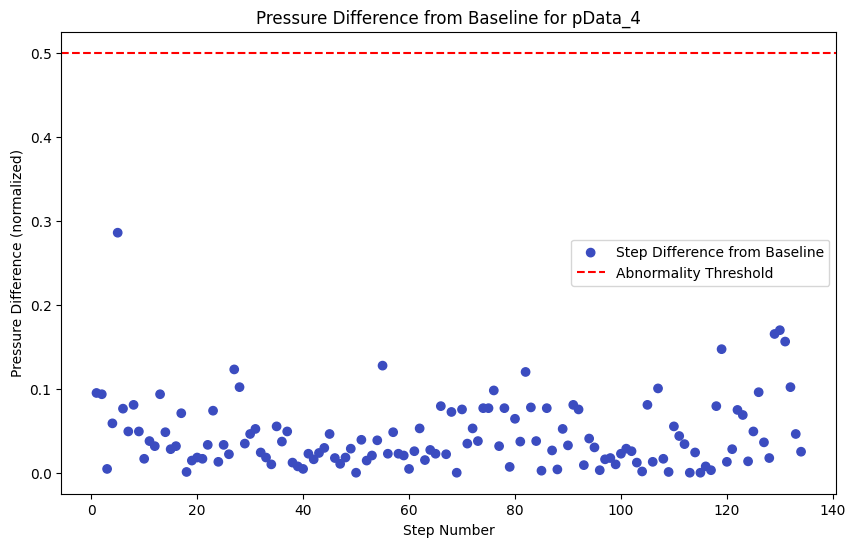

Model training completed.


In [127]:
# Example usage
baseline_path = r"D:\Study\Gait\Individual_Baseline_Metrics\pData_4_peak_pressure_baseline.csv"
step_metrics_path = r"D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_350\step_metrics.csv"

train_random_forest_with_visualizations(baseline_path, step_metrics_path)


## Evaluation of Model

In [128]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

def evaluate_linear_regression_model(baseline_path, step_metrics_path):
    # Load baseline and step metrics
    baseline_df = pd.read_csv(baseline_path)
    step_metrics_df = pd.read_csv(step_metrics_path)

    # Extract peak pressure baseline mean
    baseline_mean = baseline_df["Mean"].values[0]

    # Calculate differences from baseline
    actual_values = step_metrics_df["peak_pressure"].values
    differences_from_baseline = actual_values - baseline_mean

    # Predicted values from Linear Regression (assume model predicts the mean as baseline)
    predicted_values = np.full_like(differences_from_baseline, baseline_mean)

    # Calculate metrics
    r2 = r2_score(actual_values, predicted_values)
    mse = mean_squared_error(actual_values, predicted_values)
    mae = mean_absolute_error(actual_values, predicted_values)

    print(f"Model Performance for {step_metrics_path.split('/')[-1]}")
    print(f"R² Score: {r2:.4f}")
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")

    # Plot actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(range(len(actual_values)), actual_values, label="Actual Values", color='blue', alpha=0.6)
    plt.plot(range(len(predicted_values)), predicted_values, label="Predicted Values (Baseline Mean)", color='red')
    plt.title(f"Actual vs Predicted Step Values for {step_metrics_path.split('/')[-1]}")
    plt.xlabel("Step Number")
    plt.ylabel("Pressure Value")
    plt.legend()
    plt.show()


Model Performance for D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_350\step_metrics.csv
R² Score: -0.0240
Mean Squared Error (MSE): 1656.8987
Mean Absolute Error (MAE): 29.7970


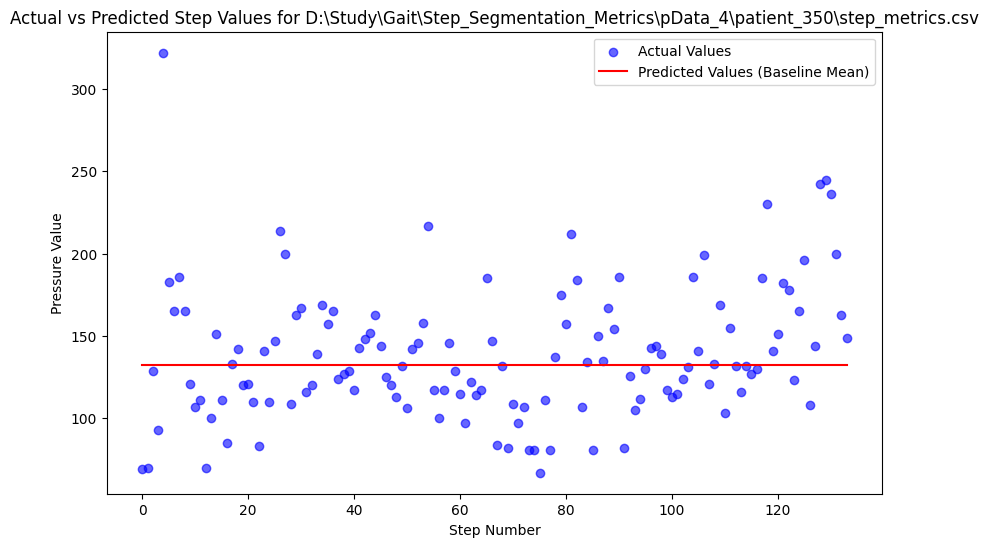

In [129]:
# Example usage
baseline_path = r"D:\Study\Gait\Individual_Baseline_Metrics\pData_4_peak_pressure_baseline.csv"
step_metrics_path = r"D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_350\step_metrics.csv"

evaluate_linear_regression_model(baseline_path, step_metrics_path)


In [130]:
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def load_and_predict_with_model(baseline_model_path, step_metrics_path, metric):
    # Load pre-trained model
    model = joblib.load(baseline_model_path)

    # Load step metrics
    step_metrics_df = pd.read_csv(step_metrics_path)
    if metric not in step_metrics_df.columns:
        print(f"Error: {metric} not found in step metrics.")
        return
    
    # Extract the relevant step data
    X_test = step_metrics_df[['step_number']].values.reshape(-1, 1)
    y_actual = step_metrics_df[metric].values

    # Predict using the model
    y_pred = model.predict(X_test)

    # Calculate performance metrics
    r2 = r2_score(y_actual, y_pred)
    mse = mean_squared_error(y_actual, y_pred)
    mae = mean_absolute_error(y_actual, y_pred)
    
    print(f"Model Performance for {step_metrics_path}")
    print(f"R² Score: {r2:.4f}")
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")

    # Visualization
    plt.figure(figsize=(10, 6))
    plt.scatter(step_metrics_df['step_number'], y_actual, label='Actual Values', color='blue', alpha=0.6)
    plt.plot(step_metrics_df['step_number'], y_pred, label='Predicted Values', color='red', linewidth=2)
    plt.title(f"Actual vs Predicted Step Values for {step_metrics_path}")
    plt.xlabel("Step Number")
    plt.ylabel(f"{metric.capitalize()} Value")
    plt.legend()
    plt.show()




Model Performance for D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_350\step_metrics.csv
R² Score: -11.8599
Mean Squared Error (MSE): 20807.7265
Mean Absolute Error (MAE): 138.5303


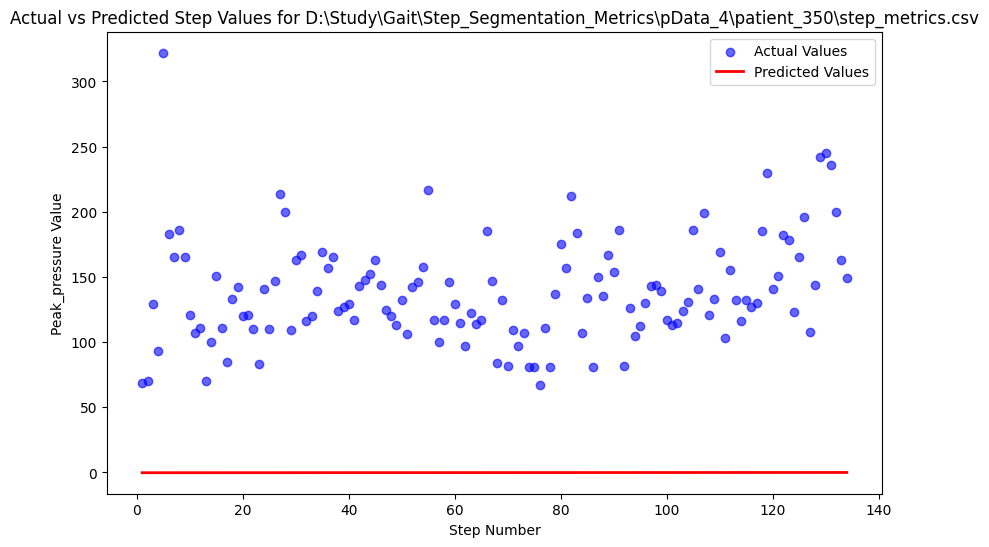

In [131]:
# Example usage:
baseline_model_path = r"D:\Study\Gait\Models\pData_4_peak_pressure_model.joblib"  # Replace with the appropriate model path
step_metrics_path = r"D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_350\step_metrics.csv"  # Replace with your step metrics file
metric = "peak_pressure"  # Metric to evaluate

load_and_predict_with_model(baseline_model_path, step_metrics_path, metric)

# Switch to Random Forest

In [132]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import joblib

def train_random_forest_model(baseline_path, step_metrics_path):
    # Load baseline and step metrics CSV
    baseline_df = pd.read_csv(baseline_path)
    step_metrics_df = pd.read_csv(step_metrics_path)
    
    # Extract baseline mean for 'peak_pressure'
    baseline_mean = baseline_df['Mean'].values[0]
    
    # Feature (step numbers) and labels (pressure values)
    step_numbers = step_metrics_df['step_number'].values.reshape(-1, 1)
    pressure_values = step_metrics_df['peak_pressure'].values

    # Calculate the difference from baseline
    differences_from_baseline = pressure_values - baseline_mean

    # Train-Test Split (80% train, 20% test)
    train_size = int(0.8 * len(step_numbers))
    X_train, X_test = step_numbers[:train_size], step_numbers[train_size:]
    y_train, y_test = differences_from_baseline[:train_size], differences_from_baseline[train_size:]
    
    # Model training
    rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_regressor.fit(X_train, y_train)
    
    # Predictions
    y_pred = rf_regressor.predict(X_test)
    
    # Performance metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Model Performance for {step_metrics_path}")
    print(f"R² Score: {r2:.4f}")
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    
    # Visualization of actual vs predicted
    plt.figure(figsize=(10, 6))
    plt.scatter(X_test, y_test, color='blue', label='Actual Values')
    plt.scatter(X_test, y_pred, color='red', label='Predicted Values')
    plt.title(f"Actual vs Predicted Step Values for {step_metrics_path}")
    plt.xlabel('Step Number')
    plt.ylabel('Peak Pressure Difference from Baseline')
    plt.legend()
    plt.show()
    
    # Save the model
    joblib.dump(rf_regressor, 'rf_peak_pressure_model.joblib')
    print("Model saved as rf_peak_pressure_model.joblib.")

Model Performance for D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_350\step_metrics.csv
R² Score: -0.1467
Mean Squared Error (MSE): 1908.2668
Mean Absolute Error (MAE): 37.9496


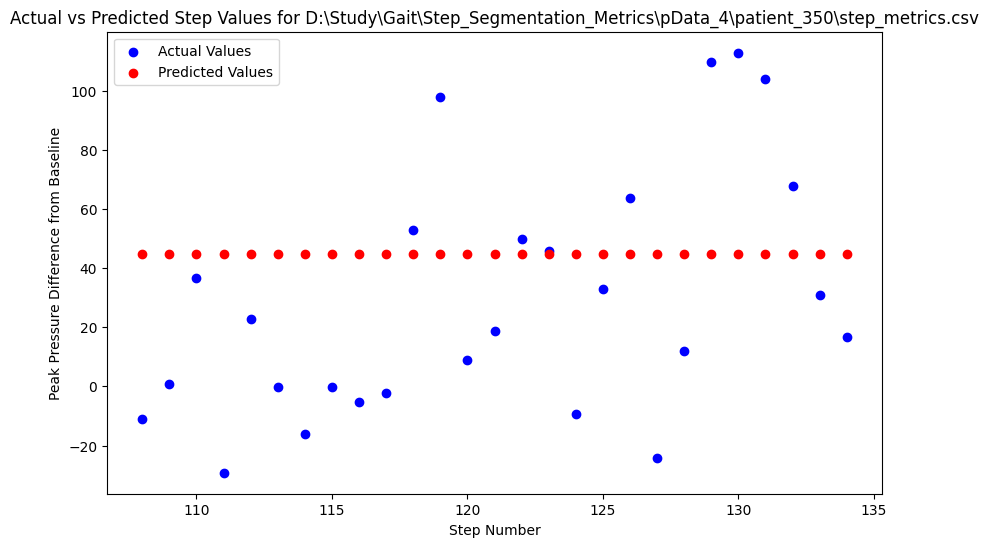

Model saved as rf_peak_pressure_model.joblib.


In [133]:
# Example usage
baseline_path = r"D:\Study\Gait\Individual_Baseline_Metrics\pData_4_peak_pressure_baseline.csv"
step_metrics_path = r"D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_350\step_metrics.csv"

train_random_forest_model(baseline_path, step_metrics_path)


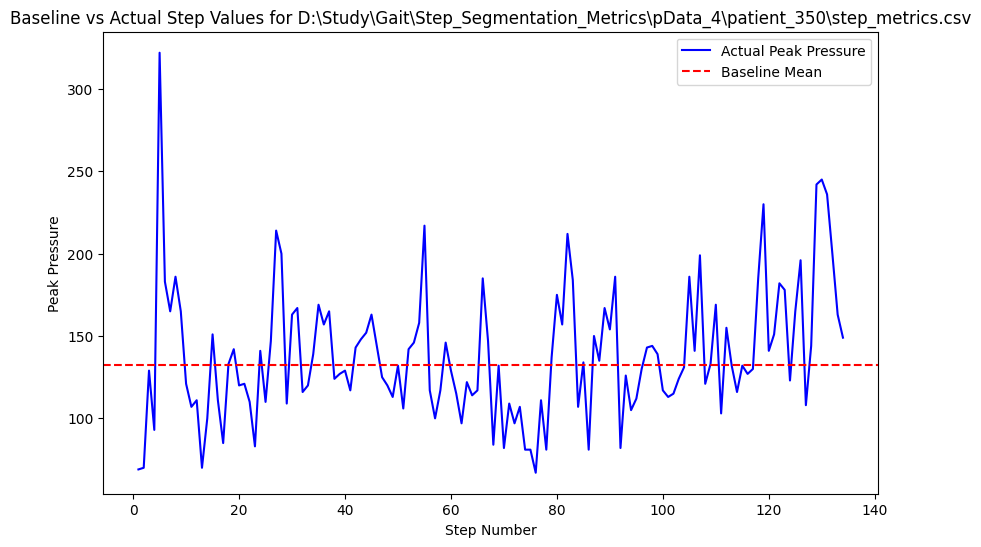

In [134]:
def visualize_baseline_vs_actual(baseline_path, step_metrics_path):
    # Load baseline and step metrics CSV
    baseline_df = pd.read_csv(baseline_path)
    step_metrics_df = pd.read_csv(step_metrics_path)
    
    # Baseline mean for peak pressure
    baseline_mean = baseline_df['Mean'].values[0]
    
    # Plot actual vs baseline mean
    plt.figure(figsize=(10, 6))
    plt.plot(step_metrics_df['step_number'], step_metrics_df['peak_pressure'], label='Actual Peak Pressure', color='blue')
    plt.axhline(y=baseline_mean, color='red', linestyle='--', label='Baseline Mean')
    plt.title(f"Baseline vs Actual Step Values for {step_metrics_path}")
    plt.xlabel('Step Number')
    plt.ylabel('Peak Pressure')
    plt.legend()
    plt.show()

# Example usage
visualize_baseline_vs_actual(baseline_path, step_metrics_path)


DTW Distance: 471.1947


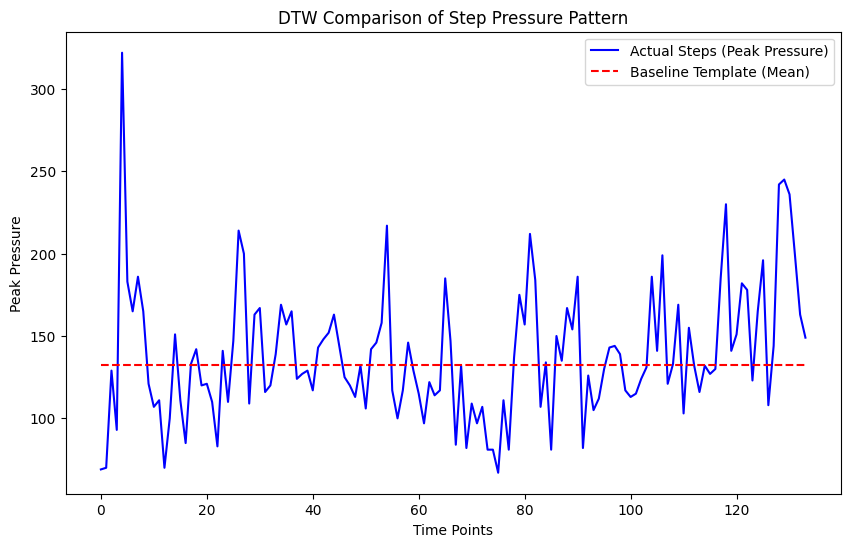

In [135]:
from dtaidistance import dtw
import numpy as np

def dtw_visualization(baseline_path, step_metrics_path):
    # Load baseline and step metrics CSV
    baseline_df = pd.read_csv(baseline_path)
    step_metrics_df = pd.read_csv(step_metrics_path)
    
    # Extract baseline mean as the template pattern
    baseline_template = [baseline_df['Mean'].values[0]] * len(step_metrics_df)

    # Actual step values
    actual_steps = step_metrics_df['peak_pressure'].values

    # DTW distance and alignment
    dtw_distance = dtw.distance(actual_steps, baseline_template)
    alignment = dtw.warping_paths(actual_steps, baseline_template)

    print(f"DTW Distance: {dtw_distance:.4f}")
    
    # Plot DTW alignment
    plt.figure(figsize=(10, 6))
    plt.plot(actual_steps, label="Actual Steps (Peak Pressure)", color='blue')
    plt.plot(baseline_template, label="Baseline Template (Mean)", color='red', linestyle='--')
    plt.title("DTW Comparison of Step Pressure Pattern")
    plt.xlabel("Time Points")
    plt.ylabel("Peak Pressure")
    plt.legend()
    plt.show()

# Example usage
dtw_visualization(baseline_path, step_metrics_path)


In [136]:
import matplotlib.pyplot as plt
import pandas as pd
from joblib import load

def visualize_all_metrics_for_patient(model_directory, step_metrics_path, pdata_region):
    # Metrics to visualize
    metrics = ['peak_pressure', 'auc', 'rise_gradient', 'descent_gradient', 'variance', 'skewness', 'kurtosis']
    
    # Load step metrics for patient 350
    step_metrics_df = pd.read_csv(step_metrics_path)
    step_numbers = step_metrics_df['step_number']

    # Create a subplot grid
    plt.figure(figsize=(15, 20))
    for i, metric in enumerate(metrics, 1):
        # Load the corresponding model
        model_path = f"{model_directory}/{pdata_region}_{metric}_model.joblib"
        model = load(model_path)
        
        # Actual and predicted values
        actual_values = step_metrics_df[metric].values.reshape(-1, 1)
        predicted_values = model.predict(actual_values)
        
        # Plot
        plt.subplot(4, 2, i)
        plt.scatter(step_numbers, actual_values, label=f'Actual {metric}', color='blue', alpha=0.7)
        plt.plot(step_numbers, predicted_values, label=f'Predicted {metric} (Linear Regression)', color='orange', linewidth=2)
        plt.title(f"{metric.capitalize()} Comparison for {pdata_region} (Patient 350)")
        plt.xlabel('Step Number')
        plt.ylabel(metric.replace('_', ' ').capitalize())
        plt.legend()

    plt.tight_layout()
    plt.show()




# Random Forest Model for Each Metrics

In [137]:
def train_and_save_rf_models(min_steps=5):
    for pdata_region in pdata_regions:
        for metric in metrics:
            baseline_path = os.path.join(baseline_dir, f"{pdata_region}_{metric}_baseline.csv")
            patient_dirs = [d for d in os.listdir(os.path.join(step_metrics_dir, pdata_region)) if os.path.isdir(os.path.join(step_metrics_dir, pdata_region, d))]
            
            for patient in patient_dirs:
                step_metrics_path = os.path.join(step_metrics_dir, pdata_region, patient, "step_metrics.csv")
                
                if os.path.exists(baseline_path) and os.path.exists(step_metrics_path):
                    # Load baseline and step metrics CSV
                    baseline_df = pd.read_csv(baseline_path)
                    step_metrics_df = pd.read_csv(step_metrics_path)
                    
                    if step_metrics_df.empty:
                        print(f"Skipping {step_metrics_path} as it has no data.")
                        continue

                    # Handle NaN values
                    step_metrics_df = step_metrics_df.dropna(subset=[metric])
                    
                    if step_metrics_df.empty:
                        print(f"Skipping {step_metrics_path} as all values for {metric} are NaN.")
                        continue

                    # Extract baseline mean for the current metric
                    baseline_mean = baseline_df['Mean'].values[0]
                    
                    # Step features and actual values
                    step_numbers = step_metrics_df['step_number'].values.reshape(-1, 1)
                    actual_values = step_metrics_df[metric].values

                    # Check if the dataset has enough samples
                    if len(step_numbers) < min_steps:
                        print(f"Skipping {pdata_region} - {patient}: Not enough steps for training.")
                        continue
                    
                    # Calculate differences from baseline
                    differences_from_baseline = actual_values - baseline_mean

                    # Remove NaNs after baseline difference calculation
                    valid_indices = ~np.isnan(differences_from_baseline)
                    step_numbers = step_numbers[valid_indices]
                    differences_from_baseline = differences_from_baseline[valid_indices]

                    if len(step_numbers) == 0:
                        print(f"Skipping {pdata_region} - {patient}: All data became NaN after baseline subtraction.")
                        continue

                    # Train-Test Split (80% training, 20% testing)
                    train_size = int(0.8 * len(step_numbers))
                    X_train, X_test = step_numbers[:train_size], step_numbers[train_size:]
                    y_train, y_test = differences_from_baseline[:train_size], differences_from_baseline[train_size:]

                    # Train Random Forest model
                    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
                    rf_model.fit(X_train, y_train)

                    # Predict and evaluate
                    y_pred = rf_model.predict(X_test)
                    mse = mean_squared_error(y_test, y_pred)
                    mae = mean_absolute_error(y_test, y_pred)
                    r2 = r2_score(y_test, y_pred)
                    
                    # Visualization
                    plt.figure(figsize=(8, 5))
                    plt.scatter(X_test, y_test, color='blue', label='Actual Values')
                    plt.scatter(X_test, y_pred, color='red', label='Predicted Values', marker='x')
                    plt.title(f"Actual vs Predicted {metric} for {pdata_region} - {patient}")
                    plt.xlabel('Step Number')
                    plt.ylabel(f'{metric.capitalize()} Value')
                    plt.legend()
                    plt.show()

                    # Save model
                    model_filename = f"{pdata_region}_{metric}_{patient}_rf_model.joblib"
                    model_save_path = os.path.join(model_output_dir, model_filename)
                    joblib.dump(rf_model, model_save_path)
                    
                    print(f"Model saved: {model_save_path}")
                    print(f"R² Score: {r2:.4f}, MSE: {mse:.4f}, MAE: {mae:.4f}")


In [138]:
# Example: Loading a saved model
from joblib import load

model_path = r"D:\Study\Gait\Random_Forest_Models\pData_4_peak_pressure_patient_350_rf_model.joblib"
loaded_model = load(model_path)

# Evaluate Random Forest Model Performance

# Random Forest 2

In [139]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import joblib
import os

def train_random_forest_baseline_models():
    # Define pdata regions and metrics
    pdata_regions = ["pData", "pData_2", "pData_3", "pData_4"]
    metrics = ['peak_pressure', 'auc', 'rise_gradient', 'descent_gradient', 'variance', 'skewness', 'kurtosis']

    for pdata_region in pdata_regions:
        print(f"\n--- Training Baseline Models for {pdata_region} ---")
        for metric in metrics:
            baseline_path = f"D:/Study/Gait/Individual_Baseline_Metrics/{pdata_region}_{metric}_baseline.csv"

            if not os.path.exists(baseline_path):
                print(f"Skipping {metric} for {pdata_region} due to missing file.")
                continue

            # Load baseline CSV
            baseline_df = pd.read_csv(baseline_path)

            # Extract mean, median, std deviation (used as features) and the abnormality index as the target
            feature_names = ['Median', 'Mean', 'Standard_Deviation']
            target_name = 'Abnormality_Index'

            # Features and target
            X = baseline_df[feature_names].values.reshape(-1, 3)  # 3 features: Median, Mean, Std Dev
            y = baseline_df[target_name].values  # Abnormality Index as target

            # Train Random Forest Regressor
            rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
            rf_regressor.fit(X, y)

            # Save the model
            model_save_dir = f"D:/Study/Gait/Models/{pdata_region}"
            os.makedirs(model_save_dir, exist_ok=True)
            model_save_path = f"{model_save_dir}/{metric}_rf_baseline_model.joblib"
            joblib.dump(rf_regressor, model_save_path)
            print(f"{metric.capitalize()} Random Forest Baseline Model saved at: {model_save_path}\n")


In [140]:
# Run the function
train_random_forest_baseline_models()


--- Training Baseline Models for pData ---
Peak_pressure Random Forest Baseline Model saved at: D:/Study/Gait/Models/pData/peak_pressure_rf_baseline_model.joblib

Auc Random Forest Baseline Model saved at: D:/Study/Gait/Models/pData/auc_rf_baseline_model.joblib

Rise_gradient Random Forest Baseline Model saved at: D:/Study/Gait/Models/pData/rise_gradient_rf_baseline_model.joblib

Descent_gradient Random Forest Baseline Model saved at: D:/Study/Gait/Models/pData/descent_gradient_rf_baseline_model.joblib

Variance Random Forest Baseline Model saved at: D:/Study/Gait/Models/pData/variance_rf_baseline_model.joblib

Skewness Random Forest Baseline Model saved at: D:/Study/Gait/Models/pData/skewness_rf_baseline_model.joblib

Kurtosis Random Forest Baseline Model saved at: D:/Study/Gait/Models/pData/kurtosis_rf_baseline_model.joblib


--- Training Baseline Models for pData_2 ---
Peak_pressure Random Forest Baseline Model saved at: D:/Study/Gait/Models/pData_2/peak_pressure_rf_baseline_model.

# comparison against new patient data

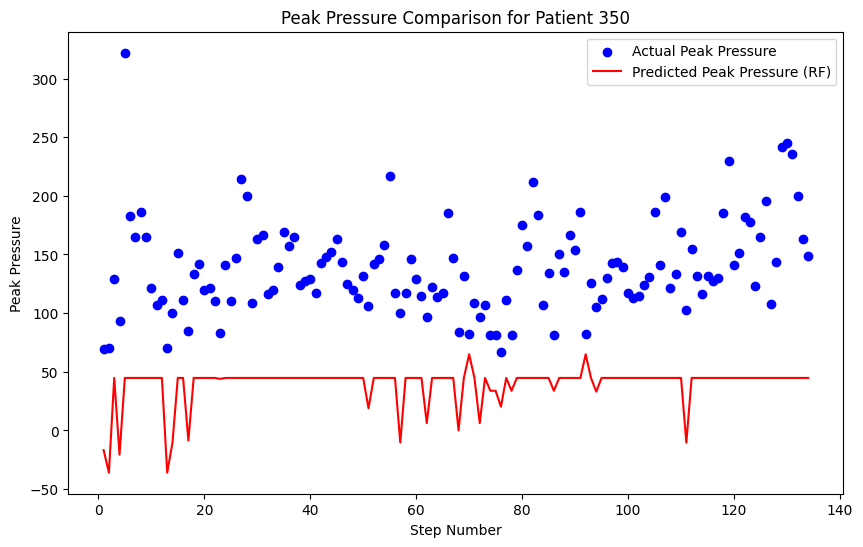

In [141]:
import pandas as pd
import joblib
import matplotlib.pyplot as plt

def compare_peak_pressure(patient_id):
    # File paths
    model_path = rf"D:\Study\Gait\Random_Forest_Models\pData_4_peak_pressure_patient_{patient_id}_rf_model.joblib"
    step_metrics_path = rf"D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_{patient_id}\step_metrics.csv"
    
    # Load the model and step metrics
    rf_model = joblib.load(model_path)
    step_data = pd.read_csv(step_metrics_path)
    
    # Extract peak pressure values
    actual_peak_pressure = step_data['peak_pressure'].values.reshape(-1, 1)
    step_numbers = step_data['step_number']
    
    # Make predictions using the random forest model
    predicted_peak_pressure = rf_model.predict(actual_peak_pressure)
    
    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(step_numbers, actual_peak_pressure, label="Actual Peak Pressure", color='blue')
    plt.plot(step_numbers, predicted_peak_pressure, label="Predicted Peak Pressure (RF)", color='red')
    plt.xlabel("Step Number")
    plt.ylabel("Peak Pressure")
    plt.title(f"Peak Pressure Comparison for Patient {patient_id}")
    plt.legend()
    plt.show()

# Example usage
compare_peak_pressure(350)


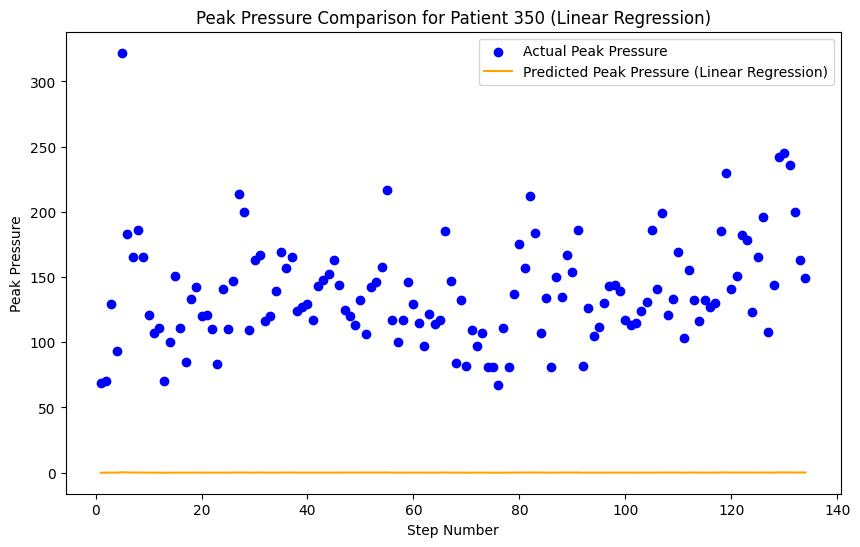

In [142]:
import pandas as pd
import joblib
import matplotlib.pyplot as plt

def compare_peak_pressure_linear(patient_id):
    # File paths
    model_path = rf"D:\Study\Gait\Models\pData_4_peak_pressure_model.joblib"
    step_metrics_path = rf"D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_{patient_id}\step_metrics.csv"
    
    # Load the linear regression model and step metrics
    lr_model = joblib.load(model_path)
    step_data = pd.read_csv(step_metrics_path)
    
    # Extract peak pressure and step number
    actual_peak_pressure = step_data[['peak_pressure']].values  # Reshape for prediction
    step_numbers = step_data['step_number']
    
    # Predict peak pressure using the linear regression model
    predicted_peak_pressure = lr_model.predict(actual_peak_pressure)
    
    # Plot actual vs predicted peak pressure values
    plt.figure(figsize=(10, 6))
    plt.scatter(step_numbers, actual_peak_pressure, label="Actual Peak Pressure", color='blue')
    plt.plot(step_numbers, predicted_peak_pressure, label="Predicted Peak Pressure (Linear Regression)", color='orange')
    plt.xlabel("Step Number")
    plt.ylabel("Peak Pressure")
    plt.title(f"Peak Pressure Comparison for Patient {patient_id} (Linear Regression)")
    plt.legend()
    plt.show()

# Example usage
compare_peak_pressure_linear(350)


# Idealized Gait Pattern

In [143]:
import pandas as pd
import numpy as np
from dtaidistance import dtw
import matplotlib.pyplot as plt

def compare_steps_to_template(step_metrics_path, template_step_series):
    # Load step metrics
    df = pd.read_csv(step_metrics_path)
    step_numbers = df['step_number']
    peak_pressure_series = df['peak_pressure'].values.reshape(-1, 1)

    # Compare each step's sequence to the template using DTW
    dtw_distances = []
    for step in peak_pressure_series:
        distance = dtw.distance(template_step_series, step)
        dtw_distances.append(distance)

    # Visualize DTW distances
    plt.figure(figsize=(10, 6))
    plt.plot(step_numbers, dtw_distances, label='DTW Distance to Template', color='blue')
    plt.axhline(y=np.mean(dtw_distances) + 2 * np.std(dtw_distances), color='red', linestyle='--', label='Abnormality Threshold')
    plt.title('DTW Comparison with Template Step')
    plt.xlabel('Step Number')
    plt.ylabel('DTW Distance')
    plt.legend()
    plt.show()

# Load data
df = pd.read_csv(r"D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_350\step_metrics.csv")




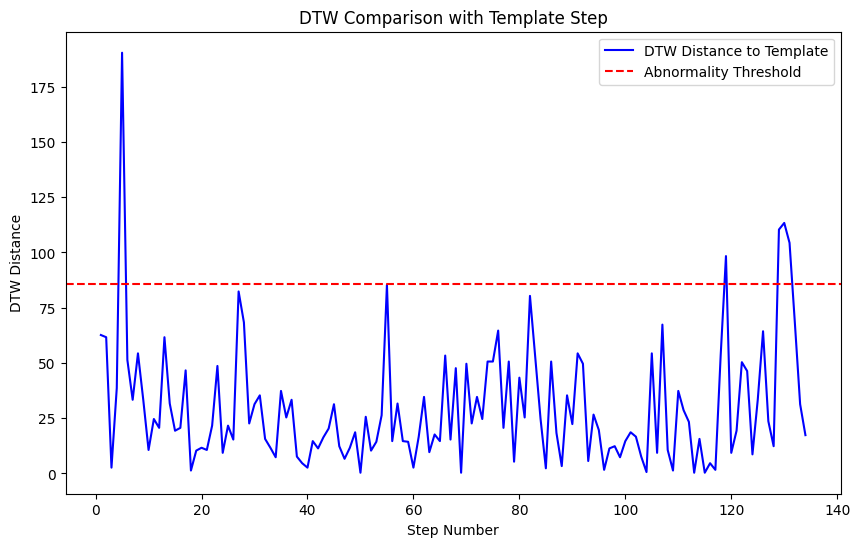

In [144]:
# Create template as the **mean sequence** (averaging each time point) over the first 20 steps
template_step_series = np.mean(df['peak_pressure'].values[:20].reshape(-1, 1), axis=0)

compare_steps_to_template(r"D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_350\step_metrics.csv", template_step_series)

In [145]:
from sklearn.cluster import DBSCAN
import seaborn as sns

def detect_gait_clusters(step_metrics_path):
    # Load step metrics
    df = pd.read_csv(step_metrics_path)
    features = df[['peak_pressure', 'variance', 'auc']].fillna(0).values

    # Apply clustering
    clustering = DBSCAN(eps=0.5, min_samples=5).fit(features)
    df['cluster'] = clustering.labels_

    # Visualize clusters
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df['peak_pressure'], y=df['auc'], hue=df['cluster'], palette='deep')
    plt.title('Clustering of Gait Steps (DBSCAN)')
    plt.xlabel('Peak Pressure')
    plt.ylabel('AUC')
    plt.show()


###  Create Idealized Baseline from Individual Baseline Metrics
- This function aggregates baseline data across metrics to form an idealized "healthy" step for comparisons.

In [146]:
import pandas as pd
import numpy as np

def create_idealized_baseline(individual_baseline_dir):
    metrics = ['peak_pressure', 'auc', 'rise_gradient', 'descent_gradient', 'variance', 'skewness', 'kurtosis']
    idealized_baseline = {}

    for metric in metrics:
        baseline_file = f"{individual_baseline_dir}/pData_4_{metric}_baseline.csv"
        baseline_df = pd.read_csv(baseline_file)
        
        # Aggregate statistics for "idealized gait"
        median = baseline_df['Median'].values[0]
        mean = baseline_df['Mean'].values[0]
        std_dev = baseline_df['Standard_Deviation'].values[0]
        idealized_baseline[metric] = {
            'mean': mean,
            'std_dev': std_dev,
            'median': median
        }
    
    return idealized_baseline

# Example usage
baseline_metrics_path = "D:/Study/Gait/Individual_Baseline_Metrics"
idealized_baseline = create_idealized_baseline(baseline_metrics_path)


###  Calculate Step-wise Metric Differences
- This function calculates differences between each patient’s step and the idealized values


In [147]:
def calculate_stepwise_differences(step_metrics_path, idealized_baseline):
    step_metrics_df = pd.read_csv(step_metrics_path)
    differences = {}

    for metric in idealized_baseline.keys():
        ideal_mean = idealized_baseline[metric]['mean']
        step_values = step_metrics_df[metric].fillna(0).values
        differences[metric] = abs(step_values - ideal_mean) / idealized_baseline[metric]['std_dev']  # Z-score
    
    return pd.DataFrame(differences)

# Example usage
step_metrics_path = "D:/Study/Gait/Step_Segmentation_Metrics/pData_4/patient_350/step_metrics.csv"
step_differences_df = calculate_stepwise_differences(step_metrics_path, idealized_baseline)


###  DTW Comparison for Time-Series Pattern Alignment
- Compare each step using DTW to check the temporal alignment of the patient's steps with the baseline patterns.

In [148]:
from dtaidistance import dtw
import numpy as np

def dtw_comparison_with_baseline(step_metrics_path, idealized_baseline, window_size=5):
    step_metrics_df = pd.read_csv(step_metrics_path)
    peak_pressure = step_metrics_df['peak_pressure'].fillna(0).values

    # Construct sequences (sliding window)
    sequences = [peak_pressure[i:i + window_size] for i in range(len(peak_pressure) - window_size + 1)]
    
    # Template sequence (idealized step)
    template_step = np.full(window_size, idealized_baseline['peak_pressure']['mean'])

    # Compute DTW distances
    dtw_distances = [dtw.distance(template_step, seq) for seq in sequences]

    return dtw_distances

# Example usage
dtw_distances = dtw_comparison_with_baseline(step_metrics_path, idealized_baseline)


### Final Gait Consistency Algorithm
- combines the z-scores and DTW distances into a "Gait Consistency Score".

In [149]:
def gait_consistency_score(step_metrics_path, idealized_baseline, window_size=5):
    step_differences_df = pd.read_csv(step_metrics_path).fillna(0)
    
    # Compute DTW distances
    dtw_distances = dtw_comparison_with_baseline(step_metrics_path, idealized_baseline, window_size)
    
    # Adjust DataFrame size or pad
    if len(step_differences_df) > len(dtw_distances):
        step_differences_df = step_differences_df.iloc[:len(dtw_distances)].copy()
    step_differences_df['DTW_Distance'] = dtw_distances
    
    step_differences_df['Total_Score'] = step_differences_df.sum(axis=1)
    
    # Classify steps
    threshold = step_differences_df['DTW_Distance'].mean() + 2 * step_differences_df['DTW_Distance'].std()
    normal_steps = step_differences_df[step_differences_df['DTW_Distance'] <= threshold]
    abnormal_steps = step_differences_df[step_differences_df['DTW_Distance'] > threshold]
    
    return step_differences_df, normal_steps, abnormal_steps

# Example usage
gait_results, normal_steps, abnormal_steps = gait_consistency_score(step_metrics_path, idealized_baseline)


### Visualize Ideal vs Actual Steps 

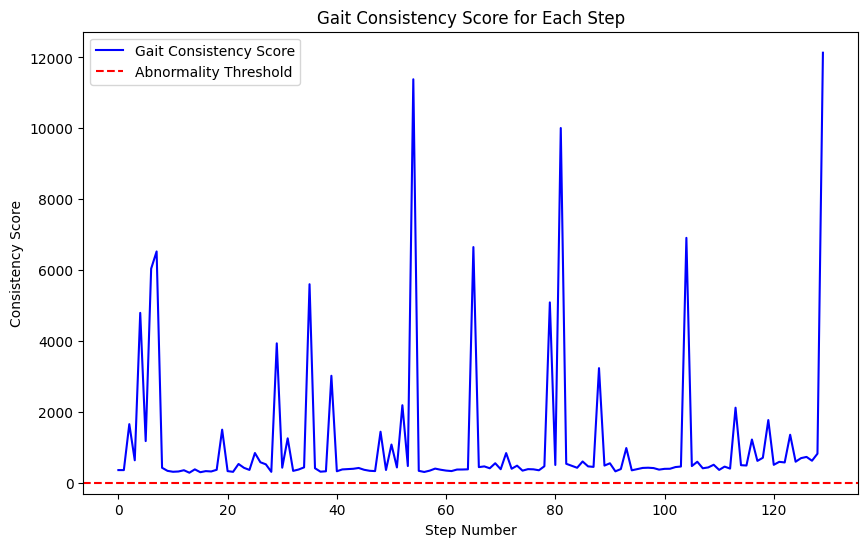

In [150]:
import matplotlib.pyplot as plt

def visualize_gait_analysis(step_differences_df):
    plt.figure(figsize=(10, 6))
    plt.plot(step_differences_df.index, step_differences_df['Total_Score'], label='Gait Consistency Score', color='blue')
    plt.axhline(y=1.5, color='red', linestyle='--', label='Abnormality Threshold')
    plt.title("Gait Consistency Score for Each Step")
    plt.xlabel("Step Number")
    plt.ylabel("Consistency Score")
    plt.legend()
    plt.show()

# Example usage
visualize_gait_analysis(gait_results)


# Region Comparison with DTW

In [151]:
import pandas as pd
import os
from dtaidistance import dtw
import matplotlib.pyplot as plt

# Paths
baseline_dir = r"D:\Study\Gait\Individual_Baseline_Metrics"
step_metrics_base_dir = r"D:\Study\Gait\Step_Segmentation_Metrics"

# Load all baselines
baseline_files = [os.path.join(baseline_dir, f) for f in os.listdir(baseline_dir) if f.endswith(".csv")]
baselines = {}

for file in baseline_files:
    metric_name = os.path.basename(file).split("_baseline")[0]
    baselines[metric_name] = pd.read_csv(file)

# Function to load step metrics dynamically
def load_step_metrics(patient_id, pdata_region):
    step_metrics_path = os.path.join(step_metrics_base_dir, pdata_region, f"patient_{patient_id}", "step_metrics.csv")
    if os.path.exists(step_metrics_path):
        step_metrics_df = pd.read_csv(step_metrics_path)
        print(f"Loaded step metrics for patient {patient_id}, {pdata_region}.")
        return step_metrics_df
    else:
        print(f"Step metrics file not found for patient {patient_id} in {pdata_region}.")
        return None

# Function to compare regions with DTW
def compare_regions_with_dtw(patient_id, pdata_region):
    step_metrics_df = load_step_metrics(patient_id, pdata_region)
    if step_metrics_df is None:
        return

    metric_columns = ['peak_pressure', 'auc', 'rise_gradient', 'descent_gradient', 'variance', 'skewness', 'kurtosis']

    plt.figure(figsize=(12, 8))
    for metric in metric_columns:
        baseline_key = f"{pdata_region}_{metric}"
        if baseline_key in baselines:
            baseline_values = baselines[baseline_key]
            baseline_mean = baseline_values["Mean"].values[0]

            # Create a baseline time series with a constant mean value for comparison
            baseline_series = [baseline_mean] * len(step_metrics_df)
            actual_series = step_metrics_df[metric].fillna(0).values

            # Calculate DTW distance between the baseline and actual time series
            dtw_distance = dtw.distance(baseline_series, actual_series)

            plt.plot(actual_series, label=f"{metric} (DTW Dist: {round(dtw_distance, 2)})")

    plt.title(f"DTW Comparison for {pdata_region} (Patient {patient_id})")
    plt.xlabel("Step Number")
    plt.ylabel("Metric Value")
    plt.legend()
    plt.show()




Loaded step metrics for patient 350, pData_4.


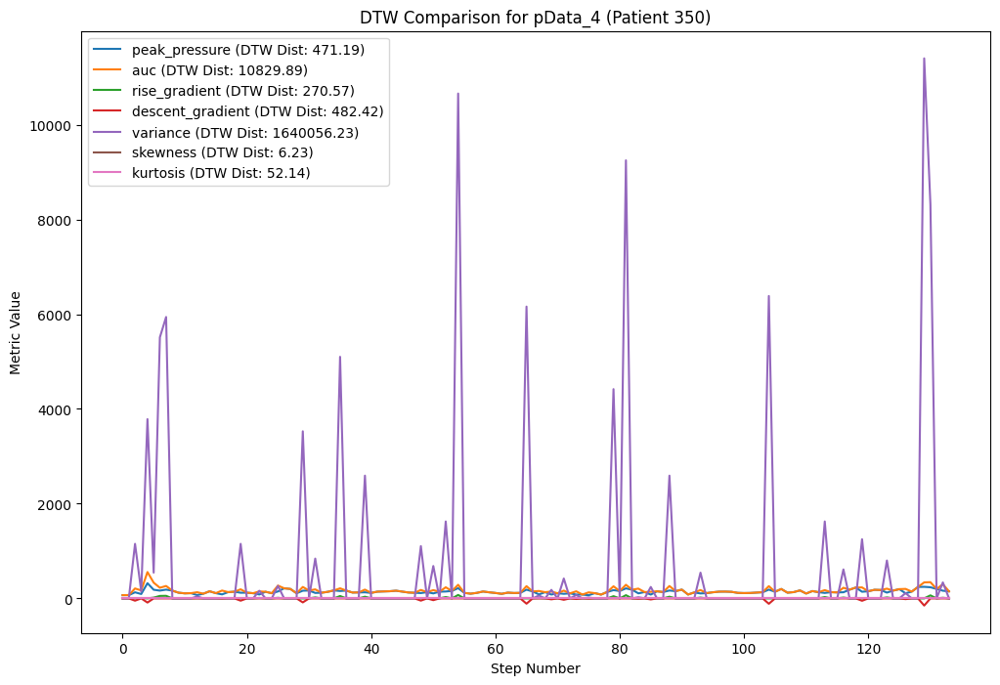

In [152]:
# Example Usage
patient_id = 350  # Change this to any patient ID
pdata_region = "pData_4"  # Change this to "pData", "pData_2", etc.
compare_regions_with_dtw(patient_id, pdata_region)


# XAI for Explanation

In [153]:
pip install shap

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [154]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from dtaidistance import dtw
import shap

def load_step_metrics(path):
    """ Load step metrics CSV for a specific region """
    return pd.read_csv(path)

def pad_sequences(arr1, arr2):
    """ Pad the shorter sequence with NaNs to match the length of the longer sequence """
    arr1 = arr1.astype(float)  # Convert to float to handle NaNs
    arr2 = arr2.astype(float)  # Convert to float to handle NaNs
    max_length = max(len(arr1), len(arr2))
    padded_arr1 = np.pad(arr1, (0, max_length - len(arr1)), mode='constant', constant_values=np.nan)
    padded_arr2 = np.pad(arr2, (0, max_length - len(arr2)), mode='constant', constant_values=np.nan)
    return padded_arr1, padded_arr2

def compare_regions_for_metric(patient_id, pdata_region1, pdata_region2, metric, step_metrics_path_template):
    """ Compare two regions for a specific metric with XAI explanations """
    
    # Load step metrics for both regions
    path_region1 = step_metrics_path_template.format(region=pdata_region1, patient_id=patient_id)
    path_region2 = step_metrics_path_template.format(region=pdata_region2, patient_id=patient_id)
    
    metrics_region1 = load_step_metrics(path_region1)
    metrics_region2 = load_step_metrics(path_region2)
    
    # Extract steps for the selected metric
    steps_region1 = metrics_region1[metric].fillna(0).values
    steps_region2 = metrics_region2[metric].fillna(0).values
    
    # Pad sequences to match lengths
    steps_region1, steps_region2 = pad_sequences(steps_region1, steps_region2)
    
    # Reshape for SHAP compatibility
    combined_steps = np.stack((steps_region1, steps_region2), axis=1)

    # Create time series for DTW comparison
    plt.figure(figsize=(12, 8))
    plt.plot(steps_region1, label=f"{pdata_region1} ({metric})", alpha=0.8, color='blue')
    plt.plot(steps_region2, label=f"{pdata_region2} ({metric})", alpha=0.8, color='orange')
    
    # DTW Distance
    dtw_distance = dtw.distance(steps_region1[np.isfinite(steps_region1)], steps_region2[np.isfinite(steps_region2)])
    plt.title(f"{metric.capitalize()} Comparison for {pdata_region1} vs {pdata_region2} (Patient {patient_id})\nDTW Distance: {dtw_distance:.2f}")
    plt.xlabel("Step Number")
    plt.ylabel(f"{metric.capitalize()} Value")
    plt.legend()
    plt.show()
    
    # ---- XAI (SHAP) for explaining differences ----
    print("Generating SHAP explanations for differences...")

    try:
        # SHAP explainer with a simple linear model as the "predictive function"
        explainer = shap.KernelExplainer(
            model=lambda x: np.abs(x[:, 0] - x[:, 1]).reshape(-1, 1),  # Difference as prediction target
            data=combined_steps
        )
        
        shap_values = explainer.shap_values(combined_steps, nsamples=50)  # Limit samples for speed

        # SHAP summary plot
        shap.summary_plot(shap_values, combined_steps, feature_names=[f"{pdata_region1}", f"{pdata_region2}"])
    except Exception as e:
        print(f"SHAP explainability failed: {e}")


C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


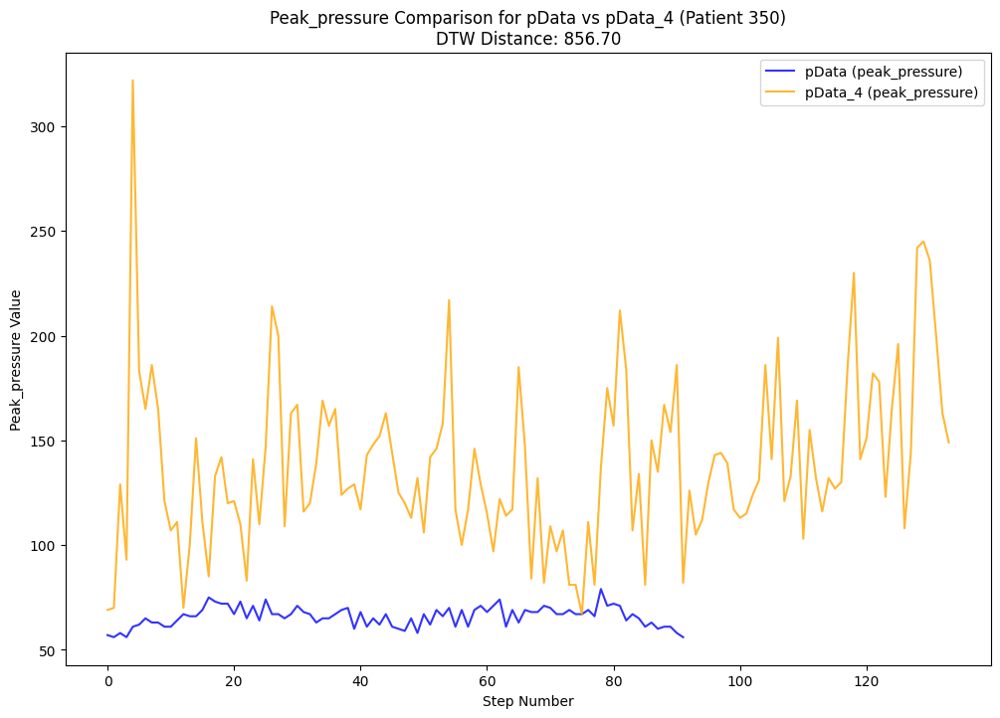

Using 134 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


Generating SHAP explanations for differences...


100%|██████████| 134/134 [00:00<00:00, 517.78it/s]

SHAP explainability failed: only integer scalar arrays can be converted to a scalar index



C:\Users\samiu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\lib\_nanfunctions_impl.py:1424: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


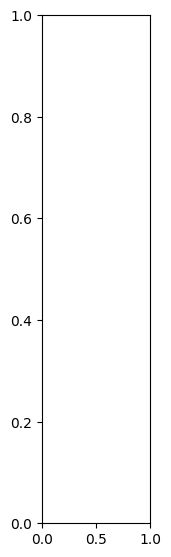

In [155]:
# Example usage
patient_id = 350
pdata_region1 = "pData"
pdata_region2 = "pData_4"
metric = "peak_pressure"
step_metrics_path_template = r"D:\Study\Gait\Step_Segmentation_Metrics\{region}\patient_{patient_id}\step_metrics.csv"

compare_regions_for_metric(patient_id, pdata_region1, pdata_region2, metric, step_metrics_path_template)


In [156]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from dtaidistance import dtw, dtw_visualisation
import shap

def load_step_metrics(path):
    """ Load step metrics CSV for a specific region """
    return pd.read_csv(path)

def pad_sequences(arr1, arr2):
    """ Pad the shorter sequence with NaNs to match the length of the longer sequence """
    arr1 = arr1.astype(float)  # Convert to float to handle NaNs
    arr2 = arr2.astype(float)  # Convert to float to handle NaNs
    max_length = max(len(arr1), len(arr2))
    padded_arr1 = np.pad(arr1, (0, max_length - len(arr1)), mode='constant', constant_values=np.nan)
    padded_arr2 = np.pad(arr2, (0, max_length - len(arr2)), mode='constant', constant_values=np.nan)
    return padded_arr1, padded_arr2

def visualize_dtw_alignment(sequence1, sequence2, metric, pdata_region1, pdata_region2, patient_id):
    """ Plot DTW alignment path between two sequences with larger figure """
    dtw_path = dtw.warping_path(sequence1[np.isfinite(sequence1)], sequence2[np.isfinite(sequence2)])
    
    plt.figure(figsize=(15, 10))  # Increased figure size for clarity
    dtw_visualisation.plot_warping(sequence1[np.isfinite(sequence1)], sequence2[np.isfinite(sequence2)], dtw_path)
    plt.title(f"DTW Alignment Path for {metric} ({pdata_region1} vs {pdata_region2}, Patient {patient_id})", fontsize=16)
    plt.xlabel(f"{pdata_region1} Steps", fontsize=14)
    plt.ylabel(f"{pdata_region2} Steps", fontsize=14)
    plt.show()

def compare_regions_for_metric(patient_id, pdata_region1, pdata_region2, metric, step_metrics_path_template):
    """ Compare two regions for a specific metric with DTW and SHAP explanations """
    
    # Load step metrics for both regions
    path_region1 = step_metrics_path_template.format(region=pdata_region1, patient_id=patient_id)
    path_region2 = step_metrics_path_template.format(region=pdata_region2, patient_id=patient_id)
    
    metrics_region1 = load_step_metrics(path_region1)
    metrics_region2 = load_step_metrics(path_region2)
    
    # Extract steps for the selected metric
    steps_region1 = metrics_region1[metric].fillna(0).values
    steps_region2 = metrics_region2[metric].fillna(0).values
    
    # Pad sequences to match lengths
    steps_region1, steps_region2 = pad_sequences(steps_region1, steps_region2)
    
    # Reshape for SHAP compatibility
    combined_steps = np.stack((steps_region1, steps_region2), axis=1)

    # Create time series plot for DTW comparison
    plt.figure(figsize=(12, 8))
    plt.plot(steps_region1, label=f"{pdata_region1} ({metric})", alpha=0.8, color='blue')
    plt.plot(steps_region2, label=f"{pdata_region2} ({metric})", alpha=0.8, color='orange')
    
    # DTW Distance
    dtw_distance = dtw.distance(steps_region1[np.isfinite(steps_region1)], steps_region2[np.isfinite(steps_region2)])
    plt.title(f"{metric.capitalize()} Comparison for {pdata_region1} vs {pdata_region2} (Patient {patient_id})\nDTW Distance: {dtw_distance:.2f}")
    plt.xlabel("Step Number")
    plt.ylabel(f"{metric.capitalize()} Value")
    plt.legend()
    plt.show()

    # Visualize DTW Path Alignment
    visualize_dtw_alignment(steps_region1, steps_region2, metric, pdata_region1, pdata_region2, patient_id)
    
    # ---- XAI (SHAP) for explaining differences ----
    print("Generating SHAP explanations for differences...")

    try:
        # Summarize background data using K-means clustering for speed
        background_steps = shap.kmeans(combined_steps, 20)  # 20 clusters to speed up SHAP

        # SHAP explainer with a simple linear model as the "predictive function"
        explainer = shap.KernelExplainer(
            model=lambda x: np.abs(x[:, 0] - x[:, 1]).reshape(-1, 1),  # Difference as prediction target
            data=background_steps
        )
        
        shap_values = explainer.shap_values(combined_steps, nsamples=50)  # Limit samples for speed

        # SHAP summary plot
        shap.summary_plot(shap_values, combined_steps, feature_names=[f"{pdata_region1}", f"{pdata_region2}"])
    except Exception as e:
        print(f"SHAP explainability failed: {e}")


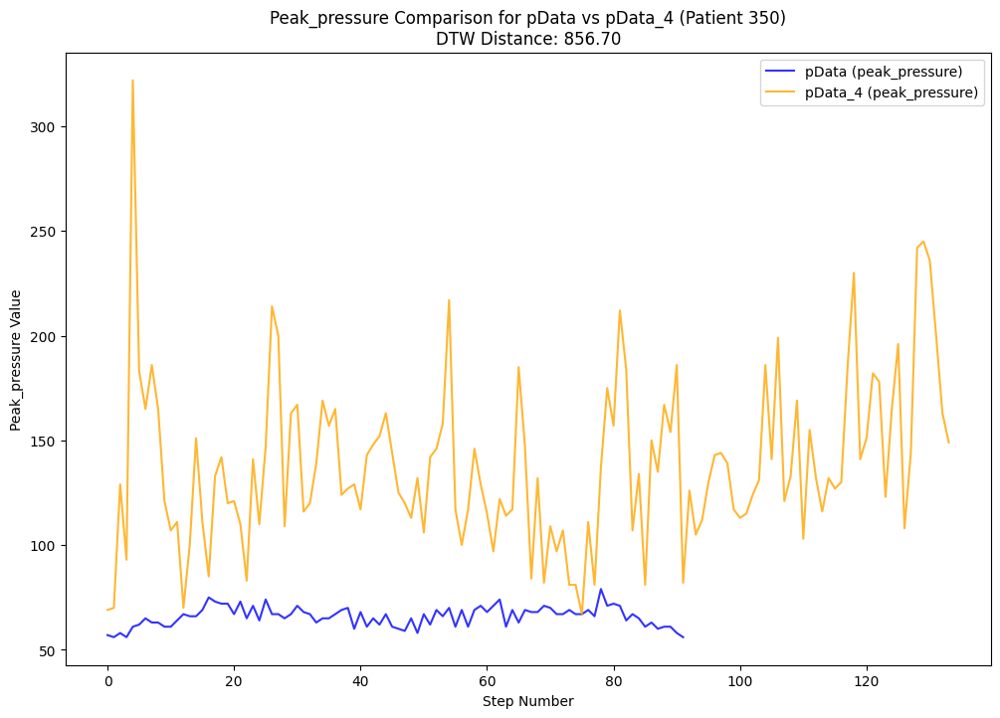

<Figure size 1500x1000 with 0 Axes>

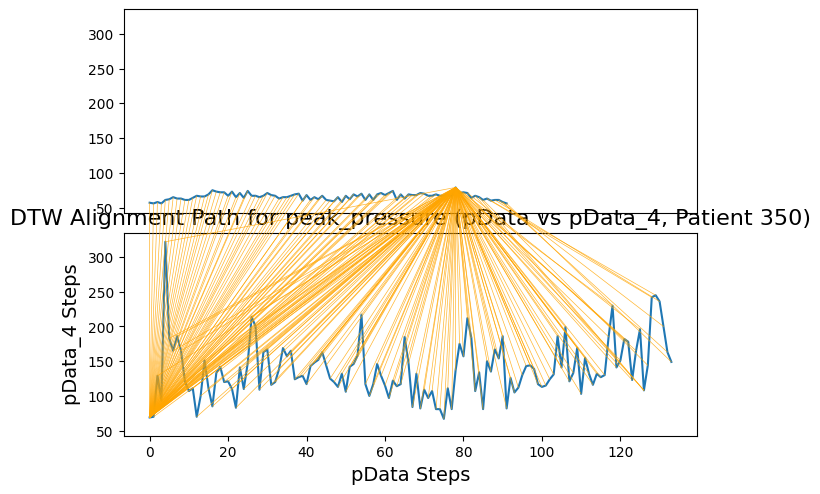

Generating SHAP explanations for differences...


100%|██████████| 134/134 [00:00<00:00, 1037.65it/s]

SHAP explainability failed: only integer scalar arrays can be converted to a scalar index


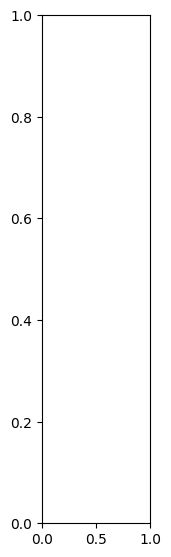

In [157]:
# Example usage
patient_id = 350  # Change to any patient ID
pdata_region1 = "pData"  # Change to any pdata region
pdata_region2 = "pData_4"
metric = "peak_pressure"
step_metrics_path_template = r"D:\Study\Gait\Step_Segmentation_Metrics\{region}\patient_{patient_id}\step_metrics.csv"

compare_regions_for_metric(patient_id, pdata_region1, pdata_region2, metric, step_metrics_path_template)


# Peak Pressure Visualization

In [158]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from dtaidistance import dtw, dtw_visualisation
from scipy.signal import find_peaks

def load_step_metrics(path):
    """ Load step metrics CSV for a specific region """
    return pd.read_csv(path)

def pad_sequences(arr1, arr2):
    """ Pad the shorter sequence with NaNs to match the length of the longer sequence """
    arr1 = arr1.astype(float)  # Convert to float to handle NaNs
    arr2 = arr2.astype(float)  # Convert to float to handle NaNs
    max_length = max(len(arr1), len(arr2))
    padded_arr1 = np.pad(arr1, (0, max_length - len(arr1)), mode='constant', constant_values=np.nan)
    padded_arr2 = np.pad(arr2, (0, max_length - len(arr2)), mode='constant', constant_values=np.nan)
    return padded_arr1, padded_arr2

def visualize_dtw_with_peaks_combined(sequence1, sequence2, metric, pdata_region1, pdata_region2, patient_id):
    """ Visualize combined DTW alignment with peak points in one chart """
    plt.figure(figsize=(18, 12))  # Increased figure size for better clarity
    
    # Compute DTW path
    alignment_path = dtw.warping_path(sequence1[np.isfinite(sequence1)], sequence2[np.isfinite(sequence2)])
    
    # Find peaks in both sequences
    peaks_seq1, _ = find_peaks(sequence1[np.isfinite(sequence1)], height=0)
    peaks_seq2, _ = find_peaks(sequence2[np.isfinite(sequence2)], height=0)
    
    # Plot sequences with DTW alignment path
    plt.plot(sequence1, label=f"{pdata_region1} ({metric})", color='blue', linewidth=2, alpha=0.7)
    plt.plot(sequence2, label=f"{pdata_region2} ({metric})", color='orange', linewidth=2, alpha=0.7)
    
    for i, j in alignment_path:
        plt.plot([i, j], [sequence1[i], sequence2[j]], color='gray', alpha=0.4)  # Warping path connections
    
    # Highlight peak points
    plt.scatter(peaks_seq1, sequence1[peaks_seq1], color='red', s=100, label=f"Peaks in {pdata_region1}", zorder=5)
    plt.scatter(peaks_seq2, sequence2[peaks_seq2], color='darkorange', s=100, label=f"Peaks in {pdata_region2}", zorder=5)
    
    plt.title(f"DTW Alignment with Peaks for {metric} ({pdata_region1} vs {pdata_region2}, Patient {patient_id})", fontsize=18)
    plt.xlabel("Step Number", fontsize=16)
    plt.ylabel(f"{metric.capitalize()} Value", fontsize=16)
    plt.legend(loc="upper left", fontsize=14)
    plt.grid(True)
    plt.show()

def compare_regions_for_metric_with_peaks_combined(patient_id, pdata_region1, pdata_region2, metric, step_metrics_path_template):
    """ Compare two regions for a specific metric with combined DTW alignment and peak visualization """
    
    # Load step metrics for both regions
    path_region1 = step_metrics_path_template.format(region=pdata_region1, patient_id=patient_id)
    path_region2 = step_metrics_path_template.format(region=pdata_region2, patient_id=patient_id)
    
    metrics_region1 = load_step_metrics(path_region1)
    metrics_region2 = load_step_metrics(path_region2)
    
    # Extract steps for the selected metric
    steps_region1 = metrics_region1[metric].fillna(0).values
    steps_region2 = metrics_region2[metric].fillna(0).values
    
    # Pad sequences to match lengths
    steps_region1, steps_region2 = pad_sequences(steps_region1, steps_region2)
    
    # Plot DTW alignment with combined peaks
    visualize_dtw_with_peaks_combined(steps_region1, steps_region2, metric, pdata_region1, pdata_region2, patient_id)



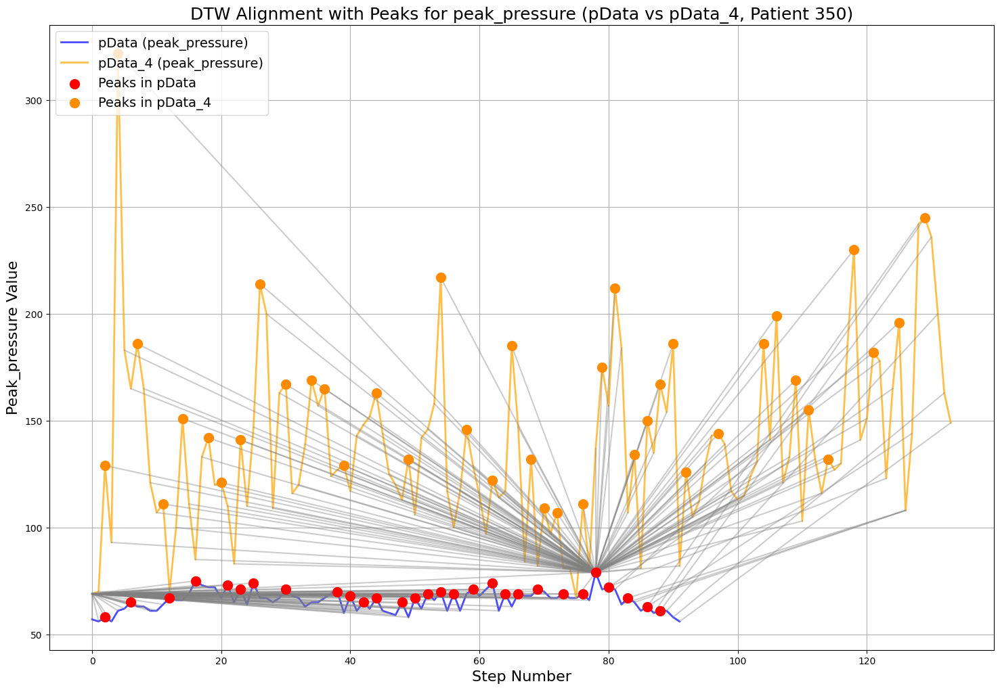

In [159]:

# Example usage:
patient_id = 350  # Change this to any patient ID
pdata_region1 = "pData"  # Change to any pdata region
pdata_region2 = "pData_4"
metric = "peak_pressure"
step_metrics_path_template = r"D:\Study\Gait\Step_Segmentation_Metrics\{region}\patient_{patient_id}\step_metrics.csv"

compare_regions_for_metric_with_peaks_combined(patient_id, pdata_region1, pdata_region2, metric, step_metrics_path_template)

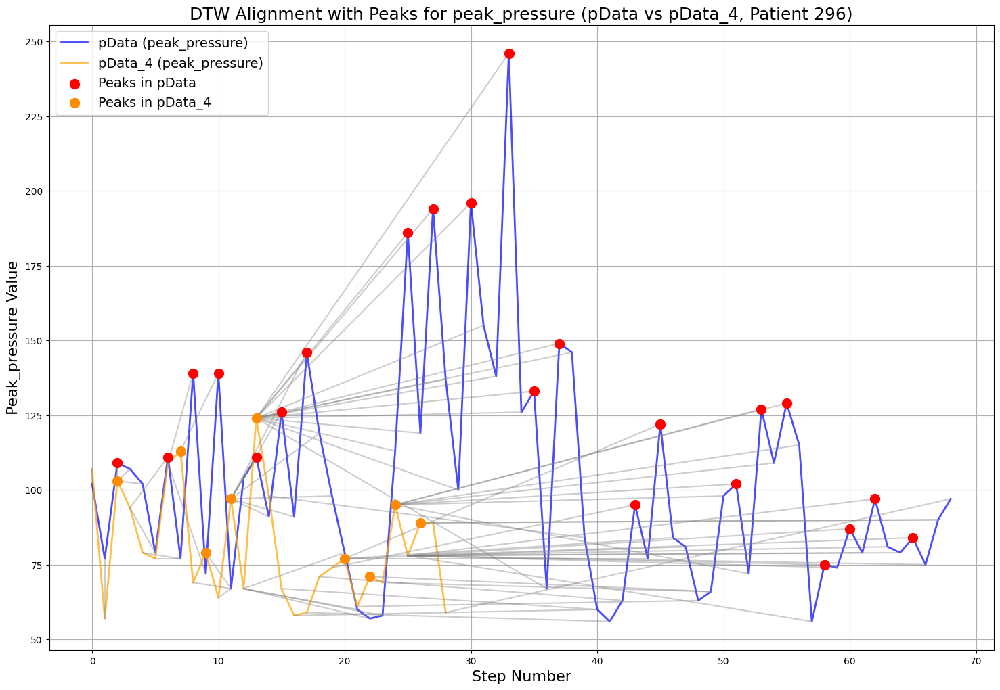

In [160]:
patient_id = 296  # Change this to any patient ID
pdata_region1 = "pData"  # Change to any pdata region
pdata_region2 = "pData_4"
metric = "peak_pressure"
step_metrics_path_template = r"D:\Study\Gait\Step_Segmentation_Metrics\{region}\patient_{patient_id}\step_metrics.csv"

compare_regions_for_metric_with_peaks_combined(patient_id, pdata_region1, pdata_region2, metric, step_metrics_path_template)

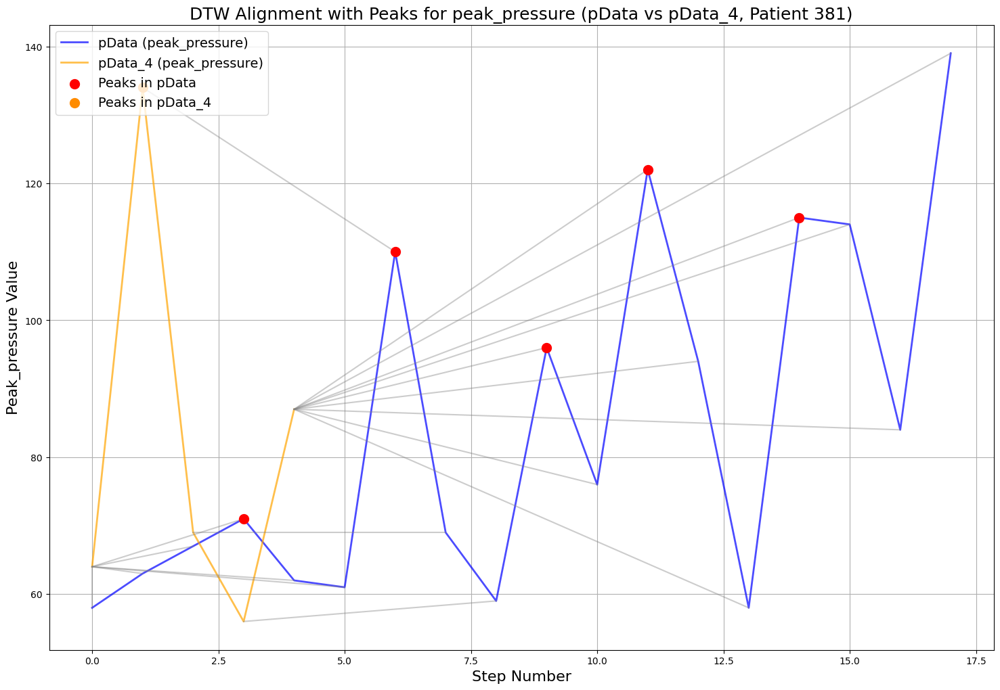

In [161]:
patient_id = 381  # Change this to any patient ID
pdata_region1 = "pData"  # Change to any pdata region
pdata_region2 = "pData_4"
metric = "peak_pressure"
step_metrics_path_template = r"D:\Study\Gait\Step_Segmentation_Metrics\{region}\patient_{patient_id}\step_metrics.csv"

compare_regions_for_metric_with_peaks_combined(patient_id, pdata_region1, pdata_region2, metric, step_metrics_path_template)

# Baseline Comparision Between Metarasal Region 1 vs Heel Region

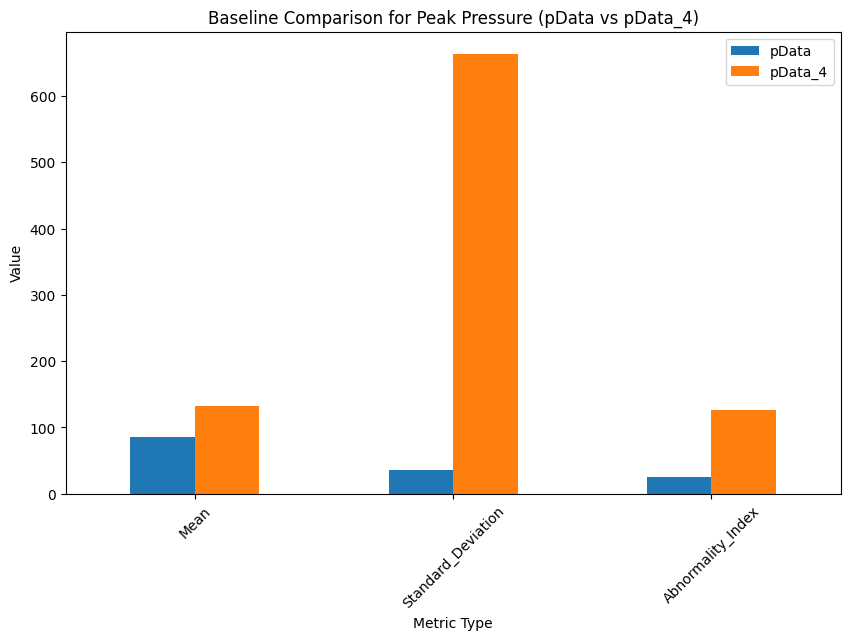

In [162]:
import pandas as pd
import matplotlib.pyplot as plt

def load_baseline(file_path):
    """ Load baseline CSV and return as DataFrame """
    return pd.read_csv(file_path)

def compare_baselines(baseline_path1, baseline_path2, metric_name):
    """ Compare two baselines for a specific metric """
    # Load baseline data
    baseline1 = load_baseline(baseline_path1)
    baseline2 = load_baseline(baseline_path2)
    
    # Get common columns
    common_columns = baseline1.columns.intersection(baseline2.columns)
    
    # Extract common metrics
    baseline1_values = baseline1[common_columns].iloc[0].values
    baseline2_values = baseline2[common_columns].iloc[0].values
    
    # Create a comparison DataFrame
    comparison_df = pd.DataFrame({
        'Metric': common_columns[1:],  # Skip the 'Region' or index column
        'pData': baseline1_values[1:],  # Skip index
        'pData_4': baseline2_values[1:]  # Skip index
    })
    
    # Plot comparison
    plt.figure(figsize=(10, 6))
    comparison_df.plot(x='Metric', kind='bar', ax=plt.gca())
    plt.title(f"Baseline Comparison for {metric_name} (pData vs pData_4)")
    plt.ylabel("Value")
    plt.xlabel("Metric Type")
    plt.legend(["pData", "pData_4"])
    plt.xticks(rotation=45)
    plt.show()

# Example usage
baseline_path1 = r'D:\Study\Gait\Individual_Baseline_Metrics\pData_peak_pressure_baseline.csv'
baseline_path2 = r'D:\Study\Gait\Individual_Baseline_Metrics\pData_4_peak_pressure_baseline.csv'
metric_name = "Peak Pressure"

compare_baselines(baseline_path1, baseline_path2, metric_name)


## Generating Baseline

In [163]:
import pandas as pd
import numpy as np
import os
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

def load_step_metrics_for_region(region_paths):
    """ Load step metrics for all patients of a specific pData region """
    all_data = []
    for path in region_paths:
        if os.path.exists(path):
            df = pd.read_csv(path)
            df['patient_id'] = path.split('patient_')[-1].split('/')[0]  # Extract patient ID
            all_data.append(df)
    combined_df = pd.concat(all_data, ignore_index=True)
    return combined_df

def train_rf_and_predict_steps(df, metric):
    """ Train Random Forest to predict missing values for a metric """
    step_numbers = df['step_number'].values.reshape(-1, 1)
    feature_values = df[metric].values

    # Train Random Forest on valid data (non-NaN)
    valid_mask = ~np.isnan(feature_values)
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(step_numbers[valid_mask], feature_values[valid_mask])

    # Predict for all steps
    predicted_values = rf_model.predict(step_numbers)
    return predicted_values

def generate_stepwise_baseline_for_region(region, step_metrics_paths, output_dir):
    """ Generate step-wise ideal baseline for a pData region """
    all_metrics_df = load_step_metrics_for_region(step_metrics_paths)
    metrics = ['peak_pressure', 'auc', 'rise_gradient', 'descent_gradient', 'variance', 'skewness', 'kurtosis']
    stepwise_baseline = pd.DataFrame()

    for metric in metrics:
        # Predict missing values for each metric using Random Forest
        all_metrics_df[metric] = train_rf_and_predict_steps(all_metrics_df, metric)

        # Group by step number and compute the average value for each step
        avg_stepwise_metric = all_metrics_df.groupby('step_number')[metric].mean().reset_index()
        stepwise_baseline[metric] = avg_stepwise_metric[metric]

    stepwise_baseline['step_number'] = avg_stepwise_metric['step_number']
    
    # Save the baseline as CSV in the desired directory
    os.makedirs(output_dir, exist_ok=True)
    output_path = os.path.join(output_dir, f"{region}_stepwise_baseline.csv")
    stepwise_baseline.to_csv(output_path, index=False)
    
    # Plot the stepwise baseline for visualization
    plt.figure(figsize=(12, 8))
    for metric in metrics:
        plt.plot(stepwise_baseline['step_number'], stepwise_baseline[metric], label=metric.capitalize())
    plt.title(f"Step-wise Baseline for {region}")
    plt.xlabel("Step Number")
    plt.ylabel("Metric Value")
    plt.legend()
    plt.show()

    print(f"Baseline saved at: {output_path}")




In [164]:
# Example usage:
pdata_regions = ["pData", "pData_2", "pData_3", "pData_4"]
step_metrics_template = r"D:\Study\Gait\Step_Segmentation_Metrics\{region}\patient_{patient_id}\step_metrics.csv"
output_dir = r"D:\Study\Gait\Step_Segmentation_Metrics\Baselines"


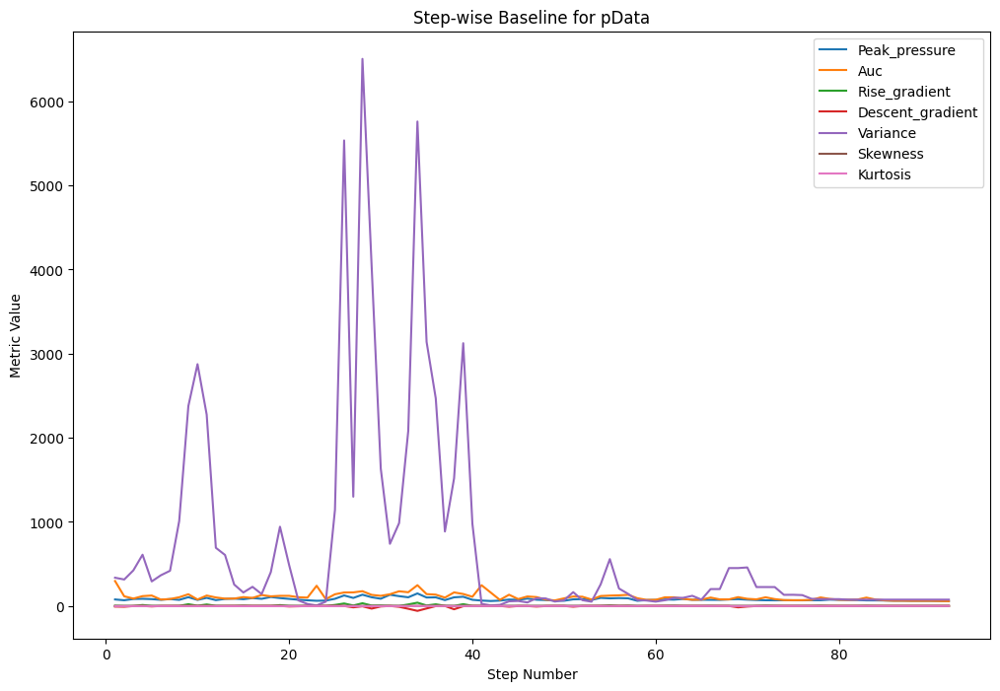

Baseline saved at: D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv


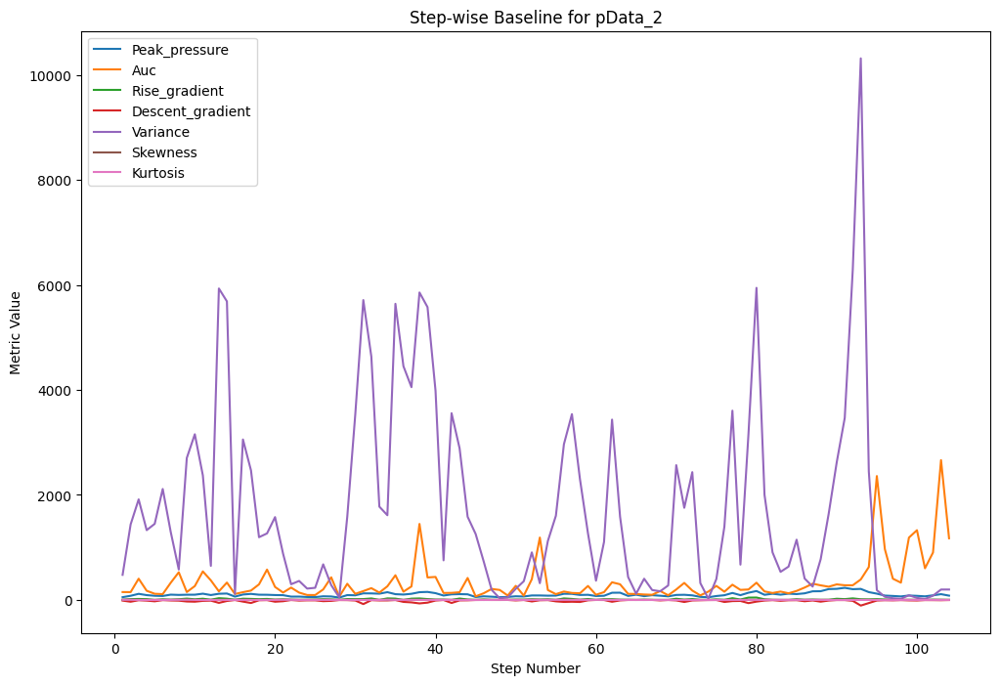

Baseline saved at: D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_2_stepwise_baseline.csv


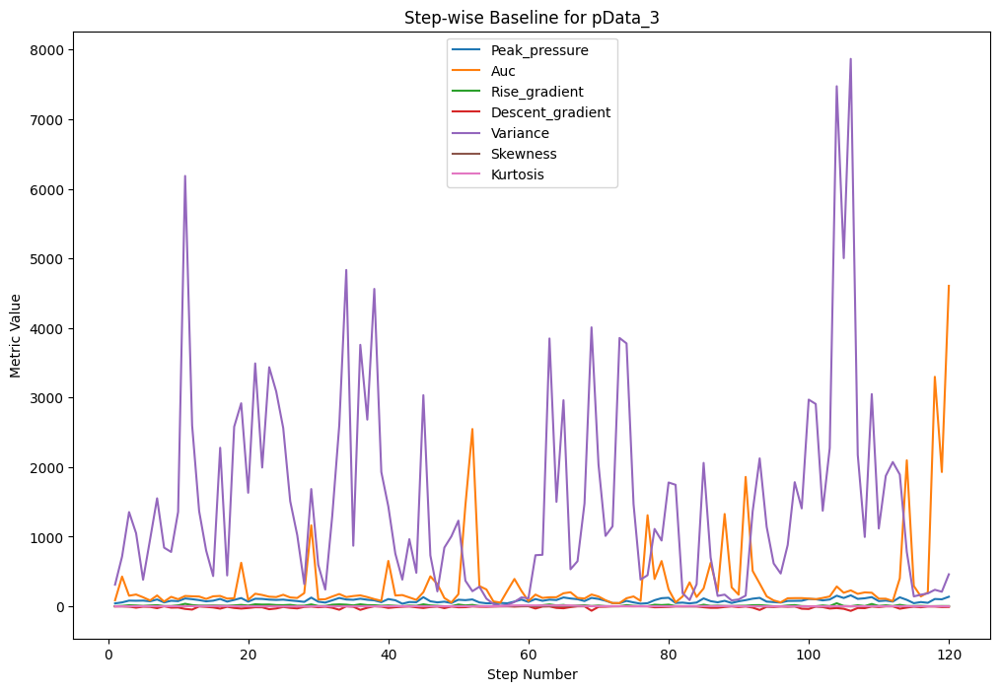

Baseline saved at: D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_3_stepwise_baseline.csv


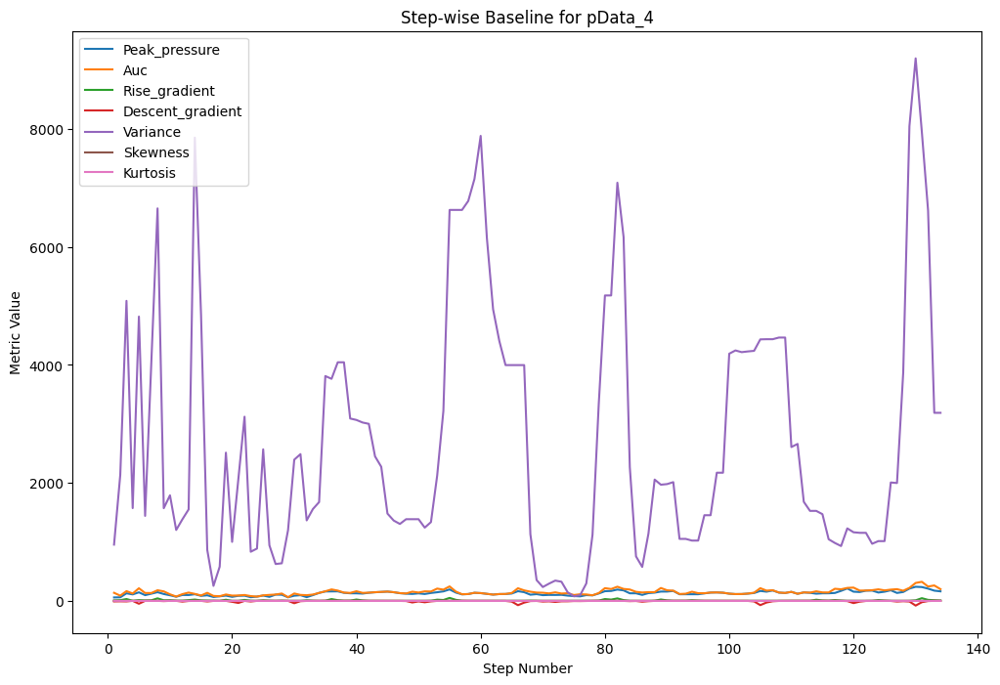

Baseline saved at: D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv


In [165]:
for region in pdata_regions:
    # Generate paths for all patients in this region
    patient_ids = [47, 48, 49, 350, 296]  # Example list of patient IDs
    paths = [step_metrics_template.format(region=region, patient_id=pid) for pid in patient_ids]
    
    # Create and save the stepwise baseline for this region
    generate_stepwise_baseline_for_region(region, paths, output_dir)

## Top Five Patients with most steps

In [166]:
import os
import pandas as pd

def get_top_patients_by_step_count(region, step_metrics_template, num_top_patients=5):
    """ Get top N patients by step count for a specific region """
    patient_step_counts = {}

    # Loop through patients and count the number of steps
    for patient_id in range(1, 400):  # Assuming max patient ID is 400
        step_metrics_path = step_metrics_template.format(region=region, patient_id=patient_id)
        if os.path.exists(step_metrics_path):
            df = pd.read_csv(step_metrics_path)
            step_count = len(df)
            if step_count > 0:
                patient_step_counts[patient_id] = step_count

    # Get top N patients by step count
    sorted_patients = sorted(patient_step_counts.items(), key=lambda x: x[1], reverse=True)
    top_patients = sorted_patients[:num_top_patients]

    print(f"Top {num_top_patients} patients for {region}:")
    for patient, steps in top_patients:
        print(f"Patient {patient}: {steps} steps")

    return [patient for patient, steps in top_patients]

# Example usage
step_metrics_template = r"D:\Study\Gait\Step_Segmentation_Metrics\{region}\patient_{patient_id}\step_metrics.csv"

regions = ["pData_2", "pData_3", "pData_4"]
top_patients_per_region = {}

for region in regions:
    top_patients = get_top_patients_by_step_count(region, step_metrics_template)
    top_patients_per_region[region] = top_patients


Top 5 patients for pData_2:
Patient 81: 149 steps
Patient 296: 104 steps
Patient 49: 86 steps
Patient 350: 74 steps
Patient 107: 52 steps
Top 5 patients for pData_3:
Patient 60: 185 steps
Patient 296: 120 steps
Patient 49: 117 steps
Patient 295: 65 steps
Patient 47: 48 steps
Top 5 patients for pData_4:
Patient 350: 134 steps
Patient 295: 72 steps
Patient 179: 56 steps
Patient 204: 44 steps
Patient 180: 40 steps


In [167]:
# Top 5 patients for each region
top_patients = {
    "pData": [350, 296, 381, 325],  # Already provided
    "pData_2": [81, 296, 49, 350, 107],
    "pData_3": [60, 296, 49, 295, 47],
    "pData_4": [350, 295, 179, 204, 180],
}

In [168]:
import os
import pandas as pd
import numpy as np

def generate_stepwise_baseline_for_region(region, step_metrics_template, save_path, selected_patients):
    """ Generate stepwise baselines for a region using selected patients """
    all_steps = []

    for patient_id in selected_patients:
        step_metrics_path = step_metrics_template.format(region=region, patient_id=patient_id)
        if os.path.exists(step_metrics_path):
            df = pd.read_csv(step_metrics_path)
            if not df.empty:
                all_steps.append(df)

    # Combine all steps from selected patients
    combined_steps = pd.concat(all_steps, axis=0)

    # Generate mean values for each step number
    baseline_metrics = combined_steps.groupby(combined_steps.index).mean()

    # Save the baseline
    os.makedirs(save_path, exist_ok=True)
    baseline_file = os.path.join(save_path, f"{region}_stepwise_baseline.csv")
    baseline_metrics.to_csv(baseline_file)
    print(f"Baseline saved for {region}: {baseline_file}")


In [169]:
# Example usage
step_metrics_template = r"D:\Study\Gait\Step_Segmentation_Metrics\{region}\patient_{patient_id}\step_metrics.csv"
save_path = r"D:\Study\Gait\Step_Segmentation_Metrics\Baselines"

for region, patients in top_patients.items():
    generate_stepwise_baseline_for_region(region, step_metrics_template, save_path, patients)

Baseline saved for pData: D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv
Baseline saved for pData_2: D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_2_stepwise_baseline.csv
Baseline saved for pData_3: D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_3_stepwise_baseline.csv
Baseline saved for pData_4: D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv


# Insight Into Peak Pressure

In [170]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from dtaidistance import dtw

def pad_sequences(arr1, arr2):
    """Pad shorter array with NaNs to match the length of the longer array."""
    max_length = max(len(arr1), len(arr2))
    padded_arr1 = np.pad(arr1, (0, max_length - len(arr1)), mode='constant', constant_values=np.nan)
    padded_arr2 = np.pad(arr2, (0, max_length - len(arr2)), mode='constant', constant_values=np.nan)
    return padded_arr1, padded_arr2

def plot_dtw_alignment_with_peaks(baseline_path1, baseline_path2, metric_name):
    # Load stepwise baseline data
    baseline1 = pd.read_csv(baseline_path1)
    baseline2 = pd.read_csv(baseline_path2)

    # Extract step numbers and peak pressure values
    steps1 = baseline1['step_number']
    pdata_values = baseline1[metric_name].fillna(0).values
    steps2 = baseline2['step_number']
    pdata4_values = baseline2[metric_name].fillna(0).values

    # Pad sequences to ensure equal lengths
    pdata_values, pdata4_values = pad_sequences(pdata_values, pdata4_values)
    steps = np.arange(max(len(steps1), len(steps2)))  # Generate step index for aligned data

    # Find peaks in both pdata and pdata4
    pdata_peaks, _ = find_peaks(pdata_values, prominence=5)
    pdata4_peaks, _ = find_peaks(pdata4_values, prominence=5)

    # Perform DTW alignment
    alignment = dtw.warping_path(pdata_values[np.isfinite(pdata_values)], pdata4_values[np.isfinite(pdata4_values)])
    
    plt.figure(figsize=(14, 10))
    
    # Plot aligned signals
    plt.plot(steps, pdata_values, label=f'pData ({metric_name})', color='blue', alpha=0.8)
    plt.plot(steps, pdata4_values, label=f'pData_4 ({metric_name})', color='orange', alpha=0.8)
    
    # Plot warping path
    for (i, j) in alignment:
        plt.plot([i, j], [pdata_values[i], pdata4_values[j]], color='gray', alpha=0.4, linewidth=0.8)

    # Highlight peak points
    plt.scatter(pdata_peaks, pdata_values[pdata_peaks], color='red', label='Peaks in pData', zorder=5, s=80)
    plt.scatter(pdata4_peaks, pdata4_values[pdata4_peaks], color='orange', label='Peaks in pData_4', zorder=5, s=80, edgecolor='black')

    plt.title(f"DTW Alignment Path for {metric_name} with Peaks (pData vs pData_4)")
    plt.xlabel("Steps")
    plt.ylabel(metric_name)
    plt.legend()
    plt.grid(True)
    plt.show()



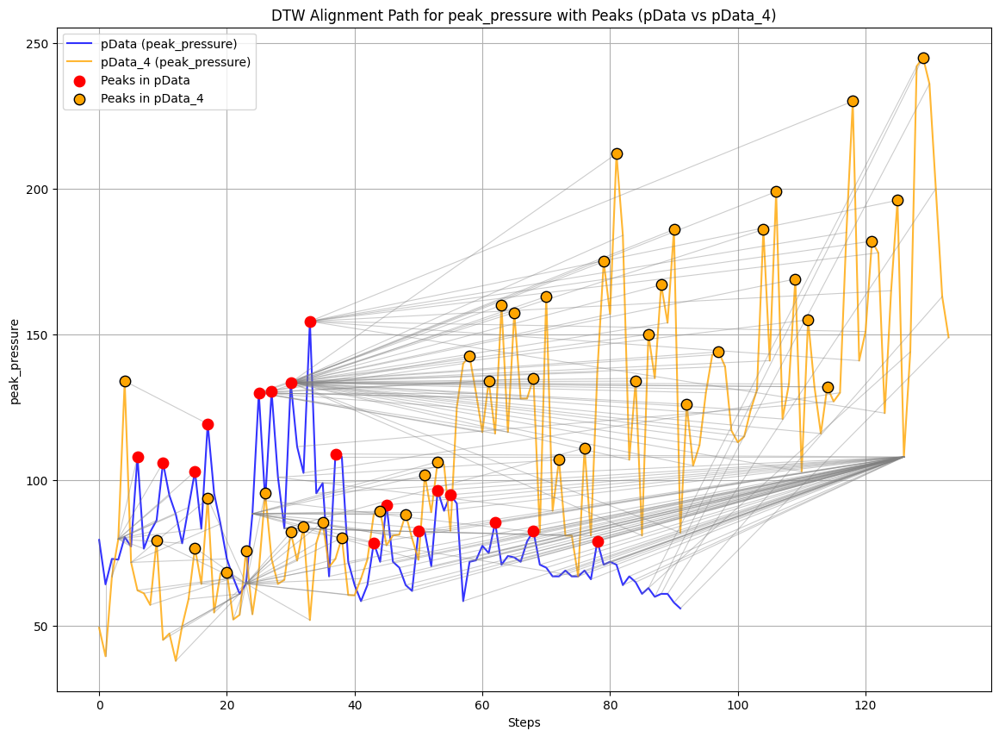

In [171]:
# Example usage:
baseline_path1 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv'
baseline_path2 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv'
plot_dtw_alignment_with_peaks(baseline_path1, baseline_path2, 'peak_pressure')


The Dynamic Time Warping (DTW) alignment plot shows how two sequences of peak pressure values from pData (blue) and pData_4 (orange) align step-by-step:

Blue and orange lines: Represent the stepwise peak pressure values for the two regions.
Gray lines: Represent the optimal warping path, showing which steps from pData correspond to steps from pData_4.
If the gray lines are mostly vertical: Indicates the corresponding steps have similar time points.
If the gray lines are diagonal or cross over long distances: Indicates misalignment or a delay/advance between the sequences.

Insights from the Plot:
Pressure Fluctuation Differences:

The pData_4 region has large spikes in peak pressure after certain steps, indicating higher loads on the metatarsal or heel areas.
The pData baseline shows more consistent, smaller peaks.
Alignment Deviations:

The large number of slanted and crossing lines suggests that pData_4 has uneven step patterns compared to the baseline (pData).
This could indicate gait abnormalities, uneven weight distribution, or delayed toe-off phases.
Regions of Interest:

You can highlight regions where the curves diverge (around steps 20 to 40 and 100 onwards) to investigate why pressure spikes or dips occur.
You may observe if these correspond to step initiation points, mid-stance, or heel-off points.

In [172]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from dtaidistance import dtw

def pad_sequences(arr1, arr2):
    """Pad shorter array with NaNs to match the length of the longer array."""
    # Convert arrays to float to handle NaNs
    arr1 = arr1.astype(float)
    arr2 = arr2.astype(float)
    
    max_length = max(len(arr1), len(arr2))
    padded_arr1 = np.pad(arr1, (0, max_length - len(arr1)), mode='constant', constant_values=np.nan)
    padded_arr2 = np.pad(arr2, (0, max_length - len(arr2)), mode='constant', constant_values=np.nan)
    return padded_arr1, padded_arr2


def plot_dtw_alignment_with_peaks(baseline_path1, baseline_path2, metric_name, label1="pData", label2="pData_4"):
    """
    Plot DTW alignment with peaks for given baselines and labels.
    
    Parameters:
    - baseline_path1: str - Path to the first baseline CSV file.
    - baseline_path2: str - Path to the second baseline CSV file.
    - metric_name: str - Name of the metric to plot (e.g., 'peak_pressure').
    - label1: str - Label for the first region (default: 'pData').
    - label2: str - Label for the second region (default: 'pData_4').
    """
    
    # Load stepwise baseline data
    baseline1 = pd.read_csv(baseline_path1)
    baseline2 = pd.read_csv(baseline_path2)

    # Extract step numbers and metric values
    steps1 = baseline1['step_number']
    values1 = baseline1[metric_name].fillna(0).values
    steps2 = baseline2['step_number']
    values2 = baseline2[metric_name].fillna(0).values

    # Pad sequences to ensure equal lengths
    values1, values2 = pad_sequences(values1, values2)
    steps = np.arange(max(len(steps1), len(steps2)))  # Generate step index for aligned data

    # Find peaks in both regions
    peaks1, _ = find_peaks(values1, prominence=5)
    peaks2, _ = find_peaks(values2, prominence=5)

    # Perform DTW alignment
    alignment = dtw.warping_path(values1[np.isfinite(values1)], values2[np.isfinite(values2)])
    
    plt.figure(figsize=(14, 10))
    
    # Plot aligned signals
    plt.plot(steps, values1, label=f'{label1} ({metric_name})', color='blue', alpha=0.8)
    plt.plot(steps, values2, label=f'{label2} ({metric_name})', color='orange', alpha=0.8)
    
    # Plot warping path
    for (i, j) in alignment:
        plt.plot([i, j], [values1[i], values2[j]], color='gray', alpha=0.4, linewidth=0.8)

    # Highlight peak points and add textual annotations
    plt.scatter(peaks1, values1[peaks1], color='red', label=f'Peaks in {label1}', zorder=5, s=80)
    plt.scatter(peaks2, values2[peaks2], color='orange', label=f'Peaks in {label2}', zorder=5, s=80, edgecolor='black')
    
    for p1 in peaks1:
        plt.text(p1, values1[p1] + 5, f"{values1[p1]:.1f}", ha='center', color='red', fontsize=9)
    for p2 in peaks2:
        plt.text(p2, values2[p2] + 5, f"{values2[p2]:.1f}", ha='center', color='orange', fontsize=9)

    # Summary statistics
    differences = np.abs(values1 - values2)
    mean_difference = np.nanmean(differences)
    max_difference = np.nanmax(differences)
    
    plt.title(f"DTW Alignment Path for {metric_name} with Peaks ({label1} vs {label2})\nMean Difference: {mean_difference:.2f}, Max Difference: {max_difference:.2f}")
    plt.xlabel("Steps")
    plt.ylabel(metric_name)
    plt.legend()
    plt.grid(True)
    plt.show()


In [173]:
# Example usage:
baseline_path1 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv'
baseline_path2 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_2_stepwise_baseline.csv'
baseline_path3 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_3_stepwise_baseline.csv'
baseline_path4 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv'

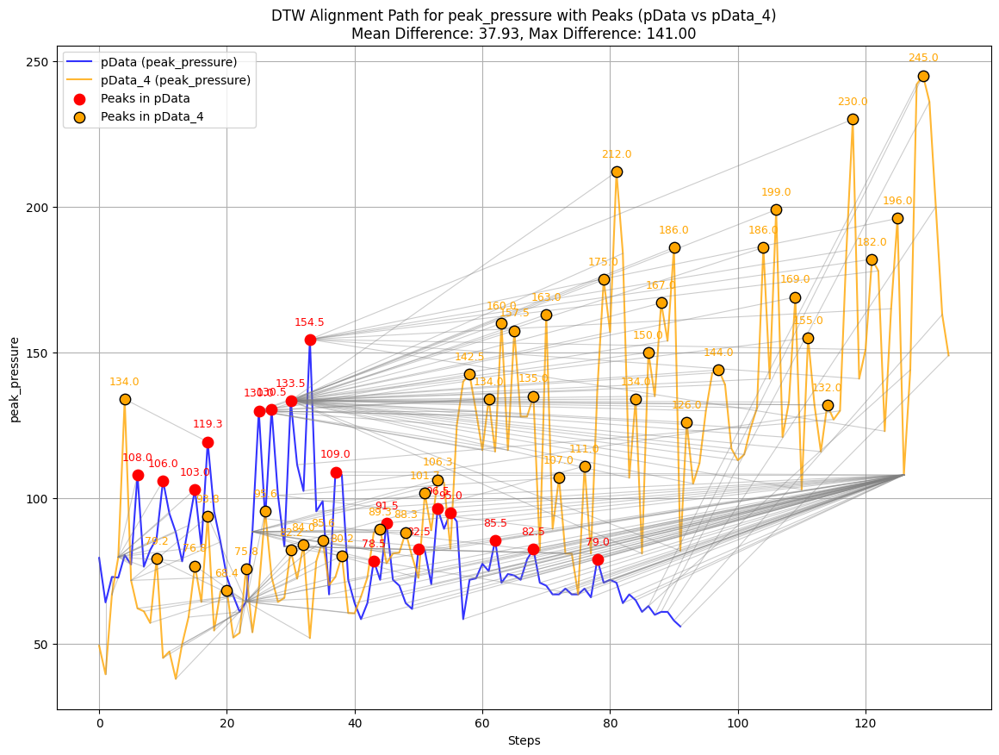

In [174]:
# You can now specify different labels to compare different regions dynamically:
plot_dtw_alignment_with_peaks(baseline_path1, baseline_path4, 'peak_pressure', label1="pData", label2="pData_4")

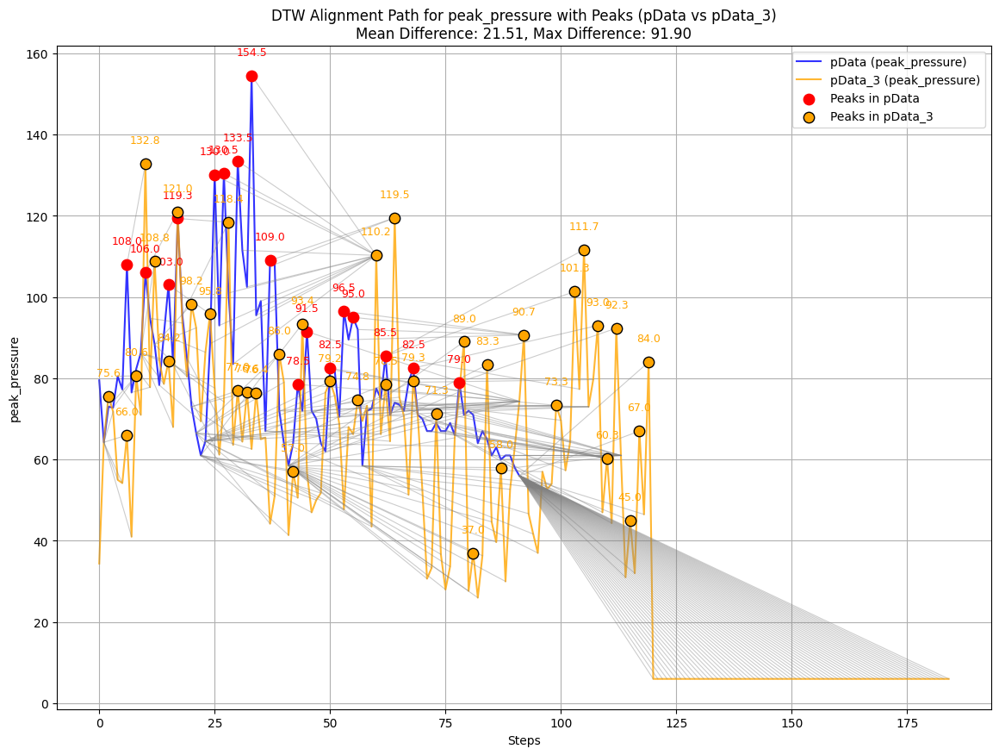

In [175]:
plot_dtw_alignment_with_peaks(baseline_path1, baseline_path3, 'peak_pressure', label1="pData", label2="pData_3")

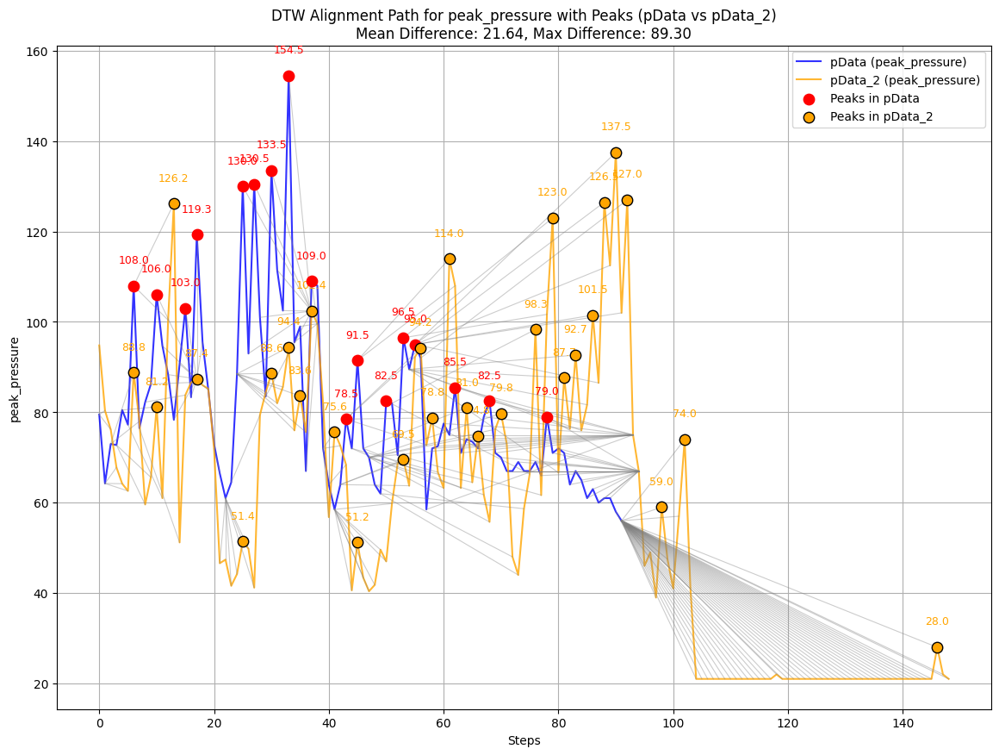

In [176]:
plot_dtw_alignment_with_peaks(baseline_path1, baseline_path2, 'peak_pressure', label1="pData", label2="pData_2")

### Patient vs Baseline

In [177]:
#Patient
p350_pdata = r'D:\Study\Gait\Step_Segmentation_Metrics\pData\patient_350\step_metrics.csv' 
p350_pdata2 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_2\patient_350\step_metrics.csv' 
p350_pdata3 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_3\patient_350\step_metrics.csv' 
p350_pdata4 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_350\step_metrics.csv' 
p49_pdata2 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_2\patient_49\step_metrics.csv' 
p49_pdata3 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_3\patient_49\step_metrics.csv' 
p49_pdata4 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_49\step_metrics.csv' 

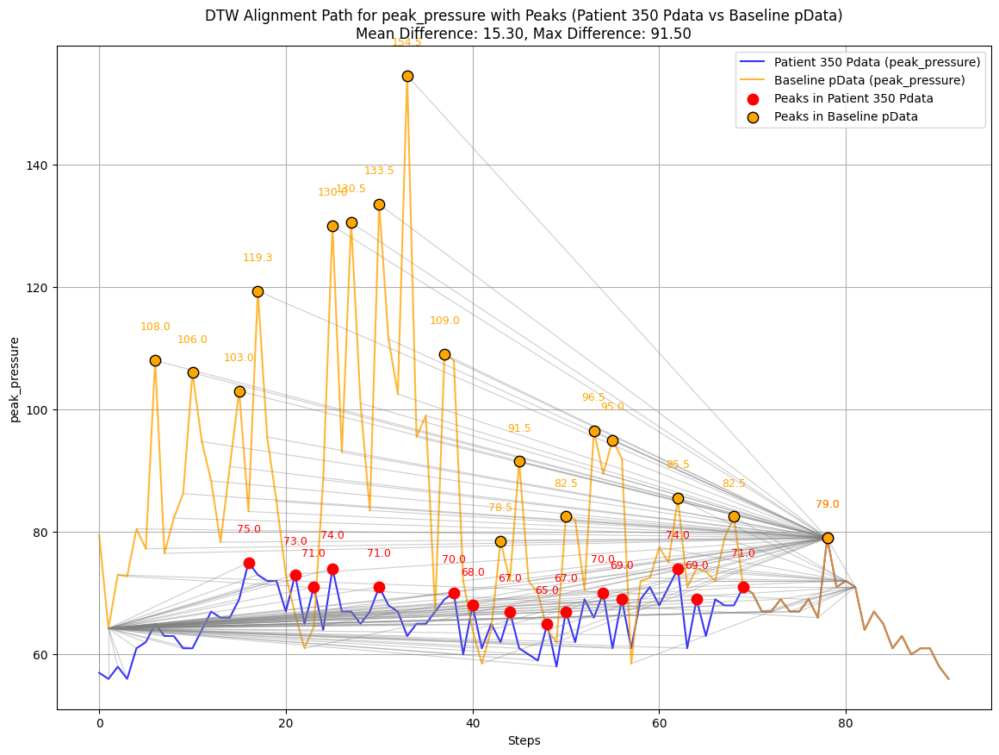

In [178]:
# You can now specify different labels to compare different regions dynamically:
plot_dtw_alignment_with_peaks(p350_pdata, baseline_path1, 'peak_pressure', label1="Patient 350 Pdata", label2="Baseline pData")

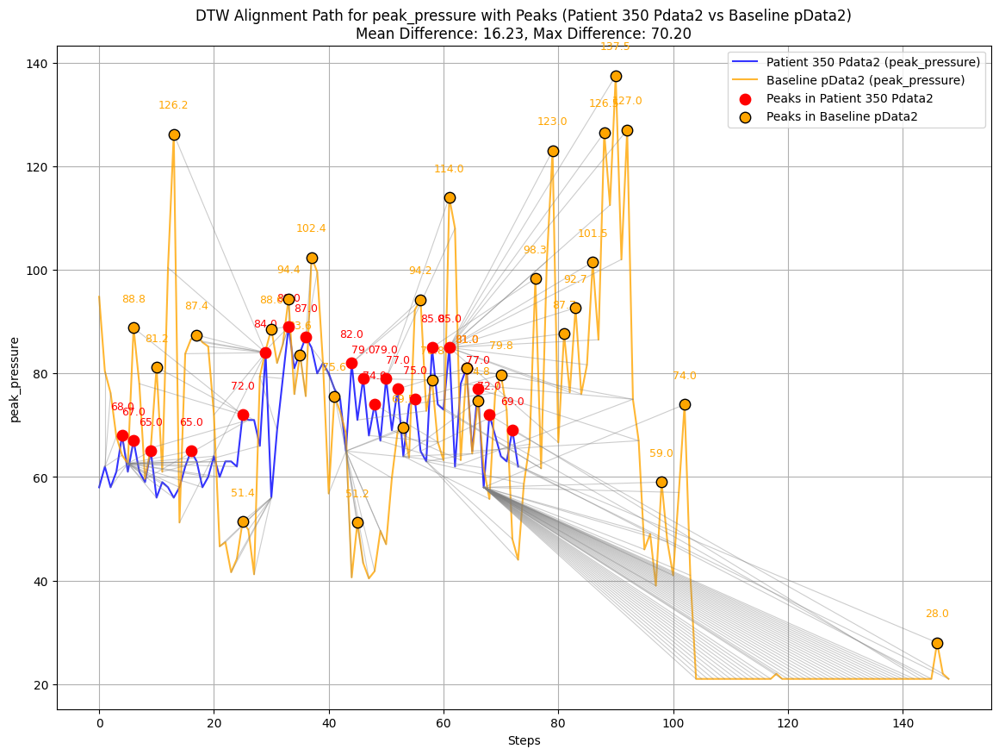

In [179]:
plot_dtw_alignment_with_peaks(p350_pdata2, baseline_path2, 'peak_pressure', label1="Patient 350 Pdata2", label2="Baseline pData2")

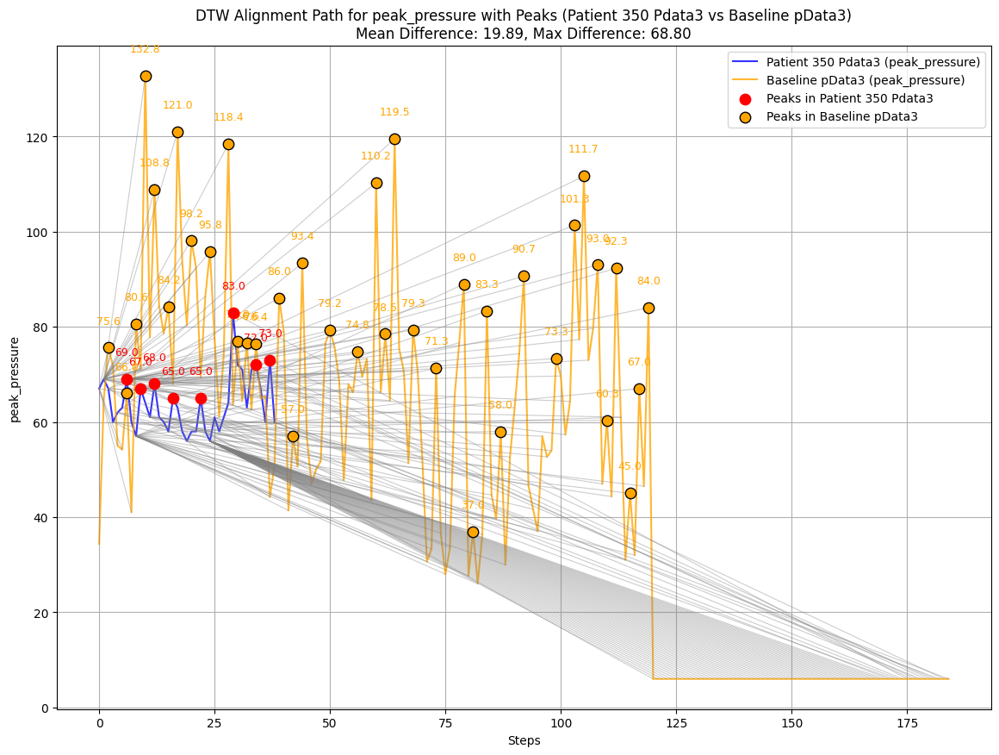

In [180]:
plot_dtw_alignment_with_peaks(p350_pdata3, baseline_path3, 'peak_pressure', label1="Patient 350 Pdata3", label2="Baseline pData3")

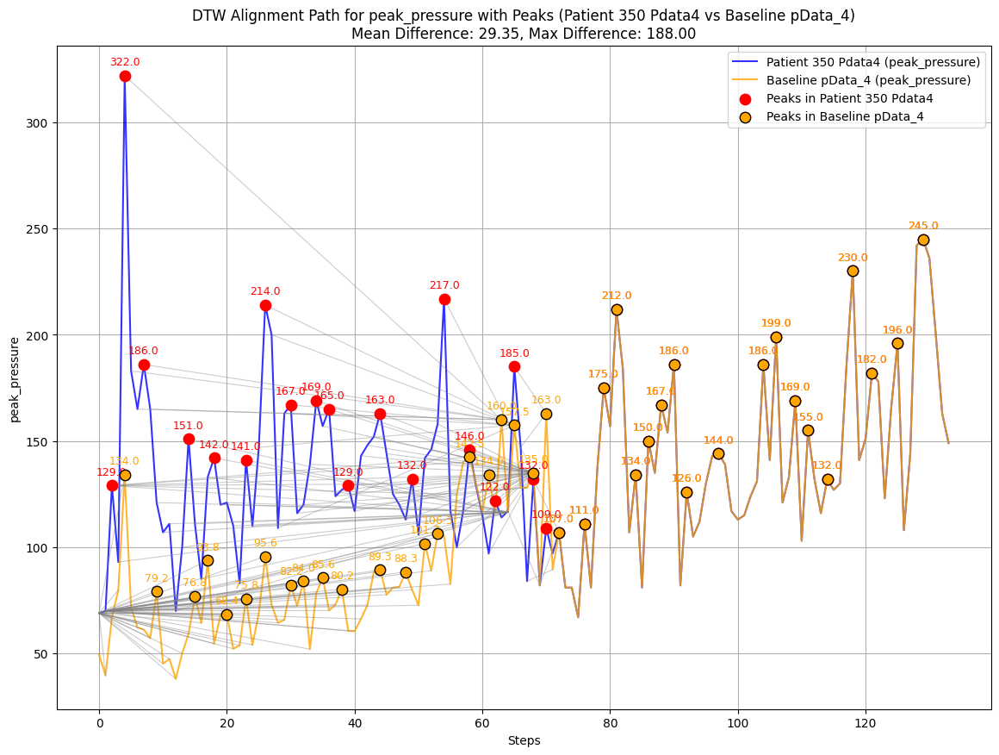

In [181]:
# You can now specify different labels to compare different regions dynamically:
plot_dtw_alignment_with_peaks(p350_pdata4, baseline_path4, 'peak_pressure', label1="Patient 350 Pdata4", label2="Baseline pData_4")

- Patient 350 seems to have a huge pressure peak within first 20 steps which is abnormal

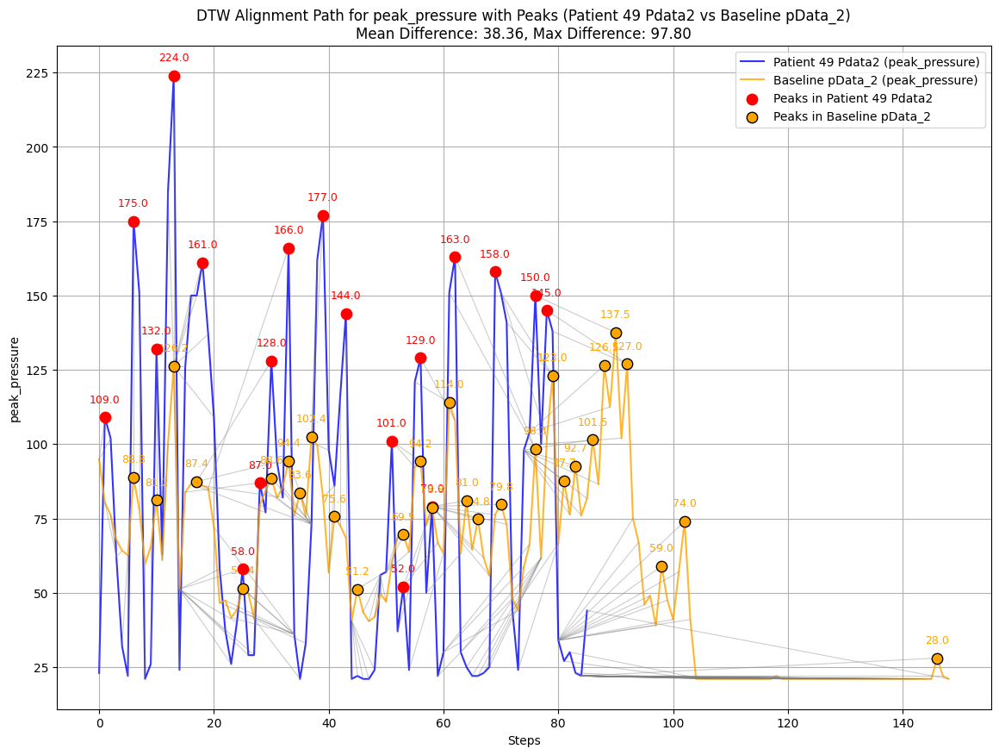

In [182]:
plot_dtw_alignment_with_peaks(p49_pdata2, baseline_path2, 'peak_pressure', label1="Patient 49 Pdata2", label2="Baseline pData_2")

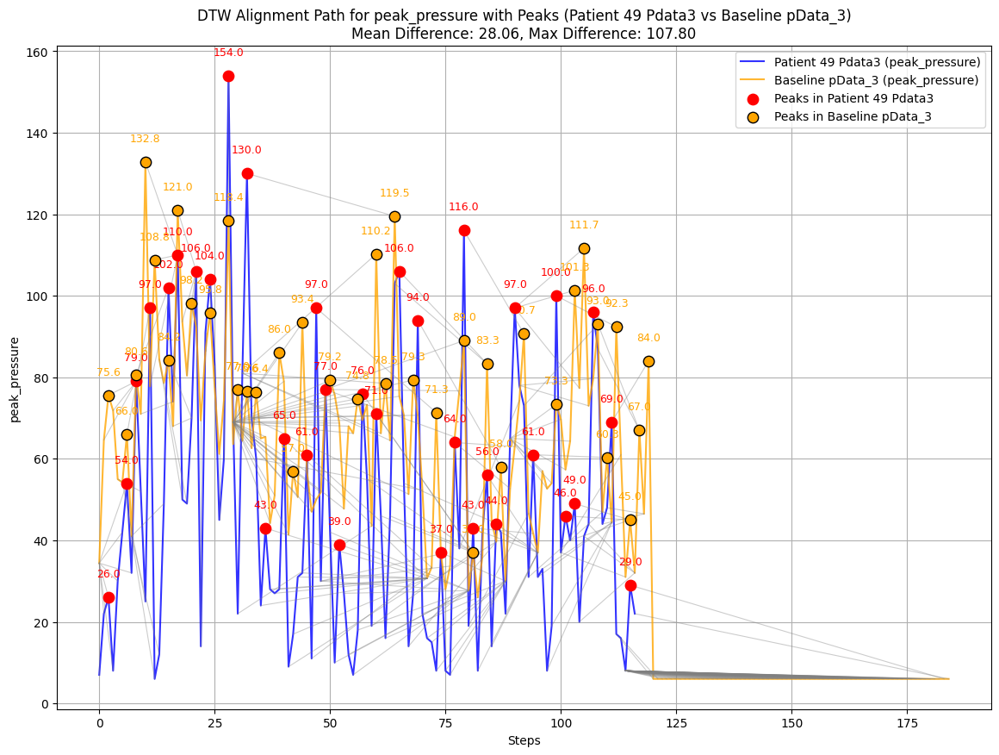

In [183]:
plot_dtw_alignment_with_peaks(p49_pdata3, baseline_path3, 'peak_pressure', label1="Patient 49 Pdata3", label2="Baseline pData_3")

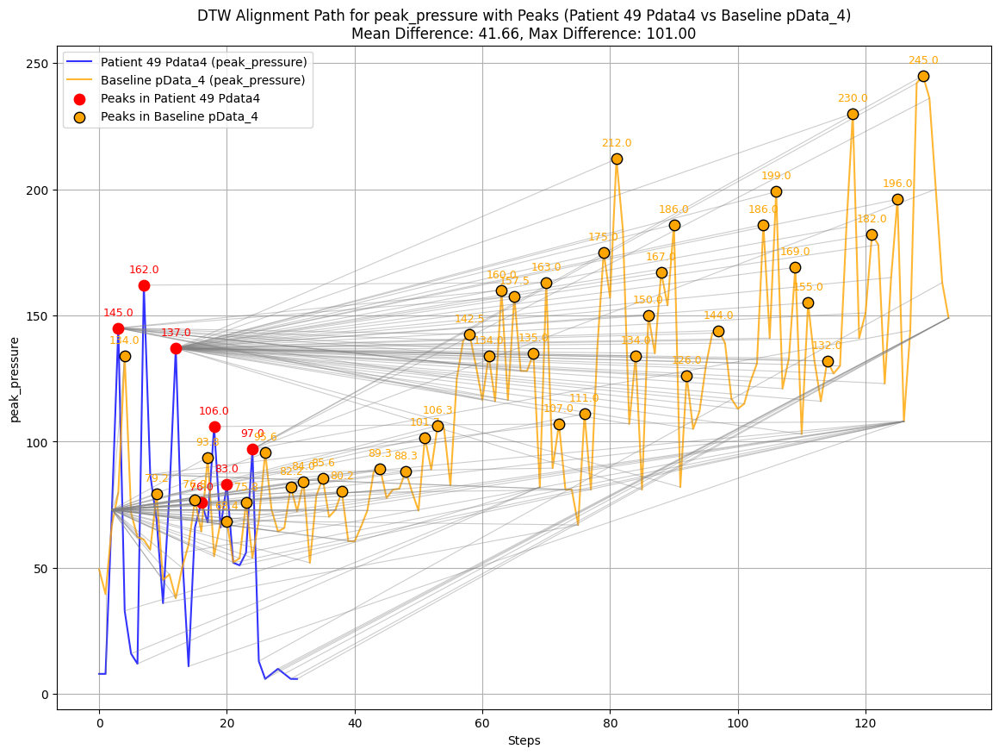

In [184]:
plot_dtw_alignment_with_peaks(p49_pdata4, baseline_path4, 'peak_pressure', label1="Patient 49 Pdata4", label2="Baseline pData_4")

## Comparision Between all 4 regions

In [185]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from dtaidistance import dtw

def pad_to_max_length(arrays):
    """Pad all arrays to the length of the longest array."""
    max_length = max(len(arr) for arr in arrays)
    padded_arrays = [np.pad(arr, (0, max_length - len(arr)), mode='constant', constant_values=np.nan) for arr in arrays]
    return padded_arrays

def plot_dtw_alignment_all_regions(baseline_paths, metric_name):
    """Plot DTW alignment with peaks for all pData regions."""
    plt.figure(figsize=(18, 10))
    
    colors = ['blue', 'orange', 'green', 'red']
    region_labels = ['pData', 'pData_2', 'pData_3', 'pData_4']
    step_values_list = []
    metric_values_list = []

    for path in baseline_paths:
        # Load baseline data
        baseline = pd.read_csv(path)
        steps = baseline['step_number'].values
        values = baseline[metric_name].fillna(0).values
        step_values_list.append(steps)
        metric_values_list.append(values)

    # Pad all step sequences and values to the same length
    padded_steps_list = pad_to_max_length(step_values_list)
    padded_values_list = pad_to_max_length(metric_values_list)

    for i in range(len(baseline_paths)):
        # Find peaks
        peaks, _ = find_peaks(padded_values_list[i], prominence=5)
        
        # Plot the peak pressure signal
        plt.plot(padded_steps_list[i], padded_values_list[i], label=f'{region_labels[i]} ({metric_name})', color=colors[i], alpha=0.8)
        plt.scatter(padded_steps_list[i][peaks], padded_values_list[i][peaks], label=f'Peaks in {region_labels[i]}', color=colors[i], edgecolor='black', s=80)

        # DTW alignment path
        if i > 0:
            alignment = dtw.warping_path(padded_values_list[0][~np.isnan(padded_values_list[0])], padded_values_list[i][~np.isnan(padded_values_list[i])])
            for (j, k) in alignment:
                plt.plot([j, k], [padded_values_list[0][j], padded_values_list[i][k]], color='gray', alpha=0.2, linewidth=0.7)

    plt.title(f"DTW Alignment with Peaks for {metric_name} (All Regions)")
    plt.xlabel("Steps")
    plt.ylabel(metric_name)
    plt.legend()
    plt.grid(True)
    plt.show()

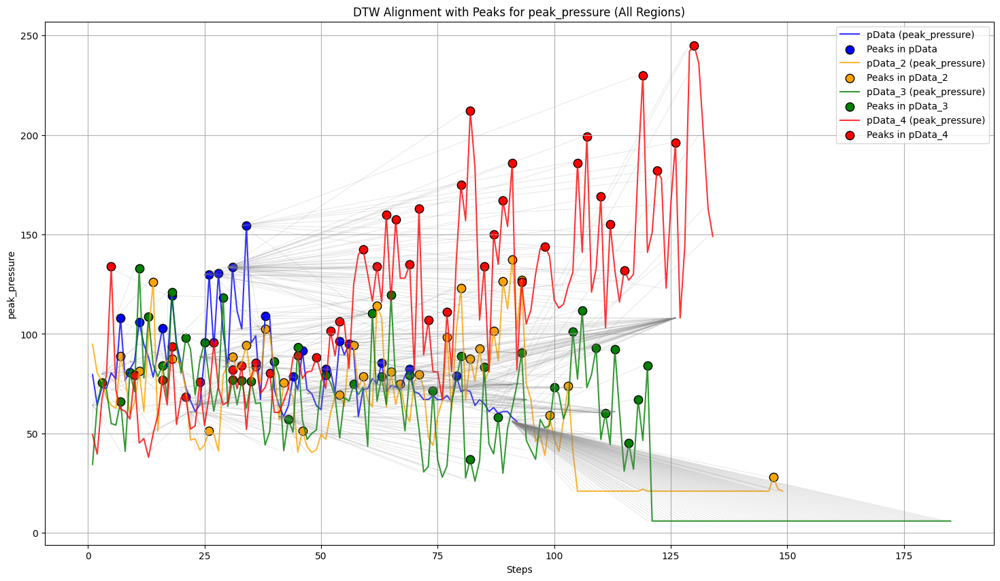

In [186]:
# Paths for stepwise baselines
baseline_paths = [
    r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv',
    r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_2_stepwise_baseline.csv',
    r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_3_stepwise_baseline.csv',
    r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv'
]

# Run the function for peak pressure
plot_dtw_alignment_all_regions(baseline_paths, 'peak_pressure')

# Pressure Analysis Across Regions

- Based on the normal human gait metatarsal region 2 and 3 are used during walking and running 
- Validating from the extracted stepwise metrics Dataset  
- Patients who are from region 1 will portray unique Gait

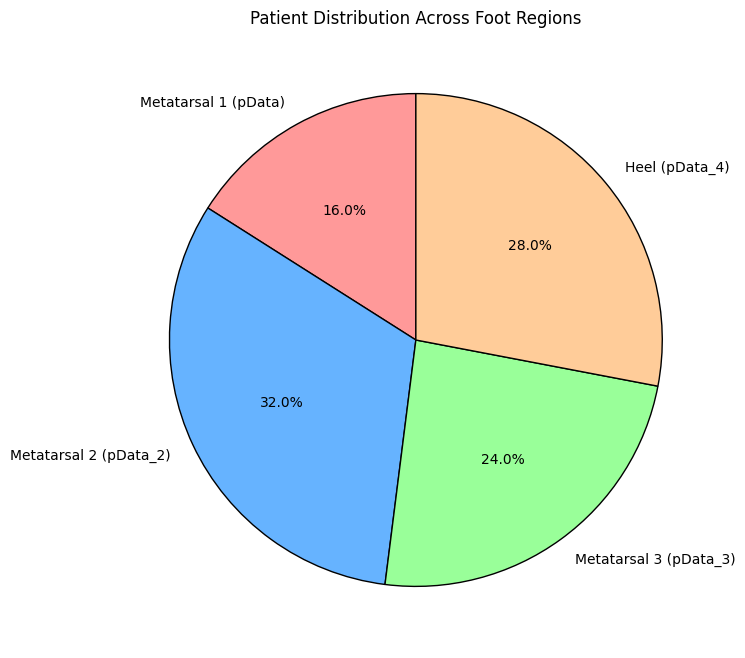

In [187]:
import matplotlib.pyplot as plt

# Patient distribution
patient_counts = {
    "Metatarsal 1 (pData)": 8,  # Example counts
    "Metatarsal 2 (pData_2)": 16,  # Replace with actual counts
    "Metatarsal 3 (pData_3)": 12,
    "Heel (pData_4)": 14
}

# Data for plotting
regions = list(patient_counts.keys())
counts = list(patient_counts.values())
colors = ["#ff9999", "#66b3ff", "#99ff99", "#ffcc99"]

# Create a pie chart shaped like a foot
plt.figure(figsize=(8, 8))
plt.pie(counts, labels=regions, autopct='%1.1f%%', startangle=90, colors=colors, wedgeprops={"edgecolor": "black"})

# Title and display
plt.title("Patient Distribution Across Foot Regions")
plt.show()


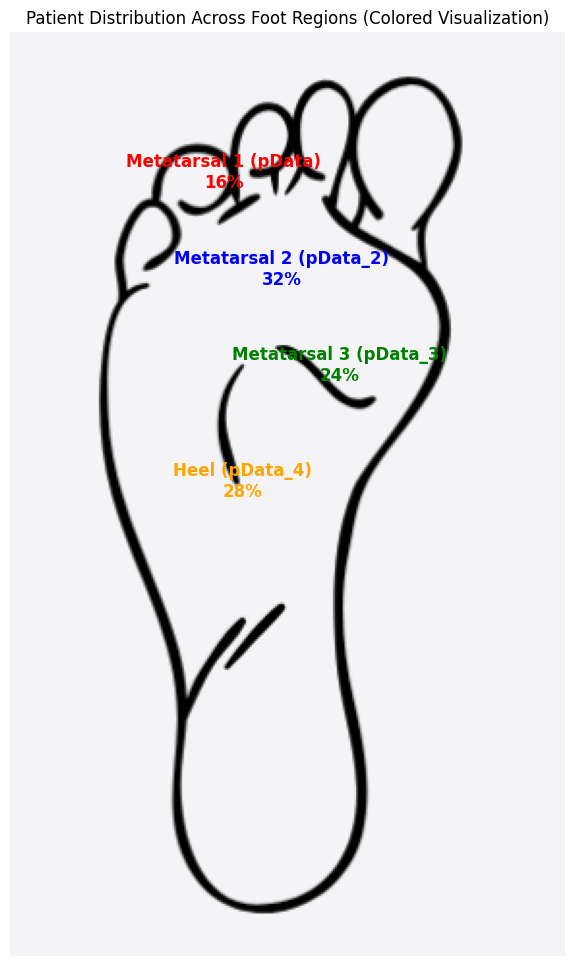

In [188]:
import matplotlib.pyplot as plt
from PIL import Image

# Load the foot image
image_path = r"D:\Study\Gait\right foot.png"  # Replace with your local image path
foot_image = Image.open(image_path)

# Patient distribution across foot regions (example data)
patient_distribution = {
    "Metatarsal 1 (pData)": 16,  # Percentage
    "Metatarsal 2 (pData_2)": 32,
    "Metatarsal 3 (pData_3)": 24,
    "Heel (pData_4)": 28,
}

# Positions for overlay text corresponding to the regions
region_positions = {
    "Metatarsal 1 (pData)": (110, 80),
    "Metatarsal 2 (pData_2)": (140, 130),
    "Metatarsal 3 (pData_3)": (170, 180),
    "Heel (pData_4)": (120, 240),
}

region_colors = {
    "Metatarsal 1 (pData)": "red",
    "Metatarsal 2 (pData_2)": "blue",
    "Metatarsal 3 (pData_3)": "green",
    "Heel (pData_4)": "orange",
}

plt.figure(figsize=(8, 12))
plt.imshow(foot_image)
plt.axis('off')

# Overlay text with colors
for region, pos in region_positions.items():
    percentage = patient_distribution[region]
    plt.text(pos[0], pos[1], f"{region}\n{percentage}%", ha='center', color=region_colors[region], fontsize=12, weight='bold')

plt.title("Patient Distribution Across Foot Regions (Colored Visualization)")
plt.show()



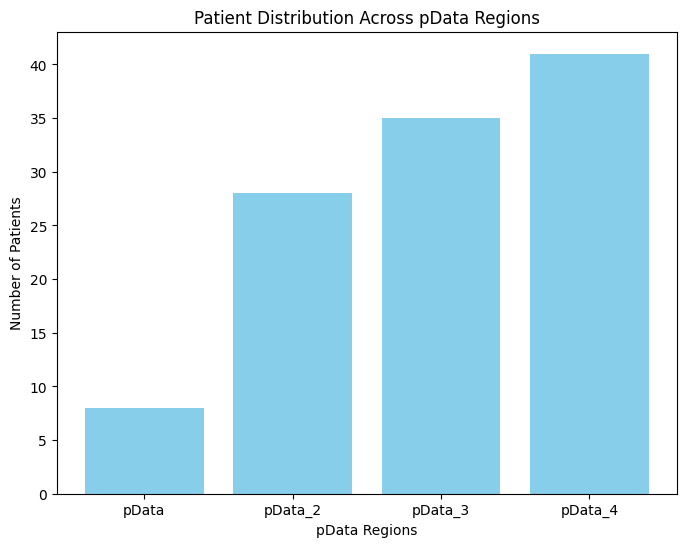

In [189]:
import os  # Required to list directories
import matplotlib.pyplot as plt

# Patient counts for each region
patient_counts = {
    "pData": len(next(os.walk(r'D:\Study\Gait\Step_Segmentation_Metrics\pData'))[1]),
    "pData_2": len(next(os.walk(r'D:\Study\Gait\Step_Segmentation_Metrics\pData_2'))[1]),
    "pData_3": len(next(os.walk(r'D:\Study\Gait\Step_Segmentation_Metrics\pData_3'))[1]),
    "pData_4": len(next(os.walk(r'D:\Study\Gait\Step_Segmentation_Metrics\pData_4'))[1])
}

# Plotting
plt.figure(figsize=(8, 6))
plt.bar(patient_counts.keys(), patient_counts.values(), color='skyblue')
plt.xlabel("pData Regions")
plt.ylabel("Number of Patients")
plt.title("Patient Distribution Across pData Regions")
plt.show()


C:\Users\samiu\AppData\Local\Temp\ipykernel_27112\3708582467.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Region", y="Step Count", data=df_step_counts, palette="Blues_d")


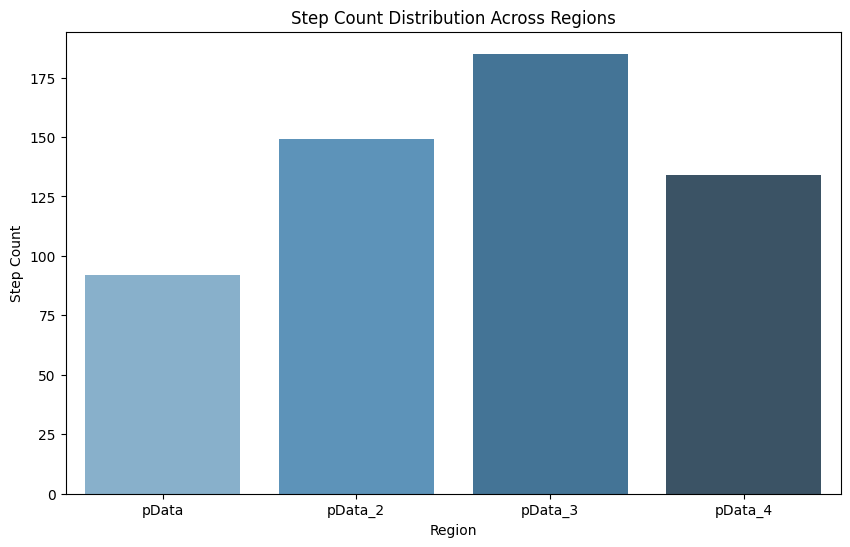

In [190]:
import pandas as pd
import seaborn as sns

# Example: Load stepwise baseline paths for all regions
baseline_paths = {
    "pData": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv',
    "pData_2": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_2_stepwise_baseline.csv',
    "pData_3": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_3_stepwise_baseline.csv',
    "pData_4": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv'
}

step_counts = []

for region, path in baseline_paths.items():
    df = pd.read_csv(path)
    step_counts.append({"Region": region, "Step Count": len(df)})

df_step_counts = pd.DataFrame(step_counts)
plt.figure(figsize=(10, 6))
sns.barplot(x="Region", y="Step Count", data=df_step_counts, palette="Blues_d")
plt.title("Step Count Distribution Across Regions")
plt.show()


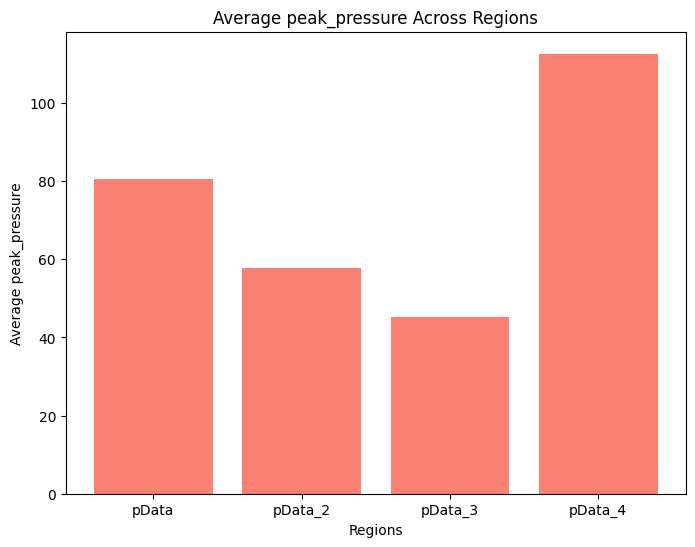

In [191]:
metric_name = "peak_pressure"
mean_metrics = {}

for region, path in baseline_paths.items():
    df = pd.read_csv(path)
    mean_metrics[region] = df[metric_name].mean()

plt.figure(figsize=(8, 6))
plt.bar(mean_metrics.keys(), mean_metrics.values(), color='salmon')
plt.xlabel("Regions")
plt.ylabel(f"Average {metric_name}")
plt.title(f"Average {metric_name} Across Regions")
plt.show()


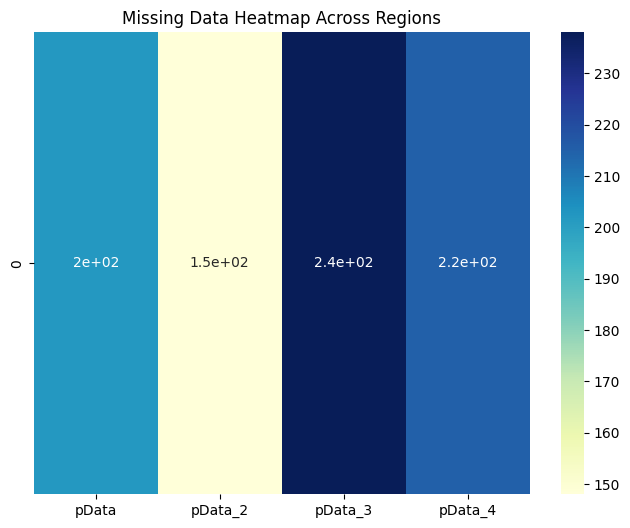

In [192]:
import numpy as np
import seaborn as sns

missing_data = {}

for region, path in baseline_paths.items():
    df = pd.read_csv(path)
    missing_steps = df.isna().sum().sum()
    missing_data[region] = missing_steps

plt.figure(figsize=(8, 6))
sns.heatmap(pd.DataFrame(missing_data, index=[0]), cmap="YlGnBu", annot=True)
plt.title("Missing Data Heatmap Across Regions")
plt.show()


Next Steps for Further Insights:
Statistical Analysis:

Calculate the average difference in peak pressure between the aligned steps to quantify the variance.
Calculate the percentage of aligned steps where pData_4 exceeds a certain threshold compared to pData.
Sub-step Investigation:

Focus on sub-regions (e.g., heel, midfoot, toe) to see which part of the foot contributes to the differences.
Feature Importance:

Use an explainability method (like SHAP) to explain whether specific steps or phases of the gait contribute to high-pressure deviations.
Region Comparisons:

Run similar DTW comparisons between other metrics (e.g., AUC, rise/descent gradient) to determine if pressure differences correlate with gradient changes or other metrics.
Outlier Detection:

Check for steps that may act as outliers (e.g., very high peak pressure for a single step) and investigate the cause.

# Overall Pressure Analysis on Each region

In [193]:
def plot_pressure_distribution_across_regions(baseline_paths, metric_name='peak_pressure'):
    """
    Visualize pressure distribution as heatmaps and line plots for each region.
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 16))
    axes = axes.flatten()
    region_names = ['pData', 'pData_2', 'pData_3', 'pData_4']

    for i, (region, path) in enumerate(baseline_paths.items()):
        df = pd.read_csv(path)
        values = df[metric_name].fillna(0).values

        # Line plot of pressure distribution
        axes[i].plot(values, label=f'{region} - {metric_name}', color='blue')
        axes[i].set_title(f'{region} - {metric_name} Trend')
        axes[i].set_xlabel('Steps')
        axes[i].set_ylabel(f'{metric_name.capitalize()}')
        axes[i].legend()
        axes[i].grid(True)

    plt.tight_layout()
    plt.show()

    # Heatmap of pressure distributions
    all_metrics = {region: pd.read_csv(path)[metric_name].fillna(0).values for region, path in baseline_paths.items()}
    max_steps = max([len(v) for v in all_metrics.values()])
    combined_metrics = pd.DataFrame({region: np.pad(v, (0, max_steps - len(v)), 'constant', constant_values=np.nan) for region, v in all_metrics.items()})

    plt.figure(figsize=(10, 8))
    sns.heatmap(combined_metrics.T, cmap='coolwarm', cbar=True, annot=False)
    plt.title(f'{metric_name.capitalize()} Heatmap Across Regions')
    plt.xlabel('Step Number')
    plt.ylabel('Regions')
    plt.show()

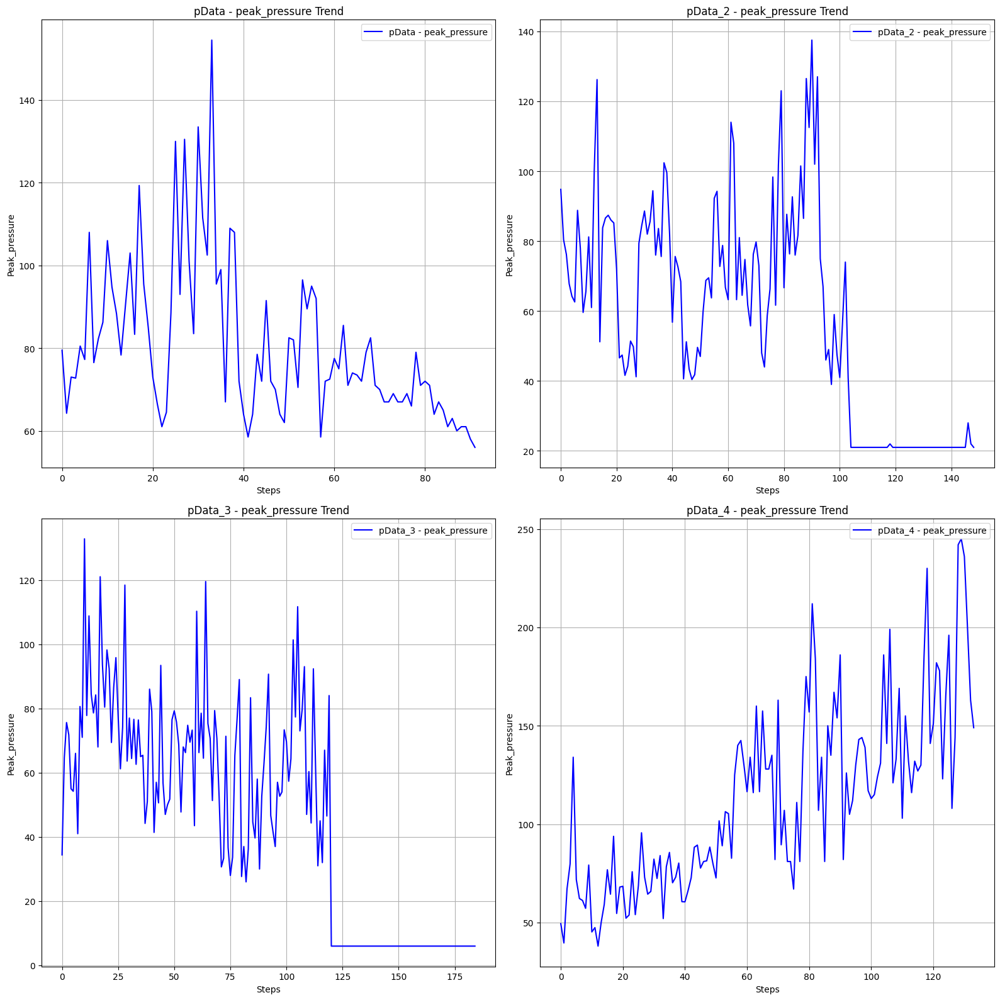

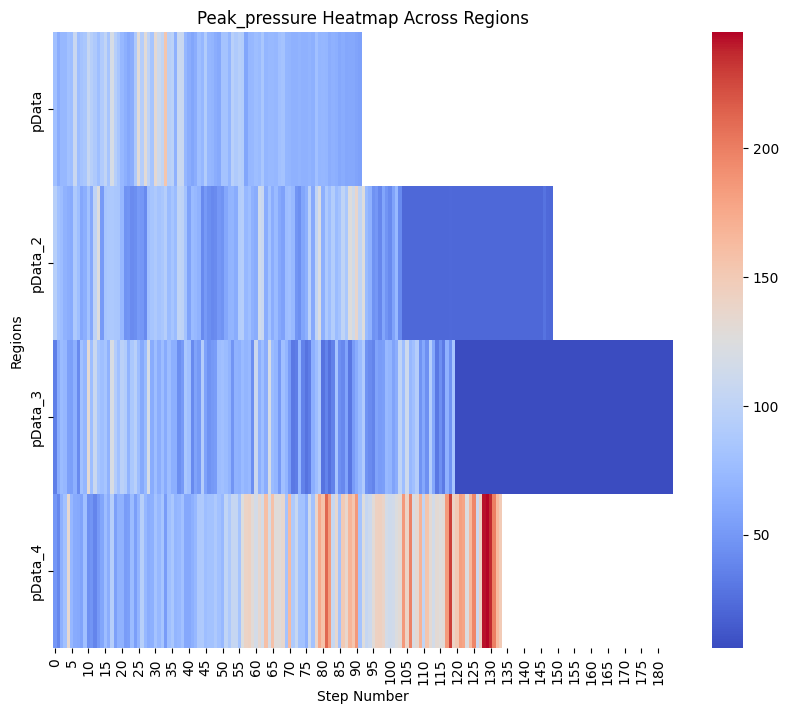

In [194]:
# Example usage:
baseline_paths = {
    "pData": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv',
    "pData_2": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_2_stepwise_baseline.csv',
    "pData_3": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_3_stepwise_baseline.csv',
    "pData_4": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv'
}
plot_pressure_distribution_across_regions(baseline_paths, metric_name='peak_pressure')

Intensity by Region:

- pData (Metatarsal 1): Displays consistently low peak pressures across the steps with a uniform light-blue shade.
- pData_2 (Metatarsal 2): Has a noticeable patch of darker blue, indicating relatively low pressures across most steps.
- pData_3 (Metatarsal 3): Shows a higher variation with some lighter patches and slight reds at certain steps.
- pData_4 (Heel): Demonstrates the highest variability with bright red sections, indicating strong peak pressures at specific steps.
Step Variability:

- pData_4 (Heel) has more frequent occurrences of high-pressure peaks compared to the metatarsal regions.
- pData_2 and pData appear to have lower peak pressures consistently, likely due to a different foot loading pattern or reduced activity in the metatarsal 1 and 2 areas.



## Anomaly Detection (Outliers in Gait Patterns)

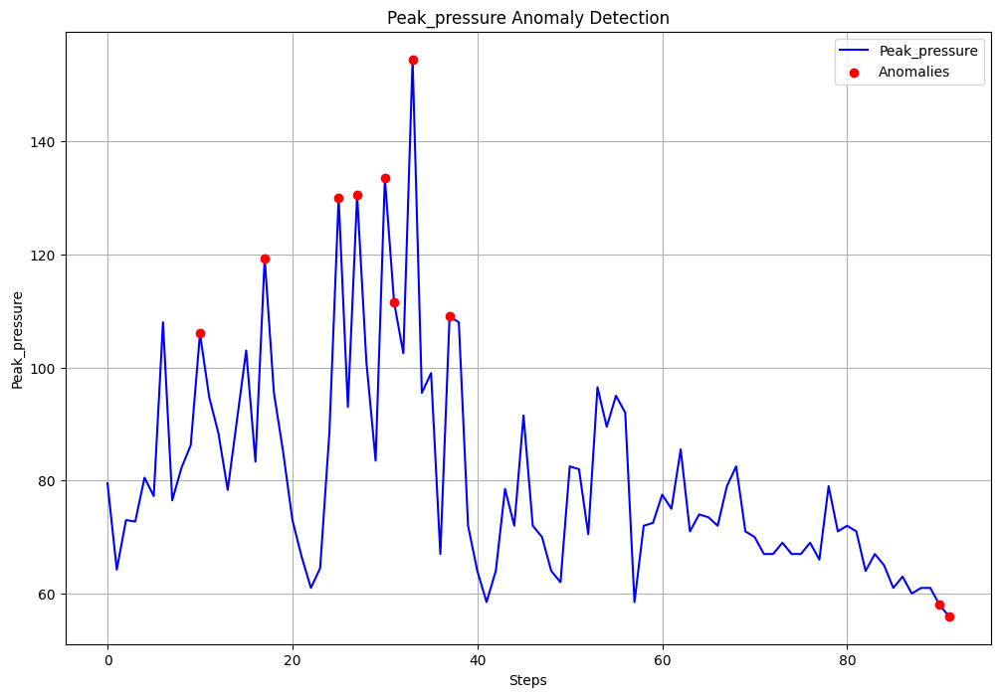

In [195]:
from sklearn.ensemble import IsolationForest
import shap

def detect_anomalies_and_visualize(baseline_path, metric_name='peak_pressure'):
    """
    Detect anomalies using Isolation Forest and visualize results.
    """
    df = pd.read_csv(baseline_path)
    values = df[metric_name].fillna(0).values.reshape(-1, 1)
    
    # Train Isolation Forest
    iso_forest = IsolationForest(contamination=0.1, random_state=42)
    predictions = iso_forest.fit_predict(values)
    
    # Highlight anomalies
    anomaly_indices = np.where(predictions == -1)[0]
    
    plt.figure(figsize=(12, 8))
    plt.plot(values, label=f'{metric_name.capitalize()}', color='blue')
    plt.scatter(anomaly_indices, values[anomaly_indices], color='red', label='Anomalies', zorder=5)
    plt.title(f'{metric_name.capitalize()} Anomaly Detection')
    plt.xlabel('Steps')
    plt.ylabel(f'{metric_name.capitalize()}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example usage:
detect_anomalies_and_visualize(r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv')


## Inter-region Correlation

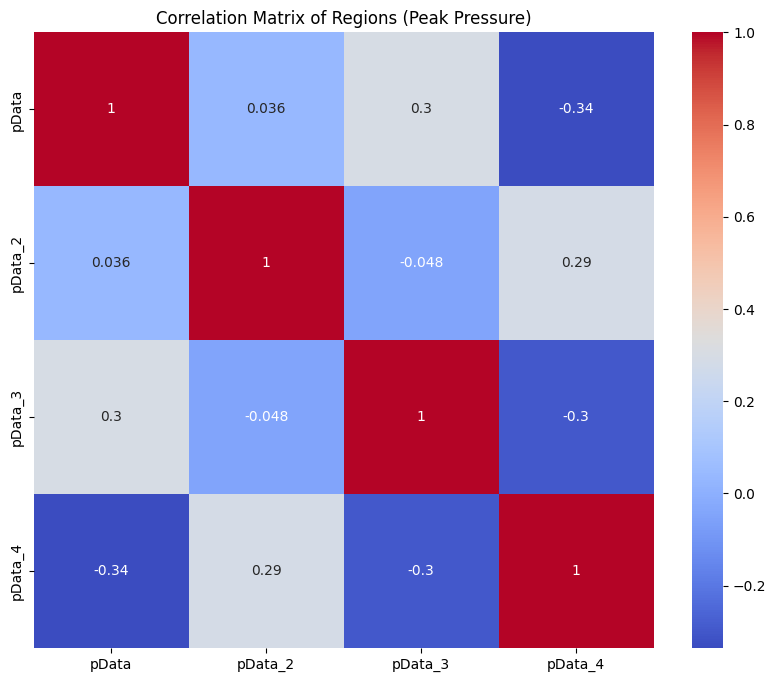

In [196]:
def plot_region_correlation(baseline_paths):
    """
    Plot correlation heatmap between different regions.
    """
    combined_df = pd.DataFrame()

    for region, path in baseline_paths.items():
        df = pd.read_csv(path)
        combined_df[region] = df['peak_pressure'].fillna(0)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(combined_df.corr(), annot=True, cmap='coolwarm')
    plt.title('Correlation Matrix of Regions (Peak Pressure)')
    plt.show()

# Example usage:
plot_region_correlation(baseline_paths)


- The correlation between pData (Metatarsal 1) and pData_2 (Metatarsal 2) is close to 0.036, indicating almost no correlation.
- There is a strong negative correlation (-0.34) between pData (Metatarsal 1) and pData_4 (Heel), meaning when peak pressure increases in one, it tends to decrease in the other.
- Metatarsal 2 (pData_2) and Heel (pData_4) have a weak positive correlation (0.29).
- The strongest correlation is between pData (Metatarsal 1) and pData_3 (Metatarsal 3), indicating a moderate positive relationship.
- Since the correlations between metatarsals and heel regions are low or negative, patients may be shifting pressure away from metatarsal regions when applying higher heel pressure.

## Duration of Peak Pressure Retention

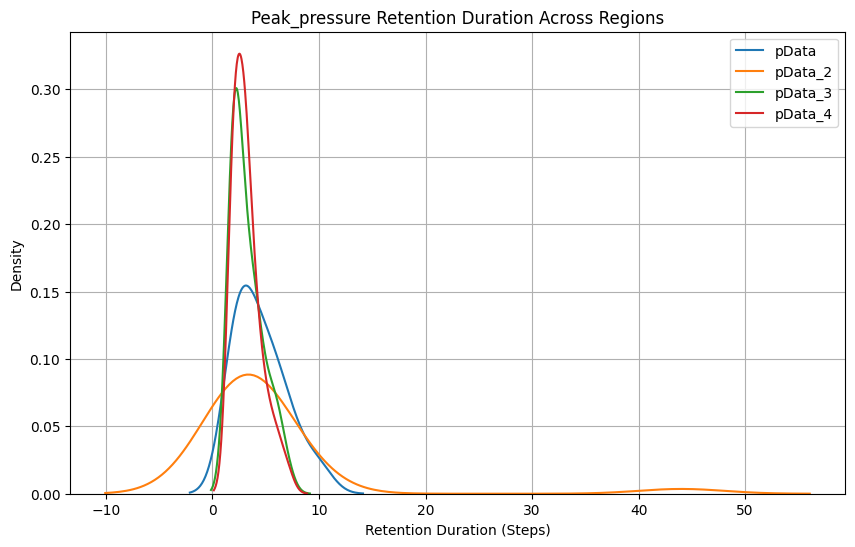

In [197]:
def plot_pressure_retention(baseline_paths, metric_name='peak_pressure'):
    """
    Plot pressure retention durations for each region.
    """
    retention_durations = {}

    for region, path in baseline_paths.items():
        df = pd.read_csv(path)
        values = df[metric_name].fillna(0).values
        peaks, _ = find_peaks(values, prominence=5)
        retention_durations[region] = np.diff(peaks)

    plt.figure(figsize=(10, 6))
    for region, durations in retention_durations.items():
        sns.kdeplot(durations, label=region)
    
    plt.title(f'{metric_name.capitalize()} Retention Duration Across Regions')
    plt.xlabel('Retention Duration (Steps)')
    plt.ylabel('Density')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example usage:
plot_pressure_retention(baseline_paths)


- Heel (pData_4, red curve): Shows the sharpest and narrowest peak, indicating that most patients consistently retain peak pressure for a short duration (typically between 1 to 5 steps).
- Metatarsal 1 (pData, blue curve): Has a broader distribution, indicating more variability in retention times, with some patients retaining pressure for longer.
- Metatarsal 2 (pData_2, orange curve): Shows an extended distribution compared to other regions, indicating that in some cases, peak pressure is retained for longer durations.
- Metatarsal 3 (pData_3, green curve): Similar to Metatarsal 1 but has fewer outliers and a more centralized distribution.


# Insight Into Paitents of Metatarsal 1 or Toe Region

In [198]:
p114_pdata4 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_114\step_metrics.csv' 
p116_pdata4 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_116\step_metrics.csv' 
p240_pdata4 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_240\step_metrics.csv' 
p296_pdata4 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_296\step_metrics.csv' 
p325_pdata4 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_325\step_metrics.csv' 
p352_pdata4 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_352\step_metrics.csv' 
p381_pdata4 = r'D:\Study\Gait\Step_Segmentation_Metrics\pData_4\patient_381\step_metrics.csv' 

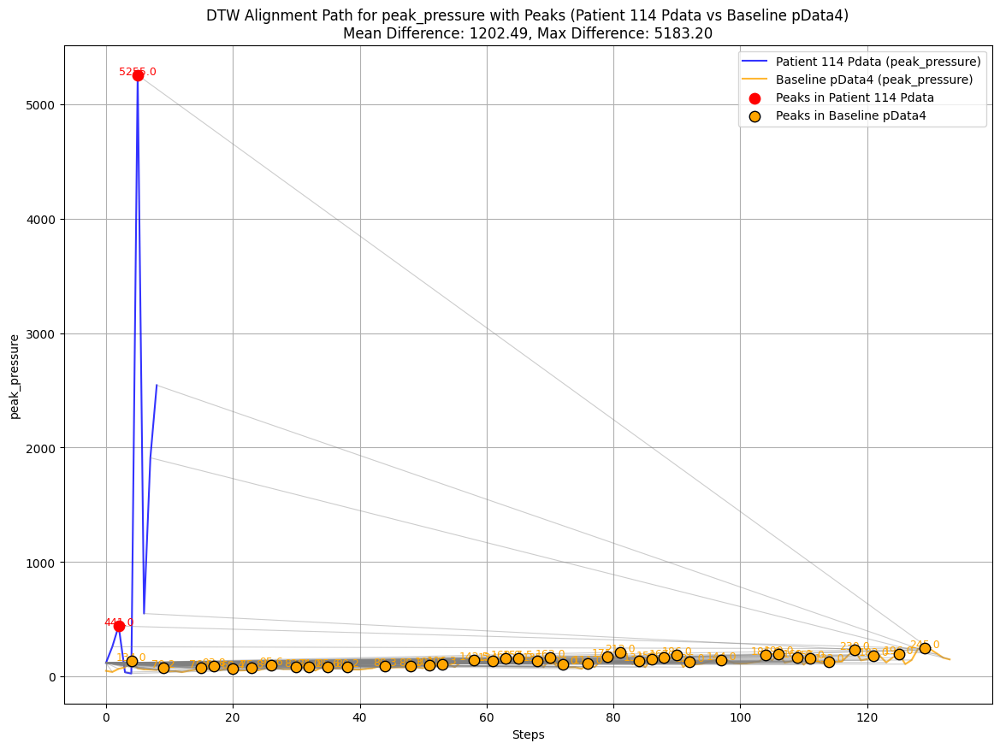

In [199]:
plot_dtw_alignment_with_peaks(p114_pdata4, baseline_path4, 'peak_pressure', label1="Patient 114 Pdata", label2="Baseline pData4")

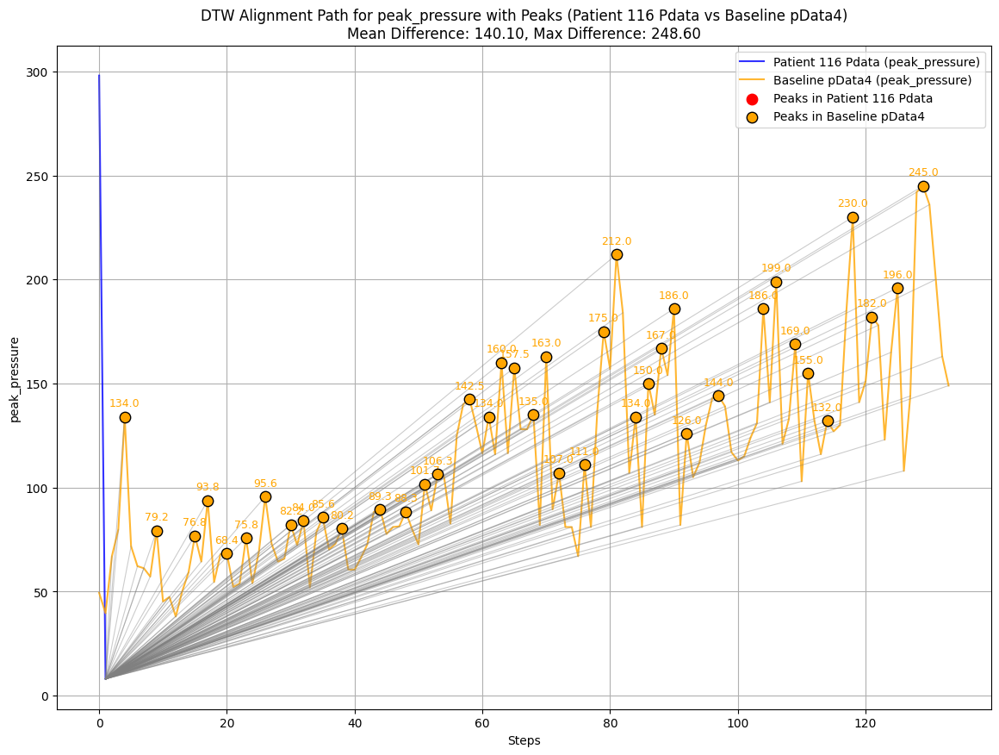

In [200]:
plot_dtw_alignment_with_peaks(p116_pdata4, baseline_path4, 'peak_pressure', label1="Patient 116 Pdata", label2="Baseline pData4")

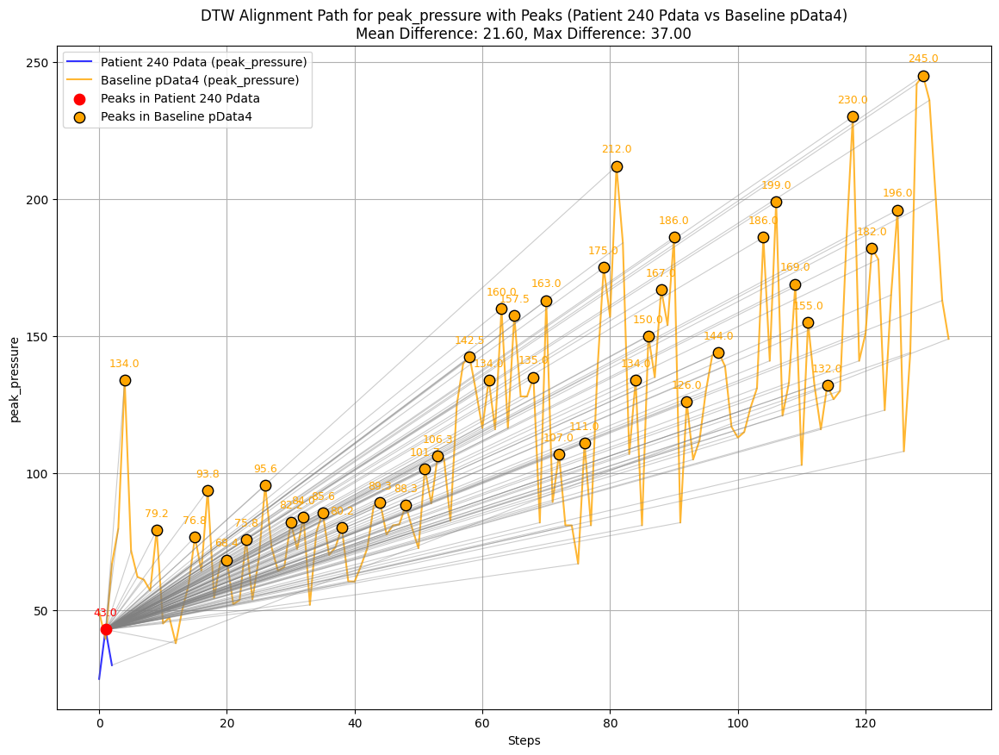

In [201]:
plot_dtw_alignment_with_peaks(p240_pdata4, baseline_path4, 'peak_pressure', label1="Patient 240 Pdata", label2="Baseline pData4")

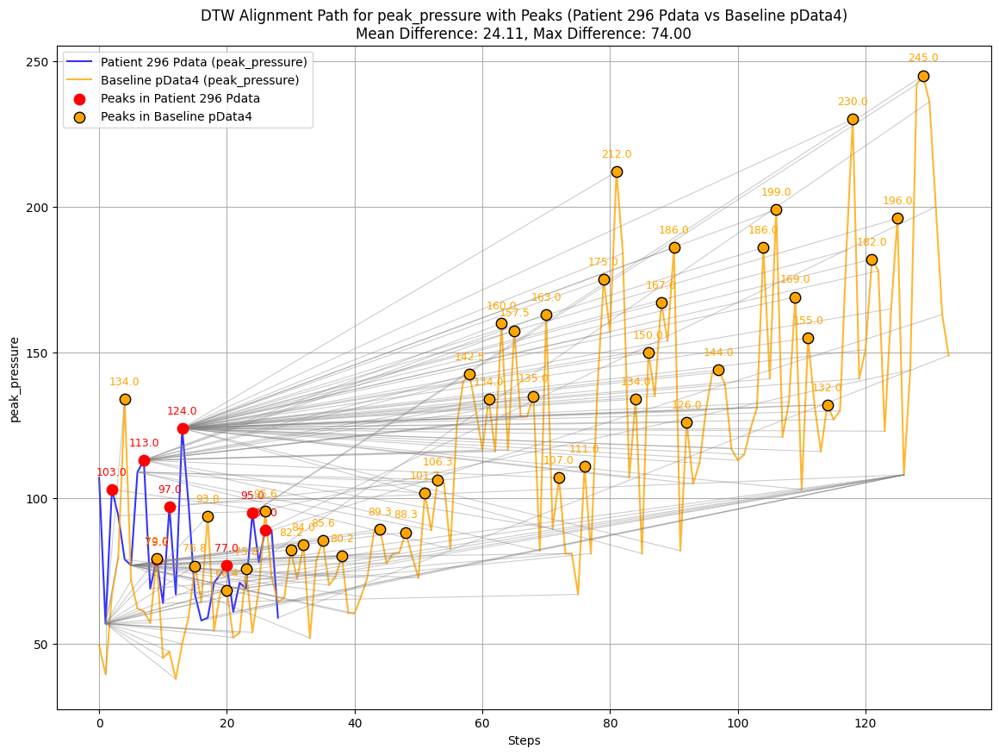

In [202]:
plot_dtw_alignment_with_peaks(p296_pdata4, baseline_path4, 'peak_pressure', label1="Patient 296 Pdata", label2="Baseline pData4")

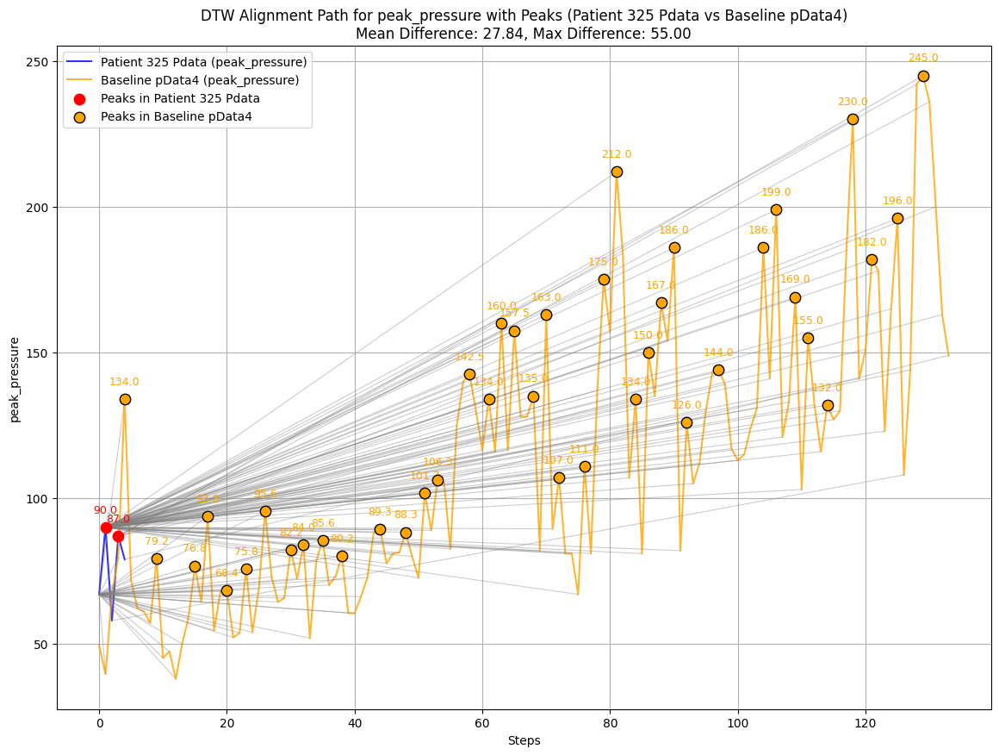

In [203]:
plot_dtw_alignment_with_peaks(p325_pdata4, baseline_path4, 'peak_pressure', label1="Patient 325 Pdata", label2="Baseline pData4")

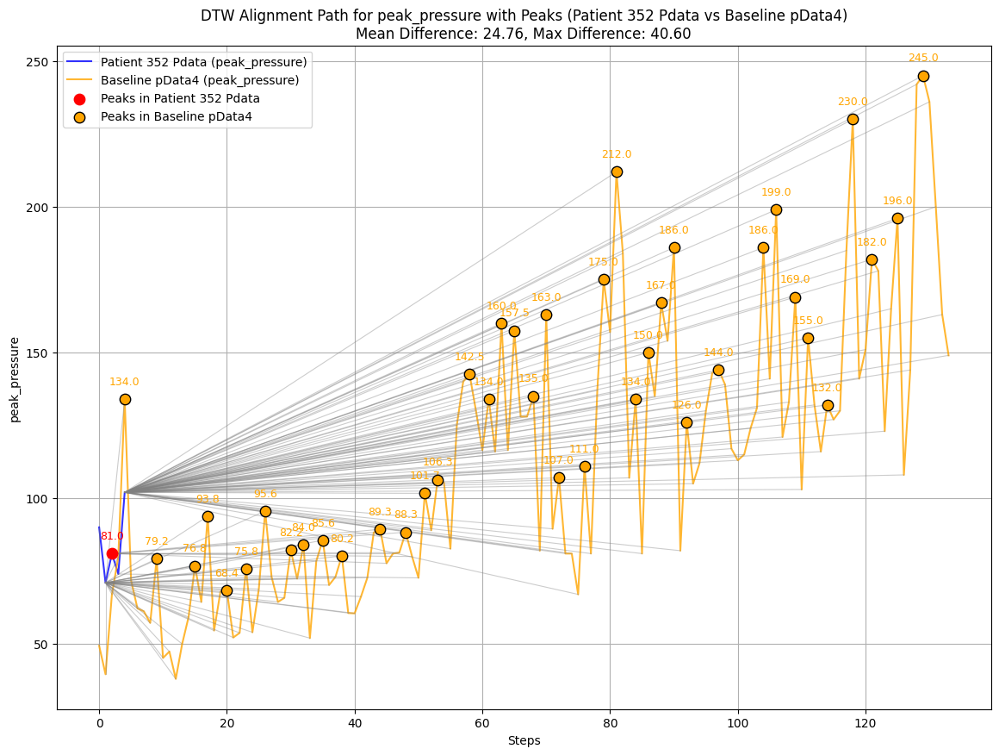

In [204]:
plot_dtw_alignment_with_peaks(p352_pdata4, baseline_path4, 'peak_pressure', label1="Patient 352 Pdata", label2="Baseline pData4")

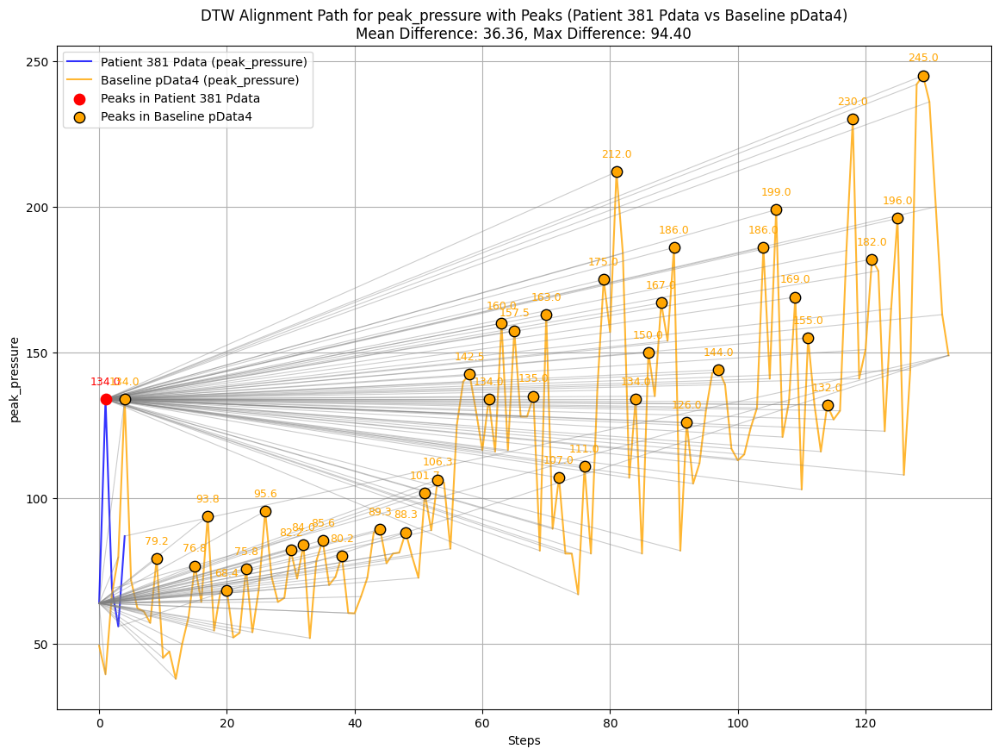

In [205]:
plot_dtw_alignment_with_peaks(p381_pdata4, baseline_path4, 'peak_pressure', label1="Patient 381 Pdata", label2="Baseline pData4")

# AUC Analysis

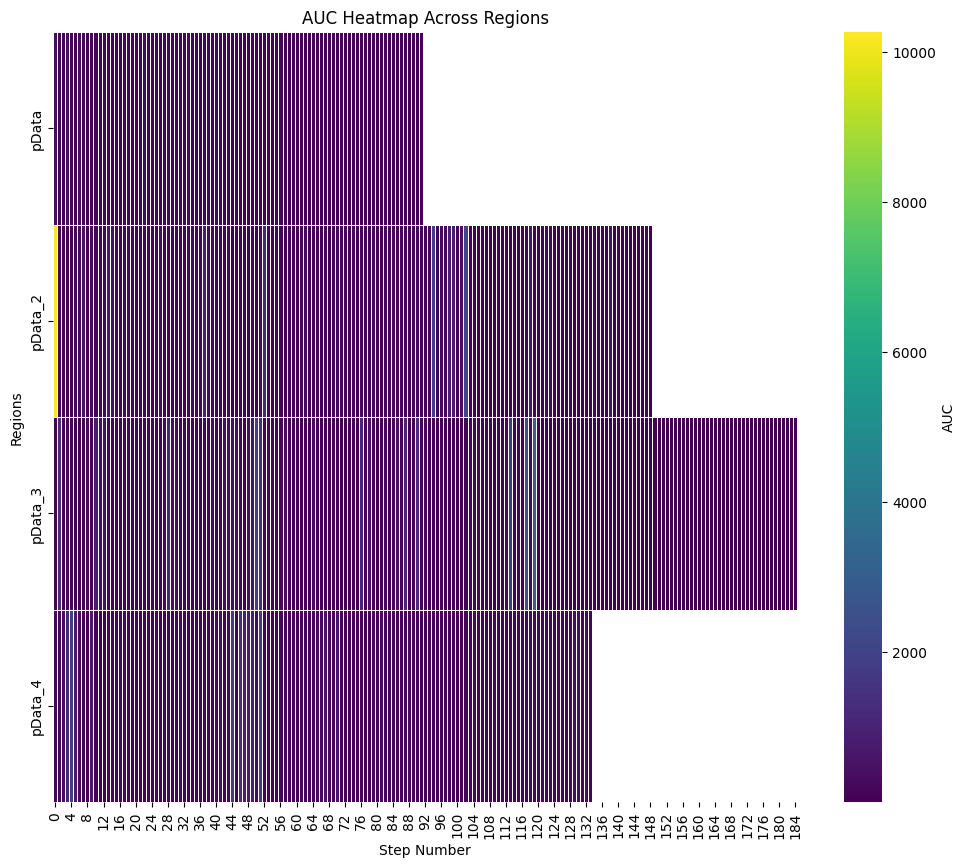

In [206]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Paths to stepwise baseline files for all regions
baseline_paths = {
    "pData": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv',
    "pData_2": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_2_stepwise_baseline.csv',
    "pData_3": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_3_stepwise_baseline.csv',
    "pData_4": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv'
}

# Load AUC values for all regions
auc_values = {}
for region, path in baseline_paths.items():
    df = pd.read_csv(path)
    auc_values[region] = df['auc'].fillna(0).values  # Replace NaNs with 0

# Create a DataFrame for visualization
max_steps = max([len(values) for values in auc_values.values()])
auc_df = pd.DataFrame({region: np.pad(values, (0, max_steps - len(values)), mode='constant', constant_values=np.nan) 
                       for region, values in auc_values.items()})

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(auc_df.T, cmap='viridis', cbar_kws={'label': 'AUC'}, linewidths=0.5)
plt.title("AUC Heatmap Across Regions")
plt.xlabel("Step Number")
plt.ylabel("Regions")
plt.show()


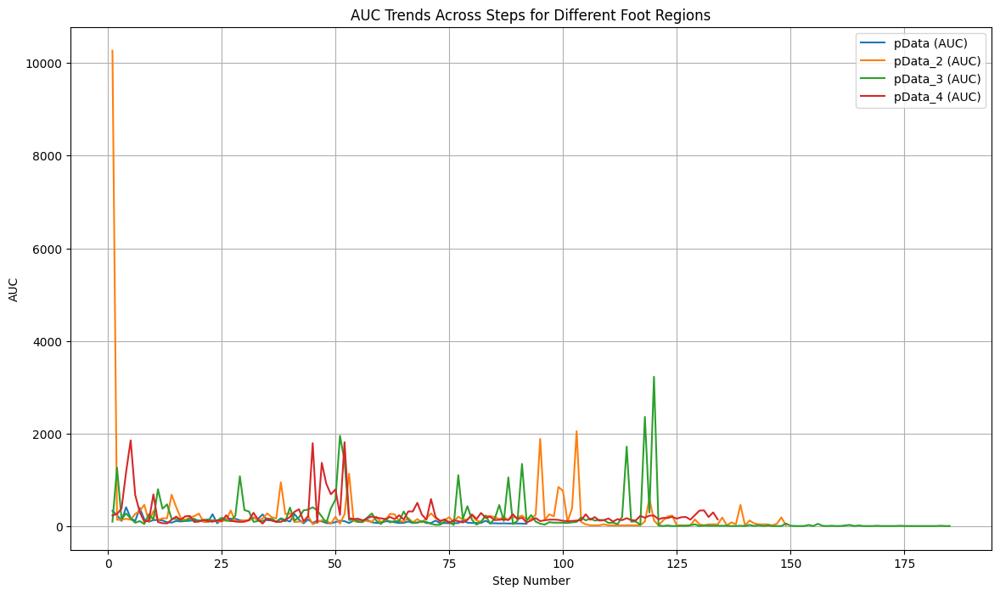

In [207]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_auc_trends_across_regions(baseline_paths):
    plt.figure(figsize=(14, 8))
    
    for region, path in baseline_paths.items():
        df = pd.read_csv(path)
        auc_values = df['auc'].fillna(0).values
        plt.plot(df['step_number'], auc_values, label=f"{region} (AUC)")
    
    plt.title("AUC Trends Across Steps for Different Foot Regions")
    plt.xlabel("Step Number")
    plt.ylabel("AUC")
    plt.legend()
    plt.grid(True)
    plt.show()

# Example Baseline Paths
baseline_paths = {
    "pData": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv',
    "pData_2": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_2_stepwise_baseline.csv',
    "pData_3": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_3_stepwise_baseline.csv',
    "pData_4": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv'
}

plot_auc_trends_across_regions(baseline_paths)


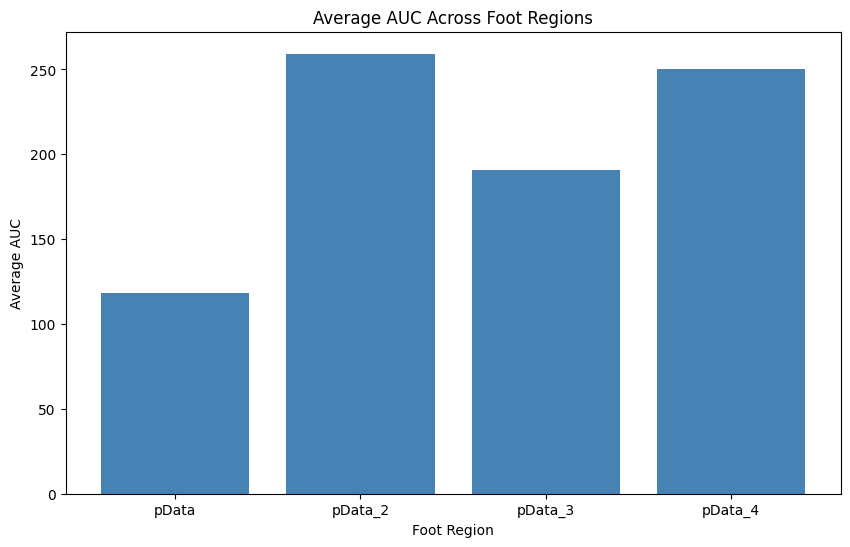

In [208]:
def plot_average_auc_per_region(baseline_paths):
    regions = []
    avg_auc_values = []

    for region, path in baseline_paths.items():
        df = pd.read_csv(path)
        avg_auc = df['auc'].mean()
        regions.append(region)
        avg_auc_values.append(avg_auc)

    plt.figure(figsize=(10, 6))
    plt.bar(regions, avg_auc_values, color='steelblue')
    plt.title("Average AUC Across Foot Regions")
    plt.xlabel("Foot Region")
    plt.ylabel("Average AUC")
    plt.show()

plot_average_auc_per_region(baseline_paths)


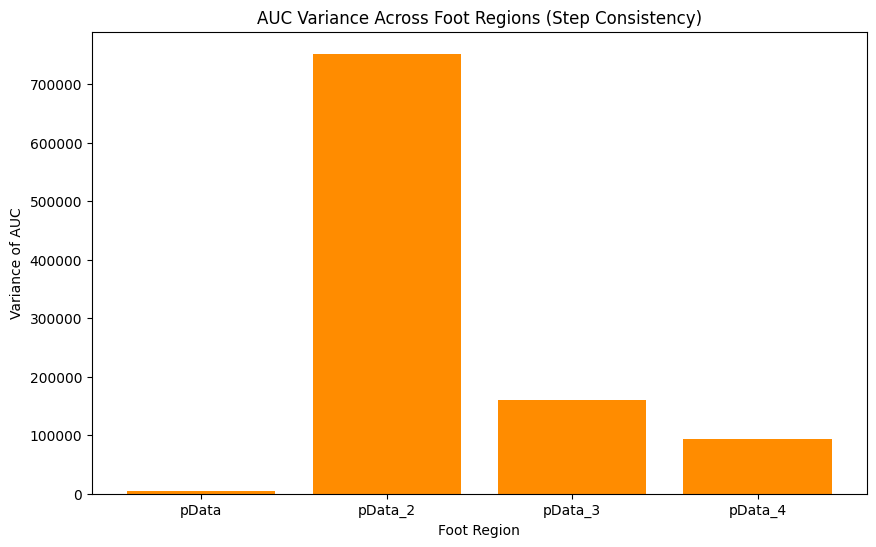

In [209]:
def plot_auc_variance_across_regions(baseline_paths):
    regions = []
    auc_variances = []

    for region, path in baseline_paths.items():
        df = pd.read_csv(path)
        auc_variance = df['auc'].var()  # Calculate variance of AUC
        regions.append(region)
        auc_variances.append(auc_variance)

    plt.figure(figsize=(10, 6))
    plt.bar(regions, auc_variances, color='darkorange')
    plt.title("AUC Variance Across Foot Regions (Step Consistency)")
    plt.xlabel("Foot Region")
    plt.ylabel("Variance of AUC")
    plt.show()

plot_auc_variance_across_regions(baseline_paths)


# Rise Gradient

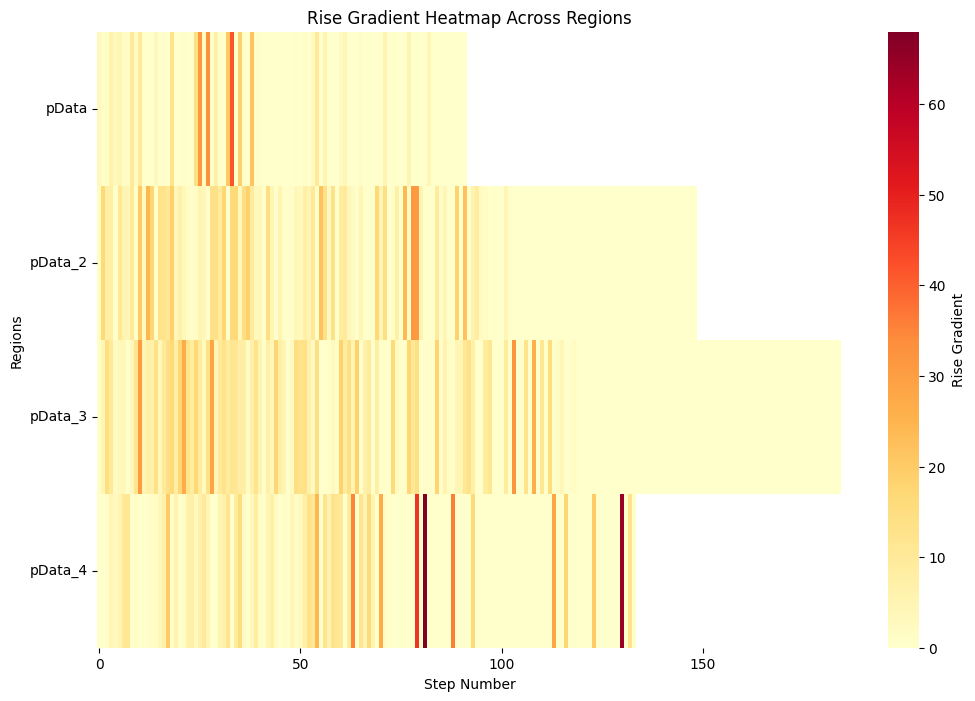

In [210]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

def plot_rise_gradient_heatmap_across_regions(baseline_paths):
    gradient_data = []
    regions = []

    for region, path in baseline_paths.items():
        df = pd.read_csv(path)
        rise_gradient_values = df['rise_gradient'].fillna(0).values
        gradient_data.append(rise_gradient_values)
        regions.append(region)

    # Pad sequences to the maximum length for alignment
    max_length = max([len(data) for data in gradient_data])
    padded_data = [np.pad(data, (0, max_length - len(data)), constant_values=np.nan) for data in gradient_data]

    plt.figure(figsize=(12, 8))
    sns.heatmap(np.array(padded_data), cmap="YlOrRd", cbar_kws={'label': 'Rise Gradient'}, xticklabels=50)
    plt.yticks(ticks=np.arange(len(regions)) + 0.5, labels=regions, rotation=0)
    plt.title("Rise Gradient Heatmap Across Regions")
    plt.xlabel("Step Number")
    plt.ylabel("Regions")
    plt.show()

# Paths to the baseline files
baseline_paths = {
    "pData": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv',
    "pData_2": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_2_stepwise_baseline.csv',
    "pData_3": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_3_stepwise_baseline.csv',
    "pData_4": r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv'
}

plot_rise_gradient_heatmap_across_regions(baseline_paths)


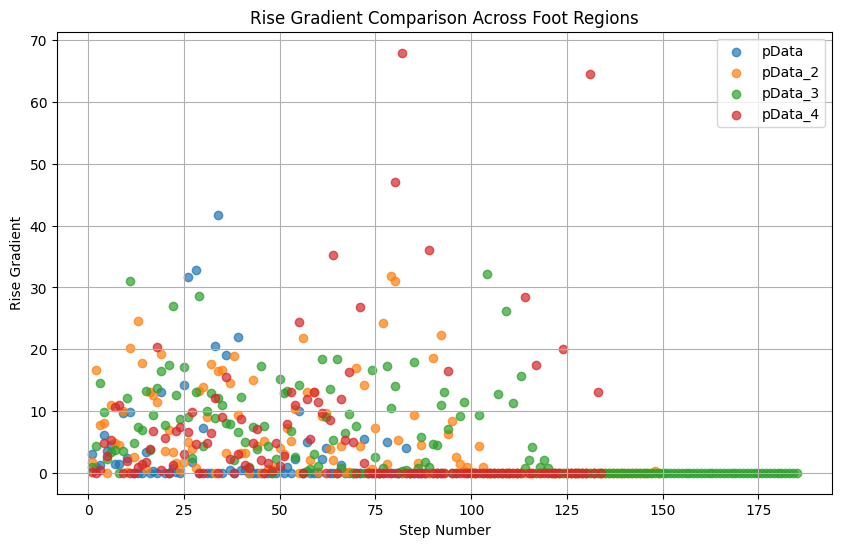

In [211]:
def plot_rise_gradient_scatter_comparison(baseline_paths):
    plt.figure(figsize=(10, 6))

    for region, path in baseline_paths.items():
        df = pd.read_csv(path)
        step_numbers = df['step_number']
        rise_gradients = df['rise_gradient'].fillna(0).values
        plt.scatter(step_numbers, rise_gradients, label=region, alpha=0.7)

    plt.title("Rise Gradient Comparison Across Foot Regions")
    plt.xlabel("Step Number")
    plt.ylabel("Rise Gradient")
    plt.legend()
    plt.grid(True)
    plt.show()

plot_rise_gradient_scatter_comparison(baseline_paths)


# Variance

C:\Users\samiu\AppData\Local\Temp\ipykernel_27112\391129695.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Region", y="Variance", data=df_variance, palette="Set2")


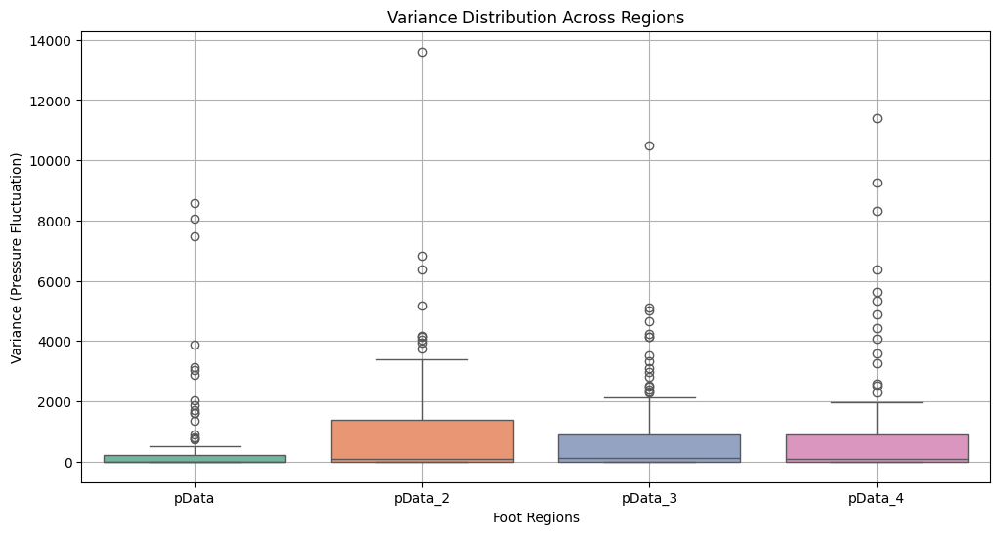

In [212]:
def plot_variance_boxplot_across_regions(baseline_paths):
    variance_data = []

    for region, path in baseline_paths.items():
        df = pd.read_csv(path)
        variances = df['variance'].fillna(0).values
        variance_data.extend([(region, var) for var in variances])

    df_variance = pd.DataFrame(variance_data, columns=["Region", "Variance"])

    plt.figure(figsize=(12, 6))
    sns.boxplot(x="Region", y="Variance", data=df_variance, palette="Set2")
    plt.title("Variance Distribution Across Regions")
    plt.xlabel("Foot Regions")
    plt.ylabel("Variance (Pressure Fluctuation)")
    plt.grid(True)
    plt.show()

plot_variance_boxplot_across_regions(baseline_paths)


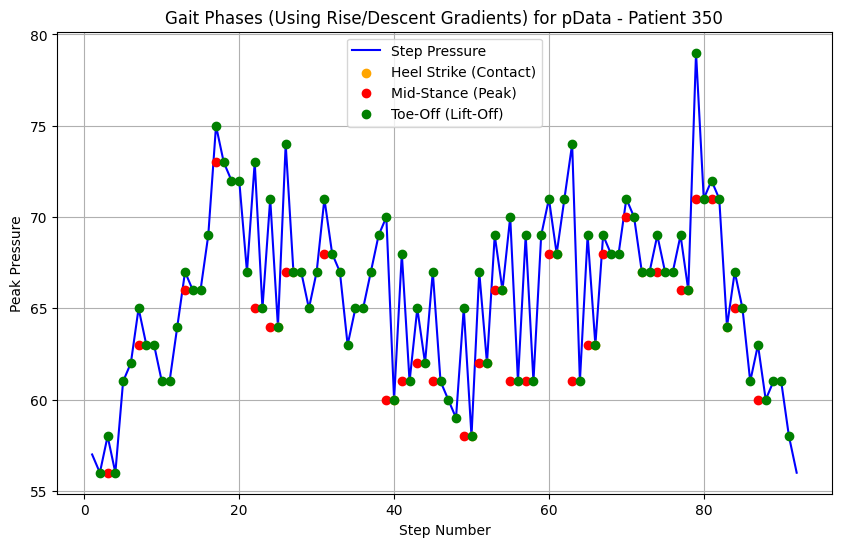


Summary for pData - Patient 350:
Number of Heel Strikes (Contact Points): 11
Number of Mid-Stances (Peak Pressure Points): 28
Number of Toe-Offs (Lift-Off Points): 90


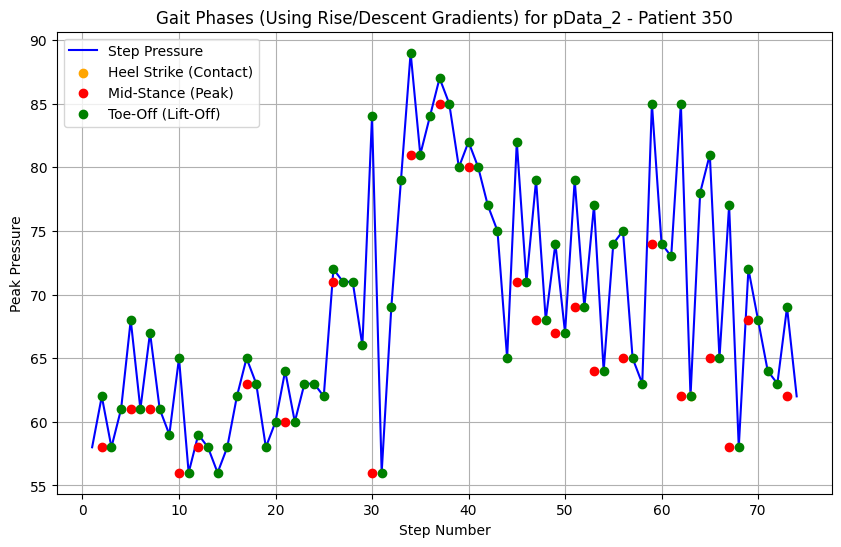


Summary for pData_2 - Patient 350:
Number of Heel Strikes (Contact Points): 1
Number of Mid-Stances (Peak Pressure Points): 24
Number of Toe-Offs (Lift-Off Points): 72


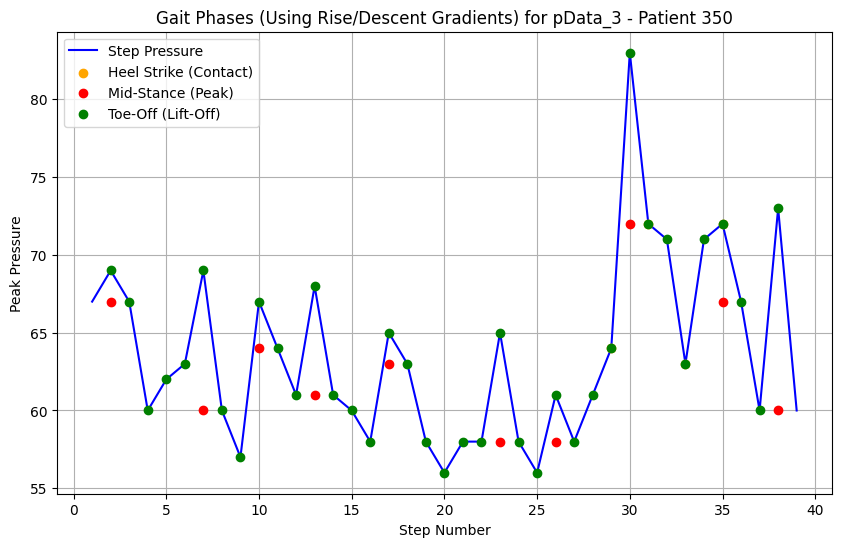


Summary for pData_3 - Patient 350:
Number of Heel Strikes (Contact Points): 4
Number of Mid-Stances (Peak Pressure Points): 10
Number of Toe-Offs (Lift-Off Points): 37


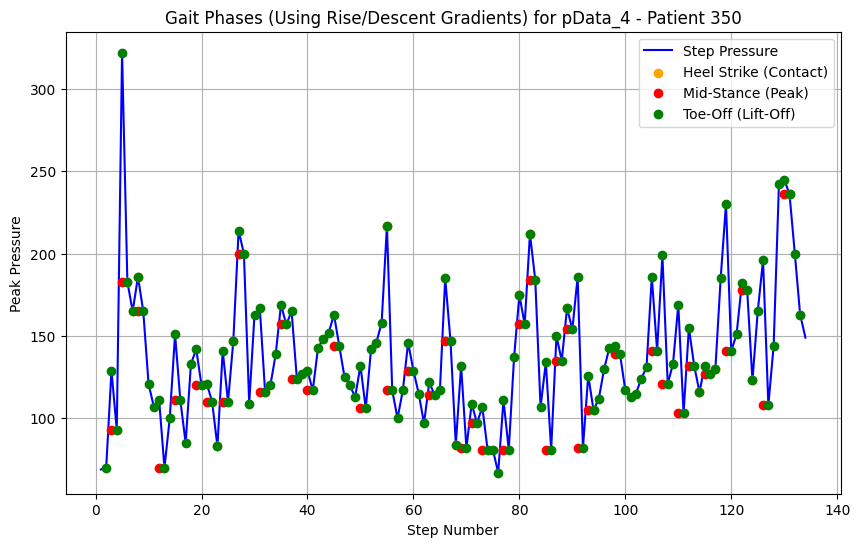


Summary for pData_4 - Patient 350:
Number of Heel Strikes (Contact Points): 22
Number of Mid-Stances (Peak Pressure Points): 40
Number of Toe-Offs (Lift-Off Points): 132


In [218]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os

# Function to detect gait phases using rise and descent gradients
def detect_gait_phases_with_gradients(patient_id):
    regions = ["pData", "pData_2", "pData_3", "pData_4"]
    base_dir = "Step_Segmentation_Metrics"

    for region in regions:
        file_path = os.path.join(base_dir, region, f"patient_{patient_id}", "step_metrics.csv")
        
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}")
            continue

        # Load step metrics data
        data = pd.read_csv(file_path)
        
        if "peak_pressure" not in data.columns or "rise_gradient" not in data.columns or "descent_gradient" not in data.columns:
            print(f"Required columns not found in {file_path}")
            continue
        
        # Initialize lists to store gait phase information
        heel_strikes = []  # Contact point (start of pressure increase)
        mid_stances = []   # Mid-stance point (maximum pressure)
        toe_offs = []      # Lift-off point (end of pressure application)

        # Thresholds for detecting phases
        rise_threshold = np.nanmean(data["rise_gradient"]) * 0.5
        descent_threshold = np.nanmean(data["descent_gradient"]) * 0.5

        for idx in range(1, len(data) - 1):
            rise_gradient = data.iloc[idx]["rise_gradient"]
            descent_gradient = data.iloc[idx]["descent_gradient"]

            # Detect heel strikes (sharp increase in pressure)
            if rise_gradient > rise_threshold:
                heel_strikes.append(data.iloc[idx]["step_number"])

            # Detect mid-stance (peak pressure point)
            if data.iloc[idx]["peak_pressure"] > data.iloc[idx - 1]["peak_pressure"] and data.iloc[idx]["peak_pressure"] > data.iloc[idx + 1]["peak_pressure"]:
                mid_stances.append(data.iloc[idx]["step_number"])

            # Detect toe-offs (sharp decrease in pressure)
            if descent_gradient < -descent_threshold:
                toe_offs.append(data.iloc[idx]["step_number"])

        # Plot the step pressures with gait phases
        plt.figure(figsize=(10, 6))
        sns.lineplot(x=data["step_number"], y=data["peak_pressure"], label="Step Pressure", color='blue')
        plt.scatter(heel_strikes, data["peak_pressure"].iloc[[i - 1 for i in heel_strikes]], label="Heel Strike (Contact)", color='orange', zorder=5)
        plt.scatter(mid_stances, data["peak_pressure"].iloc[mid_stances], label="Mid-Stance (Peak)", color='red', zorder=5)
        plt.scatter(toe_offs, data["peak_pressure"].iloc[[i - 1 for i in toe_offs]], label="Toe-Off (Lift-Off)", color='green', zorder=5)
        plt.title(f"Gait Phases (Using Rise/Descent Gradients) for {region} - Patient {patient_id}")
        plt.xlabel("Step Number")
        plt.ylabel("Peak Pressure")
        plt.legend()
        plt.grid(True)
        plt.show()

        print(f"\nSummary for {region} - Patient {patient_id}:")
        print(f"Number of Heel Strikes (Contact Points): {len(heel_strikes)}")
        print(f"Number of Mid-Stances (Peak Pressure Points): {len(mid_stances)}")
        print(f"Number of Toe-Offs (Lift-Off Points): {len(toe_offs)}")

# Example Usage
detect_gait_phases_with_gradients(patient_id=350)


In [219]:
# Example Usage
baseline_path1 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv'
baseline_path2 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_2_stepwise_baseline.csv'
baseline_path3 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_3_stepwise_baseline.csv'
baseline_path4 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv'

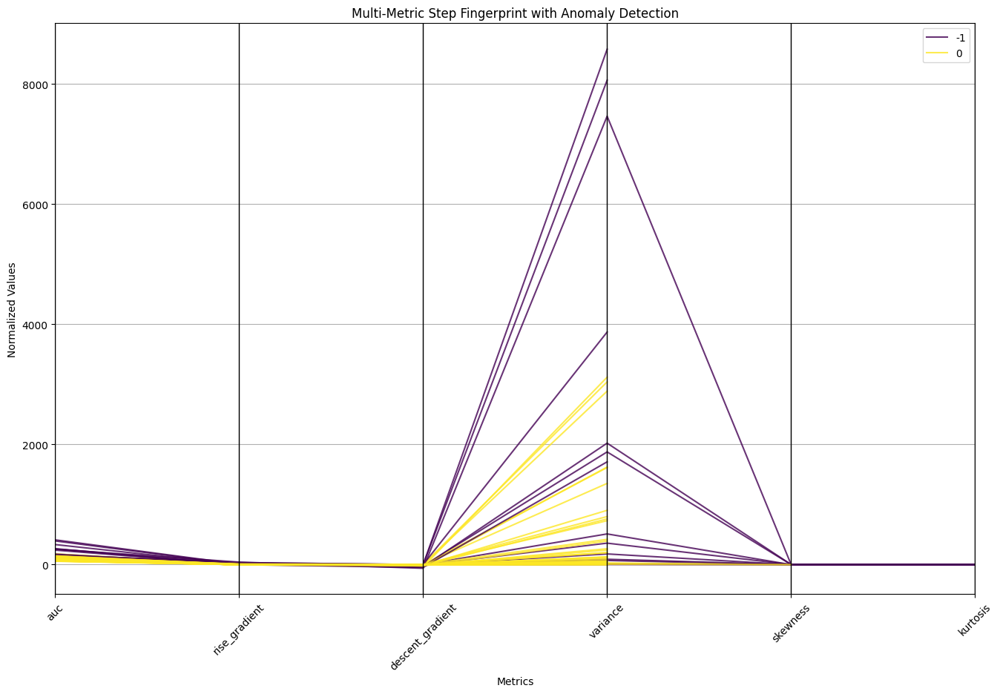

Number of Clusters Detected: 1
Number of Outlier Steps: 14


In [221]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import seaborn as sns
from pandas.plotting import parallel_coordinates

# Load stepwise baseline data
baseline_path = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv'
baseline_data = pd.read_csv(baseline_path)

# Extract relevant metrics
metrics_to_use = ['auc', 'rise_gradient', 'descent_gradient', 'variance', 'skewness', 'kurtosis']
data = baseline_data[metrics_to_use].fillna(0)  # Fill NaN values with 0 for analysis

# Normalize the data
scaler = StandardScaler()
normalized_data = scaler.fit_transform(data)

# Perform clustering to detect anomalies (DBSCAN for density-based clustering)
clustering = DBSCAN(eps=1.5, min_samples=5).fit(normalized_data)
labels = clustering.labels_

# Add clustering labels to the data for visualization
baseline_data['Cluster'] = labels

# Create parallel coordinates plot to visualize multi-metric fingerprint
plt.figure(figsize=(16, 10))
parallel_coordinates(baseline_data[['Cluster'] + metrics_to_use], class_column='Cluster', colormap='viridis', alpha=0.8)
plt.title('Multi-Metric Step Fingerprint with Anomaly Detection')
plt.xlabel('Metrics')
plt.ylabel('Normalized Values')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Print summary statistics of clusters
num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
outliers = list(labels).count(-1)
print(f"Number of Clusters Detected: {num_clusters}")
print(f"Number of Outlier Steps: {outliers}")


# Overall Comparision of Metarsal Region 1 vs Region 4

In [222]:
import pandas as pd
import matplotlib.pyplot as plt

def compare_stepwise_baselines(baseline_path1, baseline_path2):
    """ Compare stepwise baselines for pData and pData_4 and visualize differences """
    
    # Load baselines
    baseline1 = pd.read_csv(baseline_path1)
    baseline2 = pd.read_csv(baseline_path2)
    
    # Correct column name based on your CSV
    step_column = "step_number"  # Change to match CSV format
    metrics = baseline1.columns[1:]  # Exclude step numbers
    
    if step_column not in baseline1.columns or step_column not in baseline2.columns:
        print(f"Error: '{step_column}' column not found.")
        return

    # Ensure both dataframes have the same steps
    if len(baseline1) != len(baseline2):
        max_steps = max(len(baseline1), len(baseline2))
        baseline1 = baseline1.reindex(range(max_steps)).fillna(0)
        baseline2 = baseline2.reindex(range(max_steps)).fillna(0)
    
    plt.figure(figsize=(12, 10))
    for i, metric in enumerate(metrics):
        plt.subplot(len(metrics), 1, i + 1)
        
        # Plot baseline values for pData and pData_4
        plt.plot(baseline1[step_column], baseline1[metric], label=f'pData ({metric})', color='blue')
        plt.plot(baseline2[step_column], baseline2[metric], label=f'pData_4 ({metric})', color='orange')
        
        # Calculate and highlight differences
        differences = abs(baseline1[metric] - baseline2[metric])
        plt.fill_between(baseline1[step_column], differences, alpha=0.3, label='Difference', color='red')
        
        plt.title(f'Stepwise Comparison of {metric}')
        plt.xlabel('Step Number')
        plt.ylabel(metric)
        plt.legend()

    plt.tight_layout()
    plt.show()



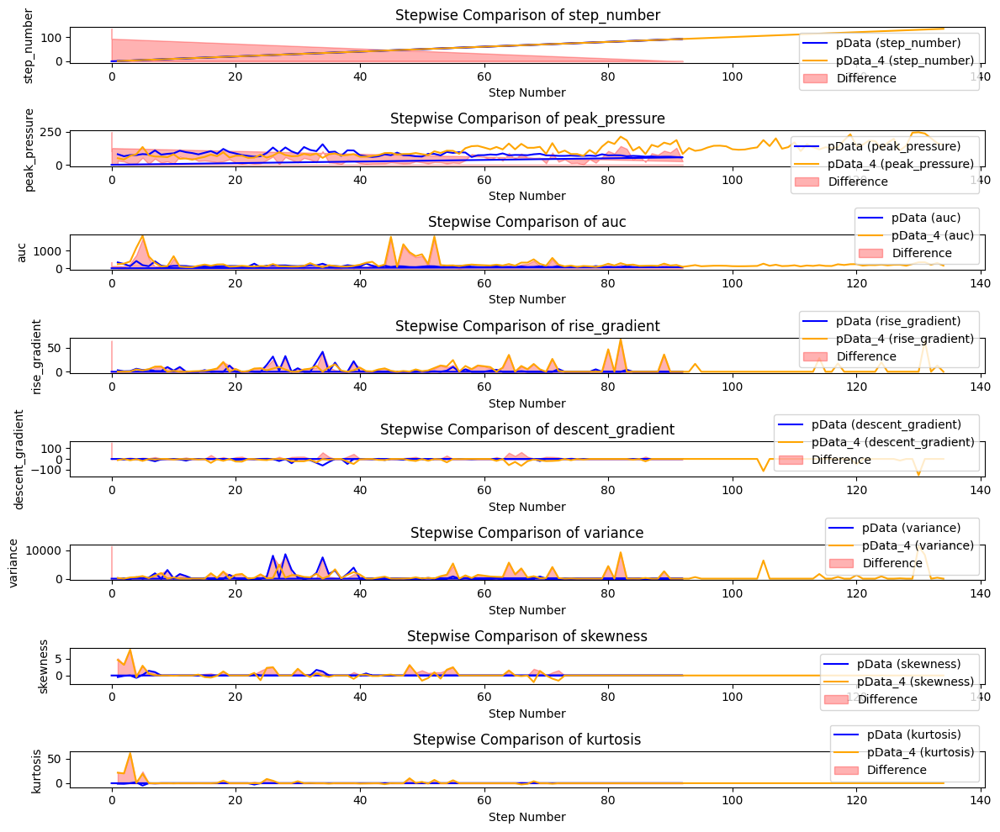

In [223]:
# Example usage
baseline_path1 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_stepwise_baseline.csv'
baseline_path2 = r'D:\Study\Gait\Step_Segmentation_Metrics\Baselines\pData_4_stepwise_baseline.csv'
compare_stepwise_baselines(baseline_path1, baseline_path2)

## DTW